In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from kaggle_titanic_helpers import *
from sklearn.preprocessing import MinMaxScaler

In [2]:
# Reading in data

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
train.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported
0,0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False
1,0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True
2,0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False
3,0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,False
4,0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,Willy Santantines,True


In [3]:
# Getting spend cols
spend_cols = ['RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck']

In [4]:
# Checking Null Values
train.isna().sum()

PassengerId       0
HomePlanet      201
CryoSleep       217
Cabin           199
Destination     182
Age             179
VIP             203
RoomService     181
FoodCourt       183
ShoppingMall    208
Spa             183
VRDeck          188
Name            200
Transported       0
dtype: int64

In [5]:
train_df = basic_prep(train,spend_cols)
test_df = basic_prep(test,spend_cols)

In [6]:
# Fixing CryoSleep
train_df = fill_cryosleep(train_df)
test_df = fill_cryosleep(test_df)

217 Initially
98 After Step 1: Spending Money = No CryoSleep
61 After Step 2: 1 Passenger / Zero Spend = CryoSleep
43 After Step 3: Total Group Spend Zero = CryoSleep
0 After Step 4: Total Group Spend > Zero = No CryoSleep
93 Initially
38 After Step 1: Spending Money = No CryoSleep
23 After Step 2: 1 Passenger / Zero Spend = CryoSleep
16 After Step 3: Total Group Spend Zero = CryoSleep
0 After Step 4: Total Group Spend > Zero = No CryoSleep


In [7]:
# Filling HomePlanet
train_df = fill_homeplanet(train_df,'N')
test_df = fill_homeplanet(test_df,'N')

201 Initially
111 after filling passenger groups
104 after filling Europa decks
63 after filling Earth decks
63 after filling the rest with Earth
87 Initially
46 after filling passenger groups
40 after filling Europa decks
31 after filling Earth decks
31 after filling the rest with Earth


In [301]:
float_cols = list(train.dtypes[train.dtypes==float].index)
object_cols = list(train.dtypes[train.dtypes==object].index)

drop_cols = ['Name', 'PassengerId', 'Cabin']
# change_cols = ['VIP', 'CryoSleep']
for i in drop_cols:
    object_cols.remove(i)

In [302]:
# Checking Null Values...again
train_df.isna().sum()

PassengerId          0
HomePlanet           0
CryoSleep            0
Cabin              199
Destination          0
Age                  0
VIP                  0
RoomService          0
FoodCourt            0
ShoppingMall         0
Spa                  0
VRDeck               0
Name               200
Transported          0
deck                 0
number               0
side                 0
passenger_group      0
num_group            0
total_spend          0
total_spend_max      0
num_group_max        0
surname            200
dtype: int64

In [303]:
# Filling the rest of the values with basic fill
train_df = fill_missing_basic(train_df, float_cols, object_cols, spend_cols)
test_df = fill_missing_basic(test_df, float_cols, object_cols, spend_cols)

In [304]:
train_df.isnull().sum()

PassengerId          0
HomePlanet           0
CryoSleep            0
Cabin              199
Destination          0
Age                  0
VIP                  0
RoomService          0
FoodCourt            0
ShoppingMall         0
Spa                  0
VRDeck               0
Name               200
Transported          0
deck                 0
number               0
side                 0
passenger_group      0
num_group            0
total_spend          0
total_spend_max      0
num_group_max        0
surname            200
dtype: int64

## Using Catboost Algo

In [43]:
from catboost import CatBoostClassifier, Pool
from catboost.utils import get_roc_curve

In [326]:
model = CatBoostClassifier(verbose=False)

In [322]:
object_cols.remove('num_group')
object_cols.remove('number')
object_cols

['HomePlanet',
 'CryoSleep',
 'Destination',
 'VIP',
 'deck',
 'side',
 'passenger_group']

In [323]:
# Creating Train/Test splits

#Split in 75% train and 25% test set
X_train, X_val, y_train, y_val = train_test_split(train_df[object_cols+spend_cols],\
                                         train_df.Transported,test_size = 0.25, random_state= 1984)


In [324]:
# Creating pool dataset to pass into catboost model
catboost_pool_train = Pool(X_train, y_train ,cat_features=object_cols)

In [327]:
# Removing unimportant features
model.select_features(
    catboost_pool_train
    ,features_for_select=list(X_train.columns)
    ,steps=4
    ,num_features_to_select=8
    ,algorithm='RecursiveByShapValues'
    ,shap_calc_type='Exact')

Learning rate set to 0.02294
Step #1 out of 4
Feature #3 eliminated
Step #2 out of 4
Feature #2 eliminated
Step #3 out of 4
Feature #5 eliminated
Step #4 out of 4
Feature #9 eliminated
Train final model


{'selected_features': [0, 1, 4, 6, 7, 8, 10, 11],
 'eliminated_features_names': ['VIP', 'Destination', 'side', 'ShoppingMall'],
 'loss_graph': {'main_indices': [0, 1, 2, 3, 4],
  'removed_features_count': [0, 1, 2, 3, 4],
  'loss_values': [0.3528437160020684,
   0.34685008138608636,
   0.352785782837507,
   0.3474153331166795,
   0.35645745360666603]},
 'eliminated_features': [3, 2, 5, 9],
 'selected_features_names': ['HomePlanet',
  'CryoSleep',
  'deck',
  'passenger_group',
  'RoomService',
  'FoodCourt',
  'Spa',
  'VRDeck']}

## Model Validation

In [390]:
reduced_features = ['HomePlanet',
  'CryoSleep',
  'deck',
  'passenger_group',
  'RoomService',
  'FoodCourt',
  'Spa',
  'VRDeck']

reduced_cat_features = ['HomePlanet',
  'CryoSleep',
  'deck',
  'passenger_group']

reduced_num_features = ['RoomService',
  'FoodCourt',
  'Spa',
  'VRDeck']

In [329]:
# Creating pool dataset to pass into catboost model
catboost_pool_val = Pool(X_val[reduced_features], y_val ,cat_features=reduced_cat_features)

In [330]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

pred2 = model.predict(catboost_pool_val)

# print accuracy
print("Accuracy: ", accuracy_score(y_val, pred2))

# print precision, recall, F1-score per each class/tag
print(classification_report(y_val, pred2))

# print confusion matrix, check documentation for sorting rows/columns
print(confusion_matrix(y_val, pred2))

Accuracy:  0.7916283348666053
              precision    recall  f1-score   support

           0       0.81      0.77      0.79      1090
           1       0.78      0.82      0.80      1084

    accuracy                           0.79      2174
   macro avg       0.79      0.79      0.79      2174
weighted avg       0.79      0.79      0.79      2174

[[834 256]
 [197 887]]


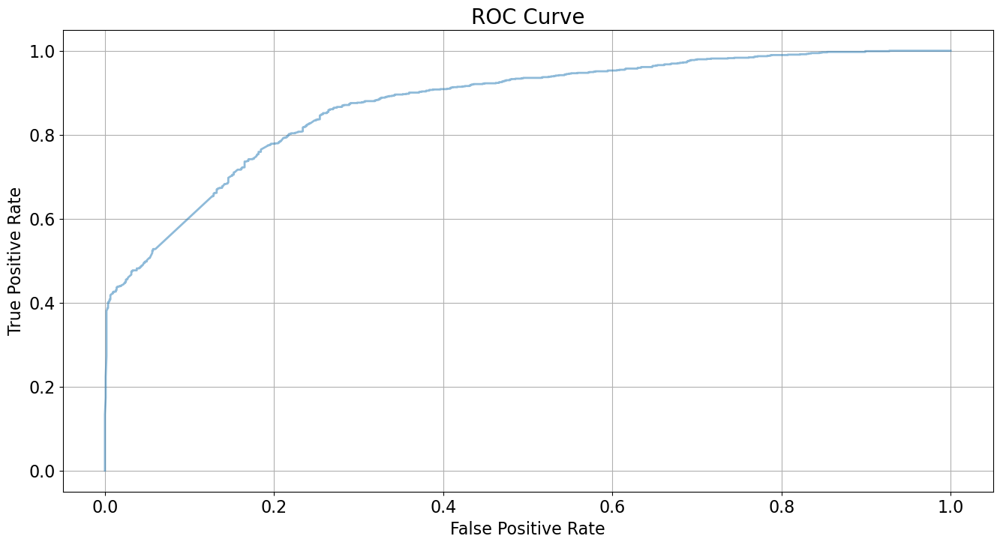

(array([0.        , 0.        , 0.        , ..., 0.99816514, 0.99908257,
        1.        ]),
 array([0.00000000e+00, 9.22509225e-04, 1.84501845e-03, ...,
        1.00000000e+00, 1.00000000e+00, 1.00000000e+00]),
 array([1.00000000e+00, 9.98797693e-01, 9.98280781e-01, ...,
        5.79194531e-04, 3.78919300e-04, 0.00000000e+00]))

In [331]:
from catboost.utils import get_roc_curve

get_roc_curve(model, 
              catboost_pool_val,
              thread_count=-1,
              plot=True)

In [332]:
# Re-training with all data
model = CatBoostClassifier(verbose=False)

In [333]:
catboost_pool_all = Pool(train_df[object_cols+spend_cols], train_df.Transported ,cat_features=object_cols)

In [334]:
# Feature reductions yields same results
model.select_features(
    catboost_pool_all
    ,features_for_select=list(train_df[object_cols+spend_cols].columns)
    ,steps=4
    ,num_features_to_select=8
    ,algorithm='RecursiveByShapValues'
    ,shap_calc_type='Exact')

Learning rate set to 0.025939
Step #1 out of 4
Feature #3 eliminated
Step #2 out of 4
Feature #2 eliminated
Step #3 out of 4
Feature #5 eliminated
Step #4 out of 4
Feature #9 eliminated
Train final model


{'selected_features': [0, 1, 4, 6, 7, 8, 10, 11],
 'eliminated_features_names': ['VIP', 'Destination', 'side', 'ShoppingMall'],
 'loss_graph': {'main_indices': [0, 1, 2, 3, 4],
  'removed_features_count': [0, 1, 2, 3, 4],
  'loss_values': [0.3291354786067554,
   0.3335355807044675,
   0.33897787408765534,
   0.35405240575877706,
   0.3602169719887717]},
 'eliminated_features': [3, 2, 5, 9],
 'selected_features_names': ['HomePlanet',
  'CryoSleep',
  'deck',
  'passenger_group',
  'RoomService',
  'FoodCourt',
  'Spa',
  'VRDeck']}

In [344]:
catboost_pool_all_red = Pool(train_df[reduced_features], train_df.Transported ,cat_features=reduced_cat_features)

In [345]:
model = CatBoostClassifier(verbose=False)

model.fit(catboost_pool_all_red)

In [335]:
catboost_pool_test = Pool(test_df[reduced_features]
    ,cat_features=reduced_cat_features)

In [346]:
preds_class = model.predict(catboost_pool_test)

In [347]:
pd.merge(test_df['PassengerId'],pd.DataFrame(pd.Series(preds_class).replace({1:True,0:False}).values
            ,columns=['Transported']),left_index=True,right_index=True)\
            .to_csv('catboost_submission.csv',index=False)

In [348]:
# catboost_submission.csv
# Complete · Tyler Drumheller · 15s ago
# 0.78559

## GridSearch

In [349]:
catboost_pool_train_red = Pool(X_train[reduced_features],y_train,cat_features=reduced_cat_features)

In [350]:
parameters = {'iterations':(25,50,100),
              'depth':[5,10,20],
              'learning_rate':[.25,.1,.5],
              'l2_leaf_reg': [3,5,10,20]}
algo = CatBoostClassifier()

model_gs = GridSearchCV(algo,parameters,verbose=True,n_jobs=-1)

model_gs.fit(X=X_train[reduced_features],
             y=y_train
        ,cat_features=reduced_cat_features)

Fitting 5 folds for each of 108 candidates, totalling 540 fits
0:	learn: 0.6226320	total: 55.6ms	remaining: 1.33s
1:	learn: 0.5765344	total: 57.4ms	remaining: 660ms
2:	learn: 0.5417511	total: 59ms	remaining: 432ms
3:	learn: 0.5209340	total: 60.7ms	remaining: 319ms
4:	learn: 0.5020161	total: 62.5ms	remaining: 250ms
5:	learn: 0.4858860	total: 64.2ms	remaining: 203ms
6:	learn: 0.4762592	total: 65.8ms	remaining: 169ms
7:	learn: 0.4688380	total: 67.3ms	remaining: 143ms
8:	learn: 0.4629687	total: 68.9ms	remaining: 122ms
9:	learn: 0.4554432	total: 70.5ms	remaining: 106ms
10:	learn: 0.4516095	total: 71.9ms	remaining: 91.5ms
11:	learn: 0.4474790	total: 73.9ms	remaining: 80.1ms
12:	learn: 0.4428283	total: 75.7ms	remaining: 69.9ms
13:	learn: 0.4407930	total: 77.5ms	remaining: 60.9ms
14:	learn: 0.4385215	total: 79.7ms	remaining: 53.1ms
15:	learn: 0.4358025	total: 81.5ms	remaining: 45.9ms
16:	learn: 0.4341392	total: 83.3ms	remaining: 39.2ms
17:	learn: 0.4326479	total: 85ms	remaining: 33.1ms
18:	lea

78:	learn: 0.4028165	total: 161ms	remaining: 42.9ms
79:	learn: 0.4028065	total: 163ms	remaining: 40.8ms
80:	learn: 0.4025744	total: 165ms	remaining: 38.8ms
81:	learn: 0.4020100	total: 167ms	remaining: 36.7ms
82:	learn: 0.4019495	total: 169ms	remaining: 34.6ms
83:	learn: 0.4017585	total: 172ms	remaining: 32.9ms
84:	learn: 0.4006637	total: 174ms	remaining: 30.8ms
85:	learn: 0.4004663	total: 177ms	remaining: 28.8ms
86:	learn: 0.4000049	total: 179ms	remaining: 26.7ms
87:	learn: 0.3999803	total: 182ms	remaining: 24.8ms
88:	learn: 0.3999745	total: 184ms	remaining: 22.7ms
89:	learn: 0.3994464	total: 187ms	remaining: 20.8ms
90:	learn: 0.3993546	total: 189ms	remaining: 18.6ms
91:	learn: 0.3993459	total: 190ms	remaining: 16.5ms
92:	learn: 0.3993010	total: 193ms	remaining: 14.5ms
93:	learn: 0.3992909	total: 195ms	remaining: 12.4ms
94:	learn: 0.3992894	total: 197ms	remaining: 10.4ms
95:	learn: 0.3992880	total: 199ms	remaining: 8.28ms
96:	learn: 0.3992847	total: 201ms	remaining: 6.21ms
97:	learn: 0

78:	learn: 0.3997636	total: 161ms	remaining: 42.9ms
79:	learn: 0.3997064	total: 163ms	remaining: 40.8ms
80:	learn: 0.3996197	total: 165ms	remaining: 38.7ms
81:	learn: 0.3988194	total: 167ms	remaining: 36.7ms
82:	learn: 0.3984549	total: 169ms	remaining: 34.6ms
83:	learn: 0.3983753	total: 171ms	remaining: 32.6ms
84:	learn: 0.3981678	total: 173ms	remaining: 30.6ms
85:	learn: 0.3973995	total: 175ms	remaining: 28.5ms
86:	learn: 0.3967202	total: 177ms	remaining: 26.4ms
87:	learn: 0.3966883	total: 178ms	remaining: 24.2ms
88:	learn: 0.3965523	total: 179ms	remaining: 22.2ms
89:	learn: 0.3963409	total: 181ms	remaining: 20.1ms
90:	learn: 0.3963267	total: 184ms	remaining: 18.2ms
91:	learn: 0.3961759	total: 185ms	remaining: 16.1ms
92:	learn: 0.3955414	total: 188ms	remaining: 14.2ms
93:	learn: 0.3950069	total: 190ms	remaining: 12.1ms
94:	learn: 0.3948033	total: 192ms	remaining: 10.1ms
95:	learn: 0.3943426	total: 195ms	remaining: 8.11ms
96:	learn: 0.3942796	total: 196ms	remaining: 6.07ms
97:	learn: 0

77:	learn: 0.4072522	total: 159ms	remaining: 44.8ms
78:	learn: 0.4069637	total: 161ms	remaining: 42.8ms
79:	learn: 0.4066207	total: 163ms	remaining: 40.8ms
80:	learn: 0.4063302	total: 165ms	remaining: 38.7ms
81:	learn: 0.4062927	total: 167ms	remaining: 36.8ms
82:	learn: 0.4060786	total: 169ms	remaining: 34.7ms
83:	learn: 0.4060155	total: 171ms	remaining: 32.7ms
84:	learn: 0.4055956	total: 173ms	remaining: 30.6ms
85:	learn: 0.4054024	total: 175ms	remaining: 28.5ms
86:	learn: 0.4051607	total: 177ms	remaining: 26.4ms
87:	learn: 0.4051496	total: 179ms	remaining: 24.4ms
88:	learn: 0.4051325	total: 181ms	remaining: 22.3ms
89:	learn: 0.4050626	total: 183ms	remaining: 20.3ms
90:	learn: 0.4048598	total: 184ms	remaining: 18.2ms
91:	learn: 0.4044927	total: 186ms	remaining: 16.2ms
92:	learn: 0.4044299	total: 189ms	remaining: 14.2ms
93:	learn: 0.4044078	total: 190ms	remaining: 12.1ms
94:	learn: 0.4042906	total: 192ms	remaining: 10.1ms
95:	learn: 0.4042780	total: 196ms	remaining: 8.15ms
96:	learn: 0

42:	learn: 0.4117057	total: 87.1ms	remaining: 115ms
43:	learn: 0.4117041	total: 88.9ms	remaining: 113ms
44:	learn: 0.4114050	total: 90.6ms	remaining: 111ms
45:	learn: 0.4113895	total: 92.4ms	remaining: 108ms
46:	learn: 0.4113874	total: 94.2ms	remaining: 106ms
47:	learn: 0.4110310	total: 96.9ms	remaining: 105ms
48:	learn: 0.4110201	total: 98.7ms	remaining: 103ms
49:	learn: 0.4110132	total: 100ms	remaining: 100ms
50:	learn: 0.4105385	total: 102ms	remaining: 98.3ms
51:	learn: 0.4105363	total: 104ms	remaining: 96.1ms
52:	learn: 0.4105082	total: 106ms	remaining: 93.8ms
53:	learn: 0.4104936	total: 109ms	remaining: 92.5ms
54:	learn: 0.4104812	total: 110ms	remaining: 90.3ms
55:	learn: 0.4104800	total: 112ms	remaining: 88.1ms
56:	learn: 0.4104725	total: 114ms	remaining: 86.2ms
57:	learn: 0.4099733	total: 116ms	remaining: 84.1ms
58:	learn: 0.4099715	total: 121ms	remaining: 84ms
59:	learn: 0.4088007	total: 123ms	remaining: 81.8ms
60:	learn: 0.4087936	total: 124ms	remaining: 79.5ms
61:	learn: 0.40

42:	learn: 0.4151460	total: 96.2ms	remaining: 128ms
43:	learn: 0.4150899	total: 98.1ms	remaining: 125ms
44:	learn: 0.4150443	total: 100ms	remaining: 122ms
45:	learn: 0.4148409	total: 102ms	remaining: 120ms
46:	learn: 0.4148010	total: 106ms	remaining: 120ms
47:	learn: 0.4138928	total: 108ms	remaining: 117ms
48:	learn: 0.4137116	total: 110ms	remaining: 114ms
49:	learn: 0.4135532	total: 112ms	remaining: 112ms
50:	learn: 0.4135202	total: 114ms	remaining: 109ms
51:	learn: 0.4133917	total: 116ms	remaining: 107ms
52:	learn: 0.4133645	total: 118ms	remaining: 105ms
53:	learn: 0.4133132	total: 120ms	remaining: 102ms
54:	learn: 0.4131660	total: 122ms	remaining: 99.6ms
55:	learn: 0.4113865	total: 124ms	remaining: 97.3ms
56:	learn: 0.4101677	total: 125ms	remaining: 94.5ms
57:	learn: 0.4099037	total: 128ms	remaining: 92.7ms
58:	learn: 0.4096375	total: 130ms	remaining: 90.4ms
59:	learn: 0.4096070	total: 132ms	remaining: 88ms
60:	learn: 0.4095524	total: 134ms	remaining: 85.6ms
61:	learn: 0.4087810	tot

43:	learn: 0.4505837	total: 86.6ms	remaining: 110ms
44:	learn: 0.4497476	total: 88.4ms	remaining: 108ms
45:	learn: 0.4490627	total: 90.3ms	remaining: 106ms
46:	learn: 0.4484775	total: 92.5ms	remaining: 104ms
47:	learn: 0.4478616	total: 94.1ms	remaining: 102ms
48:	learn: 0.4471823	total: 95.5ms	remaining: 99.4ms
49:	learn: 0.4464668	total: 97.3ms	remaining: 97.3ms
50:	learn: 0.4459868	total: 99.1ms	remaining: 95.2ms
51:	learn: 0.4457635	total: 100ms	remaining: 92.6ms
52:	learn: 0.4441760	total: 103ms	remaining: 91.1ms
53:	learn: 0.4431202	total: 104ms	remaining: 89ms
54:	learn: 0.4426631	total: 106ms	remaining: 87ms
55:	learn: 0.4422392	total: 109ms	remaining: 85.6ms
56:	learn: 0.4416384	total: 111ms	remaining: 83.6ms
57:	learn: 0.4411780	total: 114ms	remaining: 82.2ms
58:	learn: 0.4410060	total: 114ms	remaining: 79.6ms
59:	learn: 0.4406988	total: 116ms	remaining: 77.5ms
60:	learn: 0.4402405	total: 118ms	remaining: 75.4ms
61:	learn: 0.4390850	total: 120ms	remaining: 73.4ms
62:	learn: 0.

39:	learn: 0.4171304	total: 85.7ms	remaining: 129ms
40:	learn: 0.4171199	total: 87.5ms	remaining: 126ms
41:	learn: 0.4166618	total: 89.3ms	remaining: 123ms
42:	learn: 0.4166491	total: 90.9ms	remaining: 121ms
43:	learn: 0.4159576	total: 92.7ms	remaining: 118ms
44:	learn: 0.4159410	total: 94.4ms	remaining: 115ms
45:	learn: 0.4159267	total: 97.1ms	remaining: 114ms
46:	learn: 0.4137890	total: 99.3ms	remaining: 112ms
47:	learn: 0.4134498	total: 101ms	remaining: 109ms
48:	learn: 0.4134249	total: 103ms	remaining: 107ms
49:	learn: 0.4134084	total: 105ms	remaining: 105ms
50:	learn: 0.4134012	total: 107ms	remaining: 103ms
51:	learn: 0.4125467	total: 108ms	remaining: 100ms
52:	learn: 0.4125350	total: 110ms	remaining: 97.6ms
53:	learn: 0.4124914	total: 112ms	remaining: 95.3ms
54:	learn: 0.4124793	total: 114ms	remaining: 93ms
55:	learn: 0.4124678	total: 115ms	remaining: 90.6ms
56:	learn: 0.4124277	total: 117ms	remaining: 88.3ms
57:	learn: 0.4124164	total: 120ms	remaining: 87.1ms
58:	learn: 0.412409

20:	learn: 0.4180763	total: 244ms	remaining: 338ms
21:	learn: 0.4169707	total: 263ms	remaining: 335ms
22:	learn: 0.4162175	total: 280ms	remaining: 328ms
23:	learn: 0.4145175	total: 298ms	remaining: 323ms
24:	learn: 0.4127939	total: 316ms	remaining: 316ms
25:	learn: 0.4120149	total: 333ms	remaining: 308ms
26:	learn: 0.4110652	total: 348ms	remaining: 297ms
27:	learn: 0.4090213	total: 365ms	remaining: 287ms
28:	learn: 0.4079523	total: 380ms	remaining: 275ms
29:	learn: 0.4073292	total: 396ms	remaining: 264ms
30:	learn: 0.4068203	total: 413ms	remaining: 253ms
31:	learn: 0.4057063	total: 427ms	remaining: 240ms
32:	learn: 0.4051762	total: 445ms	remaining: 229ms
33:	learn: 0.4041944	total: 457ms	remaining: 215ms
34:	learn: 0.4035376	total: 470ms	remaining: 202ms
35:	learn: 0.4022318	total: 488ms	remaining: 190ms
36:	learn: 0.4014596	total: 503ms	remaining: 177ms
37:	learn: 0.4006686	total: 518ms	remaining: 164ms
38:	learn: 0.3997210	total: 533ms	remaining: 150ms
39:	learn: 0.3986505	total: 549

20:	learn: 0.4102987	total: 296ms	remaining: 1.11s
21:	learn: 0.4090565	total: 313ms	remaining: 1.11s
22:	learn: 0.4081908	total: 316ms	remaining: 1.06s
23:	learn: 0.4071862	total: 332ms	remaining: 1.05s
24:	learn: 0.4061403	total: 361ms	remaining: 1.08s
25:	learn: 0.4039827	total: 380ms	remaining: 1.08s
26:	learn: 0.4030289	total: 398ms	remaining: 1.07s
27:	learn: 0.4019248	total: 429ms	remaining: 1.1s
28:	learn: 0.4014826	total: 431ms	remaining: 1.05s
29:	learn: 0.4006537	total: 446ms	remaining: 1.04s
30:	learn: 0.3986382	total: 459ms	remaining: 1.02s
31:	learn: 0.3983406	total: 460ms	remaining: 978ms
32:	learn: 0.3975817	total: 476ms	remaining: 966ms
33:	learn: 0.3966175	total: 490ms	remaining: 951ms
34:	learn: 0.3952528	total: 510ms	remaining: 947ms
35:	learn: 0.3948118	total: 526ms	remaining: 935ms
36:	learn: 0.3941254	total: 550ms	remaining: 937ms
37:	learn: 0.3927149	total: 567ms	remaining: 925ms
38:	learn: 0.3913455	total: 588ms	remaining: 920ms
39:	learn: 0.3898777	total: 603m

/Users/tylerdrumheller/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
180 fits failed out of a total of 540.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
180 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/tylerdrumheller/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/tylerdrumheller/anaconda3/lib/python3.10/site-packages/catboost/core.py", line 5128, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline, use_best_model,
  File "/Users/tylerdr

0:	learn: 0.6236454	total: 2ms	remaining: 198ms
1:	learn: 0.5797502	total: 3.82ms	remaining: 187ms
2:	learn: 0.5511530	total: 5.33ms	remaining: 172ms
3:	learn: 0.5276986	total: 6.63ms	remaining: 159ms
4:	learn: 0.5105505	total: 7.86ms	remaining: 149ms
5:	learn: 0.4987404	total: 9.14ms	remaining: 143ms
6:	learn: 0.4875993	total: 10.3ms	remaining: 137ms
7:	learn: 0.4763040	total: 11.6ms	remaining: 133ms
8:	learn: 0.4684284	total: 12.8ms	remaining: 129ms
9:	learn: 0.4631723	total: 14ms	remaining: 126ms
10:	learn: 0.4589611	total: 15.1ms	remaining: 122ms
11:	learn: 0.4560021	total: 16.3ms	remaining: 120ms
12:	learn: 0.4522830	total: 17.5ms	remaining: 117ms
13:	learn: 0.4499455	total: 18.6ms	remaining: 114ms
14:	learn: 0.4475168	total: 19.8ms	remaining: 112ms
15:	learn: 0.4451974	total: 21.1ms	remaining: 111ms
16:	learn: 0.4431503	total: 22.3ms	remaining: 109ms
17:	learn: 0.4420959	total: 23.3ms	remaining: 106ms
18:	learn: 0.4399561	total: 24.6ms	remaining: 105ms
19:	learn: 0.4395262	total:

GridSearchCV(estimator=<catboost.core.CatBoostClassifier object at 0x7f8be9d9b820>,
             n_jobs=-1,
             param_grid={'depth': [5, 10, 20], 'iterations': (25, 50, 100),
                         'l2_leaf_reg': [3, 5, 10, 20],
                         'learning_rate': [0.25, 0.1, 0.5]},
             verbose=True)

In [351]:
model_gs.best_params_

{'depth': 5, 'iterations': 100, 'l2_leaf_reg': 10, 'learning_rate': 0.25}

In [352]:
pred2 = model_gs.predict(catboost_pool_val)

# print accuracy
print("Accuracy: ", accuracy_score(y_val, pred2))

# print precision, recall, F1-score per each class/tag
print(classification_report(y_val, pred2))

# print confusion matrix, check documentation for sorting rows/columns
print(confusion_matrix(y_val, pred2))

Accuracy:  0.7920883164673413
              precision    recall  f1-score   support

           0       0.82      0.75      0.78      1090
           1       0.77      0.83      0.80      1084

    accuracy                           0.79      2174
   macro avg       0.79      0.79      0.79      2174
weighted avg       0.79      0.79      0.79      2174

[[822 268]
 [184 900]]


In [353]:
# Re-training algo with all data
algo = CatBoostClassifier(iterations=100,depth=5,l2_leaf_reg=10,learning_rate=.25)

algo.fit(catboost_pool_all_red)

0:	learn: 0.6235500	total: 2.43ms	remaining: 241ms
1:	learn: 0.5815679	total: 4.66ms	remaining: 228ms
2:	learn: 0.5497179	total: 6.82ms	remaining: 220ms
3:	learn: 0.5275593	total: 8.52ms	remaining: 204ms
4:	learn: 0.5091676	total: 10.2ms	remaining: 194ms
5:	learn: 0.4960581	total: 11.9ms	remaining: 186ms
6:	learn: 0.4862254	total: 13.6ms	remaining: 181ms
7:	learn: 0.4787097	total: 15.6ms	remaining: 180ms
8:	learn: 0.4693203	total: 17.2ms	remaining: 174ms
9:	learn: 0.4635472	total: 19ms	remaining: 171ms
10:	learn: 0.4600231	total: 20.6ms	remaining: 166ms
11:	learn: 0.4560586	total: 22.3ms	remaining: 164ms
12:	learn: 0.4527572	total: 23.7ms	remaining: 159ms
13:	learn: 0.4508284	total: 25.3ms	remaining: 156ms
14:	learn: 0.4490194	total: 26.9ms	remaining: 153ms
15:	learn: 0.4452853	total: 28.7ms	remaining: 151ms
16:	learn: 0.4433547	total: 30.7ms	remaining: 150ms
17:	learn: 0.4411723	total: 33.2ms	remaining: 151ms
18:	learn: 0.4391851	total: 35.2ms	remaining: 150ms
19:	learn: 0.4378595	tot

In [354]:
preds_class = algo.predict(catboost_pool_test)

In [355]:
pd.merge(test_df['PassengerId'],pd.DataFrame(pd.Series(preds_class).replace({1:True,0:False}).values
            ,columns=['Transported']),left_index=True,right_index=True)\
            .to_csv('catboost_gs_submission.csv',index=False)

In [ ]:
# catboost_gs_submission.csv
# Complete · Tyler Drumheller · now
# 0.787

## Trying Catboost with Scaling

In [267]:
from sklearn.preprocessing import MinMaxScaler

In [371]:
reduced_features

['HomePlanet',
 'CryoSleep',
 'deck',
 'passenger_group',
 'RoomService',
 'FoodCourt',
 'Spa',
 'VRDeck']

In [408]:
def scale_num_data(df,numeric_variables,cat_reduced_features):
    
    # define min max scaler
    scaler = MinMaxScaler()
    
    num_df = pd.DataFrame(scaler.fit_transform(df[numeric_variables]),columns=numeric_variables)
    
    return pd.merge(df[cat_reduced_features],num_df,left_index=True,right_index=True,how='left'), num_df
    

In [362]:
scaled_train,num_df = scale_num_data(train_df,spend_cols,reduced_cat_features)

In [384]:
# Creating Train/Test splits

#Split in 75% train and 25% test set
X_train, X_val, y_train, y_val = train_test_split(scaled_train[reduced_features],\
                                         train_df.Transported,test_size = 0.25, random_state= 1984)


In [386]:
X_train

,HomePlanet,CryoSleep,deck,passenger_group,RoomService,FoodCourt,Spa,VRDeck
1715,Earth,False,F,1826,0.015683,0.007748,0.000089,0.000000
5494,Mars,True,F,5860,0.000000,0.000000,0.000000,0.000000
4763,Earth,False,F,5085,0.000000,0.000503,0.004240,0.000000
4014,Europa,False,C,4278,0.027989,0.124912,0.018833,0.002569
8274,Earth,True,G,8835,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...
7846,Europa,True,F,8374,0.000000,0.000000,0.000000,0.000000
5192,Mars,True,F,5538,0.000000,0.000000,0.000000,0.000000
1779,Mars,True,E,1891,0.000000,0.000000,0.000000,0.000000
5887,Mars,True,F,6238,0.000000,0.000000,0.000000,0.000000


In [366]:
parameters = {'iterations':(100,200,500),
              'depth':[2,5,10],
              'learning_rate':[.25,.1,.01,.001],
              'l2_leaf_reg': [3,5,10]}
algo = CatBoostClassifier()

model_gs = GridSearchCV(algo,parameters,verbose=True,n_jobs=-1)

model_gs.fit(X_train
        ,y_train
        ,cat_features=reduced_cat_features)

Fitting 5 folds for each of 108 candidates, totalling 540 fits
0:	learn: 0.6394032	total: 53ms	remaining: 5.25s
1:	learn: 0.6077890	total: 54.3ms	remaining: 2.66s
2:	learn: 0.5867401	total: 55.3ms	remaining: 1.79s
3:	learn: 0.5670210	total: 56.3ms	remaining: 1.35s
4:	learn: 0.5526132	total: 57.4ms	remaining: 1.09s
5:	learn: 0.5406321	total: 58.3ms	remaining: 914ms
6:	learn: 0.5300057	total: 59.6ms	remaining: 792ms
7:	learn: 0.5211438	total: 60.6ms	remaining: 697ms
8:	learn: 0.5143376	total: 62.2ms	remaining: 628ms
9:	learn: 0.5072029	total: 63.3ms	remaining: 570ms
10:	learn: 0.5021329	total: 64.4ms	remaining: 521ms
11:	learn: 0.4969877	total: 65.4ms	remaining: 480ms
12:	learn: 0.4930729	total: 66.7ms	remaining: 446ms
13:	learn: 0.4878478	total: 67.7ms	remaining: 416ms
14:	learn: 0.4839273	total: 68.7ms	remaining: 389ms
15:	learn: 0.4812772	total: 69.6ms	remaining: 366ms
16:	learn: 0.4776970	total: 70.6ms	remaining: 345ms
17:	learn: 0.4742368	total: 71.5ms	remaining: 326ms
18:	learn: 0.

55:	learn: 0.6087182	total: 71.8ms	remaining: 56.4ms
56:	learn: 0.6077517	total: 72.6ms	remaining: 54.8ms
57:	learn: 0.6066535	total: 73.6ms	remaining: 53.3ms
58:	learn: 0.6055713	total: 74.5ms	remaining: 51.8ms
59:	learn: 0.6046579	total: 75.8ms	remaining: 50.5ms
60:	learn: 0.6035805	total: 76.8ms	remaining: 49.1ms
61:	learn: 0.6027452	total: 77.9ms	remaining: 47.7ms
62:	learn: 0.6019439	total: 79ms	remaining: 46.4ms
63:	learn: 0.6008753	total: 80.1ms	remaining: 45.1ms
64:	learn: 0.6000177	total: 81.2ms	remaining: 43.7ms
65:	learn: 0.5991401	total: 82.4ms	remaining: 42.5ms
66:	learn: 0.5981479	total: 83.4ms	remaining: 41.1ms
67:	learn: 0.5972997	total: 84.4ms	remaining: 39.7ms
68:	learn: 0.5964854	total: 85.3ms	remaining: 38.3ms
69:	learn: 0.5956884	total: 86.2ms	remaining: 37ms
70:	learn: 0.5948925	total: 87.2ms	remaining: 35.6ms
71:	learn: 0.5939210	total: 88.1ms	remaining: 34.3ms
72:	learn: 0.5931236	total: 89.1ms	remaining: 32.9ms
73:	learn: 0.5924151	total: 90.1ms	remaining: 31.6

15:	learn: 0.4684438	total: 56.3ms	remaining: 647ms
16:	learn: 0.4657918	total: 59.3ms	remaining: 639ms
17:	learn: 0.4614850	total: 63.7ms	remaining: 644ms
18:	learn: 0.4577580	total: 67.7ms	remaining: 645ms
19:	learn: 0.4566862	total: 71.1ms	remaining: 640ms
20:	learn: 0.4558712	total: 74.2ms	remaining: 633ms
21:	learn: 0.4528901	total: 77.7ms	remaining: 629ms
22:	learn: 0.4513969	total: 81.5ms	remaining: 627ms
23:	learn: 0.4494642	total: 85ms	remaining: 624ms
24:	learn: 0.4482774	total: 88.1ms	remaining: 617ms
25:	learn: 0.4472734	total: 91.5ms	remaining: 612ms
26:	learn: 0.4459443	total: 94.5ms	remaining: 605ms
27:	learn: 0.4447852	total: 97.9ms	remaining: 602ms
28:	learn: 0.4429994	total: 102ms	remaining: 599ms
29:	learn: 0.4413789	total: 104ms	remaining: 590ms
30:	learn: 0.4408700	total: 108ms	remaining: 588ms
31:	learn: 0.4399121	total: 111ms	remaining: 585ms
32:	learn: 0.4390228	total: 114ms	remaining: 579ms
33:	learn: 0.4382358	total: 117ms	remaining: 572ms
34:	learn: 0.4369426

79:	learn: 0.4218087	total: 251ms	remaining: 377ms
80:	learn: 0.4217324	total: 254ms	remaining: 373ms
81:	learn: 0.4212803	total: 257ms	remaining: 370ms
82:	learn: 0.4210118	total: 260ms	remaining: 367ms
83:	learn: 0.4209901	total: 265ms	remaining: 365ms
84:	learn: 0.4207743	total: 268ms	remaining: 362ms
85:	learn: 0.4205314	total: 270ms	remaining: 358ms
86:	learn: 0.4205087	total: 273ms	remaining: 355ms
87:	learn: 0.4202204	total: 277ms	remaining: 352ms
88:	learn: 0.4198992	total: 280ms	remaining: 350ms
89:	learn: 0.4195203	total: 283ms	remaining: 346ms
90:	learn: 0.4192292	total: 287ms	remaining: 343ms
91:	learn: 0.4189832	total: 290ms	remaining: 341ms
92:	learn: 0.4188330	total: 293ms	remaining: 338ms
93:	learn: 0.4187832	total: 296ms	remaining: 334ms
94:	learn: 0.4187726	total: 299ms	remaining: 331ms
95:	learn: 0.4186337	total: 302ms	remaining: 327ms
96:	learn: 0.4184572	total: 305ms	remaining: 324ms
97:	learn: 0.4184233	total: 309ms	remaining: 322ms
98:	learn: 0.4181128	total: 312

39:	learn: 0.4661246	total: 127ms	remaining: 1.46s
40:	learn: 0.4646404	total: 130ms	remaining: 1.46s
41:	learn: 0.4638181	total: 134ms	remaining: 1.46s
42:	learn: 0.4626214	total: 136ms	remaining: 1.45s
43:	learn: 0.4614510	total: 139ms	remaining: 1.44s
44:	learn: 0.4605324	total: 143ms	remaining: 1.45s
45:	learn: 0.4598089	total: 146ms	remaining: 1.44s
46:	learn: 0.4587659	total: 149ms	remaining: 1.44s
47:	learn: 0.4578981	total: 152ms	remaining: 1.44s
48:	learn: 0.4571819	total: 155ms	remaining: 1.43s
49:	learn: 0.4567522	total: 158ms	remaining: 1.43s
50:	learn: 0.4564023	total: 162ms	remaining: 1.43s
51:	learn: 0.4555569	total: 165ms	remaining: 1.42s
52:	learn: 0.4545336	total: 168ms	remaining: 1.42s
53:	learn: 0.4536211	total: 170ms	remaining: 1.41s
54:	learn: 0.4526600	total: 174ms	remaining: 1.4s
55:	learn: 0.4518968	total: 177ms	remaining: 1.4s
56:	learn: 0.4512605	total: 180ms	remaining: 1.4s
57:	learn: 0.4508418	total: 183ms	remaining: 1.4s
58:	learn: 0.4504632	total: 186ms	r

43:	learn: 0.4363855	total: 138ms	remaining: 1.43s
44:	learn: 0.4352578	total: 141ms	remaining: 1.43s
45:	learn: 0.4347091	total: 145ms	remaining: 1.43s
46:	learn: 0.4337435	total: 149ms	remaining: 1.44s
47:	learn: 0.4331072	total: 153ms	remaining: 1.44s
48:	learn: 0.4326571	total: 156ms	remaining: 1.43s
49:	learn: 0.4323711	total: 158ms	remaining: 1.43s
50:	learn: 0.4315973	total: 161ms	remaining: 1.42s
51:	learn: 0.4310502	total: 164ms	remaining: 1.42s
52:	learn: 0.4308243	total: 168ms	remaining: 1.42s
53:	learn: 0.4305845	total: 172ms	remaining: 1.42s
54:	learn: 0.4300958	total: 175ms	remaining: 1.41s
55:	learn: 0.4298201	total: 177ms	remaining: 1.4s
56:	learn: 0.4284909	total: 179ms	remaining: 1.39s
57:	learn: 0.4283365	total: 182ms	remaining: 1.39s
58:	learn: 0.4278421	total: 185ms	remaining: 1.38s
59:	learn: 0.4257405	total: 188ms	remaining: 1.38s
60:	learn: 0.4253448	total: 192ms	remaining: 1.38s
61:	learn: 0.4242189	total: 195ms	remaining: 1.38s
62:	learn: 0.4241467	total: 198m

301:	learn: 0.6192103	total: 849ms	remaining: 557ms
302:	learn: 0.6190619	total: 852ms	remaining: 554ms
303:	learn: 0.6188868	total: 854ms	remaining: 551ms
304:	learn: 0.6186835	total: 857ms	remaining: 548ms
305:	learn: 0.6185070	total: 860ms	remaining: 545ms
306:	learn: 0.6183615	total: 862ms	remaining: 542ms
307:	learn: 0.6181811	total: 864ms	remaining: 539ms
308:	learn: 0.6180031	total: 867ms	remaining: 536ms
309:	learn: 0.6178580	total: 870ms	remaining: 533ms
310:	learn: 0.6177164	total: 872ms	remaining: 530ms
311:	learn: 0.6175400	total: 875ms	remaining: 527ms
312:	learn: 0.6173953	total: 877ms	remaining: 524ms
313:	learn: 0.6172447	total: 881ms	remaining: 522ms
314:	learn: 0.6171159	total: 883ms	remaining: 519ms
315:	learn: 0.6169497	total: 886ms	remaining: 516ms
316:	learn: 0.6168217	total: 888ms	remaining: 513ms
317:	learn: 0.6166460	total: 891ms	remaining: 510ms
318:	learn: 0.6165064	total: 894ms	remaining: 507ms
319:	learn: 0.6163603	total: 897ms	remaining: 504ms
320:	learn: 

304:	learn: 0.4869749	total: 966ms	remaining: 618ms
305:	learn: 0.4868156	total: 971ms	remaining: 616ms
306:	learn: 0.4866415	total: 973ms	remaining: 612ms
307:	learn: 0.4864414	total: 976ms	remaining: 609ms
308:	learn: 0.4862771	total: 980ms	remaining: 606ms
309:	learn: 0.4860914	total: 982ms	remaining: 602ms
310:	learn: 0.4859339	total: 985ms	remaining: 599ms
311:	learn: 0.4857963	total: 989ms	remaining: 596ms
312:	learn: 0.4855778	total: 992ms	remaining: 593ms
313:	learn: 0.4854325	total: 998ms	remaining: 591ms
314:	learn: 0.4852613	total: 1s	remaining: 588ms
315:	learn: 0.4850623	total: 1s	remaining: 585ms
316:	learn: 0.4848559	total: 1.01s	remaining: 582ms
317:	learn: 0.4846348	total: 1.01s	remaining: 579ms
318:	learn: 0.4844350	total: 1.01s	remaining: 576ms
319:	learn: 0.4842603	total: 1.02s	remaining: 572ms
320:	learn: 0.4840851	total: 1.02s	remaining: 570ms
321:	learn: 0.4839236	total: 1.02s	remaining: 566ms
322:	learn: 0.4837759	total: 1.03s	remaining: 563ms
323:	learn: 0.4835

61:	learn: 0.4280036	total: 209ms	remaining: 1.48s
62:	learn: 0.4274430	total: 213ms	remaining: 1.48s
63:	learn: 0.4268584	total: 216ms	remaining: 1.47s
64:	learn: 0.4262145	total: 220ms	remaining: 1.47s
65:	learn: 0.4260739	total: 224ms	remaining: 1.47s
66:	learn: 0.4260480	total: 227ms	remaining: 1.47s
67:	learn: 0.4260054	total: 230ms	remaining: 1.46s
68:	learn: 0.4259554	total: 235ms	remaining: 1.47s
69:	learn: 0.4255078	total: 237ms	remaining: 1.46s
70:	learn: 0.4253381	total: 240ms	remaining: 1.45s
71:	learn: 0.4252155	total: 243ms	remaining: 1.44s
72:	learn: 0.4250996	total: 246ms	remaining: 1.44s
73:	learn: 0.4244741	total: 250ms	remaining: 1.44s
74:	learn: 0.4241665	total: 253ms	remaining: 1.43s
75:	learn: 0.4239933	total: 256ms	remaining: 1.43s
76:	learn: 0.4238970	total: 259ms	remaining: 1.42s
77:	learn: 0.4238572	total: 261ms	remaining: 1.41s
78:	learn: 0.4238291	total: 265ms	remaining: 1.41s
79:	learn: 0.4236960	total: 267ms	remaining: 1.4s
80:	learn: 0.4236116	total: 269m

61:	learn: 0.4428382	total: 193ms	remaining: 1.36s
62:	learn: 0.4423764	total: 196ms	remaining: 1.36s
63:	learn: 0.4421481	total: 199ms	remaining: 1.35s
64:	learn: 0.4417540	total: 204ms	remaining: 1.36s
65:	learn: 0.4412058	total: 206ms	remaining: 1.36s
66:	learn: 0.4405177	total: 209ms	remaining: 1.35s
67:	learn: 0.4399466	total: 212ms	remaining: 1.35s
68:	learn: 0.4393551	total: 215ms	remaining: 1.34s
69:	learn: 0.4390627	total: 218ms	remaining: 1.34s
70:	learn: 0.4383885	total: 222ms	remaining: 1.34s
71:	learn: 0.4381704	total: 225ms	remaining: 1.34s
72:	learn: 0.4380806	total: 228ms	remaining: 1.33s
73:	learn: 0.4376757	total: 231ms	remaining: 1.33s
74:	learn: 0.4372607	total: 234ms	remaining: 1.32s
75:	learn: 0.4370995	total: 237ms	remaining: 1.32s
76:	learn: 0.4365321	total: 240ms	remaining: 1.32s
77:	learn: 0.4362424	total: 243ms	remaining: 1.32s
78:	learn: 0.4358678	total: 247ms	remaining: 1.31s
79:	learn: 0.4356523	total: 249ms	remaining: 1.31s
80:	learn: 0.4352860	total: 253

324:	learn: 0.4802876	total: 1.01s	remaining: 543ms
325:	learn: 0.4800991	total: 1.01s	remaining: 540ms
326:	learn: 0.4798944	total: 1.01s	remaining: 537ms
327:	learn: 0.4797156	total: 1.02s	remaining: 535ms
328:	learn: 0.4795698	total: 1.02s	remaining: 532ms
329:	learn: 0.4794125	total: 1.02s	remaining: 528ms
330:	learn: 0.4792864	total: 1.03s	remaining: 525ms
331:	learn: 0.4790925	total: 1.03s	remaining: 522ms
332:	learn: 0.4788705	total: 1.03s	remaining: 519ms
333:	learn: 0.4787149	total: 1.04s	remaining: 516ms
334:	learn: 0.4785657	total: 1.04s	remaining: 513ms
335:	learn: 0.4784206	total: 1.04s	remaining: 510ms
336:	learn: 0.4782925	total: 1.05s	remaining: 507ms
337:	learn: 0.4781583	total: 1.05s	remaining: 504ms
338:	learn: 0.4780114	total: 1.05s	remaining: 501ms
339:	learn: 0.4778573	total: 1.06s	remaining: 497ms
340:	learn: 0.4777211	total: 1.06s	remaining: 494ms
341:	learn: 0.4775393	total: 1.06s	remaining: 491ms
342:	learn: 0.4773772	total: 1.06s	remaining: 488ms
343:	learn: 

322:	learn: 0.4838057	total: 1.01s	remaining: 555ms
323:	learn: 0.4836325	total: 1.02s	remaining: 552ms
324:	learn: 0.4834674	total: 1.02s	remaining: 549ms
325:	learn: 0.4833192	total: 1.02s	remaining: 546ms
326:	learn: 0.4831442	total: 1.03s	remaining: 543ms
327:	learn: 0.4830445	total: 1.03s	remaining: 540ms
328:	learn: 0.4828807	total: 1.03s	remaining: 537ms
329:	learn: 0.4827059	total: 1.03s	remaining: 534ms
330:	learn: 0.4826285	total: 1.04s	remaining: 531ms
331:	learn: 0.4824866	total: 1.04s	remaining: 527ms
332:	learn: 0.4823477	total: 1.04s	remaining: 524ms
333:	learn: 0.4821249	total: 1.05s	remaining: 521ms
334:	learn: 0.4819821	total: 1.05s	remaining: 517ms
335:	learn: 0.4818435	total: 1.05s	remaining: 514ms
336:	learn: 0.4817221	total: 1.06s	remaining: 511ms
337:	learn: 0.4815649	total: 1.06s	remaining: 508ms
338:	learn: 0.4813926	total: 1.06s	remaining: 505ms
339:	learn: 0.4812134	total: 1.07s	remaining: 502ms
340:	learn: 0.4810309	total: 1.07s	remaining: 499ms
341:	learn: 

82:	learn: 0.4210118	total: 261ms	remaining: 1.31s
83:	learn: 0.4209901	total: 265ms	remaining: 1.31s
84:	learn: 0.4207743	total: 268ms	remaining: 1.31s
85:	learn: 0.4205314	total: 272ms	remaining: 1.31s
86:	learn: 0.4205087	total: 275ms	remaining: 1.3s
87:	learn: 0.4202204	total: 278ms	remaining: 1.3s
88:	learn: 0.4198992	total: 282ms	remaining: 1.3s
89:	learn: 0.4195203	total: 285ms	remaining: 1.3s
90:	learn: 0.4192292	total: 288ms	remaining: 1.29s
91:	learn: 0.4189832	total: 291ms	remaining: 1.29s
92:	learn: 0.4188330	total: 294ms	remaining: 1.29s
93:	learn: 0.4187832	total: 296ms	remaining: 1.28s
94:	learn: 0.4187726	total: 300ms	remaining: 1.28s
95:	learn: 0.4186337	total: 302ms	remaining: 1.27s
96:	learn: 0.4184572	total: 306ms	remaining: 1.27s
97:	learn: 0.4184233	total: 309ms	remaining: 1.27s
98:	learn: 0.4181128	total: 312ms	remaining: 1.26s
99:	learn: 0.4180692	total: 314ms	remaining: 1.26s
100:	learn: 0.4178316	total: 318ms	remaining: 1.25s
101:	learn: 0.4177909	total: 320ms

83:	learn: 0.4360335	total: 292ms	remaining: 1.45s
84:	learn: 0.4356470	total: 296ms	remaining: 1.44s
85:	learn: 0.4351812	total: 302ms	remaining: 1.45s
86:	learn: 0.4347540	total: 305ms	remaining: 1.45s
87:	learn: 0.4345065	total: 312ms	remaining: 1.46s
88:	learn: 0.4341839	total: 315ms	remaining: 1.45s
89:	learn: 0.4335902	total: 318ms	remaining: 1.45s
90:	learn: 0.4331839	total: 323ms	remaining: 1.45s
91:	learn: 0.4328248	total: 327ms	remaining: 1.45s
92:	learn: 0.4325871	total: 330ms	remaining: 1.44s
93:	learn: 0.4321945	total: 333ms	remaining: 1.44s
94:	learn: 0.4320798	total: 337ms	remaining: 1.44s
95:	learn: 0.4316096	total: 341ms	remaining: 1.44s
96:	learn: 0.4312315	total: 344ms	remaining: 1.43s
97:	learn: 0.4308657	total: 347ms	remaining: 1.42s
98:	learn: 0.4305567	total: 350ms	remaining: 1.42s
99:	learn: 0.4302585	total: 353ms	remaining: 1.41s
100:	learn: 0.4301283	total: 356ms	remaining: 1.41s
101:	learn: 0.4298222	total: 359ms	remaining: 1.4s
102:	learn: 0.4294470	total: 3

343:	learn: 0.4758922	total: 1.1s	remaining: 497ms
344:	learn: 0.4757828	total: 1.1s	remaining: 494ms
345:	learn: 0.4756561	total: 1.1s	remaining: 491ms
346:	learn: 0.4755628	total: 1.1s	remaining: 488ms
347:	learn: 0.4753611	total: 1.11s	remaining: 485ms
348:	learn: 0.4752551	total: 1.11s	remaining: 482ms
349:	learn: 0.4751124	total: 1.12s	remaining: 479ms
350:	learn: 0.4749862	total: 1.12s	remaining: 475ms
351:	learn: 0.4748588	total: 1.12s	remaining: 472ms
352:	learn: 0.4747441	total: 1.13s	remaining: 469ms
353:	learn: 0.4746976	total: 1.13s	remaining: 466ms
354:	learn: 0.4745425	total: 1.13s	remaining: 463ms
355:	learn: 0.4744813	total: 1.14s	remaining: 459ms
356:	learn: 0.4743644	total: 1.14s	remaining: 456ms
357:	learn: 0.4741702	total: 1.14s	remaining: 453ms
358:	learn: 0.4740258	total: 1.15s	remaining: 450ms
359:	learn: 0.4739060	total: 1.15s	remaining: 447ms
360:	learn: 0.4737742	total: 1.15s	remaining: 444ms
361:	learn: 0.4736347	total: 1.16s	remaining: 441ms
362:	learn: 0.47

344:	learn: 0.4806178	total: 1.11s	remaining: 501ms
345:	learn: 0.4804361	total: 1.12s	remaining: 498ms
346:	learn: 0.4802874	total: 1.12s	remaining: 494ms
347:	learn: 0.4801472	total: 1.12s	remaining: 491ms
348:	learn: 0.4800072	total: 1.13s	remaining: 488ms
349:	learn: 0.4799030	total: 1.13s	remaining: 485ms
350:	learn: 0.4797217	total: 1.13s	remaining: 481ms
351:	learn: 0.4795592	total: 1.14s	remaining: 478ms
352:	learn: 0.4794016	total: 1.14s	remaining: 475ms
353:	learn: 0.4792517	total: 1.14s	remaining: 471ms
354:	learn: 0.4790505	total: 1.15s	remaining: 468ms
355:	learn: 0.4788251	total: 1.15s	remaining: 465ms
356:	learn: 0.4787168	total: 1.15s	remaining: 462ms
357:	learn: 0.4785403	total: 1.16s	remaining: 458ms
358:	learn: 0.4784221	total: 1.16s	remaining: 455ms
359:	learn: 0.4782756	total: 1.16s	remaining: 452ms
360:	learn: 0.4781473	total: 1.17s	remaining: 449ms
361:	learn: 0.4780539	total: 1.17s	remaining: 445ms
362:	learn: 0.4779307	total: 1.17s	remaining: 443ms
363:	learn: 

5:	learn: 0.4983942	total: 12.8ms	remaining: 200ms
6:	learn: 0.4828065	total: 14.4ms	remaining: 191ms
7:	learn: 0.4731708	total: 17.3ms	remaining: 199ms
8:	learn: 0.4695997	total: 18.6ms	remaining: 188ms
9:	learn: 0.4632387	total: 20.5ms	remaining: 185ms
10:	learn: 0.4568329	total: 22.3ms	remaining: 180ms
11:	learn: 0.4535057	total: 24.2ms	remaining: 178ms
12:	learn: 0.4475605	total: 26.1ms	remaining: 174ms
13:	learn: 0.4442313	total: 28.3ms	remaining: 174ms
14:	learn: 0.4419150	total: 30.2ms	remaining: 171ms
15:	learn: 0.4398003	total: 32.2ms	remaining: 169ms
16:	learn: 0.4383679	total: 34.1ms	remaining: 166ms
17:	learn: 0.4349925	total: 35.9ms	remaining: 164ms
18:	learn: 0.4332582	total: 40.4ms	remaining: 172ms
19:	learn: 0.4328380	total: 41.7ms	remaining: 167ms
20:	learn: 0.4320662	total: 43.4ms	remaining: 163ms
21:	learn: 0.4307468	total: 45.3ms	remaining: 160ms
22:	learn: 0.4294394	total: 46.9ms	remaining: 157ms
23:	learn: 0.4277590	total: 49ms	remaining: 155ms
24:	learn: 0.426608

9:	learn: 0.5263468	total: 21.5ms	remaining: 194ms
10:	learn: 0.5191742	total: 24ms	remaining: 195ms
11:	learn: 0.5122032	total: 25.9ms	remaining: 190ms
12:	learn: 0.5059615	total: 27.7ms	remaining: 186ms
13:	learn: 0.4996689	total: 29.6ms	remaining: 182ms
14:	learn: 0.4948142	total: 31.4ms	remaining: 178ms
15:	learn: 0.4898902	total: 33.4ms	remaining: 176ms
16:	learn: 0.4845693	total: 35ms	remaining: 171ms
17:	learn: 0.4802550	total: 36.9ms	remaining: 168ms
18:	learn: 0.4762958	total: 38.7ms	remaining: 165ms
19:	learn: 0.4734361	total: 40.5ms	remaining: 162ms
20:	learn: 0.4699478	total: 42.3ms	remaining: 159ms
21:	learn: 0.4665955	total: 44.2ms	remaining: 157ms
22:	learn: 0.4643497	total: 47ms	remaining: 157ms
23:	learn: 0.4620810	total: 48.9ms	remaining: 155ms
24:	learn: 0.4593817	total: 50.8ms	remaining: 152ms
25:	learn: 0.4568763	total: 52.8ms	remaining: 150ms
26:	learn: 0.4553173	total: 54.6ms	remaining: 148ms
27:	learn: 0.4536163	total: 57.8ms	remaining: 149ms
28:	learn: 0.451967

6:	learn: 0.5633410	total: 14.7ms	remaining: 196ms
7:	learn: 0.5517553	total: 16.6ms	remaining: 190ms
8:	learn: 0.5444840	total: 18.4ms	remaining: 186ms
9:	learn: 0.5358822	total: 22ms	remaining: 198ms
10:	learn: 0.5278210	total: 23.9ms	remaining: 193ms
11:	learn: 0.5191991	total: 25.8ms	remaining: 190ms
12:	learn: 0.5135376	total: 27.7ms	remaining: 186ms
13:	learn: 0.5072276	total: 29.5ms	remaining: 181ms
14:	learn: 0.5022330	total: 31.2ms	remaining: 177ms
15:	learn: 0.4966802	total: 34ms	remaining: 178ms
16:	learn: 0.4923733	total: 35.9ms	remaining: 175ms
17:	learn: 0.4886362	total: 37.9ms	remaining: 173ms
18:	learn: 0.4851668	total: 39.8ms	remaining: 170ms
19:	learn: 0.4819703	total: 41.6ms	remaining: 167ms
20:	learn: 0.4795084	total: 43.6ms	remaining: 164ms
21:	learn: 0.4768857	total: 45.7ms	remaining: 162ms
22:	learn: 0.4745712	total: 47.4ms	remaining: 159ms
23:	learn: 0.4725199	total: 49.3ms	remaining: 156ms
24:	learn: 0.4703678	total: 51.2ms	remaining: 154ms
25:	learn: 0.4678271

174:	learn: 0.3401487	total: 1.02s	remaining: 146ms
175:	learn: 0.3400760	total: 1.02s	remaining: 140ms
176:	learn: 0.3399065	total: 1.03s	remaining: 134ms
177:	learn: 0.3395436	total: 1.04s	remaining: 128ms
178:	learn: 0.3393100	total: 1.04s	remaining: 122ms
179:	learn: 0.3391417	total: 1.05s	remaining: 116ms
180:	learn: 0.3387599	total: 1.05s	remaining: 111ms
181:	learn: 0.3383729	total: 1.06s	remaining: 105ms
182:	learn: 0.3382479	total: 1.07s	remaining: 99.1ms
183:	learn: 0.3380055	total: 1.07s	remaining: 93.4ms
184:	learn: 0.3376167	total: 1.08s	remaining: 87.6ms
185:	learn: 0.3373957	total: 1.09s	remaining: 81.8ms
186:	learn: 0.3373022	total: 1.09s	remaining: 76ms
187:	learn: 0.3369263	total: 1.1s	remaining: 70.2ms
188:	learn: 0.3368081	total: 1.1s	remaining: 64.4ms
189:	learn: 0.3359615	total: 1.11s	remaining: 58.5ms
190:	learn: 0.3355107	total: 1.12s	remaining: 52.7ms
191:	learn: 0.3352750	total: 1.12s	remaining: 46.8ms
192:	learn: 0.3348522	total: 1.13s	remaining: 41.1ms
193:	

70:	learn: 0.4103705	total: 431ms	remaining: 782ms
71:	learn: 0.4102285	total: 436ms	remaining: 775ms
72:	learn: 0.4099216	total: 441ms	remaining: 767ms
73:	learn: 0.4092573	total: 447ms	remaining: 761ms
74:	learn: 0.4091784	total: 451ms	remaining: 752ms
75:	learn: 0.4091276	total: 455ms	remaining: 742ms
76:	learn: 0.4090186	total: 459ms	remaining: 733ms
77:	learn: 0.4085931	total: 466ms	remaining: 728ms
78:	learn: 0.4079020	total: 470ms	remaining: 720ms
79:	learn: 0.4076054	total: 477ms	remaining: 715ms
80:	learn: 0.4071256	total: 482ms	remaining: 709ms
81:	learn: 0.4069990	total: 486ms	remaining: 700ms
82:	learn: 0.4069029	total: 491ms	remaining: 692ms
83:	learn: 0.4063614	total: 497ms	remaining: 686ms
84:	learn: 0.4060345	total: 502ms	remaining: 680ms
85:	learn: 0.4059263	total: 506ms	remaining: 671ms
86:	learn: 0.4055352	total: 513ms	remaining: 666ms
87:	learn: 0.4052218	total: 520ms	remaining: 661ms
88:	learn: 0.4048629	total: 525ms	remaining: 655ms
89:	learn: 0.4044328	total: 532

73:	learn: 0.4070281	total: 420ms	remaining: 715ms
74:	learn: 0.4066236	total: 424ms	remaining: 707ms
75:	learn: 0.4063756	total: 430ms	remaining: 702ms
76:	learn: 0.4062807	total: 435ms	remaining: 694ms
77:	learn: 0.4057025	total: 440ms	remaining: 688ms
78:	learn: 0.4055253	total: 444ms	remaining: 679ms
79:	learn: 0.4055215	total: 446ms	remaining: 669ms
80:	learn: 0.4054982	total: 449ms	remaining: 659ms
81:	learn: 0.4051276	total: 453ms	remaining: 652ms
82:	learn: 0.4051022	total: 456ms	remaining: 643ms
83:	learn: 0.4045074	total: 462ms	remaining: 638ms
84:	learn: 0.4042979	total: 469ms	remaining: 634ms
85:	learn: 0.4041831	total: 474ms	remaining: 628ms
86:	learn: 0.4040939	total: 481ms	remaining: 624ms
87:	learn: 0.4038670	total: 486ms	remaining: 619ms
88:	learn: 0.4036542	total: 492ms	remaining: 613ms
89:	learn: 0.4035352	total: 497ms	remaining: 607ms
90:	learn: 0.4030207	total: 502ms	remaining: 601ms
91:	learn: 0.4028634	total: 507ms	remaining: 596ms
92:	learn: 0.4027057	total: 515

43:	learn: 0.5606843	total: 293ms	remaining: 1.04s
44:	learn: 0.5589066	total: 300ms	remaining: 1.03s
45:	learn: 0.5569413	total: 305ms	remaining: 1.02s
46:	learn: 0.5552581	total: 311ms	remaining: 1.01s
47:	learn: 0.5537628	total: 317ms	remaining: 1s
48:	learn: 0.5516256	total: 335ms	remaining: 1.03s
49:	learn: 0.5498578	total: 341ms	remaining: 1.02s
50:	learn: 0.5484883	total: 348ms	remaining: 1.02s
51:	learn: 0.5466703	total: 355ms	remaining: 1.01s
52:	learn: 0.5451801	total: 361ms	remaining: 1s
53:	learn: 0.5436940	total: 375ms	remaining: 1.01s
54:	learn: 0.5423139	total: 381ms	remaining: 1s
55:	learn: 0.5406123	total: 388ms	remaining: 997ms
56:	learn: 0.5390954	total: 393ms	remaining: 986ms
57:	learn: 0.5385942	total: 397ms	remaining: 972ms
58:	learn: 0.5369940	total: 402ms	remaining: 962ms
59:	learn: 0.5356262	total: 408ms	remaining: 953ms
60:	learn: 0.5342036	total: 415ms	remaining: 946ms
61:	learn: 0.5325128	total: 421ms	remaining: 937ms
62:	learn: 0.5310599	total: 427ms	remain

138:	learn: 0.4648770	total: 839ms	remaining: 368ms
139:	learn: 0.4643013	total: 844ms	remaining: 362ms
140:	learn: 0.4637060	total: 852ms	remaining: 356ms
141:	learn: 0.4633981	total: 858ms	remaining: 350ms
142:	learn: 0.4629265	total: 864ms	remaining: 345ms
143:	learn: 0.4626347	total: 870ms	remaining: 338ms
144:	learn: 0.4622246	total: 877ms	remaining: 333ms
145:	learn: 0.4617717	total: 883ms	remaining: 327ms
146:	learn: 0.4612862	total: 891ms	remaining: 321ms
147:	learn: 0.4609809	total: 898ms	remaining: 316ms
148:	learn: 0.4605324	total: 904ms	remaining: 309ms
149:	learn: 0.4601575	total: 919ms	remaining: 306ms
150:	learn: 0.4597374	total: 926ms	remaining: 301ms
151:	learn: 0.4592772	total: 933ms	remaining: 295ms
152:	learn: 0.4588710	total: 940ms	remaining: 289ms
153:	learn: 0.4584205	total: 947ms	remaining: 283ms
154:	learn: 0.4580674	total: 955ms	remaining: 277ms
155:	learn: 0.4576691	total: 963ms	remaining: 271ms
156:	learn: 0.4573231	total: 969ms	remaining: 265ms
157:	learn: 

141:	learn: 0.4671532	total: 911ms	remaining: 372ms
142:	learn: 0.4667984	total: 917ms	remaining: 366ms
143:	learn: 0.4664212	total: 924ms	remaining: 359ms
144:	learn: 0.4659797	total: 931ms	remaining: 353ms
145:	learn: 0.4655716	total: 937ms	remaining: 347ms
146:	learn: 0.4652112	total: 944ms	remaining: 340ms
147:	learn: 0.4648378	total: 951ms	remaining: 334ms
148:	learn: 0.4643549	total: 956ms	remaining: 327ms
149:	learn: 0.4638652	total: 962ms	remaining: 321ms
150:	learn: 0.4634406	total: 968ms	remaining: 314ms
151:	learn: 0.4630734	total: 976ms	remaining: 308ms
152:	learn: 0.4625673	total: 982ms	remaining: 302ms
153:	learn: 0.4621567	total: 988ms	remaining: 295ms
154:	learn: 0.4617623	total: 994ms	remaining: 289ms
155:	learn: 0.4614726	total: 1s	remaining: 282ms
156:	learn: 0.4611328	total: 1.01s	remaining: 276ms
157:	learn: 0.4607785	total: 1.01s	remaining: 269ms
158:	learn: 0.4604652	total: 1.02s	remaining: 263ms
159:	learn: 0.4600582	total: 1.02s	remaining: 256ms
160:	learn: 0.4

44:	learn: 0.5590017	total: 272ms	remaining: 936ms
45:	learn: 0.5571959	total: 276ms	remaining: 925ms
46:	learn: 0.5552400	total: 282ms	remaining: 917ms
47:	learn: 0.5535385	total: 287ms	remaining: 909ms
48:	learn: 0.5518669	total: 293ms	remaining: 904ms
49:	learn: 0.5503432	total: 299ms	remaining: 897ms
50:	learn: 0.5486240	total: 305ms	remaining: 890ms
51:	learn: 0.5468735	total: 310ms	remaining: 882ms
52:	learn: 0.5455310	total: 315ms	remaining: 875ms
53:	learn: 0.5443651	total: 324ms	remaining: 876ms
54:	learn: 0.5435367	total: 329ms	remaining: 866ms
55:	learn: 0.5419302	total: 336ms	remaining: 863ms
56:	learn: 0.5406424	total: 341ms	remaining: 855ms
57:	learn: 0.5396135	total: 357ms	remaining: 873ms
58:	learn: 0.5385203	total: 362ms	remaining: 865ms
59:	learn: 0.5370899	total: 369ms	remaining: 860ms
60:	learn: 0.5361279	total: 374ms	remaining: 853ms
61:	learn: 0.5350824	total: 380ms	remaining: 847ms
62:	learn: 0.5336389	total: 386ms	remaining: 839ms
63:	learn: 0.5323996	total: 391

111:	learn: 0.6451941	total: 587ms	remaining: 461ms
112:	learn: 0.6448330	total: 592ms	remaining: 456ms
113:	learn: 0.6444589	total: 597ms	remaining: 451ms
114:	learn: 0.6441211	total: 603ms	remaining: 446ms
115:	learn: 0.6437363	total: 608ms	remaining: 441ms
116:	learn: 0.6433446	total: 613ms	remaining: 435ms
117:	learn: 0.6429836	total: 619ms	remaining: 430ms
118:	learn: 0.6426144	total: 625ms	remaining: 425ms
119:	learn: 0.6422502	total: 631ms	remaining: 420ms
120:	learn: 0.6418452	total: 636ms	remaining: 415ms
121:	learn: 0.6414620	total: 642ms	remaining: 410ms
122:	learn: 0.6411588	total: 647ms	remaining: 405ms
123:	learn: 0.6409171	total: 650ms	remaining: 398ms
124:	learn: 0.6405069	total: 657ms	remaining: 394ms
125:	learn: 0.6401174	total: 662ms	remaining: 389ms
126:	learn: 0.6397547	total: 668ms	remaining: 384ms
127:	learn: 0.6393911	total: 673ms	remaining: 378ms
128:	learn: 0.6391101	total: 678ms	remaining: 373ms
129:	learn: 0.6388068	total: 683ms	remaining: 368ms
130:	learn: 

6:	learn: 0.6897177	total: 41.3ms	remaining: 1.14s
7:	learn: 0.6891937	total: 45.2ms	remaining: 1.08s
8:	learn: 0.6887915	total: 49.5ms	remaining: 1.05s
9:	learn: 0.6883719	total: 52.8ms	remaining: 1s
10:	learn: 0.6879063	total: 57.8ms	remaining: 993ms
11:	learn: 0.6874352	total: 62.2ms	remaining: 974ms
12:	learn: 0.6869788	total: 65.8ms	remaining: 947ms
13:	learn: 0.6864508	total: 70.3ms	remaining: 933ms
14:	learn: 0.6859371	total: 74.8ms	remaining: 922ms
15:	learn: 0.6855259	total: 79.4ms	remaining: 913ms
16:	learn: 0.6850746	total: 84.3ms	remaining: 907ms
17:	learn: 0.6845881	total: 88.9ms	remaining: 899ms
18:	learn: 0.6840742	total: 94.4ms	remaining: 899ms
19:	learn: 0.6836165	total: 101ms	remaining: 905ms
20:	learn: 0.6831663	total: 105ms	remaining: 891ms
21:	learn: 0.6826775	total: 110ms	remaining: 891ms
22:	learn: 0.6822442	total: 115ms	remaining: 885ms
23:	learn: 0.6818579	total: 119ms	remaining: 875ms
24:	learn: 0.6814229	total: 124ms	remaining: 871ms
25:	learn: 0.6809949	tota

9:	learn: 0.4333452	total: 63.1ms	remaining: 3.09s
10:	learn: 0.4321691	total: 66.7ms	remaining: 2.97s
11:	learn: 0.4296834	total: 73.2ms	remaining: 2.98s
12:	learn: 0.4253306	total: 79.4ms	remaining: 2.98s
13:	learn: 0.4234163	total: 86.4ms	remaining: 3s
14:	learn: 0.4212415	total: 92.1ms	remaining: 2.98s
15:	learn: 0.4197705	total: 97.2ms	remaining: 2.94s
16:	learn: 0.4180883	total: 103ms	remaining: 2.92s
17:	learn: 0.4172966	total: 110ms	remaining: 2.94s
18:	learn: 0.4163985	total: 116ms	remaining: 2.93s
19:	learn: 0.4148598	total: 121ms	remaining: 2.9s
20:	learn: 0.4131471	total: 126ms	remaining: 2.88s
21:	learn: 0.4125798	total: 132ms	remaining: 2.88s
22:	learn: 0.4112304	total: 137ms	remaining: 2.85s
23:	learn: 0.4100333	total: 144ms	remaining: 2.86s
24:	learn: 0.4091697	total: 150ms	remaining: 2.85s
25:	learn: 0.4085572	total: 156ms	remaining: 2.84s
26:	learn: 0.4081060	total: 161ms	remaining: 2.82s
27:	learn: 0.4077885	total: 167ms	remaining: 2.82s
28:	learn: 0.4070545	total: 1

112:	learn: 0.6465585	total: 585ms	remaining: 450ms
113:	learn: 0.6461645	total: 590ms	remaining: 445ms
114:	learn: 0.6458835	total: 596ms	remaining: 440ms
115:	learn: 0.6455195	total: 603ms	remaining: 437ms
116:	learn: 0.6452213	total: 606ms	remaining: 430ms
117:	learn: 0.6449169	total: 609ms	remaining: 424ms
118:	learn: 0.6446039	total: 613ms	remaining: 417ms
119:	learn: 0.6442613	total: 622ms	remaining: 415ms
120:	learn: 0.6439020	total: 627ms	remaining: 409ms
121:	learn: 0.6436014	total: 632ms	remaining: 404ms
122:	learn: 0.6432094	total: 639ms	remaining: 400ms
123:	learn: 0.6428747	total: 643ms	remaining: 394ms
124:	learn: 0.6425150	total: 649ms	remaining: 389ms
125:	learn: 0.6421145	total: 655ms	remaining: 385ms
126:	learn: 0.6418036	total: 661ms	remaining: 380ms
127:	learn: 0.6414715	total: 666ms	remaining: 374ms
128:	learn: 0.6411217	total: 671ms	remaining: 369ms
129:	learn: 0.6407337	total: 677ms	remaining: 364ms
130:	learn: 0.6403713	total: 682ms	remaining: 359ms
131:	learn: 

73:	learn: 0.5120962	total: 421ms	remaining: 2.42s
74:	learn: 0.5106978	total: 427ms	remaining: 2.42s
75:	learn: 0.5095864	total: 433ms	remaining: 2.42s
76:	learn: 0.5084366	total: 439ms	remaining: 2.41s
77:	learn: 0.5074622	total: 445ms	remaining: 2.41s
78:	learn: 0.5063115	total: 450ms	remaining: 2.4s
79:	learn: 0.5053708	total: 456ms	remaining: 2.39s
80:	learn: 0.5043621	total: 461ms	remaining: 2.38s
81:	learn: 0.5033628	total: 466ms	remaining: 2.38s
82:	learn: 0.5023480	total: 472ms	remaining: 2.37s
83:	learn: 0.5012571	total: 477ms	remaining: 2.36s
84:	learn: 0.5004538	total: 482ms	remaining: 2.35s
85:	learn: 0.4997063	total: 488ms	remaining: 2.35s
86:	learn: 0.4987778	total: 494ms	remaining: 2.34s
87:	learn: 0.4980220	total: 500ms	remaining: 2.34s
88:	learn: 0.4971263	total: 505ms	remaining: 2.33s
89:	learn: 0.4960023	total: 511ms	remaining: 2.33s
90:	learn: 0.4953101	total: 517ms	remaining: 2.33s
91:	learn: 0.4947251	total: 525ms	remaining: 2.33s
92:	learn: 0.4936760	total: 530m

175:	learn: 0.3823084	total: 938ms	remaining: 1.73s
176:	learn: 0.3820666	total: 944ms	remaining: 1.72s
177:	learn: 0.3818107	total: 950ms	remaining: 1.72s
178:	learn: 0.3816194	total: 955ms	remaining: 1.71s
179:	learn: 0.3814876	total: 959ms	remaining: 1.71s
180:	learn: 0.3813285	total: 964ms	remaining: 1.7s
181:	learn: 0.3811209	total: 969ms	remaining: 1.69s
182:	learn: 0.3807135	total: 976ms	remaining: 1.69s
183:	learn: 0.3805299	total: 982ms	remaining: 1.69s
184:	learn: 0.3801872	total: 990ms	remaining: 1.69s
185:	learn: 0.3798173	total: 996ms	remaining: 1.68s
186:	learn: 0.3796334	total: 1s	remaining: 1.68s
187:	learn: 0.3793068	total: 1.01s	remaining: 1.68s
188:	learn: 0.3791412	total: 1.02s	remaining: 1.67s
189:	learn: 0.3787289	total: 1.02s	remaining: 1.67s
190:	learn: 0.3784186	total: 1.03s	remaining: 1.66s
191:	learn: 0.3782992	total: 1.03s	remaining: 1.66s
192:	learn: 0.3782057	total: 1.04s	remaining: 1.65s
193:	learn: 0.3779119	total: 1.04s	remaining: 1.65s
194:	learn: 0.37

275:	learn: 0.3616678	total: 1.57s	remaining: 1.28s
276:	learn: 0.3614441	total: 1.58s	remaining: 1.27s
277:	learn: 0.3612390	total: 1.58s	remaining: 1.27s
278:	learn: 0.3610196	total: 1.59s	remaining: 1.26s
279:	learn: 0.3608865	total: 1.6s	remaining: 1.25s
280:	learn: 0.3607841	total: 1.6s	remaining: 1.25s
281:	learn: 0.3607330	total: 1.61s	remaining: 1.24s
282:	learn: 0.3605233	total: 1.61s	remaining: 1.24s
283:	learn: 0.3602987	total: 1.62s	remaining: 1.23s
284:	learn: 0.3601224	total: 1.63s	remaining: 1.23s
285:	learn: 0.3600048	total: 1.63s	remaining: 1.22s
286:	learn: 0.3598670	total: 1.64s	remaining: 1.22s
287:	learn: 0.3596217	total: 1.65s	remaining: 1.21s
288:	learn: 0.3595130	total: 1.65s	remaining: 1.21s
289:	learn: 0.3594213	total: 1.66s	remaining: 1.2s
290:	learn: 0.3592007	total: 1.66s	remaining: 1.19s
291:	learn: 0.3590979	total: 1.67s	remaining: 1.19s
292:	learn: 0.3588898	total: 1.68s	remaining: 1.18s
293:	learn: 0.3588151	total: 1.68s	remaining: 1.18s
294:	learn: 0.3

339:	learn: 0.5806296	total: 1.81s	remaining: 854ms
340:	learn: 0.5804055	total: 1.82s	remaining: 848ms
341:	learn: 0.5802105	total: 1.82s	remaining: 843ms
342:	learn: 0.5799572	total: 1.83s	remaining: 838ms
343:	learn: 0.5797134	total: 1.83s	remaining: 832ms
344:	learn: 0.5795203	total: 1.84s	remaining: 827ms
345:	learn: 0.5792668	total: 1.84s	remaining: 821ms
346:	learn: 0.5790287	total: 1.85s	remaining: 816ms
347:	learn: 0.5787538	total: 1.85s	remaining: 810ms
348:	learn: 0.5785301	total: 1.86s	remaining: 805ms
349:	learn: 0.5783248	total: 1.86s	remaining: 799ms
350:	learn: 0.5780890	total: 1.87s	remaining: 794ms
351:	learn: 0.5778841	total: 1.88s	remaining: 789ms
352:	learn: 0.5776376	total: 1.88s	remaining: 784ms
353:	learn: 0.5774380	total: 1.89s	remaining: 778ms
354:	learn: 0.5772264	total: 1.89s	remaining: 773ms
355:	learn: 0.5769997	total: 1.9s	remaining: 768ms
356:	learn: 0.5767875	total: 1.91s	remaining: 763ms
357:	learn: 0.5765741	total: 1.91s	remaining: 758ms
358:	learn: 0

40:	learn: 0.4024476	total: 237ms	remaining: 2.65s
41:	learn: 0.4014608	total: 242ms	remaining: 2.64s
42:	learn: 0.4010694	total: 248ms	remaining: 2.63s
43:	learn: 0.4001720	total: 253ms	remaining: 2.62s
44:	learn: 0.3999533	total: 258ms	remaining: 2.61s
45:	learn: 0.3992711	total: 264ms	remaining: 2.6s
46:	learn: 0.3983713	total: 269ms	remaining: 2.59s
47:	learn: 0.3979456	total: 275ms	remaining: 2.58s
48:	learn: 0.3979273	total: 278ms	remaining: 2.56s
49:	learn: 0.3971016	total: 284ms	remaining: 2.55s
50:	learn: 0.3963533	total: 290ms	remaining: 2.55s
51:	learn: 0.3956001	total: 296ms	remaining: 2.55s
52:	learn: 0.3952942	total: 302ms	remaining: 2.55s
53:	learn: 0.3947944	total: 307ms	remaining: 2.54s
54:	learn: 0.3940181	total: 311ms	remaining: 2.52s
55:	learn: 0.3936878	total: 316ms	remaining: 2.51s
56:	learn: 0.3936728	total: 322ms	remaining: 2.5s
57:	learn: 0.3922244	total: 328ms	remaining: 2.5s
58:	learn: 0.3921563	total: 331ms	remaining: 2.48s
59:	learn: 0.3918798	total: 335ms	

440:	learn: 0.5621907	total: 2.41s	remaining: 322ms
441:	learn: 0.5620277	total: 2.41s	remaining: 316ms
442:	learn: 0.5618215	total: 2.42s	remaining: 311ms
443:	learn: 0.5616458	total: 2.42s	remaining: 306ms
444:	learn: 0.5614586	total: 2.43s	remaining: 300ms
445:	learn: 0.5612591	total: 2.43s	remaining: 295ms
446:	learn: 0.5610796	total: 2.44s	remaining: 289ms
447:	learn: 0.5609118	total: 2.45s	remaining: 284ms
448:	learn: 0.5607206	total: 2.45s	remaining: 278ms
449:	learn: 0.5605364	total: 2.46s	remaining: 273ms
450:	learn: 0.5603417	total: 2.46s	remaining: 268ms
451:	learn: 0.5601727	total: 2.47s	remaining: 262ms
452:	learn: 0.5599478	total: 2.47s	remaining: 257ms
453:	learn: 0.5597653	total: 2.48s	remaining: 251ms
454:	learn: 0.5596036	total: 2.48s	remaining: 246ms
455:	learn: 0.5594248	total: 2.49s	remaining: 241ms
456:	learn: 0.5592358	total: 2.5s	remaining: 235ms
457:	learn: 0.5590492	total: 2.5s	remaining: 230ms
458:	learn: 0.5588536	total: 2.51s	remaining: 224ms
459:	learn: 0.

104:	learn: 0.4871733	total: 608ms	remaining: 2.29s
105:	learn: 0.4864722	total: 614ms	remaining: 2.28s
106:	learn: 0.4858529	total: 620ms	remaining: 2.28s
107:	learn: 0.4849697	total: 625ms	remaining: 2.27s
108:	learn: 0.4840162	total: 633ms	remaining: 2.27s
109:	learn: 0.4831244	total: 639ms	remaining: 2.26s
110:	learn: 0.4823381	total: 644ms	remaining: 2.26s
111:	learn: 0.4815471	total: 651ms	remaining: 2.25s
112:	learn: 0.4809958	total: 657ms	remaining: 2.25s
113:	learn: 0.4805444	total: 663ms	remaining: 2.24s
114:	learn: 0.4798815	total: 669ms	remaining: 2.24s
115:	learn: 0.4792499	total: 675ms	remaining: 2.23s
116:	learn: 0.4783894	total: 680ms	remaining: 2.23s
117:	learn: 0.4778420	total: 686ms	remaining: 2.22s
118:	learn: 0.4770618	total: 692ms	remaining: 2.22s
119:	learn: 0.4766101	total: 699ms	remaining: 2.21s
120:	learn: 0.4759161	total: 705ms	remaining: 2.21s
121:	learn: 0.4753606	total: 710ms	remaining: 2.2s
122:	learn: 0.4747810	total: 716ms	remaining: 2.19s
123:	learn: 0

206:	learn: 0.4425114	total: 1.24s	remaining: 1.75s
207:	learn: 0.4423053	total: 1.25s	remaining: 1.75s
208:	learn: 0.4421705	total: 1.25s	remaining: 1.75s
209:	learn: 0.4418825	total: 1.26s	remaining: 1.74s
210:	learn: 0.4415871	total: 1.26s	remaining: 1.73s
211:	learn: 0.4413338	total: 1.27s	remaining: 1.73s
212:	learn: 0.4410996	total: 1.28s	remaining: 1.72s
213:	learn: 0.4409597	total: 1.28s	remaining: 1.72s
214:	learn: 0.4407484	total: 1.29s	remaining: 1.71s
215:	learn: 0.4405436	total: 1.3s	remaining: 1.71s
216:	learn: 0.4403432	total: 1.3s	remaining: 1.7s
217:	learn: 0.4401424	total: 1.31s	remaining: 1.7s
218:	learn: 0.4398406	total: 1.32s	remaining: 1.69s
219:	learn: 0.4396108	total: 1.32s	remaining: 1.68s
220:	learn: 0.4393175	total: 1.33s	remaining: 1.68s
221:	learn: 0.4391405	total: 1.34s	remaining: 1.67s
222:	learn: 0.4389302	total: 1.34s	remaining: 1.67s
223:	learn: 0.4386780	total: 1.35s	remaining: 1.66s
224:	learn: 0.4384416	total: 1.35s	remaining: 1.66s
225:	learn: 0.43

468:	learn: 0.5533858	total: 2.5s	remaining: 165ms
469:	learn: 0.5532356	total: 2.5s	remaining: 160ms
470:	learn: 0.5530686	total: 2.51s	remaining: 155ms
471:	learn: 0.5529020	total: 2.52s	remaining: 149ms
472:	learn: 0.5527461	total: 2.52s	remaining: 144ms
473:	learn: 0.5525899	total: 2.52s	remaining: 138ms
474:	learn: 0.5524059	total: 2.53s	remaining: 133ms
475:	learn: 0.5522392	total: 2.53s	remaining: 128ms
476:	learn: 0.5520717	total: 2.54s	remaining: 122ms
477:	learn: 0.5518869	total: 2.54s	remaining: 117ms
478:	learn: 0.5517388	total: 2.55s	remaining: 112ms
479:	learn: 0.5515968	total: 2.55s	remaining: 106ms
480:	learn: 0.5514550	total: 2.56s	remaining: 101ms
481:	learn: 0.5512947	total: 2.57s	remaining: 95.8ms
482:	learn: 0.5511371	total: 2.57s	remaining: 90.5ms
483:	learn: 0.5509573	total: 2.58s	remaining: 85.2ms
484:	learn: 0.5508169	total: 2.58s	remaining: 79.9ms
485:	learn: 0.5506270	total: 2.59s	remaining: 74.6ms
486:	learn: 0.5504498	total: 2.6s	remaining: 69.3ms
487:	lear

369:	learn: 0.5753292	total: 2.04s	remaining: 719ms
370:	learn: 0.5751254	total: 2.05s	remaining: 714ms
371:	learn: 0.5749106	total: 2.06s	remaining: 708ms
372:	learn: 0.5747087	total: 2.06s	remaining: 703ms
373:	learn: 0.5745298	total: 2.07s	remaining: 697ms
374:	learn: 0.5743690	total: 2.07s	remaining: 692ms
375:	learn: 0.5741765	total: 2.08s	remaining: 686ms
376:	learn: 0.5739860	total: 2.09s	remaining: 681ms
377:	learn: 0.5737648	total: 2.09s	remaining: 675ms
378:	learn: 0.5735831	total: 2.1s	remaining: 669ms
379:	learn: 0.5733914	total: 2.1s	remaining: 664ms
380:	learn: 0.5731807	total: 2.11s	remaining: 658ms
381:	learn: 0.5729653	total: 2.11s	remaining: 653ms
382:	learn: 0.5727747	total: 2.12s	remaining: 647ms
383:	learn: 0.5725753	total: 2.12s	remaining: 641ms
384:	learn: 0.5723571	total: 2.13s	remaining: 635ms
385:	learn: 0.5721950	total: 2.13s	remaining: 630ms
386:	learn: 0.5719879	total: 2.14s	remaining: 624ms
387:	learn: 0.5717580	total: 2.14s	remaining: 618ms
388:	learn: 0.

70:	learn: 0.3936951	total: 348ms	remaining: 2.1s
71:	learn: 0.3936013	total: 351ms	remaining: 2.09s
72:	learn: 0.3932210	total: 356ms	remaining: 2.08s
73:	learn: 0.3930829	total: 362ms	remaining: 2.08s
74:	learn: 0.3924138	total: 368ms	remaining: 2.08s
75:	learn: 0.3916923	total: 375ms	remaining: 2.09s
76:	learn: 0.3914544	total: 379ms	remaining: 2.08s
77:	learn: 0.3908304	total: 385ms	remaining: 2.08s
78:	learn: 0.3902412	total: 392ms	remaining: 2.09s
79:	learn: 0.3900966	total: 398ms	remaining: 2.09s
80:	learn: 0.3891789	total: 404ms	remaining: 2.09s
81:	learn: 0.3888083	total: 409ms	remaining: 2.08s
82:	learn: 0.3887803	total: 414ms	remaining: 2.08s
83:	learn: 0.3876096	total: 421ms	remaining: 2.08s
84:	learn: 0.3864136	total: 426ms	remaining: 2.08s
85:	learn: 0.3861611	total: 433ms	remaining: 2.08s
86:	learn: 0.3861350	total: 438ms	remaining: 2.08s
87:	learn: 0.3860458	total: 442ms	remaining: 2.07s
88:	learn: 0.3858095	total: 447ms	remaining: 2.06s
89:	learn: 0.3856704	total: 454m

234:	learn: 0.3781597	total: 1.27s	remaining: 1.44s
235:	learn: 0.3780350	total: 1.28s	remaining: 1.43s
236:	learn: 0.3779254	total: 1.28s	remaining: 1.43s
237:	learn: 0.3775257	total: 1.29s	remaining: 1.42s
238:	learn: 0.3774575	total: 1.3s	remaining: 1.42s
239:	learn: 0.3774167	total: 1.3s	remaining: 1.41s
240:	learn: 0.3773624	total: 1.31s	remaining: 1.41s
241:	learn: 0.3771258	total: 1.31s	remaining: 1.4s
242:	learn: 0.3770122	total: 1.32s	remaining: 1.4s
243:	learn: 0.3769779	total: 1.33s	remaining: 1.39s
244:	learn: 0.3769372	total: 1.33s	remaining: 1.39s
245:	learn: 0.3768306	total: 1.34s	remaining: 1.38s
246:	learn: 0.3766572	total: 1.34s	remaining: 1.38s
247:	learn: 0.3765386	total: 1.35s	remaining: 1.37s
248:	learn: 0.3764648	total: 1.36s	remaining: 1.37s
249:	learn: 0.3763898	total: 1.36s	remaining: 1.36s
250:	learn: 0.3762331	total: 1.37s	remaining: 1.36s
251:	learn: 0.3760954	total: 1.37s	remaining: 1.35s
252:	learn: 0.3759970	total: 1.38s	remaining: 1.34s
253:	learn: 0.37

135:	learn: 0.4679896	total: 804ms	remaining: 2.15s
136:	learn: 0.4672846	total: 809ms	remaining: 2.14s
137:	learn: 0.4668621	total: 814ms	remaining: 2.13s
138:	learn: 0.4664196	total: 821ms	remaining: 2.13s
139:	learn: 0.4660121	total: 827ms	remaining: 2.13s
140:	learn: 0.4654009	total: 835ms	remaining: 2.12s
141:	learn: 0.4650425	total: 841ms	remaining: 2.12s
142:	learn: 0.4645638	total: 847ms	remaining: 2.11s
143:	learn: 0.4640177	total: 853ms	remaining: 2.11s
144:	learn: 0.4636434	total: 858ms	remaining: 2.1s
145:	learn: 0.4631722	total: 864ms	remaining: 2.1s
146:	learn: 0.4627899	total: 872ms	remaining: 2.09s
147:	learn: 0.4623698	total: 879ms	remaining: 2.09s
148:	learn: 0.4619382	total: 885ms	remaining: 2.08s
149:	learn: 0.4613936	total: 892ms	remaining: 2.08s
150:	learn: 0.4609706	total: 898ms	remaining: 2.07s
151:	learn: 0.4606459	total: 904ms	remaining: 2.07s
152:	learn: 0.4602793	total: 910ms	remaining: 2.06s
153:	learn: 0.4599605	total: 917ms	remaining: 2.06s
154:	learn: 0.

236:	learn: 0.4397290	total: 1.38s	remaining: 1.53s
237:	learn: 0.4395462	total: 1.39s	remaining: 1.53s
238:	learn: 0.4394029	total: 1.39s	remaining: 1.52s
239:	learn: 0.4391861	total: 1.4s	remaining: 1.52s
240:	learn: 0.4389989	total: 1.41s	remaining: 1.51s
241:	learn: 0.4388582	total: 1.41s	remaining: 1.5s
242:	learn: 0.4387552	total: 1.42s	remaining: 1.5s
243:	learn: 0.4385453	total: 1.42s	remaining: 1.49s
244:	learn: 0.4383910	total: 1.43s	remaining: 1.49s
245:	learn: 0.4382064	total: 1.44s	remaining: 1.48s
246:	learn: 0.4380416	total: 1.44s	remaining: 1.48s
247:	learn: 0.4379075	total: 1.45s	remaining: 1.47s
248:	learn: 0.4377333	total: 1.45s	remaining: 1.46s
249:	learn: 0.4375322	total: 1.46s	remaining: 1.46s
250:	learn: 0.4374093	total: 1.46s	remaining: 1.45s
251:	learn: 0.4372787	total: 1.47s	remaining: 1.45s
252:	learn: 0.4370691	total: 1.47s	remaining: 1.44s
253:	learn: 0.4369564	total: 1.48s	remaining: 1.43s
254:	learn: 0.4367900	total: 1.49s	remaining: 1.43s
255:	learn: 0.4

497:	learn: 0.5494962	total: 2.65s	remaining: 10.7ms
498:	learn: 0.5493257	total: 2.66s	remaining: 5.33ms
499:	learn: 0.5492656	total: 2.66s	remaining: 0us
0:	learn: 0.6193375	total: 10.5ms	remaining: 1.04s
1:	learn: 0.5662058	total: 23.8ms	remaining: 1.16s
2:	learn: 0.5304370	total: 36.7ms	remaining: 1.19s
3:	learn: 0.5044764	total: 48.9ms	remaining: 1.17s
4:	learn: 0.4882958	total: 60.5ms	remaining: 1.15s
5:	learn: 0.4773823	total: 62.3ms	remaining: 977ms
6:	learn: 0.4637468	total: 77.3ms	remaining: 1.03s
7:	learn: 0.4539255	total: 89.8ms	remaining: 1.03s
8:	learn: 0.4464872	total: 102ms	remaining: 1.03s
9:	learn: 0.4437810	total: 104ms	remaining: 933ms
10:	learn: 0.4407798	total: 105ms	remaining: 851ms
11:	learn: 0.4359833	total: 119ms	remaining: 874ms
12:	learn: 0.4330747	total: 123ms	remaining: 822ms
13:	learn: 0.4292439	total: 136ms	remaining: 838ms
14:	learn: 0.4263921	total: 151ms	remaining: 854ms
15:	learn: 0.4243228	total: 165ms	remaining: 866ms
16:	learn: 0.4230707	total: 16

0:	learn: 0.6168908	total: 15.2ms	remaining: 1.51s
1:	learn: 0.5682498	total: 21ms	remaining: 1.03s
2:	learn: 0.5337113	total: 30.4ms	remaining: 982ms
3:	learn: 0.5074898	total: 42.9ms	remaining: 1.03s
4:	learn: 0.4872832	total: 58.5ms	remaining: 1.11s
5:	learn: 0.4720423	total: 72.4ms	remaining: 1.14s
6:	learn: 0.4629230	total: 74.5ms	remaining: 990ms
7:	learn: 0.4540448	total: 90.3ms	remaining: 1.04s
8:	learn: 0.4467882	total: 107ms	remaining: 1.08s
9:	learn: 0.4396214	total: 121ms	remaining: 1.09s
10:	learn: 0.4349719	total: 133ms	remaining: 1.08s
11:	learn: 0.4312446	total: 148ms	remaining: 1.08s
12:	learn: 0.4275779	total: 164ms	remaining: 1.1s
13:	learn: 0.4252353	total: 177ms	remaining: 1.08s
14:	learn: 0.4215596	total: 188ms	remaining: 1.07s
15:	learn: 0.4185128	total: 203ms	remaining: 1.06s
16:	learn: 0.4174800	total: 205ms	remaining: 1s
17:	learn: 0.4155239	total: 218ms	remaining: 991ms
18:	learn: 0.4133743	total: 230ms	remaining: 980ms
19:	learn: 0.4116879	total: 244ms	remai

80:	learn: 0.5469166	total: 942ms	remaining: 221ms
81:	learn: 0.5458875	total: 960ms	remaining: 211ms
82:	learn: 0.5447679	total: 973ms	remaining: 199ms
83:	learn: 0.5436908	total: 978ms	remaining: 186ms
84:	learn: 0.5426857	total: 991ms	remaining: 175ms
85:	learn: 0.5415975	total: 999ms	remaining: 163ms
86:	learn: 0.5404999	total: 1.01s	remaining: 151ms
87:	learn: 0.5394555	total: 1.01s	remaining: 138ms
88:	learn: 0.5383476	total: 1.02s	remaining: 126ms
89:	learn: 0.5374250	total: 1.02s	remaining: 114ms
90:	learn: 0.5364469	total: 1.04s	remaining: 103ms
91:	learn: 0.5355082	total: 1.05s	remaining: 91.4ms
92:	learn: 0.5349641	total: 1.05s	remaining: 79.2ms
93:	learn: 0.5340427	total: 1.06s	remaining: 67.9ms
94:	learn: 0.5331236	total: 1.08s	remaining: 56.8ms
95:	learn: 0.5321726	total: 1.09s	remaining: 45.5ms
96:	learn: 0.5312173	total: 1.11s	remaining: 34.3ms
97:	learn: 0.5302729	total: 1.11s	remaining: 22.7ms
98:	learn: 0.5293647	total: 1.13s	remaining: 11.4ms
99:	learn: 0.5285352	to

83:	learn: 0.4176096	total: 1.02s	remaining: 194ms
84:	learn: 0.4172667	total: 1.04s	remaining: 183ms
85:	learn: 0.4171111	total: 1.04s	remaining: 169ms
86:	learn: 0.4168569	total: 1.06s	remaining: 158ms
87:	learn: 0.4166212	total: 1.07s	remaining: 146ms
88:	learn: 0.4163227	total: 1.08s	remaining: 134ms
89:	learn: 0.4159730	total: 1.1s	remaining: 122ms
90:	learn: 0.4157712	total: 1.11s	remaining: 110ms
91:	learn: 0.4154416	total: 1.13s	remaining: 97.9ms
92:	learn: 0.4148525	total: 1.15s	remaining: 86.3ms
93:	learn: 0.4146770	total: 1.16s	remaining: 74.2ms
94:	learn: 0.4145134	total: 1.16s	remaining: 61.2ms
95:	learn: 0.4143293	total: 1.17s	remaining: 48.6ms
96:	learn: 0.4141386	total: 1.18s	remaining: 36.5ms
97:	learn: 0.4139656	total: 1.2s	remaining: 24.4ms
98:	learn: 0.4135407	total: 1.22s	remaining: 12.3ms
99:	learn: 0.4130822	total: 1.23s	remaining: 0us
0:	learn: 0.6902307	total: 15.9ms	remaining: 1.58s
1:	learn: 0.6870504	total: 21.5ms	remaining: 1.05s
2:	learn: 0.6841141	total: 

78:	learn: 0.4139019	total: 942ms	remaining: 250ms
79:	learn: 0.4133063	total: 956ms	remaining: 239ms
80:	learn: 0.4128801	total: 973ms	remaining: 228ms
81:	learn: 0.4125529	total: 990ms	remaining: 217ms
82:	learn: 0.4123300	total: 993ms	remaining: 203ms
83:	learn: 0.4119986	total: 1.01s	remaining: 192ms
84:	learn: 0.4118173	total: 1.02s	remaining: 181ms
85:	learn: 0.4115866	total: 1.04s	remaining: 169ms
86:	learn: 0.4112483	total: 1.06s	remaining: 158ms
87:	learn: 0.4108564	total: 1.07s	remaining: 147ms
88:	learn: 0.4106326	total: 1.09s	remaining: 135ms
89:	learn: 0.4103799	total: 1.09s	remaining: 122ms
90:	learn: 0.4101676	total: 1.1s	remaining: 109ms
91:	learn: 0.4099689	total: 1.11s	remaining: 96.4ms
92:	learn: 0.4097018	total: 1.13s	remaining: 84.7ms
93:	learn: 0.4093845	total: 1.15s	remaining: 73.1ms
94:	learn: 0.4092133	total: 1.16s	remaining: 61ms
95:	learn: 0.4090343	total: 1.16s	remaining: 48.4ms
96:	learn: 0.4088205	total: 1.18s	remaining: 36.5ms
97:	learn: 0.4086472	total: 

80:	learn: 0.5481043	total: 946ms	remaining: 222ms
81:	learn: 0.5471273	total: 949ms	remaining: 208ms
82:	learn: 0.5460798	total: 966ms	remaining: 198ms
83:	learn: 0.5451099	total: 980ms	remaining: 187ms
84:	learn: 0.5440153	total: 994ms	remaining: 175ms
85:	learn: 0.5430790	total: 1.01s	remaining: 164ms
86:	learn: 0.5419853	total: 1.01s	remaining: 152ms
87:	learn: 0.5410273	total: 1.03s	remaining: 140ms
88:	learn: 0.5399943	total: 1.05s	remaining: 130ms
89:	learn: 0.5389694	total: 1.06s	remaining: 118ms
90:	learn: 0.5380048	total: 1.08s	remaining: 107ms
91:	learn: 0.5369958	total: 1.09s	remaining: 95.3ms
92:	learn: 0.5360392	total: 1.11s	remaining: 83.6ms
93:	learn: 0.5350655	total: 1.11s	remaining: 71.1ms
94:	learn: 0.5341337	total: 1.13s	remaining: 59.3ms
95:	learn: 0.5332877	total: 1.13s	remaining: 47ms
96:	learn: 0.5323401	total: 1.14s	remaining: 35.4ms
97:	learn: 0.5314005	total: 1.16s	remaining: 23.6ms
98:	learn: 0.5305388	total: 1.17s	remaining: 11.8ms
99:	learn: 0.5298580	tota

56:	learn: 0.3380189	total: 1.2s	remaining: 3.01s
57:	learn: 0.3368922	total: 1.23s	remaining: 3.01s
58:	learn: 0.3353211	total: 1.25s	remaining: 2.99s
59:	learn: 0.3348525	total: 1.27s	remaining: 2.97s
60:	learn: 0.3335490	total: 1.3s	remaining: 2.96s
61:	learn: 0.3328704	total: 1.32s	remaining: 2.94s
62:	learn: 0.3315793	total: 1.35s	remaining: 2.93s
63:	learn: 0.3299181	total: 1.37s	remaining: 2.91s
64:	learn: 0.3286090	total: 1.39s	remaining: 2.89s
65:	learn: 0.3285411	total: 1.41s	remaining: 2.87s
66:	learn: 0.3275200	total: 1.44s	remaining: 2.86s
67:	learn: 0.3247469	total: 1.46s	remaining: 2.83s
68:	learn: 0.3228303	total: 1.49s	remaining: 2.83s
69:	learn: 0.3227566	total: 1.51s	remaining: 2.81s
70:	learn: 0.3224891	total: 1.53s	remaining: 2.79s
71:	learn: 0.3215546	total: 1.56s	remaining: 2.77s
72:	learn: 0.3205145	total: 1.58s	remaining: 2.75s
73:	learn: 0.3193365	total: 1.61s	remaining: 2.74s
74:	learn: 0.3181520	total: 1.64s	remaining: 2.73s
75:	learn: 0.3166753	total: 1.66s

59:	learn: 0.3300424	total: 1.48s	remaining: 3.44s
60:	learn: 0.3281918	total: 1.5s	remaining: 3.42s
61:	learn: 0.3273654	total: 1.52s	remaining: 3.39s
62:	learn: 0.3259838	total: 1.54s	remaining: 3.36s
63:	learn: 0.3251841	total: 1.58s	remaining: 3.35s
64:	learn: 0.3205774	total: 1.6s	remaining: 3.33s
65:	learn: 0.3200834	total: 1.62s	remaining: 3.3s
66:	learn: 0.3190686	total: 1.65s	remaining: 3.27s
67:	learn: 0.3176947	total: 1.68s	remaining: 3.25s
68:	learn: 0.3165268	total: 1.7s	remaining: 3.23s
69:	learn: 0.3159978	total: 1.74s	remaining: 3.22s
70:	learn: 0.3146672	total: 1.76s	remaining: 3.19s
71:	learn: 0.3141456	total: 1.78s	remaining: 3.17s
72:	learn: 0.3130942	total: 1.81s	remaining: 3.15s
73:	learn: 0.3126106	total: 1.82s	remaining: 3.11s
74:	learn: 0.3117540	total: 1.84s	remaining: 3.07s
75:	learn: 0.3112984	total: 1.86s	remaining: 3.04s
76:	learn: 0.3097964	total: 1.88s	remaining: 3.01s
77:	learn: 0.3087185	total: 1.9s	remaining: 2.97s
78:	learn: 0.3078236	total: 1.92s	re

54:	learn: 0.3338435	total: 1.18s	remaining: 3.11s
55:	learn: 0.3323785	total: 1.21s	remaining: 3.1s
56:	learn: 0.3303852	total: 1.23s	remaining: 3.09s
57:	learn: 0.3284852	total: 1.25s	remaining: 3.07s
58:	learn: 0.3263019	total: 1.28s	remaining: 3.06s
59:	learn: 0.3248591	total: 1.3s	remaining: 3.04s
60:	learn: 0.3238929	total: 1.33s	remaining: 3.03s
61:	learn: 0.3215693	total: 1.36s	remaining: 3.03s
62:	learn: 0.3200436	total: 1.38s	remaining: 3.01s
63:	learn: 0.3193017	total: 1.41s	remaining: 3s
64:	learn: 0.3180678	total: 1.44s	remaining: 2.99s
65:	learn: 0.3175544	total: 1.47s	remaining: 2.98s
66:	learn: 0.3165228	total: 1.49s	remaining: 2.96s
67:	learn: 0.3160332	total: 1.52s	remaining: 2.95s
68:	learn: 0.3146101	total: 1.55s	remaining: 2.94s
69:	learn: 0.3140212	total: 1.58s	remaining: 2.93s
70:	learn: 0.3131144	total: 1.61s	remaining: 2.92s
71:	learn: 0.3115270	total: 1.63s	remaining: 2.9s
72:	learn: 0.3099619	total: 1.66s	remaining: 2.89s
73:	learn: 0.3092141	total: 1.68s	rem

131:	learn: 0.3625880	total: 2.93s	remaining: 1.51s
132:	learn: 0.3622325	total: 2.95s	remaining: 1.48s
133:	learn: 0.3619012	total: 2.98s	remaining: 1.47s
134:	learn: 0.3613785	total: 3.01s	remaining: 1.45s
135:	learn: 0.3602773	total: 3.04s	remaining: 1.43s
136:	learn: 0.3596229	total: 3.09s	remaining: 1.42s
137:	learn: 0.3591086	total: 3.12s	remaining: 1.4s
138:	learn: 0.3580366	total: 3.17s	remaining: 1.39s
139:	learn: 0.3579296	total: 3.2s	remaining: 1.37s
140:	learn: 0.3574523	total: 3.23s	remaining: 1.35s
141:	learn: 0.3574420	total: 3.26s	remaining: 1.33s
142:	learn: 0.3569426	total: 3.29s	remaining: 1.31s
143:	learn: 0.3566985	total: 3.32s	remaining: 1.29s
144:	learn: 0.3557041	total: 3.34s	remaining: 1.27s
145:	learn: 0.3556221	total: 3.38s	remaining: 1.25s
146:	learn: 0.3556116	total: 3.4s	remaining: 1.23s
147:	learn: 0.3551842	total: 3.43s	remaining: 1.2s
148:	learn: 0.3548118	total: 3.45s	remaining: 1.18s
149:	learn: 0.3544442	total: 3.5s	remaining: 1.17s
150:	learn: 0.354

133:	learn: 0.2874841	total: 3.47s	remaining: 1.71s
134:	learn: 0.2864140	total: 3.5s	remaining: 1.69s
135:	learn: 0.2851254	total: 3.53s	remaining: 1.66s
136:	learn: 0.2848413	total: 3.56s	remaining: 1.64s
137:	learn: 0.2846169	total: 3.59s	remaining: 1.61s
138:	learn: 0.2840559	total: 3.62s	remaining: 1.59s
139:	learn: 0.2836055	total: 3.65s	remaining: 1.57s
140:	learn: 0.2830419	total: 3.69s	remaining: 1.54s
141:	learn: 0.2825206	total: 3.72s	remaining: 1.52s
142:	learn: 0.2824309	total: 3.75s	remaining: 1.5s
143:	learn: 0.2822545	total: 3.78s	remaining: 1.47s
144:	learn: 0.2815231	total: 3.82s	remaining: 1.45s
145:	learn: 0.2801889	total: 3.85s	remaining: 1.42s
146:	learn: 0.2800302	total: 3.88s	remaining: 1.4s
147:	learn: 0.2798879	total: 3.92s	remaining: 1.38s
148:	learn: 0.2789352	total: 3.95s	remaining: 1.35s
149:	learn: 0.2774269	total: 4s	remaining: 1.33s
150:	learn: 0.2771683	total: 4.05s	remaining: 1.31s
151:	learn: 0.2769518	total: 4.08s	remaining: 1.29s
152:	learn: 0.2769

129:	learn: 0.3608661	total: 3.19s	remaining: 1.72s
130:	learn: 0.3607367	total: 3.21s	remaining: 1.69s
131:	learn: 0.3597298	total: 3.25s	remaining: 1.67s
132:	learn: 0.3594977	total: 3.29s	remaining: 1.66s
133:	learn: 0.3589314	total: 3.31s	remaining: 1.63s
134:	learn: 0.3583658	total: 3.33s	remaining: 1.6s
135:	learn: 0.3581441	total: 3.36s	remaining: 1.58s
136:	learn: 0.3567183	total: 3.39s	remaining: 1.56s
137:	learn: 0.3564186	total: 3.42s	remaining: 1.54s
138:	learn: 0.3559671	total: 3.45s	remaining: 1.51s
139:	learn: 0.3554863	total: 3.49s	remaining: 1.49s
140:	learn: 0.3551015	total: 3.52s	remaining: 1.47s
141:	learn: 0.3546094	total: 3.56s	remaining: 1.45s
142:	learn: 0.3538233	total: 3.59s	remaining: 1.43s
143:	learn: 0.3535954	total: 3.62s	remaining: 1.41s
144:	learn: 0.3535334	total: 3.64s	remaining: 1.38s
145:	learn: 0.3529269	total: 3.67s	remaining: 1.36s
146:	learn: 0.3521927	total: 3.69s	remaining: 1.33s
147:	learn: 0.3518725	total: 3.71s	remaining: 1.3s
148:	learn: 0.

130:	learn: 0.3544125	total: 3.48s	remaining: 1.83s
131:	learn: 0.3540642	total: 3.52s	remaining: 1.81s
132:	learn: 0.3535591	total: 3.56s	remaining: 1.79s
133:	learn: 0.3531968	total: 3.6s	remaining: 1.77s
134:	learn: 0.3531945	total: 3.61s	remaining: 1.74s
135:	learn: 0.3527661	total: 3.64s	remaining: 1.71s
136:	learn: 0.3527078	total: 3.66s	remaining: 1.69s
137:	learn: 0.3522467	total: 3.69s	remaining: 1.66s
138:	learn: 0.3516462	total: 3.71s	remaining: 1.63s
139:	learn: 0.3512810	total: 3.74s	remaining: 1.6s
140:	learn: 0.3511499	total: 3.76s	remaining: 1.57s
141:	learn: 0.3508453	total: 3.78s	remaining: 1.54s
142:	learn: 0.3505562	total: 3.8s	remaining: 1.51s
143:	learn: 0.3497960	total: 3.85s	remaining: 1.5s
144:	learn: 0.3493797	total: 3.88s	remaining: 1.47s
145:	learn: 0.3490865	total: 3.91s	remaining: 1.45s
146:	learn: 0.3490791	total: 3.93s	remaining: 1.42s
147:	learn: 0.3483873	total: 3.95s	remaining: 1.39s
148:	learn: 0.3478219	total: 3.97s	remaining: 1.36s
149:	learn: 0.34

102:	learn: 0.3476271	total: 3.02s	remaining: 11.6s
103:	learn: 0.3472257	total: 3.1s	remaining: 11.8s
104:	learn: 0.3468714	total: 3.19s	remaining: 12s
105:	learn: 0.3457217	total: 3.23s	remaining: 12s
106:	learn: 0.3453422	total: 3.27s	remaining: 12s
107:	learn: 0.3445085	total: 3.3s	remaining: 12s
108:	learn: 0.3435747	total: 3.34s	remaining: 12s
109:	learn: 0.3432324	total: 3.37s	remaining: 11.9s
110:	learn: 0.3424391	total: 3.4s	remaining: 11.9s
111:	learn: 0.3416768	total: 3.42s	remaining: 11.9s
112:	learn: 0.3404488	total: 3.45s	remaining: 11.8s
113:	learn: 0.3401490	total: 3.47s	remaining: 11.8s
114:	learn: 0.3392617	total: 3.49s	remaining: 11.7s
115:	learn: 0.3384952	total: 3.52s	remaining: 11.6s
116:	learn: 0.3380742	total: 3.54s	remaining: 11.6s
117:	learn: 0.3371308	total: 3.56s	remaining: 11.5s
118:	learn: 0.3367629	total: 3.6s	remaining: 11.5s
119:	learn: 0.3362458	total: 3.65s	remaining: 11.6s
120:	learn: 0.3349434	total: 3.7s	remaining: 11.6s
121:	learn: 0.3344309	total

104:	learn: 0.3484697	total: 3s	remaining: 11.3s
105:	learn: 0.3482542	total: 3.02s	remaining: 11.2s
106:	learn: 0.3474582	total: 3.04s	remaining: 11.2s
107:	learn: 0.3471294	total: 3.06s	remaining: 11.1s
108:	learn: 0.3453246	total: 3.09s	remaining: 11.1s
109:	learn: 0.3448778	total: 3.11s	remaining: 11s
110:	learn: 0.3441189	total: 3.13s	remaining: 11s
111:	learn: 0.3437709	total: 3.16s	remaining: 11s
112:	learn: 0.3424296	total: 3.18s	remaining: 10.9s
113:	learn: 0.3419140	total: 3.2s	remaining: 10.8s
114:	learn: 0.3414626	total: 3.23s	remaining: 10.8s
115:	learn: 0.3408782	total: 3.25s	remaining: 10.8s
116:	learn: 0.3404946	total: 3.27s	remaining: 10.7s
117:	learn: 0.3398187	total: 3.29s	remaining: 10.7s
118:	learn: 0.3373806	total: 3.32s	remaining: 10.6s
119:	learn: 0.3366556	total: 3.34s	remaining: 10.6s
120:	learn: 0.3355699	total: 3.37s	remaining: 10.5s
121:	learn: 0.3344103	total: 3.39s	remaining: 10.5s
122:	learn: 0.3339221	total: 3.41s	remaining: 10.4s
123:	learn: 0.3333251	

103:	learn: 0.3442473	total: 3.65s	remaining: 13.9s
104:	learn: 0.3437676	total: 3.69s	remaining: 13.9s
105:	learn: 0.3435230	total: 3.73s	remaining: 13.9s
106:	learn: 0.3430650	total: 3.75s	remaining: 13.8s
107:	learn: 0.3424015	total: 3.78s	remaining: 13.7s
108:	learn: 0.3417287	total: 3.82s	remaining: 13.7s
109:	learn: 0.3406399	total: 3.85s	remaining: 13.7s
110:	learn: 0.3402948	total: 3.89s	remaining: 13.6s
111:	learn: 0.3400300	total: 3.92s	remaining: 13.6s
112:	learn: 0.3394969	total: 3.95s	remaining: 13.5s
113:	learn: 0.3388852	total: 3.98s	remaining: 13.5s
114:	learn: 0.3374056	total: 4.01s	remaining: 13.4s
115:	learn: 0.3369001	total: 4.04s	remaining: 13.4s
116:	learn: 0.3364214	total: 4.06s	remaining: 13.3s
117:	learn: 0.3359136	total: 4.1s	remaining: 13.3s
118:	learn: 0.3353010	total: 4.13s	remaining: 13.2s
119:	learn: 0.3343094	total: 4.16s	remaining: 13.2s
120:	learn: 0.3335089	total: 4.19s	remaining: 13.1s
121:	learn: 0.3332103	total: 4.2s	remaining: 13s
122:	learn: 0.33

370:	learn: 0.3929616	total: 11.1s	remaining: 3.86s
371:	learn: 0.3928826	total: 11.1s	remaining: 3.83s
372:	learn: 0.3927303	total: 11.2s	remaining: 3.8s
373:	learn: 0.3926255	total: 11.2s	remaining: 3.77s
374:	learn: 0.3924888	total: 11.2s	remaining: 3.75s
375:	learn: 0.3923362	total: 11.3s	remaining: 3.72s
376:	learn: 0.3922195	total: 11.3s	remaining: 3.69s
377:	learn: 0.3921369	total: 11.3s	remaining: 3.66s
378:	learn: 0.3919057	total: 11.4s	remaining: 3.63s
379:	learn: 0.3917819	total: 11.4s	remaining: 3.6s
380:	learn: 0.3917305	total: 11.4s	remaining: 3.56s
381:	learn: 0.3915647	total: 11.4s	remaining: 3.53s
382:	learn: 0.3915308	total: 11.4s	remaining: 3.49s
383:	learn: 0.3915217	total: 11.4s	remaining: 3.46s
384:	learn: 0.3914954	total: 11.4s	remaining: 3.42s
385:	learn: 0.3913560	total: 11.5s	remaining: 3.39s
386:	learn: 0.3913131	total: 11.5s	remaining: 3.37s
387:	learn: 0.3912957	total: 11.5s	remaining: 3.33s
388:	learn: 0.3912941	total: 11.5s	remaining: 3.29s
389:	learn: 0.

373:	learn: 0.3927701	total: 11.2s	remaining: 3.77s
374:	learn: 0.3924924	total: 11.2s	remaining: 3.73s
375:	learn: 0.3921644	total: 11.2s	remaining: 3.71s
376:	learn: 0.3919545	total: 11.3s	remaining: 3.67s
377:	learn: 0.3919109	total: 11.3s	remaining: 3.64s
378:	learn: 0.3917726	total: 11.3s	remaining: 3.61s
379:	learn: 0.3917258	total: 11.3s	remaining: 3.57s
380:	learn: 0.3915492	total: 11.3s	remaining: 3.54s
381:	learn: 0.3914939	total: 11.3s	remaining: 3.5s
382:	learn: 0.3913123	total: 11.4s	remaining: 3.48s
383:	learn: 0.3913068	total: 11.4s	remaining: 3.44s
384:	learn: 0.3911867	total: 11.4s	remaining: 3.41s
385:	learn: 0.3910964	total: 11.5s	remaining: 3.38s
386:	learn: 0.3910485	total: 11.5s	remaining: 3.35s
387:	learn: 0.3909395	total: 11.5s	remaining: 3.32s
388:	learn: 0.3907731	total: 11.5s	remaining: 3.29s
389:	learn: 0.3906155	total: 11.6s	remaining: 3.27s
390:	learn: 0.3904562	total: 11.6s	remaining: 3.25s
391:	learn: 0.3903053	total: 11.7s	remaining: 3.22s
392:	learn: 0

372:	learn: 0.3900187	total: 11.2s	remaining: 3.82s
373:	learn: 0.3898831	total: 11.2s	remaining: 3.79s
374:	learn: 0.3898831	total: 11.3s	remaining: 3.75s
375:	learn: 0.3898105	total: 11.3s	remaining: 3.72s
376:	learn: 0.3897994	total: 11.3s	remaining: 3.68s
377:	learn: 0.3897820	total: 11.3s	remaining: 3.64s
378:	learn: 0.3897668	total: 11.3s	remaining: 3.6s
379:	learn: 0.3896627	total: 11.3s	remaining: 3.58s
380:	learn: 0.3894794	total: 11.4s	remaining: 3.55s
381:	learn: 0.3894010	total: 11.4s	remaining: 3.52s
382:	learn: 0.3892466	total: 11.4s	remaining: 3.49s
383:	learn: 0.3892451	total: 11.4s	remaining: 3.45s
384:	learn: 0.3892341	total: 11.4s	remaining: 3.41s
385:	learn: 0.3891211	total: 11.4s	remaining: 3.38s
386:	learn: 0.3890961	total: 11.5s	remaining: 3.34s
387:	learn: 0.3890595	total: 11.5s	remaining: 3.31s
388:	learn: 0.3890595	total: 11.5s	remaining: 3.27s
389:	learn: 0.3890523	total: 11.5s	remaining: 3.23s
390:	learn: 0.3889877	total: 11.5s	remaining: 3.2s
391:	learn: 0.

370:	learn: 0.5445195	total: 10.7s	remaining: 3.73s
371:	learn: 0.5442288	total: 10.8s	remaining: 3.7s
372:	learn: 0.5441084	total: 10.8s	remaining: 3.67s
373:	learn: 0.5439520	total: 10.8s	remaining: 3.63s
374:	learn: 0.5436700	total: 10.8s	remaining: 3.61s
375:	learn: 0.5434828	total: 10.8s	remaining: 3.58s
376:	learn: 0.5432685	total: 10.9s	remaining: 3.54s
377:	learn: 0.5430344	total: 10.9s	remaining: 3.53s
378:	learn: 0.5427814	total: 11s	remaining: 3.51s
379:	learn: 0.5425232	total: 11s	remaining: 3.48s
380:	learn: 0.5422729	total: 11.1s	remaining: 3.46s
381:	learn: 0.5420460	total: 11.1s	remaining: 3.43s
382:	learn: 0.5417700	total: 11.1s	remaining: 3.4s
383:	learn: 0.5415358	total: 11.2s	remaining: 3.37s
384:	learn: 0.5412658	total: 11.2s	remaining: 3.34s
385:	learn: 0.5409989	total: 11.2s	remaining: 3.32s
386:	learn: 0.5407442	total: 11.3s	remaining: 3.29s
387:	learn: 0.5404584	total: 11.3s	remaining: 3.26s
388:	learn: 0.5402341	total: 11.3s	remaining: 3.23s
389:	learn: 0.5400

142:	learn: 0.3272050	total: 5.38s	remaining: 13.4s
143:	learn: 0.3255717	total: 5.42s	remaining: 13.4s
144:	learn: 0.3251912	total: 5.45s	remaining: 13.3s
145:	learn: 0.3247277	total: 5.49s	remaining: 13.3s
146:	learn: 0.3242015	total: 5.51s	remaining: 13.2s
147:	learn: 0.3233766	total: 5.55s	remaining: 13.2s
148:	learn: 0.3230676	total: 5.59s	remaining: 13.2s
149:	learn: 0.3228982	total: 5.62s	remaining: 13.1s
150:	learn: 0.3224311	total: 5.66s	remaining: 13.1s
151:	learn: 0.3218638	total: 5.69s	remaining: 13s
152:	learn: 0.3215241	total: 5.72s	remaining: 13s
153:	learn: 0.3213192	total: 5.75s	remaining: 12.9s
154:	learn: 0.3207882	total: 5.79s	remaining: 12.9s
155:	learn: 0.3203352	total: 5.82s	remaining: 12.8s
156:	learn: 0.3199300	total: 5.85s	remaining: 12.8s
157:	learn: 0.3197205	total: 5.89s	remaining: 12.7s
158:	learn: 0.3193161	total: 5.92s	remaining: 12.7s
159:	learn: 0.3191966	total: 5.97s	remaining: 12.7s
160:	learn: 0.3189616	total: 6.02s	remaining: 12.7s
161:	learn: 0.31

139:	learn: 0.2559146	total: 3.64s	remaining: 9.37s
140:	learn: 0.2556423	total: 3.69s	remaining: 9.4s
141:	learn: 0.2548399	total: 3.72s	remaining: 9.39s
142:	learn: 0.2544697	total: 3.75s	remaining: 9.36s
143:	learn: 0.2532209	total: 3.79s	remaining: 9.38s
144:	learn: 0.2525091	total: 3.84s	remaining: 9.39s
145:	learn: 0.2523053	total: 3.87s	remaining: 9.37s
146:	learn: 0.2507309	total: 3.9s	remaining: 9.36s
147:	learn: 0.2503747	total: 3.93s	remaining: 9.34s
148:	learn: 0.2499515	total: 3.95s	remaining: 9.32s
149:	learn: 0.2484907	total: 3.98s	remaining: 9.29s
150:	learn: 0.2480773	total: 4.01s	remaining: 9.27s
151:	learn: 0.2479315	total: 4.04s	remaining: 9.26s
152:	learn: 0.2472481	total: 4.08s	remaining: 9.24s
153:	learn: 0.2467278	total: 4.11s	remaining: 9.23s
154:	learn: 0.2452900	total: 4.14s	remaining: 9.22s
155:	learn: 0.2446600	total: 4.17s	remaining: 9.19s
156:	learn: 0.2444490	total: 4.21s	remaining: 9.19s
157:	learn: 0.2442961	total: 4.23s	remaining: 9.16s
158:	learn: 0.

142:	learn: 0.3360658	total: 4.81s	remaining: 12s
143:	learn: 0.3351061	total: 4.84s	remaining: 12s
144:	learn: 0.3349331	total: 4.87s	remaining: 11.9s
145:	learn: 0.3348978	total: 4.91s	remaining: 11.9s
146:	learn: 0.3338353	total: 4.95s	remaining: 11.9s
147:	learn: 0.3332522	total: 4.97s	remaining: 11.8s
148:	learn: 0.3325485	total: 5s	remaining: 11.8s
149:	learn: 0.3322293	total: 5.05s	remaining: 11.8s
150:	learn: 0.3322010	total: 5.08s	remaining: 11.7s
151:	learn: 0.3310202	total: 5.13s	remaining: 11.7s
152:	learn: 0.3308090	total: 5.16s	remaining: 11.7s
153:	learn: 0.3304172	total: 5.2s	remaining: 11.7s
154:	learn: 0.3301813	total: 5.23s	remaining: 11.6s
155:	learn: 0.3301105	total: 5.32s	remaining: 11.7s
156:	learn: 0.3295921	total: 5.36s	remaining: 11.7s
157:	learn: 0.3286817	total: 5.4s	remaining: 11.7s
158:	learn: 0.3284305	total: 5.42s	remaining: 11.6s
159:	learn: 0.3280176	total: 5.47s	remaining: 11.6s
160:	learn: 0.3277160	total: 5.5s	remaining: 11.6s
161:	learn: 0.3265495	

140:	learn: 0.3279335	total: 3.25s	remaining: 8.26s
141:	learn: 0.3274946	total: 3.27s	remaining: 8.25s
142:	learn: 0.3270777	total: 3.3s	remaining: 8.23s
143:	learn: 0.3261170	total: 3.32s	remaining: 8.21s
144:	learn: 0.3256562	total: 3.34s	remaining: 8.19s
145:	learn: 0.3252485	total: 3.36s	remaining: 8.15s
146:	learn: 0.3244414	total: 3.39s	remaining: 8.13s
147:	learn: 0.3236576	total: 3.41s	remaining: 8.12s
148:	learn: 0.3229469	total: 3.44s	remaining: 8.09s
149:	learn: 0.3226723	total: 3.46s	remaining: 8.07s
150:	learn: 0.3223457	total: 3.48s	remaining: 8.06s
151:	learn: 0.3219779	total: 3.51s	remaining: 8.03s
152:	learn: 0.3213710	total: 3.53s	remaining: 8.01s
153:	learn: 0.3207100	total: 3.56s	remaining: 8s
154:	learn: 0.3204157	total: 3.58s	remaining: 7.96s
155:	learn: 0.3200372	total: 3.6s	remaining: 7.93s
156:	learn: 0.3196364	total: 3.62s	remaining: 7.91s
157:	learn: 0.3189830	total: 3.68s	remaining: 7.96s
158:	learn: 0.3179000	total: 3.71s	remaining: 7.96s
159:	learn: 0.316

410:	learn: 0.3942987	total: 9.77s	remaining: 2.12s
411:	learn: 0.3942132	total: 9.79s	remaining: 2.09s
412:	learn: 0.3941731	total: 9.8s	remaining: 2.06s
413:	learn: 0.3941656	total: 9.81s	remaining: 2.04s
414:	learn: 0.3941580	total: 9.81s	remaining: 2.01s
415:	learn: 0.3940833	total: 9.84s	remaining: 1.99s
416:	learn: 0.3939139	total: 9.86s	remaining: 1.96s
417:	learn: 0.3937924	total: 9.88s	remaining: 1.94s
418:	learn: 0.3937045	total: 9.91s	remaining: 1.92s
419:	learn: 0.3936104	total: 9.94s	remaining: 1.89s
420:	learn: 0.3935229	total: 9.96s	remaining: 1.87s
421:	learn: 0.3934215	total: 9.98s	remaining: 1.84s
422:	learn: 0.3933804	total: 9.99s	remaining: 1.82s
423:	learn: 0.3932744	total: 10s	remaining: 1.79s
424:	learn: 0.3932627	total: 10s	remaining: 1.77s
425:	learn: 0.3931712	total: 10s	remaining: 1.75s
426:	learn: 0.3930761	total: 10.1s	remaining: 1.72s
427:	learn: 0.3930211	total: 10.1s	remaining: 1.7s
428:	learn: 0.3930096	total: 10.1s	remaining: 1.67s
429:	learn: 0.392979

407:	learn: 0.3945758	total: 10s	remaining: 2.26s
408:	learn: 0.3944694	total: 10s	remaining: 2.23s
409:	learn: 0.3944535	total: 10s	remaining: 2.2s
410:	learn: 0.3943645	total: 10.1s	remaining: 2.18s
411:	learn: 0.3943051	total: 10.1s	remaining: 2.15s
412:	learn: 0.3942415	total: 10.1s	remaining: 2.13s
413:	learn: 0.3941225	total: 10.1s	remaining: 2.1s
414:	learn: 0.3940310	total: 10.2s	remaining: 2.08s
415:	learn: 0.3939191	total: 10.2s	remaining: 2.06s
416:	learn: 0.3938091	total: 10.2s	remaining: 2.03s
417:	learn: 0.3938058	total: 10.2s	remaining: 2s
418:	learn: 0.3937791	total: 10.2s	remaining: 1.98s
419:	learn: 0.3936463	total: 10.2s	remaining: 1.95s
420:	learn: 0.3935755	total: 10.3s	remaining: 1.93s
421:	learn: 0.3935656	total: 10.3s	remaining: 1.9s
422:	learn: 0.3934270	total: 10.3s	remaining: 1.87s
423:	learn: 0.3933612	total: 10.3s	remaining: 1.85s
424:	learn: 0.3932774	total: 10.4s	remaining: 1.83s
425:	learn: 0.3931261	total: 10.4s	remaining: 1.8s
426:	learn: 0.3930742	tot

410:	learn: 0.3951175	total: 9.97s	remaining: 2.16s
411:	learn: 0.3951099	total: 9.97s	remaining: 2.13s
412:	learn: 0.3949926	total: 10s	remaining: 2.11s
413:	learn: 0.3949854	total: 10s	remaining: 2.08s
414:	learn: 0.3948472	total: 10s	remaining: 2.05s
415:	learn: 0.3946360	total: 10.1s	remaining: 2.03s
416:	learn: 0.3945732	total: 10.1s	remaining: 2.01s
417:	learn: 0.3945646	total: 10.1s	remaining: 1.98s
418:	learn: 0.3943378	total: 10.1s	remaining: 1.95s
419:	learn: 0.3941492	total: 10.1s	remaining: 1.93s
420:	learn: 0.3940781	total: 10.2s	remaining: 1.91s
421:	learn: 0.3940295	total: 10.2s	remaining: 1.88s
422:	learn: 0.3939013	total: 10.2s	remaining: 1.86s
423:	learn: 0.3937788	total: 10.2s	remaining: 1.83s
424:	learn: 0.3937175	total: 10.3s	remaining: 1.81s
425:	learn: 0.3936367	total: 10.3s	remaining: 1.79s
426:	learn: 0.3934203	total: 10.3s	remaining: 1.76s
427:	learn: 0.3933932	total: 10.3s	remaining: 1.74s
428:	learn: 0.3933925	total: 10.3s	remaining: 1.71s
429:	learn: 0.3932

407:	learn: 0.5377484	total: 9.24s	remaining: 2.08s
408:	learn: 0.5375515	total: 9.26s	remaining: 2.06s
409:	learn: 0.5373100	total: 9.29s	remaining: 2.04s
410:	learn: 0.5370839	total: 9.32s	remaining: 2.02s
411:	learn: 0.5368119	total: 9.35s	remaining: 2s
412:	learn: 0.5365808	total: 9.38s	remaining: 1.98s
413:	learn: 0.5363293	total: 9.41s	remaining: 1.96s
414:	learn: 0.5360819	total: 9.44s	remaining: 1.93s
415:	learn: 0.5358611	total: 9.46s	remaining: 1.91s
416:	learn: 0.5356181	total: 9.49s	remaining: 1.89s
417:	learn: 0.5354291	total: 9.51s	remaining: 1.86s
418:	learn: 0.5351828	total: 9.54s	remaining: 1.84s
419:	learn: 0.5349415	total: 9.57s	remaining: 1.82s
420:	learn: 0.5346848	total: 9.59s	remaining: 1.8s
421:	learn: 0.5344779	total: 9.61s	remaining: 1.78s
422:	learn: 0.5342754	total: 9.64s	remaining: 1.75s
423:	learn: 0.5340388	total: 9.67s	remaining: 1.73s
424:	learn: 0.5338128	total: 9.69s	remaining: 1.71s
425:	learn: 0.5335932	total: 9.71s	remaining: 1.69s
426:	learn: 0.53

178:	learn: 0.2616899	total: 3.45s	remaining: 6.19s
179:	learn: 0.2609965	total: 3.48s	remaining: 6.19s
180:	learn: 0.2607370	total: 3.51s	remaining: 6.18s
181:	learn: 0.2605803	total: 3.54s	remaining: 6.18s
182:	learn: 0.2604353	total: 3.56s	remaining: 6.16s
183:	learn: 0.2599414	total: 3.58s	remaining: 6.15s
184:	learn: 0.2595100	total: 3.61s	remaining: 6.14s
185:	learn: 0.2591755	total: 3.63s	remaining: 6.13s
186:	learn: 0.2589319	total: 3.66s	remaining: 6.13s
187:	learn: 0.2584240	total: 3.7s	remaining: 6.13s
188:	learn: 0.2576521	total: 3.72s	remaining: 6.13s
189:	learn: 0.2570948	total: 3.75s	remaining: 6.12s
190:	learn: 0.2562798	total: 3.77s	remaining: 6.09s
191:	learn: 0.2551498	total: 3.79s	remaining: 6.08s
192:	learn: 0.2547431	total: 3.82s	remaining: 6.08s
193:	learn: 0.2535304	total: 3.85s	remaining: 6.08s
194:	learn: 0.2531614	total: 3.87s	remaining: 6.06s
195:	learn: 0.2525721	total: 3.92s	remaining: 6.07s
196:	learn: 0.2519462	total: 3.97s	remaining: 6.1s
197:	learn: 0.

175:	learn: 0.3461777	total: 4.59s	remaining: 8.44s
176:	learn: 0.3461611	total: 4.63s	remaining: 8.44s
177:	learn: 0.3461187	total: 4.68s	remaining: 8.47s
178:	learn: 0.3460932	total: 4.71s	remaining: 8.45s
179:	learn: 0.3459304	total: 4.74s	remaining: 8.43s
180:	learn: 0.3456350	total: 4.78s	remaining: 8.42s
181:	learn: 0.3444982	total: 4.81s	remaining: 8.41s
182:	learn: 0.3439661	total: 4.85s	remaining: 8.4s
183:	learn: 0.3436399	total: 4.9s	remaining: 8.41s
184:	learn: 0.3434989	total: 4.92s	remaining: 8.38s
185:	learn: 0.3433405	total: 4.96s	remaining: 8.38s
186:	learn: 0.3433208	total: 5s	remaining: 8.36s
187:	learn: 0.3428190	total: 5.03s	remaining: 8.34s
188:	learn: 0.3425935	total: 5.07s	remaining: 8.34s
189:	learn: 0.3419483	total: 5.1s	remaining: 8.32s
190:	learn: 0.3417949	total: 5.13s	remaining: 8.31s
191:	learn: 0.3413510	total: 5.16s	remaining: 8.27s
192:	learn: 0.3401841	total: 5.18s	remaining: 8.25s
193:	learn: 0.3401616	total: 5.25s	remaining: 8.29s
194:	learn: 0.3399

0:	learn: 0.6236454	total: 2.34ms	remaining: 232ms
1:	learn: 0.5797502	total: 4.68ms	remaining: 230ms
2:	learn: 0.5511530	total: 6.69ms	remaining: 216ms
3:	learn: 0.5276986	total: 8.13ms	remaining: 195ms
4:	learn: 0.5105505	total: 9.58ms	remaining: 182ms
5:	learn: 0.4987404	total: 10.9ms	remaining: 170ms
6:	learn: 0.4875993	total: 12.2ms	remaining: 162ms
7:	learn: 0.4763040	total: 13.3ms	remaining: 153ms
8:	learn: 0.4684284	total: 14.5ms	remaining: 147ms
9:	learn: 0.4631723	total: 15.7ms	remaining: 142ms
10:	learn: 0.4589611	total: 17ms	remaining: 138ms
11:	learn: 0.4560021	total: 18.4ms	remaining: 135ms
12:	learn: 0.4522830	total: 19.7ms	remaining: 132ms
13:	learn: 0.4499455	total: 20.9ms	remaining: 128ms
14:	learn: 0.4475168	total: 22.2ms	remaining: 126ms
15:	learn: 0.4451974	total: 23.5ms	remaining: 123ms
16:	learn: 0.4431503	total: 24.7ms	remaining: 121ms
17:	learn: 0.4420959	total: 25.7ms	remaining: 117ms
18:	learn: 0.4399561	total: 26.9ms	remaining: 115ms
19:	learn: 0.4395262	tot

GridSearchCV(estimator=<catboost.core.CatBoostClassifier object at 0x7f8be9c88a60>,
             n_jobs=-1,
             param_grid={'depth': [2, 5, 10], 'iterations': (100, 200, 500),
                         'l2_leaf_reg': [3, 5, 10],
                         'learning_rate': [0.25, 0.1, 0.01, 0.001]},
             verbose=True)

In [367]:
model_gs.best_params_

{'depth': 5, 'iterations': 100, 'l2_leaf_reg': 10, 'learning_rate': 0.25}

In [372]:
pred2 = model_gs.predict(X_val)

# print accuracy
print("Accuracy: ", accuracy_score(y_val, pred2))

# print precision, recall, F1-score per each class/tag
print(classification_report(y_val, pred2))

# print confusion matrix, check documentation for sorting rows/columns
print(confusion_matrix(y_val, pred2))

Accuracy:  0.7920883164673413
              precision    recall  f1-score   support

           0       0.82      0.75      0.78      1090
           1       0.77      0.83      0.80      1084

    accuracy                           0.79      2174
   macro avg       0.79      0.79      0.79      2174
weighted avg       0.79      0.79      0.79      2174

[[822 268]
 [184 900]]


In [373]:
model_gs.best_params_

{'depth': 5, 'iterations': 100, 'l2_leaf_reg': 10, 'learning_rate': 0.25}

In [388]:
spend_cols

['RoomService', 'FoodCourt', 'ShoppingMall', 'Spa', 'VRDeck']

In [415]:
scaled_train_all,num_df = scale_num_data(train_df,reduced_num_features,reduced_cat_features)

In [416]:
scaled_train_all

,HomePlanet,CryoSleep,deck,passenger_group,RoomService,FoodCourt,Spa,VRDeck
0,Europa,False,B,0001,0.000000,0.000000,0.000000,0.000000
1,Earth,False,F,0002,0.007608,0.000302,0.024500,0.001823
2,Europa,False,A,0003,0.003001,0.119948,0.299670,0.002030
3,Europa,False,A,0003,0.000000,0.043035,0.148563,0.007997
4,Earth,False,F,0004,0.021149,0.002348,0.025214,0.000083
...,...,...,...,...,...,...,...,...
8688,Europa,False,A,9276,0.000000,0.228726,0.073322,0.003066
8689,Earth,True,G,9278,0.000000,0.000000,0.000000,0.000000
8690,Earth,False,G,9279,0.000000,0.000000,0.000045,0.000000
8691,Europa,False,E,9280,0.000000,0.035186,0.015753,0.134049


In [429]:
catboost_pool_scaled_train_red = Pool(scaled_train_all,\
                                      train_df.Transported,cat_features=reduced_cat_features)


In [430]:
algo = CatBoostClassifier(iterations=100,depth=5,l2_leaf_reg=5,learning_rate=.01)

algo.fit(catboost_pool_scaled_train_red)

0:	learn: 0.6898854	total: 3.35ms	remaining: 331ms
1:	learn: 0.6869645	total: 5.54ms	remaining: 271ms
2:	learn: 0.6838861	total: 7.68ms	remaining: 248ms
3:	learn: 0.6811531	total: 9.95ms	remaining: 239ms
4:	learn: 0.6780271	total: 12.3ms	remaining: 234ms
5:	learn: 0.6753224	total: 14.1ms	remaining: 221ms
6:	learn: 0.6722948	total: 16.9ms	remaining: 224ms
7:	learn: 0.6695318	total: 19.5ms	remaining: 224ms
8:	learn: 0.6666110	total: 22.6ms	remaining: 228ms
9:	learn: 0.6641371	total: 24.9ms	remaining: 224ms
10:	learn: 0.6612439	total: 26.7ms	remaining: 216ms
11:	learn: 0.6588143	total: 28.3ms	remaining: 208ms
12:	learn: 0.6561960	total: 29.9ms	remaining: 200ms
13:	learn: 0.6533754	total: 31.8ms	remaining: 196ms
14:	learn: 0.6508015	total: 33.5ms	remaining: 190ms
15:	learn: 0.6482261	total: 34.9ms	remaining: 183ms
16:	learn: 0.6456332	total: 36.4ms	remaining: 178ms
17:	learn: 0.6433963	total: 37.8ms	remaining: 172ms
18:	learn: 0.6411874	total: 39.2ms	remaining: 167ms
19:	learn: 0.6389453	t

In [431]:
reduced_features

['HomePlanet',
 'CryoSleep',
 'deck',
 'passenger_group',
 'RoomService',
 'FoodCourt',
 'Spa',
 'VRDeck']

In [432]:
reduced_features

['HomePlanet',
 'CryoSleep',
 'deck',
 'passenger_group',
 'RoomService',
 'FoodCourt',
 'Spa',
 'VRDeck']

In [433]:
scaled_test_all[reduced_features]

,HomePlanet,CryoSleep,deck,passenger_group,RoomService,FoodCourt,Spa,VRDeck
0,Earth,True,G,0013,0.000000,0.000000,0.000000,0.000000
1,Earth,False,F,0018,0.000000,0.000356,0.142260,0.000000
2,Europa,True,C,0019,0.000000,0.000000,0.000000,0.000000
3,Europa,False,C,0021,0.000000,0.263206,0.009121,0.026266
4,Earth,False,F,0023,0.000865,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...
4272,Earth,True,G,9266,0.000000,0.000000,0.000000,0.000000
4273,Earth,False,F,9269,0.000000,0.033514,0.000504,0.006466
4274,Mars,True,D,9271,0.000000,0.000000,0.000000,0.000000
4275,Europa,False,D,9273,0.000000,0.106042,0.000000,0.023482


In [434]:
reduced_cat_features

['HomePlanet', 'CryoSleep', 'deck', 'passenger_group']

In [435]:
test_df[reduced_features]

,HomePlanet,CryoSleep,deck,passenger_group,RoomService,FoodCourt,Spa,VRDeck
0,Earth,True,G,0013,0.0,0.0,0.0,0.0
1,Earth,False,F,0018,0.0,9.0,2823.0,0.0
2,Europa,True,C,0019,0.0,0.0,0.0,0.0
3,Europa,False,C,0021,0.0,6652.0,181.0,585.0
4,Earth,False,F,0023,10.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
4272,Earth,True,G,9266,0.0,0.0,0.0,0.0
4273,Earth,False,F,9269,0.0,847.0,10.0,144.0
4274,Mars,True,D,9271,0.0,0.0,0.0,0.0
4275,Europa,False,D,9273,0.0,2680.0,0.0,523.0


In [436]:
scaled_test_all,num_df = scale_num_data(test_df[reduced_features],reduced_num_features,reduced_cat_features)

catboost_pool_scaled_test_red = Pool(scaled_test_all[reduced_features],cat_features=reduced_cat_features)

In [437]:
scaled_test_all

,HomePlanet,CryoSleep,deck,passenger_group,RoomService,FoodCourt,Spa,VRDeck
0,Earth,True,G,0013,0.000000,0.000000,0.000000,0.000000
1,Earth,False,F,0018,0.000000,0.000356,0.142260,0.000000
2,Europa,True,C,0019,0.000000,0.000000,0.000000,0.000000
3,Europa,False,C,0021,0.000000,0.263206,0.009121,0.026266
4,Earth,False,F,0023,0.000865,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...
4272,Earth,True,G,9266,0.000000,0.000000,0.000000,0.000000
4273,Earth,False,F,9269,0.000000,0.033514,0.000504,0.006466
4274,Mars,True,D,9271,0.000000,0.000000,0.000000,0.000000
4275,Europa,False,D,9273,0.000000,0.106042,0.000000,0.023482


In [438]:
preds_class = algo.predict(catboost_pool_scaled_test_red)


pd.merge(test_df['PassengerId'],pd.DataFrame(pd.Series(preds_class).replace({1:True,0:False}).values
            ,columns=['Transported']),left_index=True,right_index=True)\
            .to_csv('catboost_gs_scaled_submission.csv',index=False)

In [ ]:
# catboost_gs_scaled_submission.csv
# Complete · Tyler Drumheller · now
# 0.77063

## Using Simple ML to fill values

In [13]:
train_df.to_csv('train_df_minor_fill.csv')

In [48]:
test_df.to_csv('test_df_minor_fill.csv')

In [14]:
train_df.isna().sum()

PassengerId          0
HomePlanet          63
CryoSleep            0
Cabin              199
Destination        182
Age                179
VIP                203
RoomService        181
FoodCourt          183
ShoppingMall       208
Spa                183
VRDeck             188
Name               200
Transported          0
deck               199
number             199
side               199
passenger_group      0
num_group            0
total_spend          0
total_spend_max      0
num_group_max        0
surname            200
dtype: int64

In [30]:
train = pd.read_csv('train_df_minor_fill - train_df_minor_fill.csv',index_col=0)
train.head()

,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,...,Spa.1,VRDeck.1,Pred:RoomService,Pred:FoodCourt,Pred:ShoppingMall,Pred:Spa,Pred:VRDeck,Pred:Age,Pred:Destination,Pred:Conf.Destination
PassengerId,,,,,,,,,,,,,,,,,,,,,
0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,...,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,...,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,...,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,...,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,...,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [31]:
train.isna().sum()

HomePlanet                  0
CryoSleep                   0
Cabin                     199
Destination                 0
Age                         0
VIP                       203
RoomService                 0
FoodCourt                   0
ShoppingMall                0
Spa                         0
VRDeck                      0
Name                      200
Transported                 0
deck                        0
number                    199
side                        0
passenger_group             0
num_group                   0
total_spend                 0
total_spend_max             0
num_group_max               0
surname                   200
Pred:HomePlanet          8630
Pred:Conf.HomePlanet     8630
Pred:deck                8494
Pred:Conf.deck           8494
Pred:side                8494
Pred:Conf.side           8494
Pred:number              8494
Room Service / Cryo         0
FoodCourt.1                 0
ShoppingMall.1              0
Spa.1                       0
VRDeck.1  

In [33]:
cols = ['HomePlanet','CryoSleep','Destination','Age','VIP','RoomService','FoodCourt','ShoppingMall','Spa','VRDeck',\
       'Transported','deck','side','passenger_group','num_group','total_spend','total_spend_max','num_group_max']

train_df = train[cols].reset_index()
train_df.head()

,PassengerId,HomePlanet,CryoSleep,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Transported,deck,side,passenger_group,num_group,total_spend,total_spend_max,num_group_max
0,0001_01,Europa,False,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,0,B,P,1,1,0,0,1
1,0002_01,Earth,False,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,1,F,S,2,1,736,736,1
2,0003_01,Europa,False,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,0,A,S,3,1,10383,15559,2
3,0003_02,Europa,False,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,0,A,S,3,2,5176,15559,2
4,0004_01,Earth,False,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,1,F,S,4,1,1091,1091,1


In [35]:
train_df.isna().sum()

PassengerId          0
HomePlanet           0
CryoSleep            0
Destination          0
Age                  0
VIP                203
RoomService          0
FoodCourt            0
ShoppingMall         0
Spa                  0
VRDeck               0
Transported          0
deck                 0
side                 0
passenger_group      0
num_group            0
total_spend          0
total_spend_max      0
num_group_max        0
dtype: int64

In [40]:
train_df["VIP"].fillna(False,inplace=True)

In [41]:
train_df.isna().sum()

PassengerId        0
HomePlanet         0
CryoSleep          0
Destination        0
Age                0
VIP                0
RoomService        0
FoodCourt          0
ShoppingMall       0
Spa                0
VRDeck             0
Transported        0
deck               0
side               0
passenger_group    0
num_group          0
total_spend        0
total_spend_max    0
num_group_max      0
dtype: int64

In [46]:
train_df.drop(['PassengerId','Transported'],axis=1)

,HomePlanet,CryoSleep,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,deck,side,passenger_group,num_group,total_spend,total_spend_max,num_group_max
0,Europa,False,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,B,P,1,1,0,0,1
1,Earth,False,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,F,S,2,1,736,736,1
2,Europa,False,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,A,S,3,1,10383,15559,2
3,Europa,False,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,A,S,3,2,5176,15559,2
4,Earth,False,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,F,S,4,1,1091,1091,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8688,Europa,False,55 Cancri e,41.0,True,0.0,6819.0,0.0,1643.0,74.0,A,P,9276,1,8536,8536,1
8689,Earth,True,PSO J318.5-22,18.0,False,0.0,0.0,0.0,0.0,0.0,G,S,9278,1,0,0,1
8690,Earth,False,TRAPPIST-1e,26.0,False,0.0,0.0,1872.0,1.0,0.0,G,S,9279,1,1873,1873,1
8691,Europa,False,55 Cancri e,32.0,False,0.0,1049.0,0.0,353.0,3235.0,E,S,9280,1,4637,9463,2


In [47]:
model = CatBoostClassifier()

obj_cols=['HomePlanet','CryoSleep','Destination','VIP','deck','side','passenger_group']

# Creating pool dataset to pass into catboost model
catboost_pool_train_goog = Pool(train_df.drop(['PassengerId','Transported'],axis=1),\
                           train_df.Transported ,cat_features=obj_cols)


model.fit(catboost_pool_train_goog)

Learning rate set to 0.025939
0:	learn: 0.6810406	total: 66.9ms	remaining: 1m 6s
1:	learn: 0.6700994	total: 74.1ms	remaining: 37s
2:	learn: 0.6589774	total: 80.4ms	remaining: 26.7s
3:	learn: 0.6481416	total: 86.4ms	remaining: 21.5s
4:	learn: 0.6387873	total: 92.5ms	remaining: 18.4s
5:	learn: 0.6298153	total: 98.8ms	remaining: 16.4s
6:	learn: 0.6215031	total: 104ms	remaining: 14.8s
7:	learn: 0.6130623	total: 110ms	remaining: 13.6s
8:	learn: 0.6045230	total: 116ms	remaining: 12.7s
9:	learn: 0.5969381	total: 121ms	remaining: 12s
10:	learn: 0.5890014	total: 127ms	remaining: 11.4s
11:	learn: 0.5814879	total: 133ms	remaining: 11s
12:	learn: 0.5739571	total: 139ms	remaining: 10.6s
13:	learn: 0.5671603	total: 146ms	remaining: 10.3s
14:	learn: 0.5629611	total: 151ms	remaining: 9.92s
15:	learn: 0.5580042	total: 157ms	remaining: 9.63s
16:	learn: 0.5521299	total: 162ms	remaining: 9.34s
17:	learn: 0.5484393	total: 166ms	remaining: 9.07s
18:	learn: 0.5424903	total: 172ms	remaining: 8.88s
19:	learn: 

185:	learn: 0.4026650	total: 1.18s	remaining: 5.18s
186:	learn: 0.4024969	total: 1.19s	remaining: 5.17s
187:	learn: 0.4022082	total: 1.2s	remaining: 5.16s
188:	learn: 0.4021244	total: 1.2s	remaining: 5.16s
189:	learn: 0.4020368	total: 1.21s	remaining: 5.15s
190:	learn: 0.4018888	total: 1.21s	remaining: 5.14s
191:	learn: 0.4018192	total: 1.22s	remaining: 5.12s
192:	learn: 0.4016568	total: 1.22s	remaining: 5.12s
193:	learn: 0.4014542	total: 1.23s	remaining: 5.1s
194:	learn: 0.4012501	total: 1.23s	remaining: 5.09s
195:	learn: 0.4009562	total: 1.24s	remaining: 5.08s
196:	learn: 0.4007452	total: 1.25s	remaining: 5.08s
197:	learn: 0.4006084	total: 1.25s	remaining: 5.07s
198:	learn: 0.4003684	total: 1.26s	remaining: 5.06s
199:	learn: 0.4002359	total: 1.26s	remaining: 5.05s
200:	learn: 0.4001295	total: 1.27s	remaining: 5.04s
201:	learn: 0.4000288	total: 1.27s	remaining: 5.04s
202:	learn: 0.3997835	total: 1.28s	remaining: 5.03s
203:	learn: 0.3996663	total: 1.28s	remaining: 5.02s
204:	learn: 0.3

346:	learn: 0.3828857	total: 2.18s	remaining: 4.11s
347:	learn: 0.3828037	total: 2.19s	remaining: 4.1s
348:	learn: 0.3826259	total: 2.2s	remaining: 4.11s
349:	learn: 0.3824850	total: 2.21s	remaining: 4.1s
350:	learn: 0.3824487	total: 2.21s	remaining: 4.09s
351:	learn: 0.3823266	total: 2.22s	remaining: 4.09s
352:	learn: 0.3821942	total: 2.23s	remaining: 4.08s
353:	learn: 0.3820810	total: 2.23s	remaining: 4.07s
354:	learn: 0.3818705	total: 2.24s	remaining: 4.06s
355:	learn: 0.3816892	total: 2.24s	remaining: 4.05s
356:	learn: 0.3815809	total: 2.25s	remaining: 4.05s
357:	learn: 0.3814703	total: 2.25s	remaining: 4.04s
358:	learn: 0.3813504	total: 2.26s	remaining: 4.04s
359:	learn: 0.3812688	total: 2.27s	remaining: 4.03s
360:	learn: 0.3811726	total: 2.27s	remaining: 4.02s
361:	learn: 0.3810675	total: 2.28s	remaining: 4.01s
362:	learn: 0.3809322	total: 2.28s	remaining: 4.01s
363:	learn: 0.3807856	total: 2.29s	remaining: 4.01s
364:	learn: 0.3806841	total: 2.3s	remaining: 4s
365:	learn: 0.38055

518:	learn: 0.3644578	total: 3.38s	remaining: 3.13s
519:	learn: 0.3643620	total: 3.39s	remaining: 3.13s
520:	learn: 0.3643279	total: 3.4s	remaining: 3.12s
521:	learn: 0.3642970	total: 3.4s	remaining: 3.12s
522:	learn: 0.3642303	total: 3.41s	remaining: 3.11s
523:	learn: 0.3641792	total: 3.41s	remaining: 3.1s
524:	learn: 0.3640962	total: 3.42s	remaining: 3.09s
525:	learn: 0.3640355	total: 3.42s	remaining: 3.08s
526:	learn: 0.3639939	total: 3.43s	remaining: 3.08s
527:	learn: 0.3638836	total: 3.43s	remaining: 3.07s
528:	learn: 0.3637199	total: 3.44s	remaining: 3.06s
529:	learn: 0.3635287	total: 3.45s	remaining: 3.06s
530:	learn: 0.3633319	total: 3.45s	remaining: 3.05s
531:	learn: 0.3632547	total: 3.46s	remaining: 3.04s
532:	learn: 0.3631733	total: 3.46s	remaining: 3.03s
533:	learn: 0.3629898	total: 3.47s	remaining: 3.03s
534:	learn: 0.3628403	total: 3.47s	remaining: 3.02s
535:	learn: 0.3625631	total: 3.48s	remaining: 3.01s
536:	learn: 0.3624574	total: 3.48s	remaining: 3s
537:	learn: 0.3623

688:	learn: 0.3495205	total: 4.39s	remaining: 1.98s
689:	learn: 0.3495001	total: 4.4s	remaining: 1.98s
690:	learn: 0.3494430	total: 4.41s	remaining: 1.97s
691:	learn: 0.3493615	total: 4.42s	remaining: 1.97s
692:	learn: 0.3493382	total: 4.42s	remaining: 1.96s
693:	learn: 0.3492991	total: 4.43s	remaining: 1.95s
694:	learn: 0.3492715	total: 4.43s	remaining: 1.95s
695:	learn: 0.3491274	total: 4.44s	remaining: 1.94s
696:	learn: 0.3490220	total: 4.45s	remaining: 1.93s
697:	learn: 0.3488859	total: 4.45s	remaining: 1.93s
698:	learn: 0.3488401	total: 4.46s	remaining: 1.92s
699:	learn: 0.3487333	total: 4.47s	remaining: 1.91s
700:	learn: 0.3486508	total: 4.47s	remaining: 1.91s
701:	learn: 0.3486069	total: 4.48s	remaining: 1.9s
702:	learn: 0.3484868	total: 4.49s	remaining: 1.9s
703:	learn: 0.3484556	total: 4.49s	remaining: 1.89s
704:	learn: 0.3483507	total: 4.5s	remaining: 1.88s
705:	learn: 0.3483054	total: 4.51s	remaining: 1.88s
706:	learn: 0.3482605	total: 4.52s	remaining: 1.87s
707:	learn: 0.34

847:	learn: 0.3378938	total: 5.4s	remaining: 968ms
848:	learn: 0.3377922	total: 5.41s	remaining: 962ms
849:	learn: 0.3376911	total: 5.41s	remaining: 955ms
850:	learn: 0.3376247	total: 5.42s	remaining: 949ms
851:	learn: 0.3374303	total: 5.43s	remaining: 943ms
852:	learn: 0.3373326	total: 5.43s	remaining: 936ms
853:	learn: 0.3372739	total: 5.44s	remaining: 930ms
854:	learn: 0.3371984	total: 5.45s	remaining: 924ms
855:	learn: 0.3371949	total: 5.45s	remaining: 917ms
856:	learn: 0.3369899	total: 5.46s	remaining: 911ms
857:	learn: 0.3369808	total: 5.46s	remaining: 904ms
858:	learn: 0.3369317	total: 5.47s	remaining: 898ms
859:	learn: 0.3369127	total: 5.48s	remaining: 892ms
860:	learn: 0.3369046	total: 5.48s	remaining: 885ms
861:	learn: 0.3368694	total: 5.49s	remaining: 879ms
862:	learn: 0.3367930	total: 5.49s	remaining: 872ms
863:	learn: 0.3367375	total: 5.5s	remaining: 866ms
864:	learn: 0.3367013	total: 5.51s	remaining: 859ms
865:	learn: 0.3365892	total: 5.51s	remaining: 853ms
866:	learn: 0.

In [52]:
test = pd.read_csv('test_df_minor_fill - test_df_minor_fill.csv')
test.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,...,Pred:side,Pred:Conf.side,Pred:RoomService,Pred:FoodCourt,Pred:ShoppingMall,Pred:Spa,Pred:VRDeck,Pred:Age,Pred:Destination,Pred:Conf.Destination
0,0013_01,Earth,True,G/3/S,TRAPPIST-1e,27.0,False,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0018_01,Earth,False,F/4/S,TRAPPIST-1e,19.0,False,0.0,9.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0019_01,Europa,True,C/0/S,55 Cancri e,31.0,False,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0021_01,Europa,False,C/1/S,TRAPPIST-1e,38.0,False,0.0,6652.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0023_01,Earth,False,F/5/S,TRAPPIST-1e,20.0,False,10.0,0.0,635.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [55]:
cols = ['HomePlanet','CryoSleep','Destination','Age','VIP','RoomService','FoodCourt','ShoppingMall','Spa','VRDeck',\
        'deck','side','passenger_group','num_group','total_spend','total_spend_max','num_group_max']

test_df = test[cols] #.reset_index()
test_df.head()

,HomePlanet,CryoSleep,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,deck,side,passenger_group,num_group,total_spend,total_spend_max,num_group_max
0,Earth,True,TRAPPIST-1e,27.0,False,0.0,0.0,0.0,0.0,0.0,G,S,13,1,0,0,1
1,Earth,False,TRAPPIST-1e,19.0,False,0.0,9.0,0.0,2823.0,0.0,F,S,18,1,2832,2832,1
2,Europa,True,55 Cancri e,31.0,False,0.0,0.0,0.0,0.0,0.0,C,S,19,1,0,0,1
3,Europa,False,TRAPPIST-1e,38.0,False,0.0,6652.0,0.0,181.0,585.0,C,S,21,1,7418,7418,1
4,Earth,False,TRAPPIST-1e,20.0,False,10.0,0.0,635.0,0.0,0.0,F,S,23,1,645,645,1


In [58]:
test_df["VIP"].fillna(False,inplace=True)

/var/folders/v3/vbktqv9j0y702tbl5spn92b80000gn/T/ipykernel_7591/1285797284.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df["VIP"].fillna(False,inplace=True)


In [59]:
catboost_pool_test_goog = Pool(test_df,cat_features=obj_cols)

In [61]:
preds_class = model.predict(catboost_pool_test_goog)


pd.merge(test['PassengerId'],pd.DataFrame(pd.Series(preds_class).replace({1:True,0:False}).values
            ,columns=['Transported']),left_index=True,right_index=True)\
            .to_csv('catboost_goog_submission.csv',index=False)

In [62]:
# catboost_goog_submission.csv
# Complete · Tyler Drumheller · 14s ago
# 0.80266

In [66]:
# Feature reductions yields same results
model = CatBoostClassifier()

model.select_features(
    catboost_pool_train_goog
    ,features_for_select=list(train_df.drop(['PassengerId','Transported'],axis=1).columns)
    ,steps=4
    ,num_features_to_select=8
    ,algorithm='RecursiveByShapValues'
    ,shap_calc_type='Exact')

Learning rate set to 0.025939
Step #1 out of 4
0:	learn: 0.6789485	total: 9.63ms	remaining: 9.62s
1:	learn: 0.6676388	total: 17.1ms	remaining: 8.55s
2:	learn: 0.6550078	total: 23.9ms	remaining: 7.94s
3:	learn: 0.6457312	total: 29.7ms	remaining: 7.39s
4:	learn: 0.6349939	total: 35.5ms	remaining: 7.05s
5:	learn: 0.6250806	total: 41.1ms	remaining: 6.81s
6:	learn: 0.6154781	total: 46.2ms	remaining: 6.56s
7:	learn: 0.6077038	total: 52.2ms	remaining: 6.47s
8:	learn: 0.5982461	total: 57.9ms	remaining: 6.37s
9:	learn: 0.5903348	total: 63.7ms	remaining: 6.3s
10:	learn: 0.5841260	total: 69.1ms	remaining: 6.21s
11:	learn: 0.5769028	total: 74.7ms	remaining: 6.15s
12:	learn: 0.5704647	total: 80.2ms	remaining: 6.09s
13:	learn: 0.5639260	total: 86ms	remaining: 6.06s
14:	learn: 0.5586200	total: 91.7ms	remaining: 6.02s
15:	learn: 0.5534299	total: 97.7ms	remaining: 6.01s
16:	learn: 0.5484603	total: 103ms	remaining: 5.98s
17:	learn: 0.5440347	total: 109ms	remaining: 5.93s
18:	learn: 0.5394315	total: 115m

183:	learn: 0.4028466	total: 1.17s	remaining: 5.21s
184:	learn: 0.4026957	total: 1.18s	remaining: 5.19s
185:	learn: 0.4024707	total: 1.2s	remaining: 5.24s
186:	learn: 0.4022563	total: 1.2s	remaining: 5.24s
187:	learn: 0.4020993	total: 1.21s	remaining: 5.23s
188:	learn: 0.4018131	total: 1.22s	remaining: 5.22s
189:	learn: 0.4016542	total: 1.22s	remaining: 5.22s
190:	learn: 0.4015335	total: 1.23s	remaining: 5.21s
191:	learn: 0.4013639	total: 1.24s	remaining: 5.2s
192:	learn: 0.4011567	total: 1.24s	remaining: 5.2s
193:	learn: 0.4009579	total: 1.25s	remaining: 5.19s
194:	learn: 0.4007900	total: 1.26s	remaining: 5.18s
195:	learn: 0.4007735	total: 1.26s	remaining: 5.17s
196:	learn: 0.4006158	total: 1.27s	remaining: 5.17s
197:	learn: 0.4004653	total: 1.27s	remaining: 5.17s
198:	learn: 0.4001807	total: 1.28s	remaining: 5.16s
199:	learn: 0.4000709	total: 1.29s	remaining: 5.15s
200:	learn: 0.3999068	total: 1.29s	remaining: 5.14s
201:	learn: 0.3997247	total: 1.3s	remaining: 5.13s
202:	learn: 0.399

346:	learn: 0.3820445	total: 2.17s	remaining: 4.09s
347:	learn: 0.3819699	total: 2.18s	remaining: 4.09s
348:	learn: 0.3818731	total: 2.19s	remaining: 4.08s
349:	learn: 0.3817549	total: 2.19s	remaining: 4.08s
350:	learn: 0.3816386	total: 2.2s	remaining: 4.07s
351:	learn: 0.3815702	total: 2.21s	remaining: 4.07s
352:	learn: 0.3813751	total: 2.21s	remaining: 4.06s
353:	learn: 0.3812813	total: 2.22s	remaining: 4.05s
354:	learn: 0.3812064	total: 2.23s	remaining: 4.05s
355:	learn: 0.3810966	total: 2.23s	remaining: 4.04s
356:	learn: 0.3809856	total: 2.24s	remaining: 4.04s
357:	learn: 0.3809312	total: 2.25s	remaining: 4.03s
358:	learn: 0.3808663	total: 2.25s	remaining: 4.02s
359:	learn: 0.3806972	total: 2.26s	remaining: 4.01s
360:	learn: 0.3806784	total: 2.26s	remaining: 4s
361:	learn: 0.3805658	total: 2.27s	remaining: 4s
362:	learn: 0.3804551	total: 2.27s	remaining: 3.99s
363:	learn: 0.3802790	total: 2.28s	remaining: 3.98s
364:	learn: 0.3801954	total: 2.29s	remaining: 3.98s
365:	learn: 0.38010

506:	learn: 0.3631366	total: 3.17s	remaining: 3.08s
507:	learn: 0.3629813	total: 3.18s	remaining: 3.08s
508:	learn: 0.3628087	total: 3.19s	remaining: 3.08s
509:	learn: 0.3626242	total: 3.19s	remaining: 3.07s
510:	learn: 0.3626151	total: 3.2s	remaining: 3.06s
511:	learn: 0.3625383	total: 3.21s	remaining: 3.06s
512:	learn: 0.3624431	total: 3.21s	remaining: 3.05s
513:	learn: 0.3623589	total: 3.22s	remaining: 3.04s
514:	learn: 0.3622457	total: 3.22s	remaining: 3.04s
515:	learn: 0.3621696	total: 3.23s	remaining: 3.03s
516:	learn: 0.3620839	total: 3.24s	remaining: 3.02s
517:	learn: 0.3620791	total: 3.24s	remaining: 3.02s
518:	learn: 0.3620504	total: 3.25s	remaining: 3.01s
519:	learn: 0.3619939	total: 3.25s	remaining: 3s
520:	learn: 0.3619425	total: 3.26s	remaining: 3s
521:	learn: 0.3617817	total: 3.26s	remaining: 2.99s
522:	learn: 0.3617078	total: 3.27s	remaining: 2.98s
523:	learn: 0.3615783	total: 3.27s	remaining: 2.98s
524:	learn: 0.3614898	total: 3.28s	remaining: 2.97s
525:	learn: 0.36143

694:	learn: 0.3456846	total: 4.38s	remaining: 1.92s
695:	learn: 0.3455827	total: 4.39s	remaining: 1.92s
696:	learn: 0.3454845	total: 4.4s	remaining: 1.91s
697:	learn: 0.3454090	total: 4.41s	remaining: 1.91s
698:	learn: 0.3453066	total: 4.42s	remaining: 1.9s
699:	learn: 0.3452046	total: 4.42s	remaining: 1.89s
700:	learn: 0.3450385	total: 4.43s	remaining: 1.89s
701:	learn: 0.3449389	total: 4.44s	remaining: 1.88s
702:	learn: 0.3449263	total: 4.44s	remaining: 1.88s
703:	learn: 0.3447863	total: 4.45s	remaining: 1.87s
704:	learn: 0.3447116	total: 4.45s	remaining: 1.86s
705:	learn: 0.3446798	total: 4.46s	remaining: 1.86s
706:	learn: 0.3445937	total: 4.47s	remaining: 1.85s
707:	learn: 0.3445340	total: 4.47s	remaining: 1.84s
708:	learn: 0.3444284	total: 4.48s	remaining: 1.84s
709:	learn: 0.3443398	total: 4.48s	remaining: 1.83s
710:	learn: 0.3441842	total: 4.49s	remaining: 1.82s
711:	learn: 0.3441513	total: 4.5s	remaining: 1.82s
712:	learn: 0.3440270	total: 4.5s	remaining: 1.81s
713:	learn: 0.34

866:	learn: 0.3328577	total: 5.58s	remaining: 856ms
867:	learn: 0.3328015	total: 5.59s	remaining: 850ms
868:	learn: 0.3327400	total: 5.59s	remaining: 843ms
869:	learn: 0.3327167	total: 5.6s	remaining: 837ms
870:	learn: 0.3326765	total: 5.61s	remaining: 831ms
871:	learn: 0.3326447	total: 5.62s	remaining: 825ms
872:	learn: 0.3325513	total: 5.63s	remaining: 819ms
873:	learn: 0.3324780	total: 5.63s	remaining: 812ms
874:	learn: 0.3324528	total: 5.64s	remaining: 806ms
875:	learn: 0.3323762	total: 5.65s	remaining: 800ms
876:	learn: 0.3322351	total: 5.66s	remaining: 793ms
877:	learn: 0.3321503	total: 5.66s	remaining: 787ms
878:	learn: 0.3321111	total: 5.67s	remaining: 780ms
879:	learn: 0.3320519	total: 5.67s	remaining: 774ms
880:	learn: 0.3320157	total: 5.68s	remaining: 767ms
881:	learn: 0.3319761	total: 5.69s	remaining: 761ms
882:	learn: 0.3318562	total: 5.7s	remaining: 755ms
883:	learn: 0.3318120	total: 5.7s	remaining: 748ms
884:	learn: 0.3315848	total: 5.71s	remaining: 742ms
885:	learn: 0.3

29:	learn: 0.5033448	total: 181ms	remaining: 5.84s
30:	learn: 0.5012699	total: 188ms	remaining: 5.88s
31:	learn: 0.4983403	total: 198ms	remaining: 6s
32:	learn: 0.4965033	total: 205ms	remaining: 6.01s
33:	learn: 0.4938160	total: 211ms	remaining: 5.99s
34:	learn: 0.4907973	total: 218ms	remaining: 6s
35:	learn: 0.4884507	total: 223ms	remaining: 5.97s
36:	learn: 0.4858500	total: 229ms	remaining: 5.96s
37:	learn: 0.4836243	total: 236ms	remaining: 5.97s
38:	learn: 0.4819991	total: 241ms	remaining: 5.95s
39:	learn: 0.4800530	total: 247ms	remaining: 5.94s
40:	learn: 0.4780992	total: 253ms	remaining: 5.92s
41:	learn: 0.4758177	total: 259ms	remaining: 5.91s
42:	learn: 0.4742926	total: 265ms	remaining: 5.89s
43:	learn: 0.4726151	total: 271ms	remaining: 5.89s
44:	learn: 0.4712359	total: 276ms	remaining: 5.86s
45:	learn: 0.4695464	total: 282ms	remaining: 5.84s
46:	learn: 0.4679118	total: 288ms	remaining: 5.83s
47:	learn: 0.4666160	total: 294ms	remaining: 5.82s
48:	learn: 0.4650972	total: 299ms	rem

189:	learn: 0.4031518	total: 1.19s	remaining: 5.08s
190:	learn: 0.4030440	total: 1.2s	remaining: 5.1s
191:	learn: 0.4028495	total: 1.21s	remaining: 5.09s
192:	learn: 0.4026635	total: 1.22s	remaining: 5.08s
193:	learn: 0.4024769	total: 1.22s	remaining: 5.07s
194:	learn: 0.4024296	total: 1.22s	remaining: 5.05s
195:	learn: 0.4021714	total: 1.23s	remaining: 5.05s
196:	learn: 0.4020322	total: 1.24s	remaining: 5.04s
197:	learn: 0.4019241	total: 1.24s	remaining: 5.03s
198:	learn: 0.4018635	total: 1.25s	remaining: 5.01s
199:	learn: 0.4016479	total: 1.25s	remaining: 5s
200:	learn: 0.4013279	total: 1.26s	remaining: 5s
201:	learn: 0.4011689	total: 1.26s	remaining: 4.99s
202:	learn: 0.4010012	total: 1.27s	remaining: 4.98s
203:	learn: 0.4008499	total: 1.27s	remaining: 4.98s
204:	learn: 0.4007197	total: 1.28s	remaining: 4.97s
205:	learn: 0.4007044	total: 1.28s	remaining: 4.95s
206:	learn: 0.4005599	total: 1.29s	remaining: 4.94s
207:	learn: 0.4003383	total: 1.29s	remaining: 4.93s
208:	learn: 0.400314

370:	learn: 0.3799123	total: 2.2s	remaining: 3.73s
371:	learn: 0.3798488	total: 2.21s	remaining: 3.73s
372:	learn: 0.3797567	total: 2.22s	remaining: 3.73s
373:	learn: 0.3796546	total: 2.22s	remaining: 3.72s
374:	learn: 0.3795670	total: 2.23s	remaining: 3.71s
375:	learn: 0.3794272	total: 2.23s	remaining: 3.71s
376:	learn: 0.3792862	total: 2.24s	remaining: 3.7s
377:	learn: 0.3792357	total: 2.25s	remaining: 3.7s
378:	learn: 0.3791333	total: 2.25s	remaining: 3.69s
379:	learn: 0.3790532	total: 2.26s	remaining: 3.68s
380:	learn: 0.3789661	total: 2.26s	remaining: 3.68s
381:	learn: 0.3787593	total: 2.27s	remaining: 3.67s
382:	learn: 0.3785752	total: 2.28s	remaining: 3.67s
383:	learn: 0.3784593	total: 2.28s	remaining: 3.66s
384:	learn: 0.3782448	total: 2.29s	remaining: 3.65s
385:	learn: 0.3781274	total: 2.29s	remaining: 3.65s
386:	learn: 0.3780449	total: 2.3s	remaining: 3.64s
387:	learn: 0.3778266	total: 2.31s	remaining: 3.64s
388:	learn: 0.3775807	total: 2.31s	remaining: 3.63s
389:	learn: 0.37

530:	learn: 0.3614515	total: 3.21s	remaining: 2.83s
531:	learn: 0.3613583	total: 3.22s	remaining: 2.83s
532:	learn: 0.3612168	total: 3.23s	remaining: 2.83s
533:	learn: 0.3611331	total: 3.23s	remaining: 2.82s
534:	learn: 0.3609920	total: 3.24s	remaining: 2.81s
535:	learn: 0.3608880	total: 3.25s	remaining: 2.81s
536:	learn: 0.3608332	total: 3.25s	remaining: 2.8s
537:	learn: 0.3606328	total: 3.26s	remaining: 2.8s
538:	learn: 0.3605065	total: 3.26s	remaining: 2.79s
539:	learn: 0.3604157	total: 3.27s	remaining: 2.78s
540:	learn: 0.3603610	total: 3.27s	remaining: 2.78s
541:	learn: 0.3601698	total: 3.28s	remaining: 2.77s
542:	learn: 0.3600685	total: 3.29s	remaining: 2.77s
543:	learn: 0.3600011	total: 3.29s	remaining: 2.76s
544:	learn: 0.3598837	total: 3.3s	remaining: 2.75s
545:	learn: 0.3598146	total: 3.3s	remaining: 2.75s
546:	learn: 0.3595893	total: 3.31s	remaining: 2.74s
547:	learn: 0.3593690	total: 3.31s	remaining: 2.73s
548:	learn: 0.3592658	total: 3.32s	remaining: 2.73s
549:	learn: 0.35

692:	learn: 0.3465311	total: 4.2s	remaining: 1.86s
693:	learn: 0.3463385	total: 4.21s	remaining: 1.86s
694:	learn: 0.3462693	total: 4.22s	remaining: 1.85s
695:	learn: 0.3460785	total: 4.22s	remaining: 1.84s
696:	learn: 0.3459764	total: 4.23s	remaining: 1.84s
697:	learn: 0.3458972	total: 4.24s	remaining: 1.83s
698:	learn: 0.3457470	total: 4.24s	remaining: 1.83s
699:	learn: 0.3456710	total: 4.25s	remaining: 1.82s
700:	learn: 0.3456260	total: 4.25s	remaining: 1.81s
701:	learn: 0.3455861	total: 4.26s	remaining: 1.81s
702:	learn: 0.3455163	total: 4.26s	remaining: 1.8s
703:	learn: 0.3453609	total: 4.27s	remaining: 1.79s
704:	learn: 0.3453582	total: 4.28s	remaining: 1.79s
705:	learn: 0.3452044	total: 4.28s	remaining: 1.78s
706:	learn: 0.3451558	total: 4.29s	remaining: 1.78s
707:	learn: 0.3451490	total: 4.29s	remaining: 1.77s
708:	learn: 0.3450667	total: 4.3s	remaining: 1.76s
709:	learn: 0.3449333	total: 4.3s	remaining: 1.76s
710:	learn: 0.3448651	total: 4.31s	remaining: 1.75s
711:	learn: 0.34

878:	learn: 0.3322525	total: 5.41s	remaining: 745ms
879:	learn: 0.3322229	total: 5.42s	remaining: 740ms
880:	learn: 0.3322208	total: 5.43s	remaining: 733ms
881:	learn: 0.3321052	total: 5.44s	remaining: 728ms
882:	learn: 0.3320646	total: 5.45s	remaining: 722ms
883:	learn: 0.3320530	total: 5.45s	remaining: 715ms
884:	learn: 0.3319598	total: 5.46s	remaining: 709ms
885:	learn: 0.3319119	total: 5.47s	remaining: 703ms
886:	learn: 0.3318559	total: 5.47s	remaining: 697ms
887:	learn: 0.3317880	total: 5.48s	remaining: 691ms
888:	learn: 0.3316519	total: 5.49s	remaining: 685ms
889:	learn: 0.3316012	total: 5.49s	remaining: 679ms
890:	learn: 0.3315146	total: 5.5s	remaining: 673ms
891:	learn: 0.3314409	total: 5.5s	remaining: 667ms
892:	learn: 0.3313619	total: 5.51s	remaining: 660ms
893:	learn: 0.3312593	total: 5.52s	remaining: 654ms
894:	learn: 0.3311670	total: 5.53s	remaining: 648ms
895:	learn: 0.3311051	total: 5.53s	remaining: 642ms
896:	learn: 0.3310219	total: 5.54s	remaining: 636ms
897:	learn: 0.

62:	learn: 0.4475040	total: 391ms	remaining: 5.81s
63:	learn: 0.4466653	total: 400ms	remaining: 5.84s
64:	learn: 0.4454737	total: 409ms	remaining: 5.88s
65:	learn: 0.4445639	total: 417ms	remaining: 5.89s
66:	learn: 0.4436515	total: 423ms	remaining: 5.88s
67:	learn: 0.4427517	total: 430ms	remaining: 5.9s
68:	learn: 0.4419433	total: 436ms	remaining: 5.88s
69:	learn: 0.4412807	total: 442ms	remaining: 5.88s
70:	learn: 0.4404350	total: 450ms	remaining: 5.88s
71:	learn: 0.4398503	total: 455ms	remaining: 5.87s
72:	learn: 0.4391555	total: 463ms	remaining: 5.88s
73:	learn: 0.4384474	total: 469ms	remaining: 5.87s
74:	learn: 0.4376611	total: 476ms	remaining: 5.87s
75:	learn: 0.4373628	total: 483ms	remaining: 5.87s
76:	learn: 0.4368751	total: 488ms	remaining: 5.85s
77:	learn: 0.4362942	total: 495ms	remaining: 5.85s
78:	learn: 0.4357495	total: 501ms	remaining: 5.84s
79:	learn: 0.4354118	total: 507ms	remaining: 5.83s
80:	learn: 0.4346425	total: 513ms	remaining: 5.83s
81:	learn: 0.4340997	total: 519m

224:	learn: 0.3977254	total: 1.4s	remaining: 4.83s
225:	learn: 0.3972591	total: 1.41s	remaining: 4.82s
226:	learn: 0.3972015	total: 1.42s	remaining: 4.83s
227:	learn: 0.3970261	total: 1.43s	remaining: 4.83s
228:	learn: 0.3969663	total: 1.43s	remaining: 4.82s
229:	learn: 0.3966263	total: 1.44s	remaining: 4.81s
230:	learn: 0.3965414	total: 1.44s	remaining: 4.81s
231:	learn: 0.3965271	total: 1.45s	remaining: 4.79s
232:	learn: 0.3964329	total: 1.45s	remaining: 4.78s
233:	learn: 0.3964156	total: 1.46s	remaining: 4.77s
234:	learn: 0.3962826	total: 1.46s	remaining: 4.77s
235:	learn: 0.3961366	total: 1.47s	remaining: 4.76s
236:	learn: 0.3958760	total: 1.47s	remaining: 4.75s
237:	learn: 0.3956367	total: 1.48s	remaining: 4.74s
238:	learn: 0.3954963	total: 1.49s	remaining: 4.73s
239:	learn: 0.3954757	total: 1.49s	remaining: 4.71s
240:	learn: 0.3953486	total: 1.5s	remaining: 4.71s
241:	learn: 0.3952549	total: 1.5s	remaining: 4.7s
242:	learn: 0.3951774	total: 1.51s	remaining: 4.69s
243:	learn: 0.39

397:	learn: 0.3766449	total: 2.42s	remaining: 3.65s
398:	learn: 0.3766177	total: 2.42s	remaining: 3.65s
399:	learn: 0.3763935	total: 2.43s	remaining: 3.65s
400:	learn: 0.3763468	total: 2.44s	remaining: 3.64s
401:	learn: 0.3762476	total: 2.44s	remaining: 3.63s
402:	learn: 0.3761798	total: 2.45s	remaining: 3.63s
403:	learn: 0.3760578	total: 2.46s	remaining: 3.62s
404:	learn: 0.3758081	total: 2.46s	remaining: 3.62s
405:	learn: 0.3756017	total: 2.47s	remaining: 3.61s
406:	learn: 0.3754280	total: 2.47s	remaining: 3.6s
407:	learn: 0.3753104	total: 2.48s	remaining: 3.59s
408:	learn: 0.3751409	total: 2.48s	remaining: 3.58s
409:	learn: 0.3750596	total: 2.49s	remaining: 3.58s
410:	learn: 0.3749589	total: 2.49s	remaining: 3.57s
411:	learn: 0.3747975	total: 2.5s	remaining: 3.57s
412:	learn: 0.3746663	total: 2.5s	remaining: 3.56s
413:	learn: 0.3745535	total: 2.51s	remaining: 3.55s
414:	learn: 0.3744520	total: 2.52s	remaining: 3.55s
415:	learn: 0.3743137	total: 2.52s	remaining: 3.54s
416:	learn: 0.3

569:	learn: 0.3592567	total: 3.42s	remaining: 2.58s
570:	learn: 0.3591644	total: 3.43s	remaining: 2.57s
571:	learn: 0.3591098	total: 3.44s	remaining: 2.57s
572:	learn: 0.3589961	total: 3.44s	remaining: 2.56s
573:	learn: 0.3588962	total: 3.45s	remaining: 2.56s
574:	learn: 0.3588116	total: 3.46s	remaining: 2.55s
575:	learn: 0.3587379	total: 3.46s	remaining: 2.55s
576:	learn: 0.3586024	total: 3.47s	remaining: 2.54s
577:	learn: 0.3584751	total: 3.47s	remaining: 2.54s
578:	learn: 0.3583198	total: 3.48s	remaining: 2.53s
579:	learn: 0.3582750	total: 3.48s	remaining: 2.52s
580:	learn: 0.3582206	total: 3.49s	remaining: 2.52s
581:	learn: 0.3580974	total: 3.5s	remaining: 2.51s
582:	learn: 0.3579340	total: 3.5s	remaining: 2.5s
583:	learn: 0.3578588	total: 3.51s	remaining: 2.5s
584:	learn: 0.3578120	total: 3.51s	remaining: 2.49s
585:	learn: 0.3577643	total: 3.52s	remaining: 2.48s
586:	learn: 0.3576879	total: 3.52s	remaining: 2.48s
587:	learn: 0.3576429	total: 3.53s	remaining: 2.47s
588:	learn: 0.35

728:	learn: 0.3461608	total: 4.42s	remaining: 1.64s
729:	learn: 0.3460406	total: 4.43s	remaining: 1.64s
730:	learn: 0.3459219	total: 4.43s	remaining: 1.63s
731:	learn: 0.3458380	total: 4.44s	remaining: 1.63s
732:	learn: 0.3458144	total: 4.45s	remaining: 1.62s
733:	learn: 0.3457634	total: 4.46s	remaining: 1.61s
734:	learn: 0.3456722	total: 4.46s	remaining: 1.61s
735:	learn: 0.3455142	total: 4.47s	remaining: 1.6s
736:	learn: 0.3454501	total: 4.47s	remaining: 1.6s
737:	learn: 0.3454205	total: 4.48s	remaining: 1.59s
738:	learn: 0.3453195	total: 4.49s	remaining: 1.58s
739:	learn: 0.3453153	total: 4.49s	remaining: 1.58s
740:	learn: 0.3452671	total: 4.5s	remaining: 1.57s
741:	learn: 0.3452135	total: 4.5s	remaining: 1.57s
742:	learn: 0.3451233	total: 4.51s	remaining: 1.56s
743:	learn: 0.3450539	total: 4.52s	remaining: 1.55s
744:	learn: 0.3449671	total: 4.52s	remaining: 1.55s
745:	learn: 0.3449253	total: 4.53s	remaining: 1.54s
746:	learn: 0.3449144	total: 4.54s	remaining: 1.54s
747:	learn: 0.34

902:	learn: 0.3334963	total: 5.61s	remaining: 603ms
903:	learn: 0.3334321	total: 5.62s	remaining: 597ms
904:	learn: 0.3333744	total: 5.63s	remaining: 591ms
905:	learn: 0.3333218	total: 5.64s	remaining: 585ms
906:	learn: 0.3332404	total: 5.65s	remaining: 580ms
907:	learn: 0.3331864	total: 5.66s	remaining: 574ms
908:	learn: 0.3331290	total: 5.67s	remaining: 568ms
909:	learn: 0.3330888	total: 5.68s	remaining: 562ms
910:	learn: 0.3330143	total: 5.69s	remaining: 556ms
911:	learn: 0.3329395	total: 5.7s	remaining: 550ms
912:	learn: 0.3329007	total: 5.7s	remaining: 544ms
913:	learn: 0.3328574	total: 5.71s	remaining: 537ms
914:	learn: 0.3327895	total: 5.72s	remaining: 531ms
915:	learn: 0.3327775	total: 5.73s	remaining: 525ms
916:	learn: 0.3327229	total: 5.74s	remaining: 519ms
917:	learn: 0.3326857	total: 5.74s	remaining: 513ms
918:	learn: 0.3326597	total: 5.74s	remaining: 506ms
919:	learn: 0.3325594	total: 5.75s	remaining: 500ms
920:	learn: 0.3324391	total: 5.75s	remaining: 494ms
921:	learn: 0.

87:	learn: 0.4340404	total: 606ms	remaining: 6.28s
88:	learn: 0.4334910	total: 614ms	remaining: 6.29s
89:	learn: 0.4330382	total: 625ms	remaining: 6.32s
90:	learn: 0.4326712	total: 631ms	remaining: 6.3s
91:	learn: 0.4323328	total: 637ms	remaining: 6.28s
92:	learn: 0.4318566	total: 642ms	remaining: 6.26s
93:	learn: 0.4313871	total: 647ms	remaining: 6.24s
94:	learn: 0.4309604	total: 653ms	remaining: 6.22s
95:	learn: 0.4304614	total: 658ms	remaining: 6.2s
96:	learn: 0.4301280	total: 664ms	remaining: 6.18s
97:	learn: 0.4297498	total: 669ms	remaining: 6.16s
98:	learn: 0.4293343	total: 674ms	remaining: 6.13s
99:	learn: 0.4288818	total: 680ms	remaining: 6.12s
100:	learn: 0.4284940	total: 685ms	remaining: 6.1s
101:	learn: 0.4281224	total: 691ms	remaining: 6.08s
102:	learn: 0.4275919	total: 697ms	remaining: 6.07s
103:	learn: 0.4271754	total: 702ms	remaining: 6.05s
104:	learn: 0.4267997	total: 709ms	remaining: 6.04s
105:	learn: 0.4264843	total: 714ms	remaining: 6.03s
106:	learn: 0.4263211	total:

275:	learn: 0.4007740	total: 1.61s	remaining: 4.22s
276:	learn: 0.4007328	total: 1.62s	remaining: 4.22s
277:	learn: 0.4007047	total: 1.62s	remaining: 4.22s
278:	learn: 0.4005891	total: 1.63s	remaining: 4.21s
279:	learn: 0.4004534	total: 1.64s	remaining: 4.21s
280:	learn: 0.4003941	total: 1.64s	remaining: 4.2s
281:	learn: 0.4003827	total: 1.64s	remaining: 4.19s
282:	learn: 0.4003561	total: 1.65s	remaining: 4.18s
283:	learn: 0.4001244	total: 1.65s	remaining: 4.17s
284:	learn: 0.4000494	total: 1.66s	remaining: 4.16s
285:	learn: 0.4000244	total: 1.66s	remaining: 4.15s
286:	learn: 0.3999061	total: 1.67s	remaining: 4.15s
287:	learn: 0.3997646	total: 1.67s	remaining: 4.14s
288:	learn: 0.3996287	total: 1.68s	remaining: 4.13s
289:	learn: 0.3995609	total: 1.68s	remaining: 4.12s
290:	learn: 0.3994550	total: 1.69s	remaining: 4.12s
291:	learn: 0.3993439	total: 1.7s	remaining: 4.12s
292:	learn: 0.3992608	total: 1.71s	remaining: 4.12s
293:	learn: 0.3991872	total: 1.71s	remaining: 4.11s
294:	learn: 0.

463:	learn: 0.3833135	total: 2.61s	remaining: 3.02s
464:	learn: 0.3832262	total: 2.62s	remaining: 3.01s
465:	learn: 0.3830917	total: 2.63s	remaining: 3.01s
466:	learn: 0.3830019	total: 2.63s	remaining: 3s
467:	learn: 0.3829056	total: 2.63s	remaining: 3s
468:	learn: 0.3828999	total: 2.64s	remaining: 2.99s
469:	learn: 0.3828413	total: 2.64s	remaining: 2.98s
470:	learn: 0.3827495	total: 2.65s	remaining: 2.98s
471:	learn: 0.3826767	total: 2.65s	remaining: 2.97s
472:	learn: 0.3825844	total: 2.66s	remaining: 2.96s
473:	learn: 0.3825086	total: 2.67s	remaining: 2.96s
474:	learn: 0.3824749	total: 2.67s	remaining: 2.95s
475:	learn: 0.3824171	total: 2.68s	remaining: 2.95s
476:	learn: 0.3823730	total: 2.68s	remaining: 2.94s
477:	learn: 0.3823467	total: 2.69s	remaining: 2.93s
478:	learn: 0.3822862	total: 2.69s	remaining: 2.93s
479:	learn: 0.3821926	total: 2.7s	remaining: 2.92s
480:	learn: 0.3821665	total: 2.7s	remaining: 2.92s
481:	learn: 0.3821615	total: 2.71s	remaining: 2.91s
482:	learn: 0.382045

637:	learn: 0.3704895	total: 3.62s	remaining: 2.05s
638:	learn: 0.3704288	total: 3.63s	remaining: 2.05s
639:	learn: 0.3703314	total: 3.63s	remaining: 2.04s
640:	learn: 0.3702640	total: 3.63s	remaining: 2.04s
641:	learn: 0.3702122	total: 3.64s	remaining: 2.03s
642:	learn: 0.3701755	total: 3.65s	remaining: 2.02s
643:	learn: 0.3701157	total: 3.65s	remaining: 2.02s
644:	learn: 0.3700295	total: 3.66s	remaining: 2.01s
645:	learn: 0.3700001	total: 3.66s	remaining: 2.01s
646:	learn: 0.3698802	total: 3.67s	remaining: 2s
647:	learn: 0.3697759	total: 3.67s	remaining: 2s
648:	learn: 0.3696490	total: 3.68s	remaining: 1.99s
649:	learn: 0.3695974	total: 3.68s	remaining: 1.98s
650:	learn: 0.3695055	total: 3.69s	remaining: 1.98s
651:	learn: 0.3694776	total: 3.69s	remaining: 1.97s
652:	learn: 0.3694313	total: 3.7s	remaining: 1.96s
653:	learn: 0.3693835	total: 3.7s	remaining: 1.96s
654:	learn: 0.3693442	total: 3.71s	remaining: 1.95s
655:	learn: 0.3690523	total: 3.71s	remaining: 1.95s
656:	learn: 0.368964

825:	learn: 0.3581807	total: 4.61s	remaining: 972ms
826:	learn: 0.3581145	total: 4.62s	remaining: 967ms
827:	learn: 0.3580200	total: 4.63s	remaining: 962ms
828:	learn: 0.3579854	total: 4.63s	remaining: 956ms
829:	learn: 0.3579530	total: 4.64s	remaining: 951ms
830:	learn: 0.3579189	total: 4.65s	remaining: 945ms
831:	learn: 0.3578336	total: 4.65s	remaining: 939ms
832:	learn: 0.3578034	total: 4.66s	remaining: 934ms
833:	learn: 0.3577750	total: 4.66s	remaining: 928ms
834:	learn: 0.3577596	total: 4.67s	remaining: 922ms
835:	learn: 0.3577335	total: 4.67s	remaining: 917ms
836:	learn: 0.3576720	total: 4.68s	remaining: 911ms
837:	learn: 0.3576647	total: 4.68s	remaining: 905ms
838:	learn: 0.3576018	total: 4.69s	remaining: 900ms
839:	learn: 0.3575967	total: 4.69s	remaining: 894ms
840:	learn: 0.3575481	total: 4.7s	remaining: 888ms
841:	learn: 0.3574962	total: 4.7s	remaining: 882ms
842:	learn: 0.3574738	total: 4.71s	remaining: 877ms
843:	learn: 0.3574411	total: 4.71s	remaining: 871ms
844:	learn: 0.

Feature #1 eliminated
Feature #7 eliminated
Train final model
0:	learn: 0.6798559	total: 5.79ms	remaining: 5.78s
1:	learn: 0.6674430	total: 11.7ms	remaining: 5.84s
2:	learn: 0.6582481	total: 15.7ms	remaining: 5.21s
3:	learn: 0.6491565	total: 21.4ms	remaining: 5.32s
4:	learn: 0.6373068	total: 26.9ms	remaining: 5.35s
5:	learn: 0.6281466	total: 32.1ms	remaining: 5.32s
6:	learn: 0.6189989	total: 37.6ms	remaining: 5.34s
7:	learn: 0.6100974	total: 43.9ms	remaining: 5.44s
8:	learn: 0.6019595	total: 49.5ms	remaining: 5.45s
9:	learn: 0.5948976	total: 55.2ms	remaining: 5.46s
10:	learn: 0.5887116	total: 60.6ms	remaining: 5.45s
11:	learn: 0.5818561	total: 65.9ms	remaining: 5.42s
12:	learn: 0.5762337	total: 71.6ms	remaining: 5.44s
13:	learn: 0.5693542	total: 77.2ms	remaining: 5.43s
14:	learn: 0.5624282	total: 83.9ms	remaining: 5.51s
15:	learn: 0.5567087	total: 89.8ms	remaining: 5.53s
16:	learn: 0.5515176	total: 95.7ms	remaining: 5.53s
17:	learn: 0.5466529	total: 101ms	remaining: 5.5s
18:	learn: 0.5

178:	learn: 0.4163952	total: 996ms	remaining: 4.57s
179:	learn: 0.4163151	total: 1s	remaining: 4.57s
180:	learn: 0.4161430	total: 1.01s	remaining: 4.57s
181:	learn: 0.4159277	total: 1.01s	remaining: 4.56s
182:	learn: 0.4157971	total: 1.02s	remaining: 4.56s
183:	learn: 0.4157244	total: 1.02s	remaining: 4.55s
184:	learn: 0.4155799	total: 1.03s	remaining: 4.54s
185:	learn: 0.4153374	total: 1.04s	remaining: 4.54s
186:	learn: 0.4153374	total: 1.04s	remaining: 4.52s
187:	learn: 0.4151822	total: 1.04s	remaining: 4.51s
188:	learn: 0.4151152	total: 1.05s	remaining: 4.51s
189:	learn: 0.4150459	total: 1.05s	remaining: 4.5s
190:	learn: 0.4148534	total: 1.06s	remaining: 4.49s
191:	learn: 0.4147616	total: 1.06s	remaining: 4.48s
192:	learn: 0.4146768	total: 1.07s	remaining: 4.47s
193:	learn: 0.4145101	total: 1.07s	remaining: 4.47s
194:	learn: 0.4144526	total: 1.08s	remaining: 4.46s
195:	learn: 0.4143928	total: 1.08s	remaining: 4.45s
196:	learn: 0.4143078	total: 1.09s	remaining: 4.44s
197:	learn: 0.41

364:	learn: 0.3987083	total: 2s	remaining: 3.48s
365:	learn: 0.3986684	total: 2s	remaining: 3.47s
366:	learn: 0.3986182	total: 2.01s	remaining: 3.47s
367:	learn: 0.3985659	total: 2.02s	remaining: 3.47s
368:	learn: 0.3985453	total: 2.02s	remaining: 3.46s
369:	learn: 0.3985165	total: 2.03s	remaining: 3.46s
370:	learn: 0.3984407	total: 2.03s	remaining: 3.45s
371:	learn: 0.3983830	total: 2.04s	remaining: 3.44s
372:	learn: 0.3982983	total: 2.05s	remaining: 3.44s
373:	learn: 0.3981965	total: 2.05s	remaining: 3.43s
374:	learn: 0.3981158	total: 2.06s	remaining: 3.43s
375:	learn: 0.3980403	total: 2.06s	remaining: 3.42s
376:	learn: 0.3979597	total: 2.06s	remaining: 3.41s
377:	learn: 0.3979107	total: 2.07s	remaining: 3.4s
378:	learn: 0.3977227	total: 2.07s	remaining: 3.4s
379:	learn: 0.3976016	total: 2.08s	remaining: 3.39s
380:	learn: 0.3974913	total: 2.09s	remaining: 3.39s
381:	learn: 0.3973993	total: 2.09s	remaining: 3.38s
382:	learn: 0.3973231	total: 2.1s	remaining: 3.38s
383:	learn: 0.3972184

545:	learn: 0.3828123	total: 3s	remaining: 2.5s
546:	learn: 0.3826792	total: 3.01s	remaining: 2.5s
547:	learn: 0.3826365	total: 3.02s	remaining: 2.49s
548:	learn: 0.3825641	total: 3.03s	remaining: 2.49s
549:	learn: 0.3823972	total: 3.03s	remaining: 2.48s
550:	learn: 0.3823593	total: 3.04s	remaining: 2.47s
551:	learn: 0.3822089	total: 3.04s	remaining: 2.47s
552:	learn: 0.3820835	total: 3.04s	remaining: 2.46s
553:	learn: 0.3820331	total: 3.05s	remaining: 2.45s
554:	learn: 0.3819513	total: 3.06s	remaining: 2.45s
555:	learn: 0.3818970	total: 3.06s	remaining: 2.44s
556:	learn: 0.3818583	total: 3.06s	remaining: 2.44s
557:	learn: 0.3817662	total: 3.07s	remaining: 2.43s
558:	learn: 0.3817002	total: 3.08s	remaining: 2.43s
559:	learn: 0.3815029	total: 3.08s	remaining: 2.42s
560:	learn: 0.3814566	total: 3.09s	remaining: 2.42s
561:	learn: 0.3813658	total: 3.09s	remaining: 2.41s
562:	learn: 0.3813365	total: 3.1s	remaining: 2.4s
563:	learn: 0.3813241	total: 3.1s	remaining: 2.4s
564:	learn: 0.3813186

718:	learn: 0.3707420	total: 4s	remaining: 1.56s
719:	learn: 0.3706824	total: 4s	remaining: 1.56s
720:	learn: 0.3705173	total: 4.01s	remaining: 1.55s
721:	learn: 0.3703829	total: 4.02s	remaining: 1.55s
722:	learn: 0.3703597	total: 4.03s	remaining: 1.54s
723:	learn: 0.3703251	total: 4.03s	remaining: 1.54s
724:	learn: 0.3703222	total: 4.04s	remaining: 1.53s
725:	learn: 0.3702823	total: 4.04s	remaining: 1.52s
726:	learn: 0.3702493	total: 4.05s	remaining: 1.52s
727:	learn: 0.3701848	total: 4.05s	remaining: 1.51s
728:	learn: 0.3699943	total: 4.06s	remaining: 1.51s
729:	learn: 0.3699667	total: 4.06s	remaining: 1.5s
730:	learn: 0.3699454	total: 4.07s	remaining: 1.5s
731:	learn: 0.3698942	total: 4.07s	remaining: 1.49s
732:	learn: 0.3697445	total: 4.08s	remaining: 1.49s
733:	learn: 0.3696591	total: 4.08s	remaining: 1.48s
734:	learn: 0.3696057	total: 4.09s	remaining: 1.47s
735:	learn: 0.3695546	total: 4.09s	remaining: 1.47s
736:	learn: 0.3695040	total: 4.1s	remaining: 1.46s
737:	learn: 0.3693959

898:	learn: 0.3585060	total: 4.98s	remaining: 560ms
899:	learn: 0.3584767	total: 4.99s	remaining: 555ms
900:	learn: 0.3583942	total: 5s	remaining: 549ms
901:	learn: 0.3582771	total: 5s	remaining: 544ms
902:	learn: 0.3582360	total: 5.01s	remaining: 538ms
903:	learn: 0.3581532	total: 5.02s	remaining: 533ms
904:	learn: 0.3581162	total: 5.02s	remaining: 527ms
905:	learn: 0.3580826	total: 5.03s	remaining: 522ms
906:	learn: 0.3580813	total: 5.03s	remaining: 516ms
907:	learn: 0.3580587	total: 5.04s	remaining: 510ms
908:	learn: 0.3579916	total: 5.04s	remaining: 505ms
909:	learn: 0.3579579	total: 5.05s	remaining: 499ms
910:	learn: 0.3578945	total: 5.05s	remaining: 494ms
911:	learn: 0.3578341	total: 5.06s	remaining: 488ms
912:	learn: 0.3576695	total: 5.06s	remaining: 482ms
913:	learn: 0.3576503	total: 5.07s	remaining: 477ms
914:	learn: 0.3576411	total: 5.07s	remaining: 471ms
915:	learn: 0.3576105	total: 5.08s	remaining: 466ms
916:	learn: 0.3575628	total: 5.08s	remaining: 460ms
917:	learn: 0.3575

{'selected_features': [0, 5, 6, 8, 9, 10, 12, 14],
 'eliminated_features_names': ['VIP',
  'num_group',
  'num_group_max',
  'total_spend_max',
  'Destination',
  'Age',
  'side',
  'CryoSleep',
  'ShoppingMall'],
 'loss_graph': {'main_indices': [0, 3, 5, 7, 9],
  'removed_features_count': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
  'loss_values': [0.312973941428055,
   0.31267442920564087,
   0.3096146700196559,
   0.3070437982814013,
   0.3069090329934977,
   0.30674569777061356,
   0.31614008649904013,
   0.32561807797621534,
   0.3274880531632475,
   0.3308779579516305]},
 'eliminated_features': [4, 13, 16, 15, 2, 3, 11, 1, 7],
 'selected_features_names': ['HomePlanet',
  'RoomService',
  'FoodCourt',
  'Spa',
  'VRDeck',
  'deck',
  'passenger_group',
  'total_spend']}

In [71]:
reduced_features = ['HomePlanet',
  'RoomService',
  'FoodCourt',
  'Spa',
  'VRDeck',
  'deck',
  'passenger_group',
  'total_spend']

reduced_cat_features = ['HomePlanet','deck','passenger_group'] # Including Cryosleep as we know this is a good splitter
catboost_pool_all_red = Pool(train_df[reduced_features], train_df.Transported ,cat_features=reduced_cat_features)

In [72]:
model.fit(catboost_pool_all_red)

Learning rate set to 0.025939
0:	learn: 0.6803704	total: 6.47ms	remaining: 6.46s
1:	learn: 0.6672062	total: 13.7ms	remaining: 6.85s
2:	learn: 0.6562745	total: 19.5ms	remaining: 6.47s
3:	learn: 0.6463801	total: 26ms	remaining: 6.46s
4:	learn: 0.6380817	total: 33.6ms	remaining: 6.7s
5:	learn: 0.6287268	total: 39.8ms	remaining: 6.59s
6:	learn: 0.6197437	total: 45.2ms	remaining: 6.42s
7:	learn: 0.6116702	total: 50.3ms	remaining: 6.23s
8:	learn: 0.6042340	total: 55.5ms	remaining: 6.11s
9:	learn: 0.5968526	total: 60.7ms	remaining: 6.01s
10:	learn: 0.5901788	total: 65.6ms	remaining: 5.9s
11:	learn: 0.5828379	total: 70.7ms	remaining: 5.82s
12:	learn: 0.5773014	total: 75.8ms	remaining: 5.75s
13:	learn: 0.5706257	total: 81.6ms	remaining: 5.75s
14:	learn: 0.5649530	total: 86.5ms	remaining: 5.68s
15:	learn: 0.5590062	total: 91.2ms	remaining: 5.61s
16:	learn: 0.5532396	total: 96.6ms	remaining: 5.58s
17:	learn: 0.5485132	total: 102ms	remaining: 5.58s
18:	learn: 0.5436936	total: 107ms	remaining: 5.51

186:	learn: 0.4152561	total: 996ms	remaining: 4.33s
187:	learn: 0.4151351	total: 1s	remaining: 4.33s
188:	learn: 0.4149503	total: 1.01s	remaining: 4.32s
189:	learn: 0.4148859	total: 1.01s	remaining: 4.32s
190:	learn: 0.4148437	total: 1.02s	remaining: 4.31s
191:	learn: 0.4147076	total: 1.03s	remaining: 4.32s
192:	learn: 0.4145397	total: 1.03s	remaining: 4.31s
193:	learn: 0.4145174	total: 1.03s	remaining: 4.3s
194:	learn: 0.4143977	total: 1.04s	remaining: 4.3s
195:	learn: 0.4143009	total: 1.05s	remaining: 4.29s
196:	learn: 0.4140417	total: 1.05s	remaining: 4.29s
197:	learn: 0.4138724	total: 1.06s	remaining: 4.29s
198:	learn: 0.4137116	total: 1.06s	remaining: 4.29s
199:	learn: 0.4135862	total: 1.07s	remaining: 4.28s
200:	learn: 0.4135190	total: 1.08s	remaining: 4.28s
201:	learn: 0.4133426	total: 1.08s	remaining: 4.27s
202:	learn: 0.4133179	total: 1.08s	remaining: 4.26s
203:	learn: 0.4131620	total: 1.09s	remaining: 4.25s
204:	learn: 0.4130068	total: 1.09s	remaining: 4.24s
205:	learn: 0.412

374:	learn: 0.3969995	total: 1.97s	remaining: 3.28s
375:	learn: 0.3969002	total: 1.97s	remaining: 3.27s
376:	learn: 0.3968212	total: 1.98s	remaining: 3.27s
377:	learn: 0.3967470	total: 1.98s	remaining: 3.26s
378:	learn: 0.3966956	total: 1.99s	remaining: 3.26s
379:	learn: 0.3966023	total: 2s	remaining: 3.26s
380:	learn: 0.3965296	total: 2s	remaining: 3.25s
381:	learn: 0.3964581	total: 2.01s	remaining: 3.25s
382:	learn: 0.3963136	total: 2.01s	remaining: 3.24s
383:	learn: 0.3960919	total: 2.02s	remaining: 3.24s
384:	learn: 0.3960165	total: 2.02s	remaining: 3.23s
385:	learn: 0.3957719	total: 2.03s	remaining: 3.23s
386:	learn: 0.3956199	total: 2.03s	remaining: 3.22s
387:	learn: 0.3954806	total: 2.04s	remaining: 3.21s
388:	learn: 0.3953621	total: 2.04s	remaining: 3.21s
389:	learn: 0.3952028	total: 2.05s	remaining: 3.21s
390:	learn: 0.3950576	total: 2.06s	remaining: 3.2s
391:	learn: 0.3949529	total: 2.06s	remaining: 3.2s
392:	learn: 0.3948894	total: 2.07s	remaining: 3.19s
393:	learn: 0.394852

558:	learn: 0.3795126	total: 2.95s	remaining: 2.33s
559:	learn: 0.3794432	total: 2.96s	remaining: 2.32s
560:	learn: 0.3793717	total: 2.96s	remaining: 2.31s
561:	learn: 0.3792818	total: 2.97s	remaining: 2.31s
562:	learn: 0.3792496	total: 2.97s	remaining: 2.31s
563:	learn: 0.3791741	total: 2.98s	remaining: 2.3s
564:	learn: 0.3790616	total: 2.98s	remaining: 2.3s
565:	learn: 0.3790320	total: 2.99s	remaining: 2.29s
566:	learn: 0.3789838	total: 3s	remaining: 2.29s
567:	learn: 0.3789564	total: 3s	remaining: 2.28s
568:	learn: 0.3789554	total: 3s	remaining: 2.27s
569:	learn: 0.3789270	total: 3.01s	remaining: 2.27s
570:	learn: 0.3789067	total: 3.02s	remaining: 2.27s
571:	learn: 0.3788239	total: 3.02s	remaining: 2.26s
572:	learn: 0.3787606	total: 3.03s	remaining: 2.26s
573:	learn: 0.3786771	total: 3.03s	remaining: 2.25s
574:	learn: 0.3786760	total: 3.04s	remaining: 2.24s
575:	learn: 0.3786266	total: 3.04s	remaining: 2.24s
576:	learn: 0.3783865	total: 3.05s	remaining: 2.23s
577:	learn: 0.3782586	t

750:	learn: 0.3670071	total: 3.94s	remaining: 1.31s
751:	learn: 0.3669052	total: 3.95s	remaining: 1.3s
752:	learn: 0.3668614	total: 3.95s	remaining: 1.3s
753:	learn: 0.3666981	total: 3.96s	remaining: 1.29s
754:	learn: 0.3666402	total: 3.97s	remaining: 1.29s
755:	learn: 0.3666255	total: 3.97s	remaining: 1.28s
756:	learn: 0.3665389	total: 3.98s	remaining: 1.28s
757:	learn: 0.3663804	total: 3.98s	remaining: 1.27s
758:	learn: 0.3661857	total: 3.99s	remaining: 1.27s
759:	learn: 0.3661115	total: 4s	remaining: 1.26s
760:	learn: 0.3660405	total: 4s	remaining: 1.26s
761:	learn: 0.3658213	total: 4.01s	remaining: 1.25s
762:	learn: 0.3657764	total: 4.01s	remaining: 1.25s
763:	learn: 0.3657734	total: 4.02s	remaining: 1.24s
764:	learn: 0.3657087	total: 4.02s	remaining: 1.24s
765:	learn: 0.3656049	total: 4.03s	remaining: 1.23s
766:	learn: 0.3654554	total: 4.03s	remaining: 1.23s
767:	learn: 0.3653692	total: 4.04s	remaining: 1.22s
768:	learn: 0.3652797	total: 4.04s	remaining: 1.22s
769:	learn: 0.365169

937:	learn: 0.3558702	total: 4.94s	remaining: 326ms
938:	learn: 0.3558355	total: 4.94s	remaining: 321ms
939:	learn: 0.3557771	total: 4.95s	remaining: 316ms
940:	learn: 0.3557152	total: 4.95s	remaining: 311ms
941:	learn: 0.3556553	total: 4.96s	remaining: 305ms
942:	learn: 0.3556104	total: 4.96s	remaining: 300ms
943:	learn: 0.3555514	total: 4.97s	remaining: 295ms
944:	learn: 0.3554182	total: 4.98s	remaining: 290ms
945:	learn: 0.3552928	total: 4.98s	remaining: 284ms
946:	learn: 0.3551671	total: 4.99s	remaining: 279ms
947:	learn: 0.3550918	total: 4.99s	remaining: 274ms
948:	learn: 0.3550426	total: 5s	remaining: 269ms
949:	learn: 0.3549523	total: 5s	remaining: 263ms
950:	learn: 0.3549051	total: 5.01s	remaining: 258ms
951:	learn: 0.3548976	total: 5.01s	remaining: 253ms
952:	learn: 0.3548322	total: 5.02s	remaining: 248ms
953:	learn: 0.3547797	total: 5.03s	remaining: 242ms
954:	learn: 0.3547091	total: 5.03s	remaining: 237ms
955:	learn: 0.3546690	total: 5.04s	remaining: 232ms
956:	learn: 0.3546

In [73]:
catboost_pool_test_goog_red = Pool(test_df[reduced_features],cat_features=reduced_cat_features)

In [74]:
preds_class = model.predict(catboost_pool_test_goog_red)


pd.merge(test['PassengerId'],pd.DataFrame(pd.Series(preds_class).replace({1:True,0:False}).values
            ,columns=['Transported']),left_index=True,right_index=True)\
            .to_csv('catboost_goog_submission_red_feat.csv',index=False)

In [ ]:
# catboost_goog_submission_red_feat.csv
# Complete · Tyler Drumheller · now
# 0.80289


## Worse if you include CryoSleep

In [75]:
## Quick GridSearch

In [83]:
parameters = {'iterations':(100,200,500),
              'depth':[2,5,10],
              'learning_rate':[.25,.1,.01,.001],
              'l2_leaf_reg': [3,5,10]}
model = CatBoostClassifier()

model_gs = GridSearchCV(model,parameters,verbose=True,n_jobs=-1)

model_gs.fit(train_df[reduced_features]
        ,train_df.Transported
        ,cat_features=reduced_cat_features)

Fitting 5 folds for each of 108 candidates, totalling 540 fits
0:	learn: 0.6382133	total: 54.9ms	remaining: 5.43s
1:	learn: 0.6023597	total: 56.6ms	remaining: 2.77s
2:	learn: 0.5811073	total: 57.6ms	remaining: 1.86s
3:	learn: 0.5630350	total: 58.7ms	remaining: 1.41s
4:	learn: 0.5489841	total: 60.1ms	remaining: 1.14s
5:	learn: 0.5363972	total: 60.9ms	remaining: 954ms
6:	learn: 0.5280465	total: 61.8ms	remaining: 821ms
7:	learn: 0.5196217	total: 62.6ms	remaining: 720ms
8:	learn: 0.5119396	total: 63.6ms	remaining: 643ms
9:	learn: 0.5060550	total: 64.5ms	remaining: 580ms
10:	learn: 0.5004622	total: 65.5ms	remaining: 530ms
11:	learn: 0.4944982	total: 66.5ms	remaining: 488ms
12:	learn: 0.4904769	total: 67.5ms	remaining: 452ms
13:	learn: 0.4868496	total: 68.6ms	remaining: 421ms
14:	learn: 0.4839637	total: 69.6ms	remaining: 395ms
15:	learn: 0.4806505	total: 70.7ms	remaining: 371ms
16:	learn: 0.4785730	total: 71.8ms	remaining: 351ms
17:	learn: 0.4766710	total: 72.9ms	remaining: 332ms
18:	learn: 

58:	learn: 0.4348962	total: 124ms	remaining: 86.4ms
59:	learn: 0.4343968	total: 126ms	remaining: 83.7ms
60:	learn: 0.4342844	total: 127ms	remaining: 81ms
61:	learn: 0.4336819	total: 128ms	remaining: 78.5ms
62:	learn: 0.4330800	total: 130ms	remaining: 76.1ms
63:	learn: 0.4328885	total: 131ms	remaining: 73.6ms
64:	learn: 0.4327222	total: 132ms	remaining: 71.1ms
65:	learn: 0.4323048	total: 141ms	remaining: 72.6ms
66:	learn: 0.4321882	total: 143ms	remaining: 70.4ms
67:	learn: 0.4321207	total: 145ms	remaining: 68.3ms
68:	learn: 0.4316984	total: 147ms	remaining: 66.2ms
69:	learn: 0.4314497	total: 148ms	remaining: 63.6ms
70:	learn: 0.4314146	total: 150ms	remaining: 61.2ms
71:	learn: 0.4311584	total: 151ms	remaining: 58.8ms
72:	learn: 0.4310155	total: 153ms	remaining: 56.5ms
73:	learn: 0.4307557	total: 154ms	remaining: 54.1ms
74:	learn: 0.4303156	total: 155ms	remaining: 51.7ms
75:	learn: 0.4290780	total: 156ms	remaining: 49.4ms
76:	learn: 0.4287982	total: 157ms	remaining: 47ms
77:	learn: 0.428

15:	learn: 0.6582323	total: 20.1ms	remaining: 105ms
16:	learn: 0.6564222	total: 21.5ms	remaining: 105ms
17:	learn: 0.6546016	total: 22.6ms	remaining: 103ms
18:	learn: 0.6527386	total: 23.7ms	remaining: 101ms
19:	learn: 0.6511863	total: 24.8ms	remaining: 99.1ms
20:	learn: 0.6493875	total: 25.9ms	remaining: 97.5ms
21:	learn: 0.6477672	total: 27.1ms	remaining: 95.9ms
22:	learn: 0.6461828	total: 28.2ms	remaining: 94.3ms
23:	learn: 0.6444990	total: 29.2ms	remaining: 92.5ms
24:	learn: 0.6428811	total: 30.3ms	remaining: 91ms
25:	learn: 0.6412148	total: 32.2ms	remaining: 91.7ms
26:	learn: 0.6396549	total: 33.3ms	remaining: 90.1ms
27:	learn: 0.6380839	total: 34.5ms	remaining: 88.7ms
28:	learn: 0.6365009	total: 35.7ms	remaining: 87.4ms
29:	learn: 0.6351414	total: 36.9ms	remaining: 86ms
30:	learn: 0.6337224	total: 38ms	remaining: 84.7ms
31:	learn: 0.6322839	total: 39.2ms	remaining: 83.2ms
32:	learn: 0.6308531	total: 40.3ms	remaining: 81.9ms
33:	learn: 0.6294228	total: 41.5ms	remaining: 80.5ms
34:

29:	learn: 0.4999563	total: 40.5ms	remaining: 94.6ms
30:	learn: 0.4983429	total: 41.7ms	remaining: 92.9ms
31:	learn: 0.4967492	total: 43ms	remaining: 91.3ms
32:	learn: 0.4949009	total: 44.4ms	remaining: 90.1ms
33:	learn: 0.4931308	total: 45.6ms	remaining: 88.6ms
34:	learn: 0.4914579	total: 46.9ms	remaining: 87.1ms
35:	learn: 0.4901853	total: 49.1ms	remaining: 87.3ms
36:	learn: 0.4890394	total: 50.3ms	remaining: 85.7ms
37:	learn: 0.4878460	total: 51.6ms	remaining: 84.2ms
38:	learn: 0.4865569	total: 52.9ms	remaining: 82.7ms
39:	learn: 0.4854217	total: 54.1ms	remaining: 81.2ms
40:	learn: 0.4843176	total: 55.4ms	remaining: 79.8ms
41:	learn: 0.4836529	total: 56.7ms	remaining: 78.3ms
42:	learn: 0.4826402	total: 58ms	remaining: 76.9ms
43:	learn: 0.4815203	total: 60.9ms	remaining: 77.5ms
44:	learn: 0.4807241	total: 62.5ms	remaining: 76.4ms
45:	learn: 0.4796420	total: 63.8ms	remaining: 74.9ms
46:	learn: 0.4785375	total: 65.1ms	remaining: 73.4ms
47:	learn: 0.4774706	total: 66.3ms	remaining: 71.8

42:	learn: 0.6825386	total: 60.6ms	remaining: 80.3ms
43:	learn: 0.6822924	total: 61.8ms	remaining: 78.6ms
44:	learn: 0.6820497	total: 63.6ms	remaining: 77.8ms
45:	learn: 0.6818100	total: 64.8ms	remaining: 76.1ms
46:	learn: 0.6815875	total: 66ms	remaining: 74.4ms
47:	learn: 0.6813503	total: 67.1ms	remaining: 72.7ms
48:	learn: 0.6811206	total: 68.3ms	remaining: 71.1ms
49:	learn: 0.6808844	total: 69.5ms	remaining: 69.5ms
50:	learn: 0.6806527	total: 70.6ms	remaining: 67.8ms
51:	learn: 0.6804114	total: 71.7ms	remaining: 66.2ms
52:	learn: 0.6801825	total: 72.9ms	remaining: 64.6ms
53:	learn: 0.6799460	total: 75.3ms	remaining: 64.1ms
54:	learn: 0.6797115	total: 76.4ms	remaining: 62.5ms
55:	learn: 0.6794889	total: 77.6ms	remaining: 61ms
56:	learn: 0.6792647	total: 78.8ms	remaining: 59.5ms
57:	learn: 0.6790319	total: 80ms	remaining: 57.9ms
58:	learn: 0.6787994	total: 81.2ms	remaining: 56.4ms
59:	learn: 0.6785783	total: 82.3ms	remaining: 54.9ms
60:	learn: 0.6783408	total: 83.5ms	remaining: 53.4ms

56:	learn: 0.6003131	total: 78.6ms	remaining: 59.3ms
57:	learn: 0.5993051	total: 80.3ms	remaining: 58.2ms
58:	learn: 0.5983919	total: 81.5ms	remaining: 56.7ms
59:	learn: 0.5973812	total: 82.7ms	remaining: 55.2ms
60:	learn: 0.5964016	total: 83.9ms	remaining: 53.6ms
61:	learn: 0.5955905	total: 85.4ms	remaining: 52.4ms
62:	learn: 0.5945983	total: 87.1ms	remaining: 51.2ms
63:	learn: 0.5936778	total: 88.3ms	remaining: 49.7ms
64:	learn: 0.5927477	total: 89.5ms	remaining: 48.2ms
65:	learn: 0.5918729	total: 90.9ms	remaining: 46.8ms
66:	learn: 0.5910386	total: 93.8ms	remaining: 46.2ms
67:	learn: 0.5902121	total: 95.1ms	remaining: 44.7ms
68:	learn: 0.5893694	total: 96.8ms	remaining: 43.5ms
69:	learn: 0.5885109	total: 98ms	remaining: 42ms
70:	learn: 0.5876940	total: 99.4ms	remaining: 40.6ms
71:	learn: 0.5868906	total: 101ms	remaining: 39.1ms
72:	learn: 0.5861156	total: 102ms	remaining: 37.6ms
73:	learn: 0.5853385	total: 103ms	remaining: 36.2ms
74:	learn: 0.5845169	total: 104ms	remaining: 34.8ms
7

74:	learn: 0.4211156	total: 364ms	remaining: 607ms
75:	learn: 0.4206197	total: 369ms	remaining: 601ms
76:	learn: 0.4202939	total: 372ms	remaining: 594ms
77:	learn: 0.4201613	total: 376ms	remaining: 588ms
78:	learn: 0.4200769	total: 380ms	remaining: 582ms
79:	learn: 0.4198529	total: 385ms	remaining: 577ms
80:	learn: 0.4194160	total: 388ms	remaining: 570ms
81:	learn: 0.4190946	total: 392ms	remaining: 564ms
82:	learn: 0.4187456	total: 396ms	remaining: 558ms
83:	learn: 0.4187268	total: 400ms	remaining: 552ms
84:	learn: 0.4185695	total: 403ms	remaining: 546ms
85:	learn: 0.4181841	total: 407ms	remaining: 540ms
86:	learn: 0.4178306	total: 413ms	remaining: 537ms
87:	learn: 0.4175346	total: 418ms	remaining: 532ms
88:	learn: 0.4170592	total: 421ms	remaining: 526ms
89:	learn: 0.4168276	total: 426ms	remaining: 521ms
90:	learn: 0.4166895	total: 429ms	remaining: 514ms
91:	learn: 0.4163662	total: 433ms	remaining: 509ms
92:	learn: 0.4161393	total: 436ms	remaining: 502ms
93:	learn: 0.4160317	total: 442

188:	learn: 0.4069792	total: 723ms	remaining: 42.1ms
189:	learn: 0.4067323	total: 726ms	remaining: 38.2ms
190:	learn: 0.4065181	total: 729ms	remaining: 34.4ms
191:	learn: 0.4061342	total: 732ms	remaining: 30.5ms
192:	learn: 0.4058356	total: 737ms	remaining: 26.7ms
193:	learn: 0.4056539	total: 740ms	remaining: 22.9ms
194:	learn: 0.4055119	total: 744ms	remaining: 19.1ms
195:	learn: 0.4053440	total: 748ms	remaining: 15.3ms
196:	learn: 0.4052222	total: 753ms	remaining: 11.5ms
197:	learn: 0.4049903	total: 759ms	remaining: 7.66ms
198:	learn: 0.4048898	total: 763ms	remaining: 3.83ms
199:	learn: 0.4048897	total: 766ms	remaining: 0us
0:	learn: 0.6624520	total: 4.17ms	remaining: 829ms
1:	learn: 0.6359558	total: 10ms	remaining: 990ms
2:	learn: 0.6172972	total: 14.5ms	remaining: 954ms
3:	learn: 0.6029497	total: 18.2ms	remaining: 894ms
4:	learn: 0.5864491	total: 21.6ms	remaining: 842ms
5:	learn: 0.5765105	total: 25.1ms	remaining: 810ms
6:	learn: 0.5684963	total: 27.6ms	remaining: 761ms
7:	learn: 0.

107:	learn: 0.5401205	total: 372ms	remaining: 317ms
108:	learn: 0.5395780	total: 375ms	remaining: 313ms
109:	learn: 0.5390920	total: 378ms	remaining: 310ms
110:	learn: 0.5385582	total: 382ms	remaining: 307ms
111:	learn: 0.5381259	total: 386ms	remaining: 303ms
112:	learn: 0.5376521	total: 389ms	remaining: 300ms
113:	learn: 0.5371018	total: 393ms	remaining: 297ms
114:	learn: 0.5365673	total: 397ms	remaining: 293ms
115:	learn: 0.5360049	total: 400ms	remaining: 290ms
116:	learn: 0.5355519	total: 404ms	remaining: 287ms
117:	learn: 0.5350454	total: 408ms	remaining: 283ms
118:	learn: 0.5344929	total: 411ms	remaining: 280ms
119:	learn: 0.5340346	total: 416ms	remaining: 277ms
120:	learn: 0.5335558	total: 420ms	remaining: 274ms
121:	learn: 0.5330592	total: 423ms	remaining: 270ms
122:	learn: 0.5326267	total: 427ms	remaining: 267ms
123:	learn: 0.5321395	total: 431ms	remaining: 264ms
124:	learn: 0.5316310	total: 434ms	remaining: 261ms
125:	learn: 0.5312345	total: 438ms	remaining: 257ms
126:	learn: 

19:	learn: 0.4537593	total: 82.2ms	remaining: 740ms
20:	learn: 0.4524722	total: 86.3ms	remaining: 736ms
21:	learn: 0.4509785	total: 90ms	remaining: 729ms
22:	learn: 0.4503617	total: 93.8ms	remaining: 722ms
23:	learn: 0.4491062	total: 97.3ms	remaining: 714ms
24:	learn: 0.4485679	total: 102ms	remaining: 715ms
25:	learn: 0.4474344	total: 106ms	remaining: 710ms
26:	learn: 0.4464232	total: 111ms	remaining: 710ms
27:	learn: 0.4456410	total: 115ms	remaining: 704ms
28:	learn: 0.4450115	total: 118ms	remaining: 699ms
29:	learn: 0.4447522	total: 124ms	remaining: 700ms
30:	learn: 0.4443115	total: 128ms	remaining: 696ms
31:	learn: 0.4436782	total: 131ms	remaining: 687ms
32:	learn: 0.4424399	total: 134ms	remaining: 680ms
33:	learn: 0.4417540	total: 138ms	remaining: 674ms
34:	learn: 0.4411680	total: 142ms	remaining: 670ms
35:	learn: 0.4411569	total: 146ms	remaining: 664ms
36:	learn: 0.4402567	total: 150ms	remaining: 660ms
37:	learn: 0.4392772	total: 153ms	remaining: 654ms
38:	learn: 0.4382145	total: 

138:	learn: 0.4300964	total: 540ms	remaining: 237ms
139:	learn: 0.4299702	total: 543ms	remaining: 233ms
140:	learn: 0.4297597	total: 547ms	remaining: 229ms
141:	learn: 0.4294568	total: 550ms	remaining: 225ms
142:	learn: 0.4293557	total: 553ms	remaining: 220ms
143:	learn: 0.4291540	total: 556ms	remaining: 216ms
144:	learn: 0.4291537	total: 559ms	remaining: 212ms
145:	learn: 0.4289937	total: 562ms	remaining: 208ms
146:	learn: 0.4287869	total: 566ms	remaining: 204ms
147:	learn: 0.4286859	total: 569ms	remaining: 200ms
148:	learn: 0.4283824	total: 573ms	remaining: 196ms
149:	learn: 0.4283304	total: 577ms	remaining: 192ms
150:	learn: 0.4282457	total: 580ms	remaining: 188ms
151:	learn: 0.4280653	total: 585ms	remaining: 185ms
152:	learn: 0.4278459	total: 589ms	remaining: 181ms
153:	learn: 0.4278448	total: 592ms	remaining: 177ms
154:	learn: 0.4278431	total: 596ms	remaining: 173ms
155:	learn: 0.4277733	total: 600ms	remaining: 169ms
156:	learn: 0.4275944	total: 604ms	remaining: 165ms
157:	learn: 

53:	learn: 0.6749236	total: 189ms	remaining: 510ms
54:	learn: 0.6746032	total: 193ms	remaining: 508ms
55:	learn: 0.6742533	total: 196ms	remaining: 504ms
56:	learn: 0.6739505	total: 199ms	remaining: 499ms
57:	learn: 0.6736919	total: 202ms	remaining: 495ms
58:	learn: 0.6733683	total: 205ms	remaining: 491ms
59:	learn: 0.6730695	total: 208ms	remaining: 485ms
60:	learn: 0.6727415	total: 211ms	remaining: 481ms
61:	learn: 0.6724363	total: 214ms	remaining: 476ms
62:	learn: 0.6721390	total: 218ms	remaining: 473ms
63:	learn: 0.6718352	total: 221ms	remaining: 469ms
64:	learn: 0.6715321	total: 224ms	remaining: 465ms
65:	learn: 0.6711733	total: 227ms	remaining: 462ms
66:	learn: 0.6709258	total: 231ms	remaining: 458ms
67:	learn: 0.6706055	total: 234ms	remaining: 454ms
68:	learn: 0.6703235	total: 237ms	remaining: 450ms
69:	learn: 0.6699871	total: 240ms	remaining: 446ms
70:	learn: 0.6696929	total: 244ms	remaining: 444ms
71:	learn: 0.6694015	total: 247ms	remaining: 440ms
72:	learn: 0.6691176	total: 250

172:	learn: 0.6429754	total: 595ms	remaining: 92.8ms
173:	learn: 0.6427212	total: 598ms	remaining: 89.3ms
174:	learn: 0.6424501	total: 602ms	remaining: 85.9ms
175:	learn: 0.6422617	total: 604ms	remaining: 82.4ms
176:	learn: 0.6420225	total: 608ms	remaining: 79ms
177:	learn: 0.6417573	total: 610ms	remaining: 75.4ms
178:	learn: 0.6415328	total: 613ms	remaining: 71.9ms
179:	learn: 0.6413040	total: 616ms	remaining: 68.4ms
180:	learn: 0.6410827	total: 619ms	remaining: 65ms
181:	learn: 0.6408579	total: 622ms	remaining: 61.5ms
182:	learn: 0.6406300	total: 625ms	remaining: 58ms
183:	learn: 0.6404462	total: 628ms	remaining: 54.6ms
184:	learn: 0.6402320	total: 631ms	remaining: 51.1ms
185:	learn: 0.6400359	total: 634ms	remaining: 47.7ms
186:	learn: 0.6398413	total: 636ms	remaining: 44.2ms
187:	learn: 0.6395762	total: 639ms	remaining: 40.8ms
188:	learn: 0.6393580	total: 642ms	remaining: 37.4ms
189:	learn: 0.6390900	total: 645ms	remaining: 33.9ms
190:	learn: 0.6388779	total: 646ms	remaining: 30.5ms

83:	learn: 0.4396407	total: 329ms	remaining: 454ms
84:	learn: 0.4394912	total: 334ms	remaining: 452ms
85:	learn: 0.4393399	total: 338ms	remaining: 448ms
86:	learn: 0.4390603	total: 341ms	remaining: 443ms
87:	learn: 0.4386902	total: 345ms	remaining: 439ms
88:	learn: 0.4382902	total: 349ms	remaining: 435ms
89:	learn: 0.4380391	total: 352ms	remaining: 430ms
90:	learn: 0.4378988	total: 355ms	remaining: 426ms
91:	learn: 0.4374908	total: 359ms	remaining: 422ms
92:	learn: 0.4372075	total: 365ms	remaining: 420ms
93:	learn: 0.4368767	total: 369ms	remaining: 416ms
94:	learn: 0.4365734	total: 372ms	remaining: 411ms
95:	learn: 0.4362366	total: 376ms	remaining: 408ms
96:	learn: 0.4359257	total: 380ms	remaining: 403ms
97:	learn: 0.4358397	total: 384ms	remaining: 400ms
98:	learn: 0.4353988	total: 388ms	remaining: 396ms
99:	learn: 0.4351021	total: 393ms	remaining: 393ms
100:	learn: 0.4349548	total: 397ms	remaining: 389ms
101:	learn: 0.4346980	total: 400ms	remaining: 385ms
102:	learn: 0.4344547	total: 

199:	learn: 0.5021285	total: 782ms	remaining: 0us
0:	learn: 0.6928540	total: 3.86ms	remaining: 768ms
1:	learn: 0.6925239	total: 8.96ms	remaining: 887ms
2:	learn: 0.6921490	total: 13.3ms	remaining: 871ms
3:	learn: 0.6918088	total: 17.1ms	remaining: 839ms
4:	learn: 0.6914261	total: 23ms	remaining: 897ms
5:	learn: 0.6910933	total: 26.7ms	remaining: 862ms
6:	learn: 0.6906937	total: 30.3ms	remaining: 835ms
7:	learn: 0.6903684	total: 33.2ms	remaining: 798ms
8:	learn: 0.6899816	total: 37.7ms	remaining: 801ms
9:	learn: 0.6895770	total: 41.4ms	remaining: 786ms
10:	learn: 0.6891860	total: 45.4ms	remaining: 780ms
11:	learn: 0.6888455	total: 48.8ms	remaining: 765ms
12:	learn: 0.6884438	total: 51.8ms	remaining: 745ms
13:	learn: 0.6881118	total: 55.3ms	remaining: 735ms
14:	learn: 0.6878540	total: 59.5ms	remaining: 734ms
15:	learn: 0.6875151	total: 62.6ms	remaining: 719ms
16:	learn: 0.6871361	total: 65.8ms	remaining: 709ms
17:	learn: 0.6868191	total: 68.8ms	remaining: 695ms
18:	learn: 0.6864825	total

117:	learn: 0.6555494	total: 425ms	remaining: 295ms
118:	learn: 0.6552515	total: 428ms	remaining: 291ms
119:	learn: 0.6549407	total: 431ms	remaining: 287ms
120:	learn: 0.6547221	total: 435ms	remaining: 284ms
121:	learn: 0.6544977	total: 438ms	remaining: 280ms
122:	learn: 0.6541901	total: 441ms	remaining: 276ms
123:	learn: 0.6539655	total: 445ms	remaining: 272ms
124:	learn: 0.6536887	total: 447ms	remaining: 268ms
125:	learn: 0.6534148	total: 451ms	remaining: 265ms
126:	learn: 0.6531392	total: 455ms	remaining: 261ms
127:	learn: 0.6528707	total: 458ms	remaining: 258ms
128:	learn: 0.6525581	total: 461ms	remaining: 254ms
129:	learn: 0.6523609	total: 465ms	remaining: 250ms
130:	learn: 0.6520978	total: 468ms	remaining: 247ms
131:	learn: 0.6518343	total: 471ms	remaining: 243ms
132:	learn: 0.6515446	total: 474ms	remaining: 239ms
133:	learn: 0.6512983	total: 477ms	remaining: 235ms
134:	learn: 0.6510293	total: 481ms	remaining: 232ms
135:	learn: 0.6507738	total: 485ms	remaining: 228ms
136:	learn: 

236:	learn: 0.3951317	total: 901ms	remaining: 999ms
237:	learn: 0.3949113	total: 904ms	remaining: 995ms
238:	learn: 0.3947128	total: 908ms	remaining: 991ms
239:	learn: 0.3946685	total: 912ms	remaining: 988ms
240:	learn: 0.3945492	total: 915ms	remaining: 983ms
241:	learn: 0.3944949	total: 918ms	remaining: 979ms
242:	learn: 0.3944003	total: 921ms	remaining: 974ms
243:	learn: 0.3942739	total: 925ms	remaining: 971ms
244:	learn: 0.3942474	total: 930ms	remaining: 968ms
245:	learn: 0.3939444	total: 933ms	remaining: 964ms
246:	learn: 0.3938124	total: 938ms	remaining: 960ms
247:	learn: 0.3937618	total: 941ms	remaining: 957ms
248:	learn: 0.3936830	total: 946ms	remaining: 954ms
249:	learn: 0.3936752	total: 949ms	remaining: 949ms
250:	learn: 0.3936439	total: 953ms	remaining: 945ms
251:	learn: 0.3936229	total: 957ms	remaining: 942ms
252:	learn: 0.3936227	total: 960ms	remaining: 937ms
253:	learn: 0.3933827	total: 964ms	remaining: 933ms
254:	learn: 0.3932826	total: 968ms	remaining: 930ms
255:	learn: 

51:	learn: 0.4594988	total: 205ms	remaining: 1.76s
52:	learn: 0.4588583	total: 208ms	remaining: 1.76s
53:	learn: 0.4584902	total: 212ms	remaining: 1.75s
54:	learn: 0.4579963	total: 216ms	remaining: 1.75s
55:	learn: 0.4570636	total: 219ms	remaining: 1.74s
56:	learn: 0.4565685	total: 222ms	remaining: 1.73s
57:	learn: 0.4563074	total: 225ms	remaining: 1.72s
58:	learn: 0.4557323	total: 230ms	remaining: 1.72s
59:	learn: 0.4549482	total: 234ms	remaining: 1.71s
60:	learn: 0.4542430	total: 237ms	remaining: 1.71s
61:	learn: 0.4537221	total: 241ms	remaining: 1.7s
62:	learn: 0.4532773	total: 245ms	remaining: 1.7s
63:	learn: 0.4528670	total: 249ms	remaining: 1.69s
64:	learn: 0.4525374	total: 252ms	remaining: 1.69s
65:	learn: 0.4519213	total: 256ms	remaining: 1.69s
66:	learn: 0.4514158	total: 260ms	remaining: 1.68s
67:	learn: 0.4510341	total: 263ms	remaining: 1.67s
68:	learn: 0.4504602	total: 267ms	remaining: 1.67s
69:	learn: 0.4500709	total: 271ms	remaining: 1.67s
70:	learn: 0.4497062	total: 276ms

366:	learn: 0.4071520	total: 1.41s	remaining: 512ms
367:	learn: 0.4071294	total: 1.42s	remaining: 508ms
368:	learn: 0.4070652	total: 1.42s	remaining: 504ms
369:	learn: 0.4070050	total: 1.43s	remaining: 501ms
370:	learn: 0.4069385	total: 1.43s	remaining: 497ms
371:	learn: 0.4068528	total: 1.43s	remaining: 493ms
372:	learn: 0.4068450	total: 1.44s	remaining: 489ms
373:	learn: 0.4067397	total: 1.44s	remaining: 485ms
374:	learn: 0.4066627	total: 1.44s	remaining: 481ms
375:	learn: 0.4066141	total: 1.45s	remaining: 477ms
376:	learn: 0.4066073	total: 1.45s	remaining: 473ms
377:	learn: 0.4065814	total: 1.45s	remaining: 469ms
378:	learn: 0.4065118	total: 1.46s	remaining: 465ms
379:	learn: 0.4064630	total: 1.46s	remaining: 461ms
380:	learn: 0.4064411	total: 1.47s	remaining: 458ms
381:	learn: 0.4063696	total: 1.47s	remaining: 454ms
382:	learn: 0.4062973	total: 1.47s	remaining: 450ms
383:	learn: 0.4062474	total: 1.48s	remaining: 446ms
384:	learn: 0.4062286	total: 1.48s	remaining: 442ms
385:	learn: 

179:	learn: 0.5085758	total: 661ms	remaining: 1.17s
180:	learn: 0.5082508	total: 665ms	remaining: 1.17s
181:	learn: 0.5079187	total: 668ms	remaining: 1.17s
182:	learn: 0.5076273	total: 672ms	remaining: 1.16s
183:	learn: 0.5073183	total: 676ms	remaining: 1.16s
184:	learn: 0.5070338	total: 680ms	remaining: 1.16s
185:	learn: 0.5068212	total: 684ms	remaining: 1.16s
186:	learn: 0.5064897	total: 687ms	remaining: 1.15s
187:	learn: 0.5061548	total: 692ms	remaining: 1.15s
188:	learn: 0.5058438	total: 696ms	remaining: 1.14s
189:	learn: 0.5055951	total: 699ms	remaining: 1.14s
190:	learn: 0.5052994	total: 703ms	remaining: 1.14s
191:	learn: 0.5050277	total: 707ms	remaining: 1.13s
192:	learn: 0.5046796	total: 710ms	remaining: 1.13s
193:	learn: 0.5044013	total: 714ms	remaining: 1.13s
194:	learn: 0.5041114	total: 717ms	remaining: 1.12s
195:	learn: 0.5038403	total: 721ms	remaining: 1.12s
196:	learn: 0.5035366	total: 725ms	remaining: 1.11s
197:	learn: 0.5033245	total: 729ms	remaining: 1.11s
198:	learn: 

497:	learn: 0.4590718	total: 1.91s	remaining: 7.66ms
498:	learn: 0.4589723	total: 1.91s	remaining: 3.83ms
499:	learn: 0.4589037	total: 1.91s	remaining: 0us
0:	learn: 0.6928540	total: 4.01ms	remaining: 2s
1:	learn: 0.6924930	total: 8.2ms	remaining: 2.04s
2:	learn: 0.6921575	total: 13ms	remaining: 2.15s
3:	learn: 0.6917915	total: 16.8ms	remaining: 2.09s
4:	learn: 0.6914435	total: 20.8ms	remaining: 2.06s
5:	learn: 0.6910369	total: 25.3ms	remaining: 2.09s
6:	learn: 0.6907049	total: 29.4ms	remaining: 2.07s
7:	learn: 0.6903866	total: 32.4ms	remaining: 1.99s
8:	learn: 0.6900284	total: 35.6ms	remaining: 1.94s
9:	learn: 0.6896894	total: 40.2ms	remaining: 1.97s
10:	learn: 0.6893292	total: 43.3ms	remaining: 1.93s
11:	learn: 0.6890007	total: 46.8ms	remaining: 1.9s
12:	learn: 0.6886696	total: 50.9ms	remaining: 1.91s
13:	learn: 0.6883230	total: 54.4ms	remaining: 1.89s
14:	learn: 0.6879896	total: 58.6ms	remaining: 1.89s
15:	learn: 0.6876575	total: 62.4ms	remaining: 1.89s
16:	learn: 0.6872665	total: 6

313:	learn: 0.6135541	total: 1.06s	remaining: 628ms
314:	learn: 0.6133229	total: 1.06s	remaining: 624ms
315:	learn: 0.6131111	total: 1.07s	remaining: 621ms
316:	learn: 0.6129403	total: 1.07s	remaining: 618ms
317:	learn: 0.6127348	total: 1.07s	remaining: 614ms
318:	learn: 0.6125764	total: 1.07s	remaining: 610ms
319:	learn: 0.6124346	total: 1.08s	remaining: 607ms
320:	learn: 0.6122637	total: 1.08s	remaining: 604ms
321:	learn: 0.6121113	total: 1.08s	remaining: 600ms
322:	learn: 0.6119572	total: 1.09s	remaining: 596ms
323:	learn: 0.6117936	total: 1.09s	remaining: 593ms
324:	learn: 0.6116504	total: 1.09s	remaining: 589ms
325:	learn: 0.6114792	total: 1.1s	remaining: 586ms
326:	learn: 0.6113333	total: 1.1s	remaining: 583ms
327:	learn: 0.6111689	total: 1.1s	remaining: 579ms
328:	learn: 0.6109549	total: 1.11s	remaining: 576ms
329:	learn: 0.6107968	total: 1.11s	remaining: 572ms
330:	learn: 0.6106507	total: 1.11s	remaining: 569ms
331:	learn: 0.6105034	total: 1.12s	remaining: 565ms
332:	learn: 0.6

350:	learn: 0.4750909	total: 1.33s	remaining: 563ms
351:	learn: 0.4749427	total: 1.33s	remaining: 559ms
352:	learn: 0.4748239	total: 1.33s	remaining: 556ms
353:	learn: 0.4746809	total: 1.34s	remaining: 552ms
354:	learn: 0.4745607	total: 1.34s	remaining: 548ms
355:	learn: 0.4743615	total: 1.34s	remaining: 544ms
356:	learn: 0.4742121	total: 1.35s	remaining: 540ms
357:	learn: 0.4740551	total: 1.35s	remaining: 537ms
358:	learn: 0.4739492	total: 1.35s	remaining: 533ms
359:	learn: 0.4738398	total: 1.36s	remaining: 529ms
360:	learn: 0.4737123	total: 1.36s	remaining: 525ms
361:	learn: 0.4735863	total: 1.37s	remaining: 521ms
362:	learn: 0.4734630	total: 1.37s	remaining: 518ms
363:	learn: 0.4733512	total: 1.38s	remaining: 514ms
364:	learn: 0.4731698	total: 1.38s	remaining: 510ms
365:	learn: 0.4729560	total: 1.38s	remaining: 507ms
366:	learn: 0.4727795	total: 1.39s	remaining: 504ms
367:	learn: 0.4726908	total: 1.39s	remaining: 500ms
368:	learn: 0.4725785	total: 1.4s	remaining: 496ms
369:	learn: 0

129:	learn: 0.6526755	total: 474ms	remaining: 1.35s
130:	learn: 0.6524203	total: 478ms	remaining: 1.35s
131:	learn: 0.6521101	total: 481ms	remaining: 1.34s
132:	learn: 0.6518020	total: 484ms	remaining: 1.34s
133:	learn: 0.6515503	total: 488ms	remaining: 1.33s
134:	learn: 0.6512786	total: 492ms	remaining: 1.33s
135:	learn: 0.6510571	total: 495ms	remaining: 1.32s
136:	learn: 0.6507867	total: 499ms	remaining: 1.32s
137:	learn: 0.6505170	total: 502ms	remaining: 1.32s
138:	learn: 0.6502473	total: 505ms	remaining: 1.31s
139:	learn: 0.6500005	total: 509ms	remaining: 1.31s
140:	learn: 0.6497886	total: 512ms	remaining: 1.3s
141:	learn: 0.6495358	total: 516ms	remaining: 1.3s
142:	learn: 0.6493228	total: 519ms	remaining: 1.29s
143:	learn: 0.6490720	total: 522ms	remaining: 1.29s
144:	learn: 0.6488255	total: 525ms	remaining: 1.28s
145:	learn: 0.6486091	total: 528ms	remaining: 1.28s
146:	learn: 0.6483437	total: 531ms	remaining: 1.27s
147:	learn: 0.6481052	total: 535ms	remaining: 1.27s
148:	learn: 0.

443:	learn: 0.5939414	total: 1.54s	remaining: 194ms
444:	learn: 0.5938206	total: 1.54s	remaining: 191ms
445:	learn: 0.5937032	total: 1.54s	remaining: 187ms
446:	learn: 0.5935849	total: 1.55s	remaining: 184ms
447:	learn: 0.5934338	total: 1.55s	remaining: 180ms
448:	learn: 0.5933106	total: 1.55s	remaining: 177ms
449:	learn: 0.5931746	total: 1.56s	remaining: 173ms
450:	learn: 0.5930443	total: 1.56s	remaining: 170ms
451:	learn: 0.5928815	total: 1.56s	remaining: 166ms
452:	learn: 0.5927688	total: 1.57s	remaining: 163ms
453:	learn: 0.5925891	total: 1.57s	remaining: 159ms
454:	learn: 0.5924714	total: 1.57s	remaining: 156ms
455:	learn: 0.5923576	total: 1.58s	remaining: 152ms
456:	learn: 0.5922431	total: 1.58s	remaining: 149ms
457:	learn: 0.5921154	total: 1.58s	remaining: 145ms
458:	learn: 0.5919935	total: 1.59s	remaining: 142ms
459:	learn: 0.5918787	total: 1.59s	remaining: 138ms
460:	learn: 0.5917313	total: 1.59s	remaining: 135ms
461:	learn: 0.5915740	total: 1.6s	remaining: 131ms
462:	learn: 0

259:	learn: 0.3949573	total: 1s	remaining: 924ms
260:	learn: 0.3949521	total: 1s	remaining: 920ms
261:	learn: 0.3949095	total: 1.01s	remaining: 917ms
262:	learn: 0.3949072	total: 1.01s	remaining: 912ms
263:	learn: 0.3949064	total: 1.01s	remaining: 908ms
264:	learn: 0.3948654	total: 1.02s	remaining: 904ms
265:	learn: 0.3947805	total: 1.02s	remaining: 900ms
266:	learn: 0.3947695	total: 1.03s	remaining: 896ms
267:	learn: 0.3947210	total: 1.03s	remaining: 893ms
268:	learn: 0.3946114	total: 1.03s	remaining: 889ms
269:	learn: 0.3944106	total: 1.04s	remaining: 885ms
270:	learn: 0.3942983	total: 1.04s	remaining: 881ms
271:	learn: 0.3940066	total: 1.05s	remaining: 877ms
272:	learn: 0.3938936	total: 1.05s	remaining: 873ms
273:	learn: 0.3937654	total: 1.05s	remaining: 869ms
274:	learn: 0.3937501	total: 1.06s	remaining: 865ms
275:	learn: 0.3936754	total: 1.06s	remaining: 862ms
276:	learn: 0.3935428	total: 1.06s	remaining: 857ms
277:	learn: 0.3935428	total: 1.07s	remaining: 853ms
278:	learn: 0.3935

70:	learn: 0.4481297	total: 290ms	remaining: 1.75s
71:	learn: 0.4476342	total: 294ms	remaining: 1.75s
72:	learn: 0.4471702	total: 298ms	remaining: 1.74s
73:	learn: 0.4469079	total: 303ms	remaining: 1.75s
74:	learn: 0.4466386	total: 307ms	remaining: 1.74s
75:	learn: 0.4462768	total: 310ms	remaining: 1.73s
76:	learn: 0.4457906	total: 314ms	remaining: 1.73s
77:	learn: 0.4453228	total: 318ms	remaining: 1.72s
78:	learn: 0.4451905	total: 322ms	remaining: 1.72s
79:	learn: 0.4448674	total: 326ms	remaining: 1.71s
80:	learn: 0.4444607	total: 329ms	remaining: 1.7s
81:	learn: 0.4441829	total: 333ms	remaining: 1.7s
82:	learn: 0.4439285	total: 338ms	remaining: 1.7s
83:	learn: 0.4436919	total: 342ms	remaining: 1.69s
84:	learn: 0.4435359	total: 346ms	remaining: 1.69s
85:	learn: 0.4431324	total: 350ms	remaining: 1.69s
86:	learn: 0.4425525	total: 354ms	remaining: 1.68s
87:	learn: 0.4422897	total: 358ms	remaining: 1.67s
88:	learn: 0.4418094	total: 362ms	remaining: 1.67s
89:	learn: 0.4414996	total: 365ms	

385:	learn: 0.4064765	total: 1.52s	remaining: 450ms
386:	learn: 0.4063968	total: 1.53s	remaining: 446ms
387:	learn: 0.4063800	total: 1.53s	remaining: 442ms
388:	learn: 0.4063179	total: 1.53s	remaining: 438ms
389:	learn: 0.4061460	total: 1.54s	remaining: 434ms
390:	learn: 0.4061087	total: 1.54s	remaining: 430ms
391:	learn: 0.4060995	total: 1.55s	remaining: 426ms
392:	learn: 0.4060515	total: 1.55s	remaining: 422ms
393:	learn: 0.4060484	total: 1.55s	remaining: 418ms
394:	learn: 0.4059571	total: 1.56s	remaining: 414ms
395:	learn: 0.4059563	total: 1.56s	remaining: 410ms
396:	learn: 0.4059091	total: 1.56s	remaining: 406ms
397:	learn: 0.4058948	total: 1.57s	remaining: 402ms
398:	learn: 0.4058927	total: 1.57s	remaining: 398ms
399:	learn: 0.4057979	total: 1.58s	remaining: 394ms
400:	learn: 0.4057978	total: 1.58s	remaining: 390ms
401:	learn: 0.4057181	total: 1.58s	remaining: 386ms
402:	learn: 0.4056961	total: 1.59s	remaining: 382ms
403:	learn: 0.4056653	total: 1.59s	remaining: 378ms
404:	learn: 

206:	learn: 0.5004720	total: 776ms	remaining: 1.1s
207:	learn: 0.5001892	total: 780ms	remaining: 1.09s
208:	learn: 0.4998535	total: 783ms	remaining: 1.09s
209:	learn: 0.4997114	total: 787ms	remaining: 1.09s
210:	learn: 0.4994901	total: 790ms	remaining: 1.08s
211:	learn: 0.4993408	total: 794ms	remaining: 1.08s
212:	learn: 0.4989876	total: 798ms	remaining: 1.07s
213:	learn: 0.4987829	total: 801ms	remaining: 1.07s
214:	learn: 0.4985258	total: 805ms	remaining: 1.07s
215:	learn: 0.4983531	total: 809ms	remaining: 1.06s
216:	learn: 0.4980790	total: 813ms	remaining: 1.06s
217:	learn: 0.4979178	total: 818ms	remaining: 1.06s
218:	learn: 0.4976540	total: 822ms	remaining: 1.05s
219:	learn: 0.4974022	total: 827ms	remaining: 1.05s
220:	learn: 0.4971857	total: 831ms	remaining: 1.05s
221:	learn: 0.4969633	total: 835ms	remaining: 1.04s
222:	learn: 0.4967076	total: 839ms	remaining: 1.04s
223:	learn: 0.4965071	total: 842ms	remaining: 1.04s
224:	learn: 0.4962789	total: 845ms	remaining: 1.03s
225:	learn: 0

20:	learn: 0.6856728	total: 79ms	remaining: 1.8s
21:	learn: 0.6852867	total: 82.2ms	remaining: 1.78s
22:	learn: 0.6849682	total: 86.9ms	remaining: 1.8s
23:	learn: 0.6846405	total: 90.1ms	remaining: 1.79s
24:	learn: 0.6843120	total: 93.5ms	remaining: 1.78s
25:	learn: 0.6839308	total: 96.8ms	remaining: 1.76s
26:	learn: 0.6836073	total: 100ms	remaining: 1.76s
27:	learn: 0.6832973	total: 105ms	remaining: 1.77s
28:	learn: 0.6829180	total: 110ms	remaining: 1.79s
29:	learn: 0.6825967	total: 114ms	remaining: 1.78s
30:	learn: 0.6823175	total: 117ms	remaining: 1.77s
31:	learn: 0.6820096	total: 122ms	remaining: 1.79s
32:	learn: 0.6817037	total: 125ms	remaining: 1.77s
33:	learn: 0.6813497	total: 129ms	remaining: 1.77s
34:	learn: 0.6809713	total: 133ms	remaining: 1.76s
35:	learn: 0.6806155	total: 136ms	remaining: 1.75s
36:	learn: 0.6803039	total: 140ms	remaining: 1.75s
37:	learn: 0.6799952	total: 144ms	remaining: 1.75s
38:	learn: 0.6796915	total: 147ms	remaining: 1.74s
39:	learn: 0.6794247	total: 1

21:	learn: 0.6298653	total: 82.1ms	remaining: 1.78s
22:	learn: 0.6278966	total: 85.6ms	remaining: 1.77s
23:	learn: 0.6261559	total: 89.3ms	remaining: 1.77s
24:	learn: 0.6238928	total: 93.7ms	remaining: 1.78s
25:	learn: 0.6215455	total: 97.6ms	remaining: 1.78s
26:	learn: 0.6193535	total: 101ms	remaining: 1.76s
27:	learn: 0.6173541	total: 104ms	remaining: 1.76s
28:	learn: 0.6157533	total: 108ms	remaining: 1.76s
29:	learn: 0.6141529	total: 113ms	remaining: 1.76s
30:	learn: 0.6125869	total: 117ms	remaining: 1.76s
31:	learn: 0.6107971	total: 120ms	remaining: 1.75s
32:	learn: 0.6091006	total: 123ms	remaining: 1.75s
33:	learn: 0.6075299	total: 127ms	remaining: 1.74s
34:	learn: 0.6054076	total: 130ms	remaining: 1.73s
35:	learn: 0.6041599	total: 134ms	remaining: 1.72s
36:	learn: 0.6028679	total: 137ms	remaining: 1.71s
37:	learn: 0.6008007	total: 140ms	remaining: 1.71s
38:	learn: 0.5995621	total: 144ms	remaining: 1.7s
39:	learn: 0.5982305	total: 147ms	remaining: 1.69s
40:	learn: 0.5963156	total:

336:	learn: 0.6099213	total: 1.19s	remaining: 573ms
337:	learn: 0.6097726	total: 1.19s	remaining: 570ms
338:	learn: 0.6096272	total: 1.19s	remaining: 566ms
339:	learn: 0.6094720	total: 1.2s	remaining: 563ms
340:	learn: 0.6093009	total: 1.2s	remaining: 559ms
341:	learn: 0.6091419	total: 1.2s	remaining: 556ms
342:	learn: 0.6089929	total: 1.21s	remaining: 552ms
343:	learn: 0.6088446	total: 1.21s	remaining: 548ms
344:	learn: 0.6087061	total: 1.21s	remaining: 544ms
345:	learn: 0.6085554	total: 1.22s	remaining: 541ms
346:	learn: 0.6083948	total: 1.22s	remaining: 537ms
347:	learn: 0.6082448	total: 1.22s	remaining: 534ms
348:	learn: 0.6080972	total: 1.23s	remaining: 530ms
349:	learn: 0.6078991	total: 1.23s	remaining: 527ms
350:	learn: 0.6077461	total: 1.23s	remaining: 523ms
351:	learn: 0.6076047	total: 1.24s	remaining: 519ms
352:	learn: 0.6074617	total: 1.24s	remaining: 516ms
353:	learn: 0.6072576	total: 1.24s	remaining: 512ms
354:	learn: 0.6071044	total: 1.25s	remaining: 509ms
355:	learn: 0.6

334:	learn: 0.4828606	total: 1.34s	remaining: 659ms
335:	learn: 0.4827304	total: 1.34s	remaining: 655ms
336:	learn: 0.4825889	total: 1.35s	remaining: 651ms
337:	learn: 0.4824825	total: 1.35s	remaining: 647ms
338:	learn: 0.4823546	total: 1.35s	remaining: 643ms
339:	learn: 0.4821916	total: 1.36s	remaining: 639ms
340:	learn: 0.4821478	total: 1.36s	remaining: 635ms
341:	learn: 0.4820209	total: 1.37s	remaining: 631ms
342:	learn: 0.4819147	total: 1.37s	remaining: 627ms
343:	learn: 0.4817974	total: 1.37s	remaining: 623ms
344:	learn: 0.4816730	total: 1.38s	remaining: 619ms
345:	learn: 0.4815502	total: 1.38s	remaining: 615ms
346:	learn: 0.4814384	total: 1.39s	remaining: 611ms
347:	learn: 0.4813099	total: 1.39s	remaining: 607ms
348:	learn: 0.4811705	total: 1.39s	remaining: 603ms
349:	learn: 0.4809864	total: 1.4s	remaining: 599ms
350:	learn: 0.4808795	total: 1.4s	remaining: 595ms
351:	learn: 0.4806952	total: 1.41s	remaining: 591ms
352:	learn: 0.4805595	total: 1.41s	remaining: 587ms
353:	learn: 0.

152:	learn: 0.6462155	total: 589ms	remaining: 1.33s
153:	learn: 0.6459609	total: 594ms	remaining: 1.33s
154:	learn: 0.6457540	total: 598ms	remaining: 1.33s
155:	learn: 0.6454900	total: 601ms	remaining: 1.32s
156:	learn: 0.6452437	total: 604ms	remaining: 1.32s
157:	learn: 0.6449835	total: 607ms	remaining: 1.31s
158:	learn: 0.6447389	total: 611ms	remaining: 1.31s
159:	learn: 0.6444447	total: 615ms	remaining: 1.31s
160:	learn: 0.6442058	total: 618ms	remaining: 1.3s
161:	learn: 0.6439490	total: 621ms	remaining: 1.29s
162:	learn: 0.6436935	total: 625ms	remaining: 1.29s
163:	learn: 0.6434405	total: 628ms	remaining: 1.29s
164:	learn: 0.6432023	total: 631ms	remaining: 1.28s
165:	learn: 0.6429633	total: 635ms	remaining: 1.28s
166:	learn: 0.6427216	total: 638ms	remaining: 1.27s
167:	learn: 0.6425231	total: 643ms	remaining: 1.27s
168:	learn: 0.6422554	total: 647ms	remaining: 1.27s
169:	learn: 0.6419648	total: 650ms	remaining: 1.26s
170:	learn: 0.6416821	total: 654ms	remaining: 1.26s
171:	learn: 0

150:	learn: 0.6483079	total: 591ms	remaining: 1.36s
151:	learn: 0.6480769	total: 594ms	remaining: 1.36s
152:	learn: 0.6478857	total: 598ms	remaining: 1.35s
153:	learn: 0.6476033	total: 601ms	remaining: 1.35s
154:	learn: 0.6473630	total: 604ms	remaining: 1.34s
155:	learn: 0.6471403	total: 608ms	remaining: 1.34s
156:	learn: 0.6468627	total: 611ms	remaining: 1.33s
157:	learn: 0.6466251	total: 615ms	remaining: 1.33s
158:	learn: 0.6463871	total: 618ms	remaining: 1.32s
159:	learn: 0.6461111	total: 621ms	remaining: 1.32s
160:	learn: 0.6458793	total: 624ms	remaining: 1.31s
161:	learn: 0.6456880	total: 628ms	remaining: 1.31s
162:	learn: 0.6454545	total: 631ms	remaining: 1.3s
163:	learn: 0.6452629	total: 634ms	remaining: 1.3s
164:	learn: 0.6450184	total: 637ms	remaining: 1.29s
165:	learn: 0.6447331	total: 641ms	remaining: 1.29s
166:	learn: 0.6444613	total: 644ms	remaining: 1.28s
167:	learn: 0.6442218	total: 647ms	remaining: 1.28s
168:	learn: 0.6439770	total: 651ms	remaining: 1.27s
169:	learn: 0.

466:	learn: 0.5910838	total: 1.69s	remaining: 119ms
467:	learn: 0.5909648	total: 1.69s	remaining: 116ms
468:	learn: 0.5908065	total: 1.69s	remaining: 112ms
469:	learn: 0.5906748	total: 1.7s	remaining: 108ms
470:	learn: 0.5905624	total: 1.7s	remaining: 105ms
471:	learn: 0.5904008	total: 1.71s	remaining: 101ms
472:	learn: 0.5902600	total: 1.71s	remaining: 97.6ms
473:	learn: 0.5901534	total: 1.71s	remaining: 93.9ms
474:	learn: 0.5900433	total: 1.72s	remaining: 90.3ms
475:	learn: 0.5899304	total: 1.72s	remaining: 86.7ms
476:	learn: 0.5897884	total: 1.72s	remaining: 83ms
477:	learn: 0.5896796	total: 1.72s	remaining: 79.4ms
478:	learn: 0.5895755	total: 1.73s	remaining: 75.8ms
479:	learn: 0.5894784	total: 1.73s	remaining: 72.2ms
480:	learn: 0.5893739	total: 1.74s	remaining: 68.5ms
481:	learn: 0.5892645	total: 1.74s	remaining: 64.9ms
482:	learn: 0.5891650	total: 1.74s	remaining: 61.3ms
483:	learn: 0.5890496	total: 1.75s	remaining: 57.7ms
484:	learn: 0.5889376	total: 1.75s	remaining: 54.1ms
485

467:	learn: 0.5897090	total: 1.71s	remaining: 117ms
468:	learn: 0.5895584	total: 1.72s	remaining: 113ms
469:	learn: 0.5894598	total: 1.72s	remaining: 110ms
470:	learn: 0.5893351	total: 1.72s	remaining: 106ms
471:	learn: 0.5892088	total: 1.73s	remaining: 102ms
472:	learn: 0.5890956	total: 1.73s	remaining: 98.8ms
473:	learn: 0.5889679	total: 1.73s	remaining: 95.1ms
474:	learn: 0.5888603	total: 1.74s	remaining: 91.4ms
475:	learn: 0.5887530	total: 1.74s	remaining: 87.8ms
476:	learn: 0.5886424	total: 1.74s	remaining: 84.1ms
477:	learn: 0.5885280	total: 1.75s	remaining: 80.4ms
478:	learn: 0.5883973	total: 1.75s	remaining: 76.8ms
479:	learn: 0.5882853	total: 1.75s	remaining: 73.1ms
480:	learn: 0.5881753	total: 1.76s	remaining: 69.4ms
481:	learn: 0.5880660	total: 1.76s	remaining: 65.7ms
482:	learn: 0.5879539	total: 1.76s	remaining: 62.1ms
483:	learn: 0.5878285	total: 1.77s	remaining: 58.4ms
484:	learn: 0.5877100	total: 1.77s	remaining: 54.8ms
485:	learn: 0.5875496	total: 1.77s	remaining: 51.1m

282:	learn: 0.3947916	total: 1.11s	remaining: 855ms
283:	learn: 0.3947772	total: 1.12s	remaining: 851ms
284:	learn: 0.3947772	total: 1.12s	remaining: 847ms
285:	learn: 0.3946529	total: 1.13s	remaining: 843ms
286:	learn: 0.3944987	total: 1.13s	remaining: 839ms
287:	learn: 0.3944986	total: 1.13s	remaining: 835ms
288:	learn: 0.3943581	total: 1.14s	remaining: 831ms
289:	learn: 0.3942314	total: 1.14s	remaining: 827ms
290:	learn: 0.3941032	total: 1.15s	remaining: 823ms
291:	learn: 0.3939781	total: 1.15s	remaining: 819ms
292:	learn: 0.3938571	total: 1.15s	remaining: 815ms
293:	learn: 0.3938521	total: 1.16s	remaining: 811ms
294:	learn: 0.3936685	total: 1.16s	remaining: 808ms
295:	learn: 0.3936478	total: 1.17s	remaining: 804ms
296:	learn: 0.3936476	total: 1.17s	remaining: 800ms
297:	learn: 0.3935487	total: 1.17s	remaining: 796ms
298:	learn: 0.3935411	total: 1.18s	remaining: 792ms
299:	learn: 0.3935383	total: 1.18s	remaining: 788ms
300:	learn: 0.3935383	total: 1.19s	remaining: 783ms
301:	learn: 

280:	learn: 0.3906937	total: 1.16s	remaining: 907ms
281:	learn: 0.3906518	total: 1.17s	remaining: 903ms
282:	learn: 0.3905714	total: 1.17s	remaining: 898ms
283:	learn: 0.3905462	total: 1.17s	remaining: 894ms
284:	learn: 0.3905014	total: 1.18s	remaining: 889ms
285:	learn: 0.3904278	total: 1.18s	remaining: 884ms
286:	learn: 0.3903395	total: 1.19s	remaining: 880ms
287:	learn: 0.3901613	total: 1.19s	remaining: 875ms
288:	learn: 0.3901613	total: 1.19s	remaining: 871ms
289:	learn: 0.3900834	total: 1.2s	remaining: 866ms
290:	learn: 0.3899847	total: 1.2s	remaining: 862ms
291:	learn: 0.3898965	total: 1.2s	remaining: 858ms
292:	learn: 0.3897661	total: 1.21s	remaining: 854ms
293:	learn: 0.3895639	total: 1.21s	remaining: 850ms
294:	learn: 0.3895189	total: 1.22s	remaining: 847ms
295:	learn: 0.3893815	total: 1.22s	remaining: 842ms
296:	learn: 0.3893699	total: 1.23s	remaining: 838ms
297:	learn: 0.3892008	total: 1.23s	remaining: 834ms
298:	learn: 0.3891922	total: 1.23s	remaining: 829ms
299:	learn: 0.3

98:	learn: 0.4253771	total: 396ms	remaining: 1.6s
99:	learn: 0.4253767	total: 399ms	remaining: 1.6s
100:	learn: 0.4249363	total: 402ms	remaining: 1.59s
101:	learn: 0.4246228	total: 406ms	remaining: 1.58s
102:	learn: 0.4244644	total: 410ms	remaining: 1.58s
103:	learn: 0.4244441	total: 414ms	remaining: 1.58s
104:	learn: 0.4242478	total: 418ms	remaining: 1.57s
105:	learn: 0.4239577	total: 422ms	remaining: 1.57s
106:	learn: 0.4236201	total: 426ms	remaining: 1.56s
107:	learn: 0.4235458	total: 430ms	remaining: 1.56s
108:	learn: 0.4235456	total: 435ms	remaining: 1.56s
109:	learn: 0.4233490	total: 440ms	remaining: 1.56s
110:	learn: 0.4233466	total: 444ms	remaining: 1.55s
111:	learn: 0.4233400	total: 448ms	remaining: 1.55s
112:	learn: 0.4232594	total: 452ms	remaining: 1.55s
113:	learn: 0.4228582	total: 456ms	remaining: 1.54s
114:	learn: 0.4226824	total: 460ms	remaining: 1.54s
115:	learn: 0.4220439	total: 463ms	remaining: 1.53s
116:	learn: 0.4217772	total: 467ms	remaining: 1.53s
117:	learn: 0.42

412:	learn: 0.3903311	total: 1.69s	remaining: 356ms
413:	learn: 0.3902535	total: 1.69s	remaining: 352ms
414:	learn: 0.3901184	total: 1.7s	remaining: 348ms
415:	learn: 0.3900994	total: 1.7s	remaining: 344ms
416:	learn: 0.3899091	total: 1.71s	remaining: 339ms
417:	learn: 0.3899091	total: 1.71s	remaining: 335ms
418:	learn: 0.3899091	total: 1.71s	remaining: 331ms
419:	learn: 0.3899067	total: 1.72s	remaining: 327ms
420:	learn: 0.3897254	total: 1.72s	remaining: 323ms
421:	learn: 0.3896464	total: 1.72s	remaining: 319ms
422:	learn: 0.3896462	total: 1.73s	remaining: 315ms
423:	learn: 0.3894660	total: 1.73s	remaining: 311ms
424:	learn: 0.3894657	total: 1.74s	remaining: 306ms
425:	learn: 0.3893546	total: 1.74s	remaining: 302ms
426:	learn: 0.3892163	total: 1.74s	remaining: 298ms
427:	learn: 0.3891994	total: 1.75s	remaining: 294ms
428:	learn: 0.3891909	total: 1.75s	remaining: 290ms
429:	learn: 0.3891908	total: 1.75s	remaining: 286ms
430:	learn: 0.3890820	total: 1.76s	remaining: 282ms
431:	learn: 0.

224:	learn: 0.4271590	total: 919ms	remaining: 1.12s
225:	learn: 0.4270323	total: 922ms	remaining: 1.12s
226:	learn: 0.4269167	total: 926ms	remaining: 1.11s
227:	learn: 0.4268856	total: 930ms	remaining: 1.11s
228:	learn: 0.4267141	total: 934ms	remaining: 1.1s
229:	learn: 0.4265908	total: 938ms	remaining: 1.1s
230:	learn: 0.4265871	total: 942ms	remaining: 1.1s
231:	learn: 0.4264417	total: 947ms	remaining: 1.09s
232:	learn: 0.4263848	total: 950ms	remaining: 1.09s
233:	learn: 0.4263785	total: 954ms	remaining: 1.08s
234:	learn: 0.4263783	total: 958ms	remaining: 1.08s
235:	learn: 0.4263336	total: 961ms	remaining: 1.07s
236:	learn: 0.4263020	total: 965ms	remaining: 1.07s
237:	learn: 0.4262809	total: 968ms	remaining: 1.07s
238:	learn: 0.4262802	total: 972ms	remaining: 1.06s
239:	learn: 0.4262792	total: 976ms	remaining: 1.06s
240:	learn: 0.4262791	total: 978ms	remaining: 1.05s
241:	learn: 0.4261330	total: 982ms	remaining: 1.05s
242:	learn: 0.4261108	total: 985ms	remaining: 1.04s
243:	learn: 0.4

42:	learn: 0.6784760	total: 157ms	remaining: 1.67s
43:	learn: 0.6781679	total: 161ms	remaining: 1.66s
44:	learn: 0.6777919	total: 164ms	remaining: 1.66s
45:	learn: 0.6774809	total: 167ms	remaining: 1.65s
46:	learn: 0.6771666	total: 170ms	remaining: 1.64s
47:	learn: 0.6768531	total: 174ms	remaining: 1.64s
48:	learn: 0.6765388	total: 177ms	remaining: 1.63s
49:	learn: 0.6761654	total: 181ms	remaining: 1.63s
50:	learn: 0.6758592	total: 184ms	remaining: 1.62s
51:	learn: 0.6755472	total: 188ms	remaining: 1.62s
52:	learn: 0.6752515	total: 191ms	remaining: 1.61s
53:	learn: 0.6748793	total: 195ms	remaining: 1.61s
54:	learn: 0.6745436	total: 199ms	remaining: 1.61s
55:	learn: 0.6742839	total: 202ms	remaining: 1.6s
56:	learn: 0.6740289	total: 205ms	remaining: 1.6s
57:	learn: 0.6736727	total: 209ms	remaining: 1.59s
58:	learn: 0.6733359	total: 212ms	remaining: 1.59s
59:	learn: 0.6730368	total: 217ms	remaining: 1.59s
60:	learn: 0.6727291	total: 221ms	remaining: 1.59s
61:	learn: 0.6723733	total: 224ms

45:	learn: 0.5952829	total: 163ms	remaining: 1.61s
46:	learn: 0.5941301	total: 166ms	remaining: 1.6s
47:	learn: 0.5930088	total: 170ms	remaining: 1.6s
48:	learn: 0.5918895	total: 173ms	remaining: 1.59s
49:	learn: 0.5907857	total: 176ms	remaining: 1.58s
50:	learn: 0.5895869	total: 179ms	remaining: 1.58s
51:	learn: 0.5882483	total: 183ms	remaining: 1.58s
52:	learn: 0.5872784	total: 186ms	remaining: 1.57s
53:	learn: 0.5860137	total: 190ms	remaining: 1.57s
54:	learn: 0.5851836	total: 195ms	remaining: 1.58s
55:	learn: 0.5841536	total: 198ms	remaining: 1.57s
56:	learn: 0.5832012	total: 201ms	remaining: 1.56s
57:	learn: 0.5819344	total: 205ms	remaining: 1.56s
58:	learn: 0.5810500	total: 208ms	remaining: 1.55s
59:	learn: 0.5802213	total: 211ms	remaining: 1.55s
60:	learn: 0.5790966	total: 215ms	remaining: 1.54s
61:	learn: 0.5782625	total: 218ms	remaining: 1.54s
62:	learn: 0.5774427	total: 221ms	remaining: 1.53s
63:	learn: 0.5765824	total: 224ms	remaining: 1.53s
64:	learn: 0.5754501	total: 228ms

357:	learn: 0.6061823	total: 1.24s	remaining: 490ms
358:	learn: 0.6060483	total: 1.24s	remaining: 487ms
359:	learn: 0.6059104	total: 1.24s	remaining: 483ms
360:	learn: 0.6057675	total: 1.25s	remaining: 480ms
361:	learn: 0.6055745	total: 1.25s	remaining: 476ms
362:	learn: 0.6054042	total: 1.25s	remaining: 473ms
363:	learn: 0.6052526	total: 1.25s	remaining: 469ms
364:	learn: 0.6050723	total: 1.26s	remaining: 466ms
365:	learn: 0.6049293	total: 1.26s	remaining: 462ms
366:	learn: 0.6047851	total: 1.26s	remaining: 459ms
367:	learn: 0.6046455	total: 1.27s	remaining: 455ms
368:	learn: 0.6045081	total: 1.27s	remaining: 452ms
369:	learn: 0.6043541	total: 1.27s	remaining: 448ms
370:	learn: 0.6041485	total: 1.28s	remaining: 445ms
371:	learn: 0.6040150	total: 1.28s	remaining: 441ms
372:	learn: 0.6038798	total: 1.28s	remaining: 438ms
373:	learn: 0.6037354	total: 1.29s	remaining: 434ms
374:	learn: 0.6035415	total: 1.29s	remaining: 431ms
375:	learn: 0.6034023	total: 1.29s	remaining: 427ms
376:	learn: 

360:	learn: 0.4791213	total: 1.42s	remaining: 546ms
361:	learn: 0.4789574	total: 1.42s	remaining: 542ms
362:	learn: 0.4788403	total: 1.43s	remaining: 539ms
363:	learn: 0.4787465	total: 1.43s	remaining: 535ms
364:	learn: 0.4786228	total: 1.44s	remaining: 531ms
365:	learn: 0.4785585	total: 1.44s	remaining: 527ms
366:	learn: 0.4784467	total: 1.44s	remaining: 523ms
367:	learn: 0.4781427	total: 1.45s	remaining: 519ms
368:	learn: 0.4780118	total: 1.45s	remaining: 515ms
369:	learn: 0.4778793	total: 1.46s	remaining: 511ms
370:	learn: 0.4776003	total: 1.46s	remaining: 507ms
371:	learn: 0.4775342	total: 1.46s	remaining: 503ms
372:	learn: 0.4773502	total: 1.47s	remaining: 499ms
373:	learn: 0.4773026	total: 1.47s	remaining: 495ms
374:	learn: 0.4771942	total: 1.47s	remaining: 491ms
375:	learn: 0.4771056	total: 1.48s	remaining: 488ms
376:	learn: 0.4770134	total: 1.48s	remaining: 484ms
377:	learn: 0.4769027	total: 1.49s	remaining: 480ms
378:	learn: 0.4767994	total: 1.49s	remaining: 476ms
379:	learn: 

173:	learn: 0.6412191	total: 631ms	remaining: 1.18s
174:	learn: 0.6409844	total: 634ms	remaining: 1.18s
175:	learn: 0.6407604	total: 637ms	remaining: 1.17s
176:	learn: 0.6405520	total: 640ms	remaining: 1.17s
177:	learn: 0.6402786	total: 644ms	remaining: 1.16s
178:	learn: 0.6400788	total: 647ms	remaining: 1.16s
179:	learn: 0.6398816	total: 650ms	remaining: 1.16s
180:	learn: 0.6396885	total: 653ms	remaining: 1.15s
181:	learn: 0.6394410	total: 656ms	remaining: 1.15s
182:	learn: 0.6391518	total: 659ms	remaining: 1.14s
183:	learn: 0.6389193	total: 662ms	remaining: 1.14s
184:	learn: 0.6386891	total: 666ms	remaining: 1.13s
185:	learn: 0.6384938	total: 669ms	remaining: 1.13s
186:	learn: 0.6382552	total: 672ms	remaining: 1.12s
187:	learn: 0.6380616	total: 675ms	remaining: 1.12s
188:	learn: 0.6378108	total: 679ms	remaining: 1.12s
189:	learn: 0.6375873	total: 682ms	remaining: 1.11s
190:	learn: 0.6373439	total: 686ms	remaining: 1.11s
191:	learn: 0.6371153	total: 689ms	remaining: 1.1s
192:	learn: 0

176:	learn: 0.6423128	total: 633ms	remaining: 1.15s
177:	learn: 0.6421188	total: 636ms	remaining: 1.15s
178:	learn: 0.6418909	total: 639ms	remaining: 1.15s
179:	learn: 0.6416264	total: 642ms	remaining: 1.14s
180:	learn: 0.6413564	total: 646ms	remaining: 1.14s
181:	learn: 0.6411678	total: 649ms	remaining: 1.13s
182:	learn: 0.6409051	total: 652ms	remaining: 1.13s
183:	learn: 0.6407199	total: 656ms	remaining: 1.13s
184:	learn: 0.6404491	total: 659ms	remaining: 1.12s
185:	learn: 0.6402137	total: 663ms	remaining: 1.12s
186:	learn: 0.6399785	total: 666ms	remaining: 1.11s
187:	learn: 0.6397887	total: 669ms	remaining: 1.11s
188:	learn: 0.6395520	total: 673ms	remaining: 1.11s
189:	learn: 0.6393669	total: 676ms	remaining: 1.1s
190:	learn: 0.6391559	total: 679ms	remaining: 1.1s
191:	learn: 0.6389452	total: 682ms	remaining: 1.09s
192:	learn: 0.6387525	total: 685ms	remaining: 1.09s
193:	learn: 0.6385407	total: 688ms	remaining: 1.08s
194:	learn: 0.6383264	total: 692ms	remaining: 1.08s
195:	learn: 0.

487:	learn: 0.5884452	total: 1.72s	remaining: 42.2ms
488:	learn: 0.5883345	total: 1.72s	remaining: 38.7ms
489:	learn: 0.5882081	total: 1.72s	remaining: 35.1ms
490:	learn: 0.5880524	total: 1.73s	remaining: 31.6ms
491:	learn: 0.5879372	total: 1.73s	remaining: 28.1ms
492:	learn: 0.5878269	total: 1.73s	remaining: 24.6ms
493:	learn: 0.5877083	total: 1.74s	remaining: 21.1ms
494:	learn: 0.5875688	total: 1.74s	remaining: 17.6ms
495:	learn: 0.5874553	total: 1.74s	remaining: 14ms
496:	learn: 0.5873448	total: 1.75s	remaining: 10.5ms
497:	learn: 0.5872191	total: 1.75s	remaining: 7.02ms
498:	learn: 0.5871060	total: 1.75s	remaining: 3.51ms
499:	learn: 0.5869955	total: 1.75s	remaining: 0us
0:	learn: 0.6185945	total: 2.94ms	remaining: 291ms
1:	learn: 0.5773755	total: 5.54ms	remaining: 271ms
2:	learn: 0.5461544	total: 7.68ms	remaining: 248ms
3:	learn: 0.5232973	total: 9.93ms	remaining: 238ms
4:	learn: 0.5041835	total: 12.2ms	remaining: 232ms
5:	learn: 0.4923603	total: 14.4ms	remaining: 225ms
6:	learn: 

490:	learn: 0.5908906	total: 1.69s	remaining: 31ms
491:	learn: 0.5907902	total: 1.69s	remaining: 27.5ms
492:	learn: 0.5906817	total: 1.7s	remaining: 24.1ms
493:	learn: 0.5905824	total: 1.7s	remaining: 20.7ms
494:	learn: 0.5904197	total: 1.7s	remaining: 17.2ms
495:	learn: 0.5902857	total: 1.71s	remaining: 13.8ms
496:	learn: 0.5901875	total: 1.71s	remaining: 10.3ms
497:	learn: 0.5900762	total: 1.71s	remaining: 6.88ms
498:	learn: 0.5899566	total: 1.72s	remaining: 3.44ms
499:	learn: 0.5898471	total: 1.72s	remaining: 0us
0:	learn: 0.6258111	total: 3.13ms	remaining: 309ms
1:	learn: 0.5778634	total: 5.68ms	remaining: 279ms
2:	learn: 0.5429567	total: 7.99ms	remaining: 258ms
3:	learn: 0.5178831	total: 11ms	remaining: 264ms
4:	learn: 0.5011268	total: 13.6ms	remaining: 258ms
5:	learn: 0.4866222	total: 15.9ms	remaining: 249ms
6:	learn: 0.4778731	total: 18.3ms	remaining: 243ms
7:	learn: 0.4690151	total: 21.4ms	remaining: 246ms
8:	learn: 0.4631674	total: 23.7ms	remaining: 240ms
9:	learn: 0.4608517	t

4:	learn: 0.6778235	total: 12.7ms	remaining: 241ms
5:	learn: 0.6751327	total: 14.9ms	remaining: 233ms
6:	learn: 0.6722041	total: 17.5ms	remaining: 233ms
7:	learn: 0.6694275	total: 19.8ms	remaining: 228ms
8:	learn: 0.6664855	total: 22.1ms	remaining: 224ms
9:	learn: 0.6639418	total: 24.4ms	remaining: 220ms
10:	learn: 0.6613852	total: 26.6ms	remaining: 215ms
11:	learn: 0.6589545	total: 29ms	remaining: 213ms
12:	learn: 0.6563038	total: 32.1ms	remaining: 215ms
13:	learn: 0.6538250	total: 34.1ms	remaining: 209ms
14:	learn: 0.6511513	total: 36.2ms	remaining: 205ms
15:	learn: 0.6487471	total: 38.3ms	remaining: 201ms
16:	learn: 0.6463277	total: 40.2ms	remaining: 196ms
17:	learn: 0.6438914	total: 43.6ms	remaining: 199ms
18:	learn: 0.6413066	total: 45.9ms	remaining: 196ms
19:	learn: 0.6389860	total: 48.2ms	remaining: 193ms
20:	learn: 0.6364317	total: 50.5ms	remaining: 190ms
21:	learn: 0.6340165	total: 53.2ms	remaining: 189ms
22:	learn: 0.6316712	total: 55.4ms	remaining: 185ms
23:	learn: 0.6294981

7:	learn: 0.6905983	total: 19.9ms	remaining: 229ms
8:	learn: 0.6903037	total: 22.2ms	remaining: 224ms
9:	learn: 0.6900035	total: 24.5ms	remaining: 220ms
10:	learn: 0.6896922	total: 26.7ms	remaining: 216ms
11:	learn: 0.6893792	total: 29.6ms	remaining: 217ms
12:	learn: 0.6890835	total: 32ms	remaining: 214ms
13:	learn: 0.6888138	total: 34.8ms	remaining: 214ms
14:	learn: 0.6885055	total: 37.7ms	remaining: 214ms
15:	learn: 0.6882022	total: 40.1ms	remaining: 210ms
16:	learn: 0.6879117	total: 42.3ms	remaining: 207ms
17:	learn: 0.6876019	total: 44.7ms	remaining: 204ms
18:	learn: 0.6873054	total: 47.3ms	remaining: 202ms
19:	learn: 0.6870330	total: 49.1ms	remaining: 197ms
20:	learn: 0.6867228	total: 51.2ms	remaining: 193ms
21:	learn: 0.6864118	total: 54ms	remaining: 192ms
22:	learn: 0.6861109	total: 55.6ms	remaining: 186ms
23:	learn: 0.6858202	total: 57.6ms	remaining: 182ms
24:	learn: 0.6854980	total: 59.8ms	remaining: 179ms
25:	learn: 0.6851987	total: 62.1ms	remaining: 177ms
26:	learn: 0.684906

22:	learn: 0.4362350	total: 55.8ms	remaining: 187ms
23:	learn: 0.4359367	total: 57.1ms	remaining: 181ms
24:	learn: 0.4354738	total: 59ms	remaining: 177ms
25:	learn: 0.4350751	total: 61.4ms	remaining: 175ms
26:	learn: 0.4343353	total: 64.1ms	remaining: 173ms
27:	learn: 0.4337819	total: 66.5ms	remaining: 171ms
28:	learn: 0.4334753	total: 68.9ms	remaining: 169ms
29:	learn: 0.4326322	total: 71.2ms	remaining: 166ms
30:	learn: 0.4322947	total: 73.6ms	remaining: 164ms
31:	learn: 0.4309667	total: 76.4ms	remaining: 162ms
32:	learn: 0.4296889	total: 79.2ms	remaining: 161ms
33:	learn: 0.4279796	total: 81.6ms	remaining: 158ms
34:	learn: 0.4260700	total: 84ms	remaining: 156ms
35:	learn: 0.4259508	total: 85.9ms	remaining: 153ms
36:	learn: 0.4248835	total: 88.3ms	remaining: 150ms
37:	learn: 0.4242069	total: 91ms	remaining: 148ms
38:	learn: 0.4234832	total: 93.4ms	remaining: 146ms
39:	learn: 0.4230294	total: 95.3ms	remaining: 143ms
40:	learn: 0.4220455	total: 97.7ms	remaining: 141ms
41:	learn: 0.42117

24:	learn: 0.4635169	total: 61.1ms	remaining: 183ms
25:	learn: 0.4617726	total: 63.5ms	remaining: 181ms
26:	learn: 0.4593636	total: 65.4ms	remaining: 177ms
27:	learn: 0.4575424	total: 67.6ms	remaining: 174ms
28:	learn: 0.4557683	total: 70.1ms	remaining: 172ms
29:	learn: 0.4543191	total: 73ms	remaining: 170ms
30:	learn: 0.4528375	total: 75.4ms	remaining: 168ms
31:	learn: 0.4519819	total: 76.9ms	remaining: 163ms
32:	learn: 0.4495743	total: 79ms	remaining: 160ms
33:	learn: 0.4484804	total: 81.7ms	remaining: 159ms
34:	learn: 0.4479287	total: 83.3ms	remaining: 155ms
35:	learn: 0.4466177	total: 85.6ms	remaining: 152ms
36:	learn: 0.4456737	total: 88ms	remaining: 150ms
37:	learn: 0.4436594	total: 90.1ms	remaining: 147ms
38:	learn: 0.4423759	total: 92.9ms	remaining: 145ms
39:	learn: 0.4407588	total: 95.2ms	remaining: 143ms
40:	learn: 0.4399763	total: 97.7ms	remaining: 141ms
41:	learn: 0.4387016	total: 99.9ms	remaining: 138ms
42:	learn: 0.4377876	total: 103ms	remaining: 136ms
43:	learn: 0.437067

37:	learn: 0.6815921	total: 94.6ms	remaining: 154ms
38:	learn: 0.6812956	total: 96.6ms	remaining: 151ms
39:	learn: 0.6809993	total: 100ms	remaining: 150ms
40:	learn: 0.6806867	total: 102ms	remaining: 147ms
41:	learn: 0.6803987	total: 105ms	remaining: 145ms
42:	learn: 0.6801148	total: 107ms	remaining: 142ms
43:	learn: 0.6798115	total: 109ms	remaining: 139ms
44:	learn: 0.6795631	total: 111ms	remaining: 136ms
45:	learn: 0.6792716	total: 113ms	remaining: 133ms
46:	learn: 0.6789827	total: 115ms	remaining: 130ms
47:	learn: 0.6787001	total: 118ms	remaining: 127ms
48:	learn: 0.6783969	total: 120ms	remaining: 125ms
49:	learn: 0.6781052	total: 123ms	remaining: 123ms
50:	learn: 0.6778132	total: 125ms	remaining: 120ms
51:	learn: 0.6775072	total: 127ms	remaining: 117ms
52:	learn: 0.6772106	total: 130ms	remaining: 115ms
53:	learn: 0.6769266	total: 132ms	remaining: 112ms
54:	learn: 0.6766578	total: 134ms	remaining: 110ms
55:	learn: 0.6763617	total: 137ms	remaining: 107ms
56:	learn: 0.6760577	total: 1

41:	learn: 0.6809575	total: 100ms	remaining: 138ms
42:	learn: 0.6806718	total: 102ms	remaining: 136ms
43:	learn: 0.6803991	total: 105ms	remaining: 134ms
44:	learn: 0.6801328	total: 108ms	remaining: 131ms
45:	learn: 0.6798162	total: 110ms	remaining: 129ms
46:	learn: 0.6795453	total: 112ms	remaining: 126ms
47:	learn: 0.6792700	total: 115ms	remaining: 124ms
48:	learn: 0.6790009	total: 117ms	remaining: 121ms
49:	learn: 0.6787087	total: 119ms	remaining: 119ms
50:	learn: 0.6784292	total: 121ms	remaining: 116ms
51:	learn: 0.6781583	total: 124ms	remaining: 114ms
52:	learn: 0.6778770	total: 127ms	remaining: 112ms
53:	learn: 0.6775805	total: 129ms	remaining: 110ms
54:	learn: 0.6773113	total: 131ms	remaining: 107ms
55:	learn: 0.6770471	total: 133ms	remaining: 105ms
56:	learn: 0.6767758	total: 136ms	remaining: 103ms
57:	learn: 0.6764967	total: 138ms	remaining: 100ms
58:	learn: 0.6762208	total: 140ms	remaining: 97.5ms
59:	learn: 0.6759555	total: 143ms	remaining: 95.1ms
60:	learn: 0.6756879	total: 1

55:	learn: 0.4355699	total: 148ms	remaining: 116ms
56:	learn: 0.4350428	total: 151ms	remaining: 114ms
57:	learn: 0.4343764	total: 154ms	remaining: 111ms
58:	learn: 0.4334866	total: 156ms	remaining: 109ms
59:	learn: 0.4331085	total: 161ms	remaining: 107ms
60:	learn: 0.4327150	total: 164ms	remaining: 105ms
61:	learn: 0.4319356	total: 166ms	remaining: 102ms
62:	learn: 0.4316488	total: 168ms	remaining: 99ms
63:	learn: 0.4312906	total: 171ms	remaining: 96.1ms
64:	learn: 0.4309879	total: 178ms	remaining: 95.9ms
65:	learn: 0.4303190	total: 182ms	remaining: 93.8ms
66:	learn: 0.4301103	total: 184ms	remaining: 90.7ms
67:	learn: 0.4298261	total: 187ms	remaining: 88ms
68:	learn: 0.4288066	total: 190ms	remaining: 85.4ms
69:	learn: 0.4286302	total: 193ms	remaining: 82.5ms
70:	learn: 0.4280298	total: 195ms	remaining: 79.6ms
71:	learn: 0.4277873	total: 198ms	remaining: 76.9ms
72:	learn: 0.4275126	total: 202ms	remaining: 74.6ms
73:	learn: 0.4271620	total: 204ms	remaining: 71.6ms
74:	learn: 0.4268535	to

59:	learn: 0.5765820	total: 143ms	remaining: 95.6ms
60:	learn: 0.5752935	total: 146ms	remaining: 93.1ms
61:	learn: 0.5738614	total: 148ms	remaining: 90.7ms
62:	learn: 0.5726422	total: 151ms	remaining: 88.9ms
63:	learn: 0.5713825	total: 154ms	remaining: 86.5ms
64:	learn: 0.5702245	total: 156ms	remaining: 84.1ms
65:	learn: 0.5689046	total: 158ms	remaining: 81.5ms
66:	learn: 0.5679050	total: 161ms	remaining: 79.1ms
67:	learn: 0.5667149	total: 164ms	remaining: 77ms
68:	learn: 0.5655356	total: 166ms	remaining: 74.6ms
69:	learn: 0.5642519	total: 168ms	remaining: 72.1ms
70:	learn: 0.5632172	total: 171ms	remaining: 69.7ms
71:	learn: 0.5622186	total: 173ms	remaining: 67.3ms
72:	learn: 0.5611996	total: 176ms	remaining: 64.9ms
73:	learn: 0.5599349	total: 178ms	remaining: 62.5ms
74:	learn: 0.5587037	total: 180ms	remaining: 59.9ms
75:	learn: 0.5576386	total: 183ms	remaining: 57.7ms
76:	learn: 0.5565314	total: 185ms	remaining: 55.3ms
77:	learn: 0.5556481	total: 188ms	remaining: 52.9ms
78:	learn: 0.5

71:	learn: 0.3813596	total: 510ms	remaining: 907ms
72:	learn: 0.3804622	total: 517ms	remaining: 899ms
73:	learn: 0.3794536	total: 525ms	remaining: 894ms
74:	learn: 0.3786597	total: 532ms	remaining: 887ms
75:	learn: 0.3782035	total: 539ms	remaining: 880ms
76:	learn: 0.3776856	total: 547ms	remaining: 873ms
77:	learn: 0.3754400	total: 553ms	remaining: 865ms
78:	learn: 0.3749045	total: 562ms	remaining: 861ms
79:	learn: 0.3745757	total: 572ms	remaining: 858ms
80:	learn: 0.3738506	total: 581ms	remaining: 853ms
81:	learn: 0.3730965	total: 589ms	remaining: 848ms
82:	learn: 0.3724716	total: 600ms	remaining: 845ms
83:	learn: 0.3709357	total: 608ms	remaining: 840ms
84:	learn: 0.3702859	total: 616ms	remaining: 833ms
85:	learn: 0.3696144	total: 622ms	remaining: 825ms
86:	learn: 0.3691102	total: 628ms	remaining: 815ms
87:	learn: 0.3687866	total: 635ms	remaining: 809ms
88:	learn: 0.3673551	total: 643ms	remaining: 802ms
89:	learn: 0.3673221	total: 648ms	remaining: 792ms
90:	learn: 0.3667820	total: 656

69:	learn: 0.3732998	total: 528ms	remaining: 980ms
70:	learn: 0.3725240	total: 535ms	remaining: 973ms
71:	learn: 0.3718913	total: 545ms	remaining: 969ms
72:	learn: 0.3714032	total: 554ms	remaining: 964ms
73:	learn: 0.3706191	total: 561ms	remaining: 956ms
74:	learn: 0.3691992	total: 569ms	remaining: 949ms
75:	learn: 0.3690056	total: 577ms	remaining: 942ms
76:	learn: 0.3684695	total: 585ms	remaining: 935ms
77:	learn: 0.3682049	total: 593ms	remaining: 927ms
78:	learn: 0.3677765	total: 600ms	remaining: 919ms
79:	learn: 0.3673810	total: 608ms	remaining: 913ms
80:	learn: 0.3673108	total: 615ms	remaining: 903ms
81:	learn: 0.3672539	total: 621ms	remaining: 894ms
82:	learn: 0.3671702	total: 628ms	remaining: 885ms
83:	learn: 0.3671051	total: 634ms	remaining: 875ms
84:	learn: 0.3663930	total: 642ms	remaining: 869ms
85:	learn: 0.3658775	total: 647ms	remaining: 858ms
86:	learn: 0.3652157	total: 657ms	remaining: 853ms
87:	learn: 0.3646759	total: 665ms	remaining: 846ms
88:	learn: 0.3640112	total: 674

76:	learn: 0.3727524	total: 562ms	remaining: 898ms
77:	learn: 0.3722353	total: 568ms	remaining: 889ms
78:	learn: 0.3719498	total: 575ms	remaining: 880ms
79:	learn: 0.3716923	total: 580ms	remaining: 869ms
80:	learn: 0.3693640	total: 586ms	remaining: 861ms
81:	learn: 0.3687772	total: 592ms	remaining: 853ms
82:	learn: 0.3683746	total: 600ms	remaining: 845ms
83:	learn: 0.3669202	total: 607ms	remaining: 838ms
84:	learn: 0.3664274	total: 614ms	remaining: 831ms
85:	learn: 0.3663998	total: 619ms	remaining: 821ms
86:	learn: 0.3661246	total: 625ms	remaining: 812ms
87:	learn: 0.3659861	total: 630ms	remaining: 801ms
88:	learn: 0.3655895	total: 638ms	remaining: 795ms
89:	learn: 0.3651627	total: 644ms	remaining: 787ms
90:	learn: 0.3641823	total: 651ms	remaining: 780ms
91:	learn: 0.3638149	total: 659ms	remaining: 774ms
92:	learn: 0.3634238	total: 667ms	remaining: 767ms
93:	learn: 0.3630760	total: 674ms	remaining: 760ms
94:	learn: 0.3628813	total: 680ms	remaining: 752ms
95:	learn: 0.3625433	total: 685

188:	learn: 0.3754526	total: 1.33s	remaining: 77.2ms
189:	learn: 0.3751115	total: 1.33s	remaining: 70.2ms
190:	learn: 0.3748569	total: 1.34s	remaining: 63.2ms
191:	learn: 0.3746635	total: 1.35s	remaining: 56.1ms
192:	learn: 0.3746493	total: 1.35s	remaining: 49.1ms
193:	learn: 0.3745822	total: 1.36s	remaining: 42ms
194:	learn: 0.3738428	total: 1.37s	remaining: 35ms
195:	learn: 0.3735930	total: 1.37s	remaining: 28ms
196:	learn: 0.3732116	total: 1.38s	remaining: 21ms
197:	learn: 0.3730862	total: 1.39s	remaining: 14ms
198:	learn: 0.3727801	total: 1.4s	remaining: 7.01ms
199:	learn: 0.3725834	total: 1.4s	remaining: 0us
0:	learn: 0.6507497	total: 7.92ms	remaining: 1.58s
1:	learn: 0.6193230	total: 16.8ms	remaining: 1.66s
2:	learn: 0.5904751	total: 25.1ms	remaining: 1.65s
3:	learn: 0.5673307	total: 33.1ms	remaining: 1.62s
4:	learn: 0.5476728	total: 40.7ms	remaining: 1.59s
5:	learn: 0.5321644	total: 49.3ms	remaining: 1.59s
6:	learn: 0.5205121	total: 57.8ms	remaining: 1.59s
7:	learn: 0.5095002	to

186:	learn: 0.3789743	total: 1.3s	remaining: 90.7ms
187:	learn: 0.3786184	total: 1.31s	remaining: 83.8ms
188:	learn: 0.3783389	total: 1.32s	remaining: 76.8ms
189:	learn: 0.3778939	total: 1.33s	remaining: 69.9ms
190:	learn: 0.3778254	total: 1.33s	remaining: 62.9ms
191:	learn: 0.3775937	total: 1.34s	remaining: 55.9ms
192:	learn: 0.3774387	total: 1.35s	remaining: 48.9ms
193:	learn: 0.3773120	total: 1.35s	remaining: 41.9ms
194:	learn: 0.3772314	total: 1.36s	remaining: 34.9ms
195:	learn: 0.3766417	total: 1.37s	remaining: 27.9ms
196:	learn: 0.3761698	total: 1.38s	remaining: 20.9ms
197:	learn: 0.3758328	total: 1.38s	remaining: 14ms
198:	learn: 0.3756436	total: 1.39s	remaining: 6.98ms
199:	learn: 0.3754364	total: 1.4s	remaining: 0us
0:	learn: 0.6880014	total: 9.15ms	remaining: 1.82s
1:	learn: 0.6834000	total: 17.8ms	remaining: 1.76s
2:	learn: 0.6787411	total: 27.4ms	remaining: 1.8s
3:	learn: 0.6741789	total: 35.7ms	remaining: 1.75s
4:	learn: 0.6702041	total: 43.5ms	remaining: 1.7s
5:	learn: 0.

106:	learn: 0.4853126	total: 842ms	remaining: 732ms
107:	learn: 0.4844296	total: 850ms	remaining: 724ms
108:	learn: 0.4838164	total: 858ms	remaining: 716ms
109:	learn: 0.4831330	total: 864ms	remaining: 707ms
110:	learn: 0.4824512	total: 871ms	remaining: 699ms
111:	learn: 0.4817817	total: 879ms	remaining: 691ms
112:	learn: 0.4810624	total: 886ms	remaining: 682ms
113:	learn: 0.4803135	total: 895ms	remaining: 675ms
114:	learn: 0.4799409	total: 901ms	remaining: 666ms
115:	learn: 0.4791939	total: 909ms	remaining: 658ms
116:	learn: 0.4785760	total: 917ms	remaining: 650ms
117:	learn: 0.4778749	total: 925ms	remaining: 643ms
118:	learn: 0.4772445	total: 933ms	remaining: 635ms
119:	learn: 0.4766886	total: 940ms	remaining: 627ms
120:	learn: 0.4760685	total: 948ms	remaining: 619ms
121:	learn: 0.4755153	total: 956ms	remaining: 611ms
122:	learn: 0.4748812	total: 963ms	remaining: 603ms
123:	learn: 0.4742850	total: 971ms	remaining: 595ms
124:	learn: 0.4736658	total: 980ms	remaining: 588ms
125:	learn: 

104:	learn: 0.4942840	total: 779ms	remaining: 705ms
105:	learn: 0.4935699	total: 786ms	remaining: 697ms
106:	learn: 0.4929298	total: 793ms	remaining: 690ms
107:	learn: 0.4920533	total: 800ms	remaining: 682ms
108:	learn: 0.4914646	total: 807ms	remaining: 674ms
109:	learn: 0.4907925	total: 816ms	remaining: 667ms
110:	learn: 0.4902618	total: 823ms	remaining: 660ms
111:	learn: 0.4896213	total: 830ms	remaining: 652ms
112:	learn: 0.4890806	total: 837ms	remaining: 644ms
113:	learn: 0.4885368	total: 844ms	remaining: 637ms
114:	learn: 0.4880292	total: 851ms	remaining: 629ms
115:	learn: 0.4874483	total: 859ms	remaining: 622ms
116:	learn: 0.4868241	total: 867ms	remaining: 615ms
117:	learn: 0.4862799	total: 874ms	remaining: 608ms
118:	learn: 0.4857414	total: 883ms	remaining: 601ms
119:	learn: 0.4850775	total: 889ms	remaining: 593ms
120:	learn: 0.4843617	total: 897ms	remaining: 585ms
121:	learn: 0.4838704	total: 903ms	remaining: 578ms
122:	learn: 0.4833244	total: 911ms	remaining: 570ms
123:	learn: 

23:	learn: 0.4188177	total: 181ms	remaining: 1.33s
24:	learn: 0.4184193	total: 188ms	remaining: 1.31s
25:	learn: 0.4175932	total: 194ms	remaining: 1.3s
26:	learn: 0.4172420	total: 199ms	remaining: 1.28s
27:	learn: 0.4165877	total: 205ms	remaining: 1.26s
28:	learn: 0.4154856	total: 212ms	remaining: 1.25s
29:	learn: 0.4148258	total: 217ms	remaining: 1.23s
30:	learn: 0.4146818	total: 221ms	remaining: 1.2s
31:	learn: 0.4126571	total: 229ms	remaining: 1.2s
32:	learn: 0.4117271	total: 236ms	remaining: 1.19s
33:	learn: 0.4116963	total: 241ms	remaining: 1.18s
34:	learn: 0.4103196	total: 249ms	remaining: 1.17s
35:	learn: 0.4095744	total: 256ms	remaining: 1.17s
36:	learn: 0.4084262	total: 263ms	remaining: 1.16s
37:	learn: 0.4070988	total: 269ms	remaining: 1.15s
38:	learn: 0.4061309	total: 275ms	remaining: 1.13s
39:	learn: 0.4049355	total: 281ms	remaining: 1.12s
40:	learn: 0.4045526	total: 286ms	remaining: 1.11s
41:	learn: 0.4038159	total: 293ms	remaining: 1.1s
42:	learn: 0.4026499	total: 300ms	r

20:	learn: 0.4184787	total: 145ms	remaining: 1.24s
21:	learn: 0.4159091	total: 154ms	remaining: 1.25s
22:	learn: 0.4145327	total: 162ms	remaining: 1.24s
23:	learn: 0.4137588	total: 168ms	remaining: 1.23s
24:	learn: 0.4132339	total: 175ms	remaining: 1.22s
25:	learn: 0.4127844	total: 179ms	remaining: 1.2s
26:	learn: 0.4122909	total: 185ms	remaining: 1.18s
27:	learn: 0.4114491	total: 192ms	remaining: 1.18s
28:	learn: 0.4090281	total: 200ms	remaining: 1.18s
29:	learn: 0.4085721	total: 207ms	remaining: 1.17s
30:	learn: 0.4080527	total: 214ms	remaining: 1.16s
31:	learn: 0.4067365	total: 222ms	remaining: 1.16s
32:	learn: 0.4065481	total: 227ms	remaining: 1.15s
33:	learn: 0.4057850	total: 233ms	remaining: 1.14s
34:	learn: 0.4053375	total: 241ms	remaining: 1.14s
35:	learn: 0.4046872	total: 246ms	remaining: 1.12s
36:	learn: 0.4041060	total: 256ms	remaining: 1.13s
37:	learn: 0.4032785	total: 262ms	remaining: 1.12s
38:	learn: 0.4018225	total: 271ms	remaining: 1.12s
39:	learn: 0.4004268	total: 280m

141:	learn: 0.3893110	total: 932ms	remaining: 381ms
142:	learn: 0.3890665	total: 940ms	remaining: 375ms
143:	learn: 0.3888538	total: 948ms	remaining: 368ms
144:	learn: 0.3888524	total: 953ms	remaining: 361ms
145:	learn: 0.3887482	total: 959ms	remaining: 355ms
146:	learn: 0.3887456	total: 965ms	remaining: 348ms
147:	learn: 0.3884459	total: 971ms	remaining: 341ms
148:	learn: 0.3884440	total: 976ms	remaining: 334ms
149:	learn: 0.3882655	total: 983ms	remaining: 328ms
150:	learn: 0.3874470	total: 991ms	remaining: 321ms
151:	learn: 0.3872354	total: 998ms	remaining: 315ms
152:	learn: 0.3871443	total: 1s	remaining: 308ms
153:	learn: 0.3869510	total: 1.01s	remaining: 302ms
154:	learn: 0.3867242	total: 1.02s	remaining: 295ms
155:	learn: 0.3864591	total: 1.02s	remaining: 289ms
156:	learn: 0.3861518	total: 1.03s	remaining: 282ms
157:	learn: 0.3858423	total: 1.03s	remaining: 275ms
158:	learn: 0.3856332	total: 1.04s	remaining: 269ms
159:	learn: 0.3853297	total: 1.05s	remaining: 263ms
160:	learn: 0.3

138:	learn: 0.3917758	total: 933ms	remaining: 409ms
139:	learn: 0.3916972	total: 940ms	remaining: 403ms
140:	learn: 0.3914905	total: 948ms	remaining: 397ms
141:	learn: 0.3912139	total: 956ms	remaining: 391ms
142:	learn: 0.3909662	total: 963ms	remaining: 384ms
143:	learn: 0.3903382	total: 970ms	remaining: 377ms
144:	learn: 0.3901496	total: 977ms	remaining: 371ms
145:	learn: 0.3899741	total: 985ms	remaining: 364ms
146:	learn: 0.3897968	total: 992ms	remaining: 358ms
147:	learn: 0.3896649	total: 998ms	remaining: 351ms
148:	learn: 0.3890058	total: 1.01s	remaining: 344ms
149:	learn: 0.3888975	total: 1.01s	remaining: 337ms
150:	learn: 0.3887418	total: 1.02s	remaining: 330ms
151:	learn: 0.3884156	total: 1.02s	remaining: 323ms
152:	learn: 0.3877861	total: 1.03s	remaining: 317ms
153:	learn: 0.3874394	total: 1.04s	remaining: 310ms
154:	learn: 0.3869133	total: 1.04s	remaining: 303ms
155:	learn: 0.3867096	total: 1.05s	remaining: 295ms
156:	learn: 0.3858765	total: 1.05s	remaining: 289ms
157:	learn: 

57:	learn: 0.5377338	total: 439ms	remaining: 1.07s
58:	learn: 0.5363927	total: 447ms	remaining: 1.07s
59:	learn: 0.5347981	total: 455ms	remaining: 1.06s
60:	learn: 0.5336339	total: 463ms	remaining: 1.05s
61:	learn: 0.5325264	total: 472ms	remaining: 1.05s
62:	learn: 0.5313617	total: 480ms	remaining: 1.04s
63:	learn: 0.5301110	total: 488ms	remaining: 1.04s
64:	learn: 0.5286316	total: 497ms	remaining: 1.03s
65:	learn: 0.5272095	total: 504ms	remaining: 1.02s
66:	learn: 0.5261532	total: 511ms	remaining: 1.01s
67:	learn: 0.5250339	total: 519ms	remaining: 1.01s
68:	learn: 0.5237514	total: 525ms	remaining: 997ms
69:	learn: 0.5226470	total: 534ms	remaining: 992ms
70:	learn: 0.5213250	total: 541ms	remaining: 983ms
71:	learn: 0.5199652	total: 550ms	remaining: 977ms
72:	learn: 0.5192005	total: 558ms	remaining: 971ms
73:	learn: 0.5182376	total: 565ms	remaining: 962ms
74:	learn: 0.5172124	total: 572ms	remaining: 953ms
75:	learn: 0.5160920	total: 577ms	remaining: 942ms
76:	learn: 0.5147485	total: 582

55:	learn: 0.5434498	total: 417ms	remaining: 1.07s
56:	learn: 0.5419609	total: 426ms	remaining: 1.07s
57:	learn: 0.5414045	total: 430ms	remaining: 1.05s
58:	learn: 0.5401243	total: 439ms	remaining: 1.05s
59:	learn: 0.5387410	total: 447ms	remaining: 1.04s
60:	learn: 0.5374539	total: 454ms	remaining: 1.03s
61:	learn: 0.5359765	total: 462ms	remaining: 1.03s
62:	learn: 0.5343797	total: 469ms	remaining: 1.02s
63:	learn: 0.5328744	total: 476ms	remaining: 1.01s
64:	learn: 0.5319692	total: 482ms	remaining: 1s
65:	learn: 0.5304521	total: 490ms	remaining: 994ms
66:	learn: 0.5292484	total: 498ms	remaining: 989ms
67:	learn: 0.5279587	total: 506ms	remaining: 981ms
68:	learn: 0.5268990	total: 513ms	remaining: 973ms
69:	learn: 0.5260445	total: 520ms	remaining: 965ms
70:	learn: 0.5248464	total: 528ms	remaining: 960ms
71:	learn: 0.5237755	total: 536ms	remaining: 953ms
72:	learn: 0.5226802	total: 543ms	remaining: 945ms
73:	learn: 0.5215472	total: 551ms	remaining: 938ms
74:	learn: 0.5204716	total: 559ms	

175:	learn: 0.6249369	total: 1.3s	remaining: 178ms
176:	learn: 0.6246297	total: 1.31s	remaining: 170ms
177:	learn: 0.6242846	total: 1.32s	remaining: 163ms
178:	learn: 0.6239138	total: 1.32s	remaining: 155ms
179:	learn: 0.6235909	total: 1.33s	remaining: 148ms
180:	learn: 0.6232774	total: 1.34s	remaining: 141ms
181:	learn: 0.6229577	total: 1.35s	remaining: 133ms
182:	learn: 0.6225774	total: 1.35s	remaining: 126ms
183:	learn: 0.6223058	total: 1.36s	remaining: 119ms
184:	learn: 0.6220351	total: 1.37s	remaining: 111ms
185:	learn: 0.6217194	total: 1.38s	remaining: 104ms
186:	learn: 0.6214110	total: 1.39s	remaining: 96.5ms
187:	learn: 0.6210876	total: 1.4s	remaining: 89.1ms
188:	learn: 0.6207397	total: 1.4s	remaining: 81.6ms
189:	learn: 0.6204615	total: 1.41s	remaining: 74.1ms
190:	learn: 0.6202053	total: 1.42s	remaining: 66.7ms
191:	learn: 0.6198799	total: 1.42s	remaining: 59.4ms
192:	learn: 0.6196318	total: 1.43s	remaining: 51.9ms
193:	learn: 0.6193091	total: 1.44s	remaining: 44.5ms
194:	le

172:	learn: 0.6265384	total: 1.26s	remaining: 197ms
173:	learn: 0.6262182	total: 1.27s	remaining: 189ms
174:	learn: 0.6259079	total: 1.27s	remaining: 182ms
175:	learn: 0.6255845	total: 1.28s	remaining: 175ms
176:	learn: 0.6252576	total: 1.29s	remaining: 167ms
177:	learn: 0.6248971	total: 1.29s	remaining: 160ms
178:	learn: 0.6246123	total: 1.3s	remaining: 153ms
179:	learn: 0.6243018	total: 1.31s	remaining: 146ms
180:	learn: 0.6240154	total: 1.32s	remaining: 138ms
181:	learn: 0.6237173	total: 1.33s	remaining: 131ms
182:	learn: 0.6234171	total: 1.33s	remaining: 124ms
183:	learn: 0.6231425	total: 1.34s	remaining: 116ms
184:	learn: 0.6228278	total: 1.35s	remaining: 109ms
185:	learn: 0.6225080	total: 1.35s	remaining: 102ms
186:	learn: 0.6222022	total: 1.36s	remaining: 94.7ms
187:	learn: 0.6218868	total: 1.37s	remaining: 87.5ms
188:	learn: 0.6215603	total: 1.38s	remaining: 80.2ms
189:	learn: 0.6212526	total: 1.38s	remaining: 72.8ms
190:	learn: 0.6209900	total: 1.39s	remaining: 65.6ms
191:	lea

93:	learn: 0.4068388	total: 653ms	remaining: 736ms
94:	learn: 0.4068388	total: 656ms	remaining: 725ms
95:	learn: 0.4064247	total: 665ms	remaining: 720ms
96:	learn: 0.4064085	total: 670ms	remaining: 711ms
97:	learn: 0.4064084	total: 673ms	remaining: 701ms
98:	learn: 0.4062639	total: 679ms	remaining: 692ms
99:	learn: 0.4055586	total: 687ms	remaining: 687ms
100:	learn: 0.4052013	total: 693ms	remaining: 679ms
101:	learn: 0.4051826	total: 699ms	remaining: 671ms
102:	learn: 0.4048311	total: 706ms	remaining: 665ms
103:	learn: 0.4048310	total: 710ms	remaining: 655ms
104:	learn: 0.4044533	total: 717ms	remaining: 649ms
105:	learn: 0.4041452	total: 723ms	remaining: 641ms
106:	learn: 0.4040019	total: 730ms	remaining: 634ms
107:	learn: 0.4040004	total: 734ms	remaining: 625ms
108:	learn: 0.4034895	total: 743ms	remaining: 620ms
109:	learn: 0.4034295	total: 748ms	remaining: 612ms
110:	learn: 0.4033702	total: 755ms	remaining: 605ms
111:	learn: 0.4033646	total: 760ms	remaining: 597ms
112:	learn: 0.40326

90:	learn: 0.4048035	total: 644ms	remaining: 772ms
91:	learn: 0.4041812	total: 651ms	remaining: 764ms
92:	learn: 0.4035001	total: 658ms	remaining: 757ms
93:	learn: 0.4034340	total: 663ms	remaining: 748ms
94:	learn: 0.4033164	total: 669ms	remaining: 740ms
95:	learn: 0.4031019	total: 675ms	remaining: 732ms
96:	learn: 0.4027537	total: 681ms	remaining: 723ms
97:	learn: 0.4025696	total: 687ms	remaining: 715ms
98:	learn: 0.4022908	total: 693ms	remaining: 707ms
99:	learn: 0.4021720	total: 699ms	remaining: 699ms
100:	learn: 0.4020543	total: 704ms	remaining: 690ms
101:	learn: 0.4017605	total: 712ms	remaining: 684ms
102:	learn: 0.4013770	total: 718ms	remaining: 676ms
103:	learn: 0.4008224	total: 725ms	remaining: 669ms
104:	learn: 0.4003484	total: 732ms	remaining: 662ms
105:	learn: 0.3999514	total: 738ms	remaining: 654ms
106:	learn: 0.3999267	total: 743ms	remaining: 646ms
107:	learn: 0.3995761	total: 751ms	remaining: 640ms
108:	learn: 0.3994399	total: 758ms	remaining: 633ms
109:	learn: 0.3991934	

9:	learn: 0.6488062	total: 78.2ms	remaining: 1.49s
10:	learn: 0.6444717	total: 84.4ms	remaining: 1.45s
11:	learn: 0.6406057	total: 91.1ms	remaining: 1.43s
12:	learn: 0.6368414	total: 98ms	remaining: 1.41s
13:	learn: 0.6333760	total: 105ms	remaining: 1.39s
14:	learn: 0.6306295	total: 111ms	remaining: 1.36s
15:	learn: 0.6273538	total: 118ms	remaining: 1.36s
16:	learn: 0.6239327	total: 127ms	remaining: 1.36s
17:	learn: 0.6202111	total: 134ms	remaining: 1.35s
18:	learn: 0.6169238	total: 141ms	remaining: 1.34s
19:	learn: 0.6139238	total: 150ms	remaining: 1.35s
20:	learn: 0.6110761	total: 158ms	remaining: 1.35s
21:	learn: 0.6080466	total: 167ms	remaining: 1.35s
22:	learn: 0.6049962	total: 176ms	remaining: 1.35s
23:	learn: 0.6020509	total: 192ms	remaining: 1.41s
24:	learn: 0.5992368	total: 201ms	remaining: 1.41s
25:	learn: 0.5969972	total: 209ms	remaining: 1.4s
26:	learn: 0.5944994	total: 218ms	remaining: 1.39s
27:	learn: 0.5917701	total: 224ms	remaining: 1.38s
28:	learn: 0.5888493	total: 232

6:	learn: 0.6898136	total: 53.4ms	remaining: 1.47s
7:	learn: 0.6893062	total: 60.9ms	remaining: 1.46s
8:	learn: 0.6888073	total: 67.7ms	remaining: 1.44s
9:	learn: 0.6883458	total: 75.9ms	remaining: 1.44s
10:	learn: 0.6878854	total: 84.4ms	remaining: 1.45s
11:	learn: 0.6874903	total: 91.8ms	remaining: 1.44s
12:	learn: 0.6870802	total: 98.5ms	remaining: 1.42s
13:	learn: 0.6866295	total: 106ms	remaining: 1.4s
14:	learn: 0.6861668	total: 112ms	remaining: 1.39s
15:	learn: 0.6856939	total: 120ms	remaining: 1.38s
16:	learn: 0.6852101	total: 127ms	remaining: 1.37s
17:	learn: 0.6848424	total: 133ms	remaining: 1.34s
18:	learn: 0.6843642	total: 139ms	remaining: 1.32s
19:	learn: 0.6839091	total: 147ms	remaining: 1.32s
20:	learn: 0.6835638	total: 154ms	remaining: 1.31s
21:	learn: 0.6831271	total: 160ms	remaining: 1.29s
22:	learn: 0.6826876	total: 167ms	remaining: 1.28s
23:	learn: 0.6822605	total: 174ms	remaining: 1.28s
24:	learn: 0.6818102	total: 182ms	remaining: 1.27s
25:	learn: 0.6814004	total: 1

127:	learn: 0.6403672	total: 955ms	remaining: 537ms
128:	learn: 0.6400075	total: 962ms	remaining: 529ms
129:	learn: 0.6396179	total: 968ms	remaining: 521ms
130:	learn: 0.6392867	total: 976ms	remaining: 514ms
131:	learn: 0.6389680	total: 983ms	remaining: 506ms
132:	learn: 0.6386346	total: 991ms	remaining: 499ms
133:	learn: 0.6383211	total: 999ms	remaining: 492ms
134:	learn: 0.6379633	total: 1.01s	remaining: 484ms
135:	learn: 0.6376796	total: 1.01s	remaining: 477ms
136:	learn: 0.6372849	total: 1.02s	remaining: 469ms
137:	learn: 0.6369049	total: 1.03s	remaining: 461ms
138:	learn: 0.6365138	total: 1.03s	remaining: 453ms
139:	learn: 0.6361898	total: 1.04s	remaining: 445ms
140:	learn: 0.6358518	total: 1.04s	remaining: 437ms
141:	learn: 0.6354910	total: 1.05s	remaining: 429ms
142:	learn: 0.6351331	total: 1.06s	remaining: 422ms
143:	learn: 0.6348645	total: 1.06s	remaining: 414ms
144:	learn: 0.6345262	total: 1.07s	remaining: 407ms
145:	learn: 0.6342310	total: 1.08s	remaining: 399ms
146:	learn: 

124:	learn: 0.6410486	total: 891ms	remaining: 535ms
125:	learn: 0.6407182	total: 900ms	remaining: 529ms
126:	learn: 0.6403765	total: 910ms	remaining: 523ms
127:	learn: 0.6399769	total: 916ms	remaining: 515ms
128:	learn: 0.6395789	total: 923ms	remaining: 508ms
129:	learn: 0.6392057	total: 932ms	remaining: 502ms
130:	learn: 0.6388382	total: 939ms	remaining: 495ms
131:	learn: 0.6384814	total: 946ms	remaining: 487ms
132:	learn: 0.6381058	total: 956ms	remaining: 481ms
133:	learn: 0.6377237	total: 963ms	remaining: 474ms
134:	learn: 0.6373639	total: 971ms	remaining: 467ms
135:	learn: 0.6370597	total: 978ms	remaining: 460ms
136:	learn: 0.6367422	total: 985ms	remaining: 453ms
137:	learn: 0.6364121	total: 993ms	remaining: 446ms
138:	learn: 0.6361102	total: 1s	remaining: 439ms
139:	learn: 0.6357769	total: 1.01s	remaining: 432ms
140:	learn: 0.6354049	total: 1.01s	remaining: 425ms
141:	learn: 0.6350223	total: 1.02s	remaining: 417ms
142:	learn: 0.6346838	total: 1.03s	remaining: 410ms
143:	learn: 0.6

243:	learn: 0.3118585	total: 1.82s	remaining: 1.92s
244:	learn: 0.3116313	total: 1.83s	remaining: 1.91s
245:	learn: 0.3113382	total: 1.84s	remaining: 1.9s
246:	learn: 0.3112863	total: 1.85s	remaining: 1.89s
247:	learn: 0.3107970	total: 1.85s	remaining: 1.89s
248:	learn: 0.3104975	total: 1.86s	remaining: 1.88s
249:	learn: 0.3100521	total: 1.87s	remaining: 1.87s
250:	learn: 0.3098894	total: 1.88s	remaining: 1.87s
251:	learn: 0.3097807	total: 1.89s	remaining: 1.86s
252:	learn: 0.3094831	total: 1.9s	remaining: 1.85s
253:	learn: 0.3093744	total: 1.9s	remaining: 1.84s
254:	learn: 0.3091538	total: 1.91s	remaining: 1.84s
255:	learn: 0.3085851	total: 1.92s	remaining: 1.83s
256:	learn: 0.3083966	total: 1.93s	remaining: 1.82s
257:	learn: 0.3083121	total: 1.94s	remaining: 1.82s
258:	learn: 0.3082019	total: 1.95s	remaining: 1.81s
259:	learn: 0.3079861	total: 1.95s	remaining: 1.8s
260:	learn: 0.3078470	total: 1.96s	remaining: 1.79s
261:	learn: 0.3077692	total: 1.97s	remaining: 1.78s
262:	learn: 0.30

241:	learn: 0.3055890	total: 1.83s	remaining: 1.95s
242:	learn: 0.3054802	total: 1.83s	remaining: 1.94s
243:	learn: 0.3052346	total: 1.84s	remaining: 1.93s
244:	learn: 0.3050711	total: 1.85s	remaining: 1.93s
245:	learn: 0.3049955	total: 1.86s	remaining: 1.92s
246:	learn: 0.3047984	total: 1.87s	remaining: 1.91s
247:	learn: 0.3047651	total: 1.87s	remaining: 1.9s
248:	learn: 0.3044106	total: 1.88s	remaining: 1.9s
249:	learn: 0.3041985	total: 1.89s	remaining: 1.89s
250:	learn: 0.3040402	total: 1.9s	remaining: 1.88s
251:	learn: 0.3038104	total: 1.9s	remaining: 1.87s
252:	learn: 0.3033760	total: 1.91s	remaining: 1.86s
253:	learn: 0.3032478	total: 1.92s	remaining: 1.86s
254:	learn: 0.3029877	total: 1.93s	remaining: 1.85s
255:	learn: 0.3026251	total: 1.93s	remaining: 1.84s
256:	learn: 0.3021842	total: 1.94s	remaining: 1.83s
257:	learn: 0.3020291	total: 1.95s	remaining: 1.83s
258:	learn: 0.3014672	total: 1.96s	remaining: 1.82s
259:	learn: 0.3008841	total: 1.96s	remaining: 1.81s
260:	learn: 0.30

60:	learn: 0.4174754	total: 446ms	remaining: 3.21s
61:	learn: 0.4169043	total: 451ms	remaining: 3.19s
62:	learn: 0.4166654	total: 459ms	remaining: 3.18s
63:	learn: 0.4164398	total: 464ms	remaining: 3.16s
64:	learn: 0.4159669	total: 472ms	remaining: 3.16s
65:	learn: 0.4151119	total: 479ms	remaining: 3.15s
66:	learn: 0.4145249	total: 486ms	remaining: 3.14s
67:	learn: 0.4135870	total: 493ms	remaining: 3.13s
68:	learn: 0.4131587	total: 501ms	remaining: 3.13s
69:	learn: 0.4128149	total: 509ms	remaining: 3.12s
70:	learn: 0.4127580	total: 514ms	remaining: 3.1s
71:	learn: 0.4126036	total: 519ms	remaining: 3.08s
72:	learn: 0.4123074	total: 526ms	remaining: 3.08s
73:	learn: 0.4121370	total: 531ms	remaining: 3.06s
74:	learn: 0.4117710	total: 538ms	remaining: 3.05s
75:	learn: 0.4114953	total: 545ms	remaining: 3.04s
76:	learn: 0.4111370	total: 551ms	remaining: 3.03s
77:	learn: 0.4107506	total: 558ms	remaining: 3.02s
78:	learn: 0.4106269	total: 565ms	remaining: 3.01s
79:	learn: 0.4101938	total: 571m

57:	learn: 0.4181183	total: 422ms	remaining: 3.22s
58:	learn: 0.4176875	total: 429ms	remaining: 3.2s
59:	learn: 0.4166694	total: 434ms	remaining: 3.18s
60:	learn: 0.4156853	total: 443ms	remaining: 3.19s
61:	learn: 0.4154040	total: 449ms	remaining: 3.17s
62:	learn: 0.4148035	total: 456ms	remaining: 3.17s
63:	learn: 0.4146138	total: 464ms	remaining: 3.16s
64:	learn: 0.4137716	total: 470ms	remaining: 3.14s
65:	learn: 0.4133720	total: 476ms	remaining: 3.13s
66:	learn: 0.4131172	total: 482ms	remaining: 3.11s
67:	learn: 0.4128027	total: 488ms	remaining: 3.1s
68:	learn: 0.4125472	total: 496ms	remaining: 3.1s
69:	learn: 0.4124468	total: 502ms	remaining: 3.08s
70:	learn: 0.4122352	total: 509ms	remaining: 3.08s
71:	learn: 0.4120174	total: 518ms	remaining: 3.08s
72:	learn: 0.4117678	total: 525ms	remaining: 3.07s
73:	learn: 0.4116042	total: 530ms	remaining: 3.05s
74:	learn: 0.4113583	total: 539ms	remaining: 3.05s
75:	learn: 0.4105648	total: 545ms	remaining: 3.04s
76:	learn: 0.4102702	total: 550ms	

376:	learn: 0.3398753	total: 2.66s	remaining: 867ms
377:	learn: 0.3396852	total: 2.66s	remaining: 860ms
378:	learn: 0.3396644	total: 2.67s	remaining: 853ms
379:	learn: 0.3396270	total: 2.68s	remaining: 846ms
380:	learn: 0.3395408	total: 2.69s	remaining: 839ms
381:	learn: 0.3393502	total: 2.69s	remaining: 832ms
382:	learn: 0.3392031	total: 2.7s	remaining: 825ms
383:	learn: 0.3389369	total: 2.71s	remaining: 819ms
384:	learn: 0.3385208	total: 2.72s	remaining: 812ms
385:	learn: 0.3383198	total: 2.72s	remaining: 805ms
386:	learn: 0.3381627	total: 2.73s	remaining: 798ms
387:	learn: 0.3380486	total: 2.74s	remaining: 791ms
388:	learn: 0.3379113	total: 2.75s	remaining: 784ms
389:	learn: 0.3378974	total: 2.75s	remaining: 777ms
390:	learn: 0.3377152	total: 2.76s	remaining: 770ms
391:	learn: 0.3376799	total: 2.77s	remaining: 763ms
392:	learn: 0.3375727	total: 2.77s	remaining: 756ms
393:	learn: 0.3373942	total: 2.78s	remaining: 748ms
394:	learn: 0.3371907	total: 2.79s	remaining: 741ms
395:	learn: 0

374:	learn: 0.3463249	total: 2.66s	remaining: 888ms
375:	learn: 0.3460441	total: 2.67s	remaining: 881ms
376:	learn: 0.3459430	total: 2.67s	remaining: 873ms
377:	learn: 0.3456659	total: 2.68s	remaining: 866ms
378:	learn: 0.3456330	total: 2.69s	remaining: 859ms
379:	learn: 0.3455346	total: 2.7s	remaining: 852ms
380:	learn: 0.3453474	total: 2.71s	remaining: 845ms
381:	learn: 0.3451461	total: 2.71s	remaining: 838ms
382:	learn: 0.3450671	total: 2.72s	remaining: 831ms
383:	learn: 0.3449920	total: 2.73s	remaining: 824ms
384:	learn: 0.3449366	total: 2.73s	remaining: 816ms
385:	learn: 0.3447614	total: 2.74s	remaining: 809ms
386:	learn: 0.3446329	total: 2.74s	remaining: 801ms
387:	learn: 0.3440074	total: 2.75s	remaining: 794ms
388:	learn: 0.3437316	total: 2.75s	remaining: 786ms
389:	learn: 0.3436709	total: 2.76s	remaining: 779ms
390:	learn: 0.3435867	total: 2.77s	remaining: 772ms
391:	learn: 0.3434765	total: 2.77s	remaining: 764ms
392:	learn: 0.3433336	total: 2.78s	remaining: 757ms
393:	learn: 0

193:	learn: 0.3707824	total: 1.34s	remaining: 2.11s
194:	learn: 0.3706290	total: 1.34s	remaining: 2.1s
195:	learn: 0.3703337	total: 1.35s	remaining: 2.1s
196:	learn: 0.3702264	total: 1.36s	remaining: 2.09s
197:	learn: 0.3700552	total: 1.37s	remaining: 2.08s
198:	learn: 0.3699166	total: 1.37s	remaining: 2.08s
199:	learn: 0.3697924	total: 1.38s	remaining: 2.07s
200:	learn: 0.3695802	total: 1.39s	remaining: 2.06s
201:	learn: 0.3695230	total: 1.39s	remaining: 2.06s
202:	learn: 0.3694248	total: 1.4s	remaining: 2.05s
203:	learn: 0.3689552	total: 1.41s	remaining: 2.04s
204:	learn: 0.3686086	total: 1.42s	remaining: 2.04s
205:	learn: 0.3684941	total: 1.42s	remaining: 2.03s
206:	learn: 0.3679488	total: 1.43s	remaining: 2.02s
207:	learn: 0.3676712	total: 1.44s	remaining: 2.02s
208:	learn: 0.3674507	total: 1.45s	remaining: 2.01s
209:	learn: 0.3674301	total: 1.45s	remaining: 2s
210:	learn: 0.3671058	total: 1.46s	remaining: 2s
211:	learn: 0.3669493	total: 1.47s	remaining: 1.99s
212:	learn: 0.3667053

191:	learn: 0.4512471	total: 1.45s	remaining: 2.32s
192:	learn: 0.4510854	total: 1.45s	remaining: 2.31s
193:	learn: 0.4509420	total: 1.46s	remaining: 2.31s
194:	learn: 0.4507025	total: 1.47s	remaining: 2.3s
195:	learn: 0.4504371	total: 1.48s	remaining: 2.29s
196:	learn: 0.4501065	total: 1.48s	remaining: 2.28s
197:	learn: 0.4497562	total: 1.49s	remaining: 2.27s
198:	learn: 0.4496091	total: 1.5s	remaining: 2.27s
199:	learn: 0.4492979	total: 1.51s	remaining: 2.26s
200:	learn: 0.4490130	total: 1.51s	remaining: 2.25s
201:	learn: 0.4487421	total: 1.52s	remaining: 2.24s
202:	learn: 0.4484832	total: 1.53s	remaining: 2.23s
203:	learn: 0.4481722	total: 1.53s	remaining: 2.23s
204:	learn: 0.4478999	total: 1.54s	remaining: 2.22s
205:	learn: 0.4477269	total: 1.55s	remaining: 2.21s
206:	learn: 0.4475105	total: 1.56s	remaining: 2.2s
207:	learn: 0.4473414	total: 1.56s	remaining: 2.2s
208:	learn: 0.4470557	total: 1.57s	remaining: 2.19s
209:	learn: 0.4467067	total: 1.58s	remaining: 2.18s
210:	learn: 0.44

9:	learn: 0.6491833	total: 78.8ms	remaining: 3.86s
10:	learn: 0.6457175	total: 86ms	remaining: 3.82s
11:	learn: 0.6422800	total: 94.2ms	remaining: 3.83s
12:	learn: 0.6390292	total: 102ms	remaining: 3.82s
13:	learn: 0.6355616	total: 110ms	remaining: 3.82s
14:	learn: 0.6322688	total: 117ms	remaining: 3.78s
15:	learn: 0.6289911	total: 124ms	remaining: 3.76s
16:	learn: 0.6254850	total: 132ms	remaining: 3.75s
17:	learn: 0.6226672	total: 139ms	remaining: 3.72s
18:	learn: 0.6196380	total: 148ms	remaining: 3.74s
19:	learn: 0.6165157	total: 154ms	remaining: 3.7s
20:	learn: 0.6137534	total: 161ms	remaining: 3.67s
21:	learn: 0.6108294	total: 167ms	remaining: 3.63s
22:	learn: 0.6079632	total: 174ms	remaining: 3.61s
23:	learn: 0.6054918	total: 180ms	remaining: 3.58s
24:	learn: 0.6027213	total: 188ms	remaining: 3.57s
25:	learn: 0.6001263	total: 195ms	remaining: 3.56s
26:	learn: 0.5974265	total: 204ms	remaining: 3.57s
27:	learn: 0.5949209	total: 210ms	remaining: 3.54s
28:	learn: 0.5922049	total: 219m

6:	learn: 0.6629610	total: 58.2ms	remaining: 4.1s
7:	learn: 0.6587459	total: 66.6ms	remaining: 4.09s
8:	learn: 0.6550699	total: 75.5ms	remaining: 4.12s
9:	learn: 0.6516347	total: 82.7ms	remaining: 4.05s
10:	learn: 0.6480377	total: 89.7ms	remaining: 3.99s
11:	learn: 0.6447022	total: 97.4ms	remaining: 3.96s
12:	learn: 0.6414400	total: 109ms	remaining: 4.07s
13:	learn: 0.6380965	total: 116ms	remaining: 4.02s
14:	learn: 0.6353226	total: 125ms	remaining: 4.03s
15:	learn: 0.6315655	total: 132ms	remaining: 4s
16:	learn: 0.6283915	total: 139ms	remaining: 3.95s
17:	learn: 0.6252617	total: 146ms	remaining: 3.91s
18:	learn: 0.6220540	total: 154ms	remaining: 3.89s
19:	learn: 0.6191457	total: 160ms	remaining: 3.83s
20:	learn: 0.6162372	total: 165ms	remaining: 3.77s
21:	learn: 0.6132929	total: 172ms	remaining: 3.73s
22:	learn: 0.6108353	total: 179ms	remaining: 3.71s
23:	learn: 0.6079537	total: 186ms	remaining: 3.7s
24:	learn: 0.6049497	total: 193ms	remaining: 3.67s
25:	learn: 0.6024659	total: 200ms	

326:	learn: 0.4318149	total: 2.39s	remaining: 1.26s
327:	learn: 0.4316633	total: 2.4s	remaining: 1.26s
328:	learn: 0.4315372	total: 2.41s	remaining: 1.25s
329:	learn: 0.4314433	total: 2.42s	remaining: 1.24s
330:	learn: 0.4313548	total: 2.42s	remaining: 1.24s
331:	learn: 0.4311937	total: 2.43s	remaining: 1.23s
332:	learn: 0.4311119	total: 2.44s	remaining: 1.22s
333:	learn: 0.4310473	total: 2.44s	remaining: 1.21s
334:	learn: 0.4309245	total: 2.45s	remaining: 1.21s
335:	learn: 0.4308348	total: 2.46s	remaining: 1.2s
336:	learn: 0.4307540	total: 2.47s	remaining: 1.19s
337:	learn: 0.4306875	total: 2.47s	remaining: 1.19s
338:	learn: 0.4305890	total: 2.48s	remaining: 1.18s
339:	learn: 0.4304747	total: 2.49s	remaining: 1.17s
340:	learn: 0.4304052	total: 2.5s	remaining: 1.16s
341:	learn: 0.4303656	total: 2.5s	remaining: 1.16s
342:	learn: 0.4302022	total: 2.51s	remaining: 1.15s
343:	learn: 0.4300910	total: 2.51s	remaining: 1.14s
344:	learn: 0.4300096	total: 2.52s	remaining: 1.13s
345:	learn: 0.42

323:	learn: 0.4383844	total: 2.4s	remaining: 1.3s
324:	learn: 0.4383387	total: 2.41s	remaining: 1.3s
325:	learn: 0.4383194	total: 2.41s	remaining: 1.29s
326:	learn: 0.4382264	total: 2.42s	remaining: 1.28s
327:	learn: 0.4381358	total: 2.42s	remaining: 1.27s
328:	learn: 0.4379913	total: 2.43s	remaining: 1.26s
329:	learn: 0.4378966	total: 2.44s	remaining: 1.25s
330:	learn: 0.4378337	total: 2.44s	remaining: 1.25s
331:	learn: 0.4377578	total: 2.45s	remaining: 1.24s
332:	learn: 0.4376948	total: 2.46s	remaining: 1.23s
333:	learn: 0.4376255	total: 2.46s	remaining: 1.23s
334:	learn: 0.4375490	total: 2.47s	remaining: 1.22s
335:	learn: 0.4374846	total: 2.48s	remaining: 1.21s
336:	learn: 0.4374447	total: 2.49s	remaining: 1.2s
337:	learn: 0.4373996	total: 2.5s	remaining: 1.2s
338:	learn: 0.4373026	total: 2.5s	remaining: 1.19s
339:	learn: 0.4371573	total: 2.51s	remaining: 1.18s
340:	learn: 0.4370452	total: 2.52s	remaining: 1.17s
341:	learn: 0.4369597	total: 2.53s	remaining: 1.17s
342:	learn: 0.43688

143:	learn: 0.6357284	total: 999ms	remaining: 2.47s
144:	learn: 0.6353730	total: 1s	remaining: 2.46s
145:	learn: 0.6350193	total: 1.01s	remaining: 2.46s
146:	learn: 0.6346828	total: 1.02s	remaining: 2.45s
147:	learn: 0.6343577	total: 1.03s	remaining: 2.44s
148:	learn: 0.6340889	total: 1.04s	remaining: 2.44s
149:	learn: 0.6337532	total: 1.04s	remaining: 2.44s
150:	learn: 0.6334008	total: 1.05s	remaining: 2.43s
151:	learn: 0.6330838	total: 1.06s	remaining: 2.42s
152:	learn: 0.6327571	total: 1.06s	remaining: 2.42s
153:	learn: 0.6324192	total: 1.07s	remaining: 2.41s
154:	learn: 0.6320858	total: 1.08s	remaining: 2.4s
155:	learn: 0.6317787	total: 1.08s	remaining: 2.39s
156:	learn: 0.6314801	total: 1.09s	remaining: 2.39s
157:	learn: 0.6311217	total: 1.1s	remaining: 2.38s
158:	learn: 0.6308153	total: 1.11s	remaining: 2.37s
159:	learn: 0.6305047	total: 1.11s	remaining: 2.36s
160:	learn: 0.6301585	total: 1.12s	remaining: 2.36s
161:	learn: 0.6298326	total: 1.13s	remaining: 2.35s
162:	learn: 0.629

140:	learn: 0.6351781	total: 1.02s	remaining: 2.59s
141:	learn: 0.6348428	total: 1.03s	remaining: 2.6s
142:	learn: 0.6344743	total: 1.04s	remaining: 2.59s
143:	learn: 0.6341128	total: 1.04s	remaining: 2.58s
144:	learn: 0.6337261	total: 1.05s	remaining: 2.58s
145:	learn: 0.6333780	total: 1.06s	remaining: 2.57s
146:	learn: 0.6330829	total: 1.07s	remaining: 2.56s
147:	learn: 0.6327149	total: 1.07s	remaining: 2.56s
148:	learn: 0.6324033	total: 1.08s	remaining: 2.55s
149:	learn: 0.6321026	total: 1.09s	remaining: 2.54s
150:	learn: 0.6317576	total: 1.1s	remaining: 2.54s
151:	learn: 0.6314001	total: 1.11s	remaining: 2.53s
152:	learn: 0.6310947	total: 1.11s	remaining: 2.52s
153:	learn: 0.6307839	total: 1.12s	remaining: 2.52s
154:	learn: 0.6305053	total: 1.13s	remaining: 2.51s
155:	learn: 0.6302151	total: 1.14s	remaining: 2.51s
156:	learn: 0.6298844	total: 1.14s	remaining: 2.5s
157:	learn: 0.6295438	total: 1.15s	remaining: 2.49s
158:	learn: 0.6292013	total: 1.16s	remaining: 2.49s
159:	learn: 0.6

459:	learn: 0.5571339	total: 3.6s	remaining: 313ms
460:	learn: 0.5569597	total: 3.61s	remaining: 305ms
461:	learn: 0.5567777	total: 3.62s	remaining: 297ms
462:	learn: 0.5566101	total: 3.62s	remaining: 290ms
463:	learn: 0.5564001	total: 3.63s	remaining: 282ms
464:	learn: 0.5562599	total: 3.64s	remaining: 274ms
465:	learn: 0.5560888	total: 3.65s	remaining: 266ms
466:	learn: 0.5558870	total: 3.65s	remaining: 258ms
467:	learn: 0.5557263	total: 3.66s	remaining: 250ms
468:	learn: 0.5555689	total: 3.67s	remaining: 243ms
469:	learn: 0.5553786	total: 3.68s	remaining: 235ms
470:	learn: 0.5551941	total: 3.68s	remaining: 227ms
471:	learn: 0.5550378	total: 3.69s	remaining: 219ms
472:	learn: 0.5548555	total: 3.7s	remaining: 211ms
473:	learn: 0.5546977	total: 3.71s	remaining: 203ms
474:	learn: 0.5545300	total: 3.71s	remaining: 196ms
475:	learn: 0.5543596	total: 3.72s	remaining: 188ms
476:	learn: 0.5541924	total: 3.73s	remaining: 180ms
477:	learn: 0.5540113	total: 3.74s	remaining: 172ms
478:	learn: 0.

456:	learn: 0.5557701	total: 3.58s	remaining: 337ms
457:	learn: 0.5555807	total: 3.59s	remaining: 329ms
458:	learn: 0.5554345	total: 3.6s	remaining: 321ms
459:	learn: 0.5552632	total: 3.61s	remaining: 314ms
460:	learn: 0.5550920	total: 3.61s	remaining: 306ms
461:	learn: 0.5549145	total: 3.62s	remaining: 298ms
462:	learn: 0.5547256	total: 3.63s	remaining: 290ms
463:	learn: 0.5545793	total: 3.64s	remaining: 282ms
464:	learn: 0.5544096	total: 3.65s	remaining: 275ms
465:	learn: 0.5542608	total: 3.66s	remaining: 267ms
466:	learn: 0.5540965	total: 3.67s	remaining: 259ms
467:	learn: 0.5539427	total: 3.67s	remaining: 251ms
468:	learn: 0.5538033	total: 3.68s	remaining: 243ms
469:	learn: 0.5535958	total: 3.69s	remaining: 236ms
470:	learn: 0.5534106	total: 3.7s	remaining: 228ms
471:	learn: 0.5532579	total: 3.7s	remaining: 220ms
472:	learn: 0.5530795	total: 3.71s	remaining: 212ms
473:	learn: 0.5528789	total: 3.72s	remaining: 204ms
474:	learn: 0.5526911	total: 3.72s	remaining: 196ms
475:	learn: 0.5

275:	learn: 0.3087209	total: 2.01s	remaining: 1.63s
276:	learn: 0.3084117	total: 2.02s	remaining: 1.62s
277:	learn: 0.3082688	total: 2.02s	remaining: 1.62s
278:	learn: 0.3081021	total: 2.03s	remaining: 1.61s
279:	learn: 0.3080797	total: 2.04s	remaining: 1.6s
280:	learn: 0.3077409	total: 2.04s	remaining: 1.59s
281:	learn: 0.3075289	total: 2.05s	remaining: 1.58s
282:	learn: 0.3075165	total: 2.06s	remaining: 1.58s
283:	learn: 0.3072538	total: 2.06s	remaining: 1.57s
284:	learn: 0.3069545	total: 2.07s	remaining: 1.56s
285:	learn: 0.3068563	total: 2.08s	remaining: 1.55s
286:	learn: 0.3067099	total: 2.08s	remaining: 1.55s
287:	learn: 0.3065895	total: 2.09s	remaining: 1.54s
288:	learn: 0.3065171	total: 2.1s	remaining: 1.53s
289:	learn: 0.3063676	total: 2.11s	remaining: 1.52s
290:	learn: 0.3062957	total: 2.11s	remaining: 1.52s
291:	learn: 0.3055743	total: 2.12s	remaining: 1.51s
292:	learn: 0.3052033	total: 2.13s	remaining: 1.5s
293:	learn: 0.3050522	total: 2.14s	remaining: 1.5s
294:	learn: 0.30

273:	learn: 0.3060592	total: 2.07s	remaining: 1.71s
274:	learn: 0.3059531	total: 2.08s	remaining: 1.7s
275:	learn: 0.3053990	total: 2.09s	remaining: 1.69s
276:	learn: 0.3049133	total: 2.09s	remaining: 1.69s
277:	learn: 0.3048056	total: 2.1s	remaining: 1.68s
278:	learn: 0.3046568	total: 2.11s	remaining: 1.67s
279:	learn: 0.3045609	total: 2.12s	remaining: 1.66s
280:	learn: 0.3045177	total: 2.13s	remaining: 1.66s
281:	learn: 0.3044218	total: 2.13s	remaining: 1.65s
282:	learn: 0.3043077	total: 2.14s	remaining: 1.64s
283:	learn: 0.3042885	total: 2.14s	remaining: 1.63s
284:	learn: 0.3041899	total: 2.15s	remaining: 1.62s
285:	learn: 0.3040683	total: 2.16s	remaining: 1.61s
286:	learn: 0.3038640	total: 2.16s	remaining: 1.61s
287:	learn: 0.3036139	total: 2.17s	remaining: 1.6s
288:	learn: 0.3027989	total: 2.18s	remaining: 1.59s
289:	learn: 0.3027406	total: 2.18s	remaining: 1.58s
290:	learn: 0.3024876	total: 2.19s	remaining: 1.57s
291:	learn: 0.3024816	total: 2.2s	remaining: 1.56s
292:	learn: 0.30

92:	learn: 0.4037733	total: 626ms	remaining: 2.74s
93:	learn: 0.4030505	total: 632ms	remaining: 2.73s
94:	learn: 0.4030505	total: 634ms	remaining: 2.7s
95:	learn: 0.4027596	total: 639ms	remaining: 2.69s
96:	learn: 0.4017897	total: 644ms	remaining: 2.68s
97:	learn: 0.4012736	total: 649ms	remaining: 2.66s
98:	learn: 0.4010266	total: 655ms	remaining: 2.65s
99:	learn: 0.4009844	total: 659ms	remaining: 2.63s
100:	learn: 0.4003920	total: 663ms	remaining: 2.62s
101:	learn: 0.3998925	total: 667ms	remaining: 2.6s
102:	learn: 0.3998872	total: 671ms	remaining: 2.58s
103:	learn: 0.3998780	total: 674ms	remaining: 2.56s
104:	learn: 0.3993317	total: 678ms	remaining: 2.55s
105:	learn: 0.3989116	total: 683ms	remaining: 2.54s
106:	learn: 0.3986544	total: 688ms	remaining: 2.53s
107:	learn: 0.3986475	total: 692ms	remaining: 2.51s
108:	learn: 0.3986441	total: 698ms	remaining: 2.5s
109:	learn: 0.3986440	total: 704ms	remaining: 2.5s
110:	learn: 0.3983427	total: 712ms	remaining: 2.5s
111:	learn: 0.3983137	tot

93:	learn: 0.3752339	total: 676ms	remaining: 2.92s
94:	learn: 0.3747904	total: 683ms	remaining: 2.91s
95:	learn: 0.3745552	total: 688ms	remaining: 2.89s
96:	learn: 0.3737763	total: 692ms	remaining: 2.88s
97:	learn: 0.3731471	total: 698ms	remaining: 2.86s
98:	learn: 0.3727037	total: 703ms	remaining: 2.85s
99:	learn: 0.3720857	total: 709ms	remaining: 2.83s
100:	learn: 0.3719690	total: 713ms	remaining: 2.81s
101:	learn: 0.3710162	total: 719ms	remaining: 2.8s
102:	learn: 0.3705791	total: 724ms	remaining: 2.79s
103:	learn: 0.3703956	total: 729ms	remaining: 2.77s
104:	learn: 0.3700645	total: 733ms	remaining: 2.76s
105:	learn: 0.3696903	total: 739ms	remaining: 2.75s
106:	learn: 0.3676415	total: 743ms	remaining: 2.73s
107:	learn: 0.3674626	total: 748ms	remaining: 2.71s
108:	learn: 0.3657746	total: 752ms	remaining: 2.7s
109:	learn: 0.3653927	total: 757ms	remaining: 2.68s
110:	learn: 0.3648856	total: 762ms	remaining: 2.67s
111:	learn: 0.3643170	total: 768ms	remaining: 2.66s
112:	learn: 0.3636301

90:	learn: 0.4078728	total: 636ms	remaining: 2.86s
91:	learn: 0.4075112	total: 642ms	remaining: 2.85s
92:	learn: 0.4071268	total: 650ms	remaining: 2.84s
93:	learn: 0.4067232	total: 656ms	remaining: 2.83s
94:	learn: 0.4062520	total: 664ms	remaining: 2.83s
95:	learn: 0.4058461	total: 672ms	remaining: 2.83s
96:	learn: 0.4055749	total: 677ms	remaining: 2.81s
97:	learn: 0.4048731	total: 684ms	remaining: 2.81s
98:	learn: 0.4046831	total: 691ms	remaining: 2.8s
99:	learn: 0.4046793	total: 695ms	remaining: 2.78s
100:	learn: 0.4041887	total: 702ms	remaining: 2.77s
101:	learn: 0.4038323	total: 710ms	remaining: 2.77s
102:	learn: 0.4030457	total: 717ms	remaining: 2.77s
103:	learn: 0.4027169	total: 725ms	remaining: 2.76s
104:	learn: 0.4026919	total: 730ms	remaining: 2.75s
105:	learn: 0.4023183	total: 737ms	remaining: 2.74s
106:	learn: 0.4020973	total: 744ms	remaining: 2.73s
107:	learn: 0.4012734	total: 751ms	remaining: 2.73s
108:	learn: 0.4010812	total: 760ms	remaining: 2.73s
109:	learn: 0.4005691	t

408:	learn: 0.3448414	total: 2.81s	remaining: 625ms
409:	learn: 0.3447405	total: 2.81s	remaining: 618ms
410:	learn: 0.3446503	total: 2.82s	remaining: 611ms
411:	learn: 0.3443864	total: 2.83s	remaining: 604ms
412:	learn: 0.3441720	total: 2.83s	remaining: 597ms
413:	learn: 0.3441520	total: 2.84s	remaining: 590ms
414:	learn: 0.3437974	total: 2.85s	remaining: 583ms
415:	learn: 0.3435678	total: 2.86s	remaining: 577ms
416:	learn: 0.3434335	total: 2.87s	remaining: 571ms
417:	learn: 0.3431690	total: 2.88s	remaining: 564ms
418:	learn: 0.3431050	total: 2.88s	remaining: 557ms
419:	learn: 0.3429900	total: 2.89s	remaining: 551ms
420:	learn: 0.3428528	total: 2.9s	remaining: 544ms
421:	learn: 0.3428055	total: 2.91s	remaining: 537ms
422:	learn: 0.3425880	total: 2.92s	remaining: 531ms
423:	learn: 0.3424970	total: 2.92s	remaining: 524ms
424:	learn: 0.3423540	total: 2.93s	remaining: 517ms
425:	learn: 0.3423108	total: 2.94s	remaining: 510ms
426:	learn: 0.3422994	total: 2.94s	remaining: 503ms
427:	learn: 0

409:	learn: 0.2869397	total: 2.97s	remaining: 653ms
410:	learn: 0.2868696	total: 2.98s	remaining: 645ms
411:	learn: 0.2868194	total: 2.99s	remaining: 639ms
412:	learn: 0.2867161	total: 3s	remaining: 631ms
413:	learn: 0.2863335	total: 3s	remaining: 624ms
414:	learn: 0.2862924	total: 3.01s	remaining: 617ms
415:	learn: 0.2862924	total: 3.01s	remaining: 609ms
416:	learn: 0.2860270	total: 3.02s	remaining: 602ms
417:	learn: 0.2858098	total: 3.03s	remaining: 595ms
418:	learn: 0.2857841	total: 3.04s	remaining: 588ms
419:	learn: 0.2857233	total: 3.05s	remaining: 580ms
420:	learn: 0.2857232	total: 3.05s	remaining: 572ms
421:	learn: 0.2856253	total: 3.06s	remaining: 565ms
422:	learn: 0.2854548	total: 3.06s	remaining: 558ms
423:	learn: 0.2853657	total: 3.07s	remaining: 550ms
424:	learn: 0.2853150	total: 3.08s	remaining: 543ms
425:	learn: 0.2847939	total: 3.08s	remaining: 536ms
426:	learn: 0.2845035	total: 3.09s	remaining: 529ms
427:	learn: 0.2844079	total: 3.1s	remaining: 521ms
428:	learn: 0.28404

406:	learn: 0.3403973	total: 2.87s	remaining: 657ms
407:	learn: 0.3403175	total: 2.88s	remaining: 650ms
408:	learn: 0.3402513	total: 2.89s	remaining: 643ms
409:	learn: 0.3401083	total: 2.9s	remaining: 636ms
410:	learn: 0.3399069	total: 2.9s	remaining: 629ms
411:	learn: 0.3396716	total: 2.91s	remaining: 621ms
412:	learn: 0.3395418	total: 2.91s	remaining: 614ms
413:	learn: 0.3392446	total: 2.92s	remaining: 607ms
414:	learn: 0.3391356	total: 2.92s	remaining: 599ms
415:	learn: 0.3390293	total: 2.93s	remaining: 592ms
416:	learn: 0.3389125	total: 2.94s	remaining: 584ms
417:	learn: 0.3384946	total: 2.94s	remaining: 577ms
418:	learn: 0.3384322	total: 2.95s	remaining: 570ms
419:	learn: 0.3383351	total: 2.95s	remaining: 563ms
420:	learn: 0.3382006	total: 2.96s	remaining: 556ms
421:	learn: 0.3381129	total: 2.97s	remaining: 548ms
422:	learn: 0.3380736	total: 2.97s	remaining: 541ms
423:	learn: 0.3380637	total: 2.98s	remaining: 534ms
424:	learn: 0.3380163	total: 2.98s	remaining: 526ms
425:	learn: 0.

225:	learn: 0.3651582	total: 1.56s	remaining: 1.89s
226:	learn: 0.3649785	total: 1.56s	remaining: 1.88s
227:	learn: 0.3649647	total: 1.57s	remaining: 1.87s
228:	learn: 0.3647951	total: 1.58s	remaining: 1.87s
229:	learn: 0.3644804	total: 1.58s	remaining: 1.86s
230:	learn: 0.3643577	total: 1.59s	remaining: 1.85s
231:	learn: 0.3640939	total: 1.6s	remaining: 1.85s
232:	learn: 0.3639096	total: 1.6s	remaining: 1.84s
233:	learn: 0.3637644	total: 1.61s	remaining: 1.83s
234:	learn: 0.3636445	total: 1.62s	remaining: 1.83s
235:	learn: 0.3632595	total: 1.63s	remaining: 1.82s
236:	learn: 0.3631476	total: 1.63s	remaining: 1.81s
237:	learn: 0.3630260	total: 1.64s	remaining: 1.8s
238:	learn: 0.3627315	total: 1.65s	remaining: 1.8s
239:	learn: 0.3624208	total: 1.66s	remaining: 1.79s
240:	learn: 0.3623405	total: 1.66s	remaining: 1.78s
241:	learn: 0.3622268	total: 1.67s	remaining: 1.78s
242:	learn: 0.3621201	total: 1.68s	remaining: 1.77s
243:	learn: 0.3619238	total: 1.68s	remaining: 1.77s
244:	learn: 0.36

226:	learn: 0.3778452	total: 1.59s	remaining: 1.92s
227:	learn: 0.3777192	total: 1.6s	remaining: 1.91s
228:	learn: 0.3776352	total: 1.61s	remaining: 1.9s
229:	learn: 0.3768413	total: 1.61s	remaining: 1.9s
230:	learn: 0.3765356	total: 1.62s	remaining: 1.89s
231:	learn: 0.3765161	total: 1.63s	remaining: 1.88s
232:	learn: 0.3763671	total: 1.63s	remaining: 1.87s
233:	learn: 0.3762177	total: 1.64s	remaining: 1.86s
234:	learn: 0.3761608	total: 1.65s	remaining: 1.85s
235:	learn: 0.3761525	total: 1.65s	remaining: 1.85s
236:	learn: 0.3761283	total: 1.66s	remaining: 1.84s
237:	learn: 0.3759913	total: 1.66s	remaining: 1.83s
238:	learn: 0.3756515	total: 1.67s	remaining: 1.83s
239:	learn: 0.3755442	total: 1.68s	remaining: 1.82s
240:	learn: 0.3751166	total: 1.69s	remaining: 1.81s
241:	learn: 0.3745990	total: 1.7s	remaining: 1.81s
242:	learn: 0.3742049	total: 1.7s	remaining: 1.8s
243:	learn: 0.3739797	total: 1.71s	remaining: 1.79s
244:	learn: 0.3737138	total: 1.72s	remaining: 1.79s
245:	learn: 0.3735

223:	learn: 0.4442928	total: 1.7s	remaining: 2.1s
224:	learn: 0.4440849	total: 1.71s	remaining: 2.09s
225:	learn: 0.4438252	total: 1.72s	remaining: 2.08s
226:	learn: 0.4436582	total: 1.72s	remaining: 2.07s
227:	learn: 0.4434415	total: 1.73s	remaining: 2.07s
228:	learn: 0.4432450	total: 1.74s	remaining: 2.06s
229:	learn: 0.4429724	total: 1.75s	remaining: 2.05s
230:	learn: 0.4427603	total: 1.75s	remaining: 2.04s
231:	learn: 0.4426785	total: 1.76s	remaining: 2.03s
232:	learn: 0.4425506	total: 1.76s	remaining: 2.02s
233:	learn: 0.4423800	total: 1.77s	remaining: 2.01s
234:	learn: 0.4422305	total: 1.78s	remaining: 2s
235:	learn: 0.4420256	total: 1.78s	remaining: 2s
236:	learn: 0.4418370	total: 1.79s	remaining: 1.99s
237:	learn: 0.4416670	total: 1.8s	remaining: 1.98s
238:	learn: 0.4415525	total: 1.81s	remaining: 1.97s
239:	learn: 0.4413798	total: 1.81s	remaining: 1.96s
240:	learn: 0.4411965	total: 1.82s	remaining: 1.96s
241:	learn: 0.4409943	total: 1.83s	remaining: 1.95s
242:	learn: 0.4408450

41:	learn: 0.5615031	total: 290ms	remaining: 3.16s
42:	learn: 0.5597281	total: 296ms	remaining: 3.15s
43:	learn: 0.5579462	total: 304ms	remaining: 3.15s
44:	learn: 0.5562746	total: 311ms	remaining: 3.15s
45:	learn: 0.5543974	total: 319ms	remaining: 3.15s
46:	learn: 0.5527105	total: 326ms	remaining: 3.15s
47:	learn: 0.5507853	total: 335ms	remaining: 3.15s
48:	learn: 0.5488966	total: 343ms	remaining: 3.15s
49:	learn: 0.5474571	total: 351ms	remaining: 3.16s
50:	learn: 0.5459032	total: 359ms	remaining: 3.16s
51:	learn: 0.5441180	total: 367ms	remaining: 3.16s
52:	learn: 0.5421960	total: 374ms	remaining: 3.15s
53:	learn: 0.5406547	total: 381ms	remaining: 3.15s
54:	learn: 0.5388878	total: 389ms	remaining: 3.15s
55:	learn: 0.5373839	total: 397ms	remaining: 3.15s
56:	learn: 0.5358699	total: 404ms	remaining: 3.14s
57:	learn: 0.5348782	total: 413ms	remaining: 3.15s
58:	learn: 0.5334310	total: 420ms	remaining: 3.14s
59:	learn: 0.5319782	total: 429ms	remaining: 3.15s
60:	learn: 0.5306406	total: 437

39:	learn: 0.5708544	total: 299ms	remaining: 3.44s
40:	learn: 0.5685924	total: 305ms	remaining: 3.42s
41:	learn: 0.5666700	total: 313ms	remaining: 3.41s
42:	learn: 0.5646692	total: 321ms	remaining: 3.41s
43:	learn: 0.5626994	total: 329ms	remaining: 3.41s
44:	learn: 0.5611090	total: 336ms	remaining: 3.4s
45:	learn: 0.5591824	total: 342ms	remaining: 3.38s
46:	learn: 0.5574434	total: 349ms	remaining: 3.36s
47:	learn: 0.5556755	total: 358ms	remaining: 3.37s
48:	learn: 0.5541217	total: 365ms	remaining: 3.36s
49:	learn: 0.5526519	total: 372ms	remaining: 3.35s
50:	learn: 0.5508400	total: 379ms	remaining: 3.34s
51:	learn: 0.5493667	total: 388ms	remaining: 3.34s
52:	learn: 0.5475589	total: 396ms	remaining: 3.33s
53:	learn: 0.5462289	total: 404ms	remaining: 3.34s
54:	learn: 0.5446353	total: 413ms	remaining: 3.34s
55:	learn: 0.5434498	total: 421ms	remaining: 3.34s
56:	learn: 0.5419609	total: 428ms	remaining: 3.33s
57:	learn: 0.5414045	total: 432ms	remaining: 3.29s
58:	learn: 0.5401243	total: 440m

45:	learn: 0.6722048	total: 330ms	remaining: 3.26s
46:	learn: 0.6717498	total: 337ms	remaining: 3.25s
47:	learn: 0.6713052	total: 345ms	remaining: 3.25s
48:	learn: 0.6708575	total: 352ms	remaining: 3.24s
49:	learn: 0.6704433	total: 360ms	remaining: 3.24s
50:	learn: 0.6700495	total: 366ms	remaining: 3.22s
51:	learn: 0.6696143	total: 373ms	remaining: 3.22s
52:	learn: 0.6691954	total: 381ms	remaining: 3.21s
53:	learn: 0.6687762	total: 388ms	remaining: 3.2s
54:	learn: 0.6683721	total: 394ms	remaining: 3.19s
55:	learn: 0.6679762	total: 402ms	remaining: 3.18s
56:	learn: 0.6674976	total: 408ms	remaining: 3.17s
57:	learn: 0.6671143	total: 416ms	remaining: 3.17s
58:	learn: 0.6667400	total: 422ms	remaining: 3.16s
59:	learn: 0.6663511	total: 431ms	remaining: 3.16s
60:	learn: 0.6659494	total: 437ms	remaining: 3.14s
61:	learn: 0.6655336	total: 443ms	remaining: 3.13s
62:	learn: 0.6651192	total: 450ms	remaining: 3.12s
63:	learn: 0.6647305	total: 458ms	remaining: 3.12s
64:	learn: 0.6643494	total: 465m

359:	learn: 0.4293873	total: 2.65s	remaining: 1.03s
360:	learn: 0.4292980	total: 2.65s	remaining: 1.02s
361:	learn: 0.4292234	total: 2.66s	remaining: 1.01s
362:	learn: 0.4291402	total: 2.67s	remaining: 1.01s
363:	learn: 0.4290739	total: 2.67s	remaining: 999ms
364:	learn: 0.4289973	total: 2.68s	remaining: 992ms
365:	learn: 0.4289849	total: 2.69s	remaining: 984ms
366:	learn: 0.4289150	total: 2.69s	remaining: 976ms
367:	learn: 0.4288439	total: 2.7s	remaining: 969ms
368:	learn: 0.4286818	total: 2.71s	remaining: 961ms
369:	learn: 0.4285963	total: 2.71s	remaining: 954ms
370:	learn: 0.4284947	total: 2.72s	remaining: 946ms
371:	learn: 0.4284111	total: 2.73s	remaining: 939ms
372:	learn: 0.4283779	total: 2.73s	remaining: 931ms
373:	learn: 0.4283445	total: 2.74s	remaining: 923ms
374:	learn: 0.4282780	total: 2.75s	remaining: 916ms
375:	learn: 0.4282119	total: 2.75s	remaining: 908ms
376:	learn: 0.4281675	total: 2.76s	remaining: 901ms
377:	learn: 0.4280816	total: 2.77s	remaining: 894ms
378:	learn: 0

356:	learn: 0.4359412	total: 2.63s	remaining: 1.05s
357:	learn: 0.4358528	total: 2.64s	remaining: 1.05s
358:	learn: 0.4357418	total: 2.64s	remaining: 1.04s
359:	learn: 0.4356679	total: 2.65s	remaining: 1.03s
360:	learn: 0.4355779	total: 2.66s	remaining: 1.02s
361:	learn: 0.4355261	total: 2.67s	remaining: 1.01s
362:	learn: 0.4354570	total: 2.67s	remaining: 1.01s
363:	learn: 0.4353916	total: 2.68s	remaining: 1s
364:	learn: 0.4353258	total: 2.69s	remaining: 994ms
365:	learn: 0.4352862	total: 2.69s	remaining: 987ms
366:	learn: 0.4351652	total: 2.7s	remaining: 979ms
367:	learn: 0.4350970	total: 2.71s	remaining: 973ms
368:	learn: 0.4350439	total: 2.72s	remaining: 965ms
369:	learn: 0.4348910	total: 2.73s	remaining: 958ms
370:	learn: 0.4348047	total: 2.73s	remaining: 951ms
371:	learn: 0.4347404	total: 2.74s	remaining: 943ms
372:	learn: 0.4346642	total: 2.75s	remaining: 936ms
373:	learn: 0.4345805	total: 2.76s	remaining: 929ms
374:	learn: 0.4344998	total: 2.76s	remaining: 921ms
375:	learn: 0.43

362:	learn: 0.5750022	total: 2.73s	remaining: 1.03s
363:	learn: 0.5747445	total: 2.73s	remaining: 1.02s
364:	learn: 0.5745320	total: 2.74s	remaining: 1.01s
365:	learn: 0.5743738	total: 2.75s	remaining: 1s
366:	learn: 0.5741174	total: 2.75s	remaining: 998ms
367:	learn: 0.5739707	total: 2.76s	remaining: 991ms
368:	learn: 0.5737873	total: 2.77s	remaining: 984ms
369:	learn: 0.5735588	total: 2.78s	remaining: 976ms
370:	learn: 0.5733681	total: 2.78s	remaining: 968ms
371:	learn: 0.5731472	total: 2.79s	remaining: 961ms
372:	learn: 0.5729145	total: 2.8s	remaining: 953ms
373:	learn: 0.5726985	total: 2.81s	remaining: 946ms
374:	learn: 0.5725194	total: 2.81s	remaining: 938ms
375:	learn: 0.5722747	total: 2.82s	remaining: 930ms
376:	learn: 0.5720811	total: 2.83s	remaining: 923ms
377:	learn: 0.5718625	total: 2.84s	remaining: 916ms
378:	learn: 0.5716672	total: 2.85s	remaining: 909ms
379:	learn: 0.5714677	total: 2.85s	remaining: 901ms
380:	learn: 0.5712653	total: 2.86s	remaining: 893ms
381:	learn: 0.57

175:	learn: 0.6249369	total: 1.46s	remaining: 2.69s
176:	learn: 0.6246297	total: 1.47s	remaining: 2.68s
177:	learn: 0.6242846	total: 1.48s	remaining: 2.67s
178:	learn: 0.6239138	total: 1.48s	remaining: 2.66s
179:	learn: 0.6235909	total: 1.49s	remaining: 2.66s
180:	learn: 0.6232774	total: 1.5s	remaining: 2.65s
181:	learn: 0.6229577	total: 1.51s	remaining: 2.64s
182:	learn: 0.6225774	total: 1.52s	remaining: 2.63s
183:	learn: 0.6223058	total: 1.54s	remaining: 2.65s
184:	learn: 0.6220351	total: 1.55s	remaining: 2.64s
185:	learn: 0.6217194	total: 1.56s	remaining: 2.63s
186:	learn: 0.6214110	total: 1.57s	remaining: 2.62s
187:	learn: 0.6210876	total: 1.57s	remaining: 2.61s
188:	learn: 0.6207397	total: 1.58s	remaining: 2.6s
189:	learn: 0.6204615	total: 1.59s	remaining: 2.59s
190:	learn: 0.6202053	total: 1.6s	remaining: 2.59s
191:	learn: 0.6198799	total: 1.61s	remaining: 2.58s
192:	learn: 0.6196318	total: 1.62s	remaining: 2.58s
193:	learn: 0.6193091	total: 1.63s	remaining: 2.57s
194:	learn: 0.6

172:	learn: 0.6248964	total: 1.55s	remaining: 2.92s
173:	learn: 0.6245893	total: 1.55s	remaining: 2.91s
174:	learn: 0.6242493	total: 1.56s	remaining: 2.9s
175:	learn: 0.6238915	total: 1.57s	remaining: 2.89s
176:	learn: 0.6235959	total: 1.57s	remaining: 2.87s
177:	learn: 0.6233032	total: 1.58s	remaining: 2.86s
178:	learn: 0.6230059	total: 1.59s	remaining: 2.85s
179:	learn: 0.6226481	total: 1.6s	remaining: 2.84s
180:	learn: 0.6223075	total: 1.61s	remaining: 2.83s
181:	learn: 0.6219965	total: 1.62s	remaining: 2.82s
182:	learn: 0.6216408	total: 1.62s	remaining: 2.81s
183:	learn: 0.6213157	total: 1.63s	remaining: 2.81s
184:	learn: 0.6209851	total: 1.64s	remaining: 2.79s
185:	learn: 0.6206608	total: 1.65s	remaining: 2.78s
186:	learn: 0.6204263	total: 1.65s	remaining: 2.77s
187:	learn: 0.6201298	total: 1.66s	remaining: 2.75s
188:	learn: 0.6198194	total: 1.66s	remaining: 2.74s
189:	learn: 0.6195221	total: 1.67s	remaining: 2.73s
190:	learn: 0.6191835	total: 1.69s	remaining: 2.73s
191:	learn: 0.

179:	learn: 0.6243018	total: 1.69s	remaining: 3.01s
180:	learn: 0.6240154	total: 1.7s	remaining: 3s
181:	learn: 0.6237173	total: 1.71s	remaining: 2.98s
182:	learn: 0.6234171	total: 1.72s	remaining: 2.98s
183:	learn: 0.6231425	total: 1.73s	remaining: 2.98s
184:	learn: 0.6228278	total: 1.74s	remaining: 2.97s
185:	learn: 0.6225080	total: 1.75s	remaining: 2.95s
186:	learn: 0.6222022	total: 1.76s	remaining: 2.95s
187:	learn: 0.6218868	total: 1.78s	remaining: 2.95s
188:	learn: 0.6215603	total: 1.78s	remaining: 2.93s
189:	learn: 0.6212526	total: 1.79s	remaining: 2.92s
190:	learn: 0.6209900	total: 1.8s	remaining: 2.91s
191:	learn: 0.6206757	total: 1.81s	remaining: 2.9s
192:	learn: 0.6204113	total: 1.81s	remaining: 2.88s
193:	learn: 0.6200998	total: 1.82s	remaining: 2.87s
194:	learn: 0.6198208	total: 1.83s	remaining: 2.86s
195:	learn: 0.6195475	total: 1.84s	remaining: 2.85s
196:	learn: 0.6192175	total: 1.84s	remaining: 2.84s
197:	learn: 0.6189371	total: 1.85s	remaining: 2.83s
198:	learn: 0.6186

490:	learn: 0.5516872	total: 4.26s	remaining: 78.1ms
491:	learn: 0.5514952	total: 4.27s	remaining: 69.4ms
492:	learn: 0.5513156	total: 4.28s	remaining: 60.8ms
493:	learn: 0.5511348	total: 4.29s	remaining: 52.1ms
494:	learn: 0.5509719	total: 4.3s	remaining: 43.4ms
495:	learn: 0.5508089	total: 4.32s	remaining: 34.9ms
496:	learn: 0.5506297	total: 4.33s	remaining: 26.1ms
497:	learn: 0.5504194	total: 4.34s	remaining: 17.4ms
498:	learn: 0.5502825	total: 4.35s	remaining: 8.72ms
499:	learn: 0.5501270	total: 4.36s	remaining: 0us
0:	learn: 0.5879235	total: 9.86ms	remaining: 4.92s
1:	learn: 0.5439220	total: 16.8ms	remaining: 4.18s
2:	learn: 0.5100460	total: 25.7ms	remaining: 4.26s
3:	learn: 0.4860961	total: 36.2ms	remaining: 4.49s
4:	learn: 0.4716583	total: 43.4ms	remaining: 4.3s
5:	learn: 0.4614168	total: 51.2ms	remaining: 4.21s
6:	learn: 0.4561620	total: 61.6ms	remaining: 4.34s
7:	learn: 0.4497645	total: 69.8ms	remaining: 4.29s
8:	learn: 0.4462548	total: 76.8ms	remaining: 4.19s
9:	learn: 0.4432

488:	learn: 0.5513817	total: 4.23s	remaining: 95.1ms
489:	learn: 0.5512104	total: 4.23s	remaining: 86.4ms
490:	learn: 0.5510514	total: 4.24s	remaining: 77.7ms
491:	learn: 0.5508741	total: 4.25s	remaining: 69.1ms
492:	learn: 0.5507155	total: 4.25s	remaining: 60.4ms
493:	learn: 0.5505446	total: 4.26s	remaining: 51.8ms
494:	learn: 0.5503636	total: 4.27s	remaining: 43.1ms
495:	learn: 0.5501871	total: 4.28s	remaining: 34.5ms
496:	learn: 0.5500390	total: 4.29s	remaining: 25.9ms
497:	learn: 0.5498894	total: 4.29s	remaining: 17.2ms
498:	learn: 0.5497185	total: 4.3s	remaining: 8.62ms
499:	learn: 0.5495549	total: 4.31s	remaining: 0us
0:	learn: 0.5970193	total: 7.89ms	remaining: 3.94s
1:	learn: 0.5505852	total: 15.8ms	remaining: 3.93s
2:	learn: 0.5111317	total: 24ms	remaining: 3.98s
3:	learn: 0.4917075	total: 33.3ms	remaining: 4.13s
4:	learn: 0.4747529	total: 41.4ms	remaining: 4.1s
5:	learn: 0.4620853	total: 47.7ms	remaining: 3.93s
6:	learn: 0.4546736	total: 53.8ms	remaining: 3.79s
7:	learn: 0.44

495:	learn: 0.5535614	total: 4.37s	remaining: 35.2ms
496:	learn: 0.5533968	total: 4.37s	remaining: 26.4ms
497:	learn: 0.5532328	total: 4.38s	remaining: 17.6ms
498:	learn: 0.5530703	total: 4.39s	remaining: 8.8ms
499:	learn: 0.5529085	total: 4.4s	remaining: 0us
0:	learn: 0.5971164	total: 8.7ms	remaining: 4.34s
1:	learn: 0.5494303	total: 17.3ms	remaining: 4.3s
2:	learn: 0.5148189	total: 25.2ms	remaining: 4.18s
3:	learn: 0.4968438	total: 36.5ms	remaining: 4.53s
4:	learn: 0.4774313	total: 43.7ms	remaining: 4.33s
5:	learn: 0.4654512	total: 51.4ms	remaining: 4.23s
6:	learn: 0.4555707	total: 59.8ms	remaining: 4.21s
7:	learn: 0.4488461	total: 66.7ms	remaining: 4.1s
8:	learn: 0.4435646	total: 74.9ms	remaining: 4.09s
9:	learn: 0.4404717	total: 82.5ms	remaining: 4.04s
10:	learn: 0.4374898	total: 88.7ms	remaining: 3.94s
11:	learn: 0.4344420	total: 95.4ms	remaining: 3.88s
12:	learn: 0.4315519	total: 103ms	remaining: 3.85s
13:	learn: 0.4298132	total: 110ms	remaining: 3.82s
14:	learn: 0.4282753	total:

308:	learn: 0.3198806	total: 2.17s	remaining: 1.34s
309:	learn: 0.3197604	total: 2.18s	remaining: 1.33s
310:	learn: 0.3196121	total: 2.19s	remaining: 1.33s
311:	learn: 0.3193060	total: 2.2s	remaining: 1.32s
312:	learn: 0.3189775	total: 2.21s	remaining: 1.32s
313:	learn: 0.3186849	total: 2.21s	remaining: 1.31s
314:	learn: 0.3185167	total: 2.22s	remaining: 1.3s
315:	learn: 0.3185079	total: 2.23s	remaining: 1.3s
316:	learn: 0.3184023	total: 2.24s	remaining: 1.29s
317:	learn: 0.3179208	total: 2.24s	remaining: 1.28s
318:	learn: 0.3174593	total: 2.25s	remaining: 1.28s
319:	learn: 0.3173587	total: 2.26s	remaining: 1.27s
320:	learn: 0.3168493	total: 2.27s	remaining: 1.26s
321:	learn: 0.3166536	total: 2.27s	remaining: 1.26s
322:	learn: 0.3164857	total: 2.28s	remaining: 1.25s
323:	learn: 0.3161460	total: 2.29s	remaining: 1.24s
324:	learn: 0.3161267	total: 2.29s	remaining: 1.23s
325:	learn: 0.3160125	total: 2.3s	remaining: 1.23s
326:	learn: 0.3158584	total: 2.3s	remaining: 1.22s
327:	learn: 0.315

305:	learn: 0.3120593	total: 2.22s	remaining: 1.41s
306:	learn: 0.3120468	total: 2.22s	remaining: 1.4s
307:	learn: 0.3117353	total: 2.23s	remaining: 1.39s
308:	learn: 0.3116151	total: 2.24s	remaining: 1.38s
309:	learn: 0.3109058	total: 2.25s	remaining: 1.38s
310:	learn: 0.3108292	total: 2.25s	remaining: 1.37s
311:	learn: 0.3106799	total: 2.26s	remaining: 1.36s
312:	learn: 0.3106798	total: 2.26s	remaining: 1.35s
313:	learn: 0.3106568	total: 2.27s	remaining: 1.34s
314:	learn: 0.3105567	total: 2.28s	remaining: 1.34s
315:	learn: 0.3102182	total: 2.29s	remaining: 1.33s
316:	learn: 0.3101728	total: 2.29s	remaining: 1.32s
317:	learn: 0.3101675	total: 2.3s	remaining: 1.31s
318:	learn: 0.3100341	total: 2.31s	remaining: 1.31s
319:	learn: 0.3098751	total: 2.31s	remaining: 1.3s
320:	learn: 0.3098641	total: 2.32s	remaining: 1.29s
321:	learn: 0.3098009	total: 2.33s	remaining: 1.29s
322:	learn: 0.3097120	total: 2.34s	remaining: 1.28s
323:	learn: 0.3096949	total: 2.35s	remaining: 1.27s
324:	learn: 0.3

312:	learn: 0.3097787	total: 2.33s	remaining: 1.39s
313:	learn: 0.3097035	total: 2.33s	remaining: 1.38s
314:	learn: 0.3096871	total: 2.34s	remaining: 1.37s
315:	learn: 0.3095913	total: 2.35s	remaining: 1.37s
316:	learn: 0.3095657	total: 2.35s	remaining: 1.36s
317:	learn: 0.3095485	total: 2.36s	remaining: 1.35s
318:	learn: 0.3095401	total: 2.37s	remaining: 1.34s
319:	learn: 0.3091542	total: 2.37s	remaining: 1.33s
320:	learn: 0.3090351	total: 2.38s	remaining: 1.33s
321:	learn: 0.3087080	total: 2.39s	remaining: 1.32s
322:	learn: 0.3085830	total: 2.4s	remaining: 1.31s
323:	learn: 0.3083857	total: 2.41s	remaining: 1.31s
324:	learn: 0.3081560	total: 2.42s	remaining: 1.3s
325:	learn: 0.3078625	total: 2.42s	remaining: 1.29s
326:	learn: 0.3071998	total: 2.43s	remaining: 1.28s
327:	learn: 0.3070481	total: 2.44s	remaining: 1.28s
328:	learn: 0.3067584	total: 2.45s	remaining: 1.27s
329:	learn: 0.3066061	total: 2.45s	remaining: 1.26s
330:	learn: 0.3063900	total: 2.46s	remaining: 1.26s
331:	learn: 0.

125:	learn: 0.4000497	total: 803ms	remaining: 2.38s
126:	learn: 0.3996006	total: 810ms	remaining: 2.38s
127:	learn: 0.3994799	total: 815ms	remaining: 2.37s
128:	learn: 0.3994676	total: 820ms	remaining: 2.36s
129:	learn: 0.3994668	total: 824ms	remaining: 2.35s
130:	learn: 0.3994646	total: 828ms	remaining: 2.33s
131:	learn: 0.3994608	total: 833ms	remaining: 2.32s
132:	learn: 0.3994498	total: 836ms	remaining: 2.31s
133:	learn: 0.3994478	total: 840ms	remaining: 2.29s
134:	learn: 0.3993620	total: 845ms	remaining: 2.28s
135:	learn: 0.3991213	total: 852ms	remaining: 2.28s
136:	learn: 0.3991095	total: 856ms	remaining: 2.27s
137:	learn: 0.3991050	total: 860ms	remaining: 2.26s
138:	learn: 0.3990836	total: 864ms	remaining: 2.24s
139:	learn: 0.3990780	total: 869ms	remaining: 2.23s
140:	learn: 0.3990773	total: 873ms	remaining: 2.22s
141:	learn: 0.3987294	total: 879ms	remaining: 2.21s
142:	learn: 0.3981938	total: 886ms	remaining: 2.21s
143:	learn: 0.3981629	total: 891ms	remaining: 2.2s
144:	learn: 0

122:	learn: 0.4027858	total: 833ms	remaining: 2.55s
123:	learn: 0.4027597	total: 838ms	remaining: 2.54s
124:	learn: 0.4025493	total: 844ms	remaining: 2.53s
125:	learn: 0.4022235	total: 853ms	remaining: 2.53s
126:	learn: 0.4019167	total: 862ms	remaining: 2.53s
127:	learn: 0.4018667	total: 867ms	remaining: 2.52s
128:	learn: 0.4018602	total: 872ms	remaining: 2.51s
129:	learn: 0.4015944	total: 879ms	remaining: 2.5s
130:	learn: 0.4015777	total: 886ms	remaining: 2.5s
131:	learn: 0.4011504	total: 894ms	remaining: 2.49s
132:	learn: 0.4009146	total: 902ms	remaining: 2.49s
133:	learn: 0.4003962	total: 909ms	remaining: 2.48s
134:	learn: 0.4002705	total: 916ms	remaining: 2.48s
135:	learn: 0.4000343	total: 923ms	remaining: 2.47s
136:	learn: 0.3995986	total: 931ms	remaining: 2.47s
137:	learn: 0.3993211	total: 940ms	remaining: 2.46s
138:	learn: 0.3987577	total: 947ms	remaining: 2.46s
139:	learn: 0.3984563	total: 955ms	remaining: 2.45s
140:	learn: 0.3983660	total: 962ms	remaining: 2.45s
141:	learn: 0.

129:	learn: 0.3923021	total: 1.03s	remaining: 2.94s
130:	learn: 0.3918145	total: 1.04s	remaining: 2.93s
131:	learn: 0.3918137	total: 1.05s	remaining: 2.94s
132:	learn: 0.3917756	total: 1.06s	remaining: 2.92s
133:	learn: 0.3915646	total: 1.07s	remaining: 2.93s
134:	learn: 0.3912020	total: 1.08s	remaining: 2.93s
135:	learn: 0.3908958	total: 1.09s	remaining: 2.93s
136:	learn: 0.3907345	total: 1.1s	remaining: 2.92s
137:	learn: 0.3904414	total: 1.11s	remaining: 2.91s
138:	learn: 0.3899273	total: 1.12s	remaining: 2.9s
139:	learn: 0.3895567	total: 1.13s	remaining: 2.9s
140:	learn: 0.3893161	total: 1.14s	remaining: 2.89s
141:	learn: 0.3892446	total: 1.15s	remaining: 2.89s
142:	learn: 0.3890553	total: 1.16s	remaining: 2.89s
143:	learn: 0.3887849	total: 1.17s	remaining: 2.88s
144:	learn: 0.3885378	total: 1.17s	remaining: 2.87s
145:	learn: 0.3881237	total: 1.18s	remaining: 2.87s
146:	learn: 0.3878069	total: 1.19s	remaining: 2.86s
147:	learn: 0.3877917	total: 1.2s	remaining: 2.85s
148:	learn: 0.38

441:	learn: 0.3542070	total: 3.25s	remaining: 427ms
442:	learn: 0.3541802	total: 3.26s	remaining: 420ms
443:	learn: 0.3539218	total: 3.27s	remaining: 412ms
444:	learn: 0.3533591	total: 3.28s	remaining: 405ms
445:	learn: 0.3532802	total: 3.28s	remaining: 398ms
446:	learn: 0.3532668	total: 3.29s	remaining: 390ms
447:	learn: 0.3531854	total: 3.29s	remaining: 382ms
448:	learn: 0.3530598	total: 3.3s	remaining: 375ms
449:	learn: 0.3530105	total: 3.31s	remaining: 368ms
450:	learn: 0.3528372	total: 3.32s	remaining: 361ms
451:	learn: 0.3526387	total: 3.32s	remaining: 353ms
452:	learn: 0.3525268	total: 3.33s	remaining: 346ms
453:	learn: 0.3524562	total: 3.34s	remaining: 338ms
454:	learn: 0.3521540	total: 3.35s	remaining: 331ms
455:	learn: 0.3520691	total: 3.35s	remaining: 323ms
456:	learn: 0.3518194	total: 3.36s	remaining: 316ms
457:	learn: 0.3516636	total: 3.36s	remaining: 309ms
458:	learn: 0.3515515	total: 3.37s	remaining: 301ms
459:	learn: 0.3515059	total: 3.38s	remaining: 294ms
460:	learn: 0

438:	learn: 0.3520522	total: 3.38s	remaining: 470ms
439:	learn: 0.3520414	total: 3.39s	remaining: 462ms
440:	learn: 0.3519729	total: 3.4s	remaining: 455ms
441:	learn: 0.3517617	total: 3.4s	remaining: 447ms
442:	learn: 0.3517375	total: 3.41s	remaining: 439ms
443:	learn: 0.3515158	total: 3.42s	remaining: 431ms
444:	learn: 0.3512950	total: 3.43s	remaining: 424ms
445:	learn: 0.3511866	total: 3.43s	remaining: 416ms
446:	learn: 0.3509623	total: 3.44s	remaining: 408ms
447:	learn: 0.3509081	total: 3.44s	remaining: 400ms
448:	learn: 0.3508937	total: 3.45s	remaining: 392ms
449:	learn: 0.3508273	total: 3.46s	remaining: 384ms
450:	learn: 0.3506579	total: 3.47s	remaining: 377ms
451:	learn: 0.3506142	total: 3.47s	remaining: 369ms
452:	learn: 0.3504444	total: 3.48s	remaining: 361ms
453:	learn: 0.3504188	total: 3.49s	remaining: 353ms
454:	learn: 0.3503796	total: 3.5s	remaining: 346ms
455:	learn: 0.3503352	total: 3.5s	remaining: 338ms
456:	learn: 0.3502802	total: 3.51s	remaining: 330ms
457:	learn: 0.35

445:	learn: 0.3436828	total: 3.56s	remaining: 431ms
446:	learn: 0.3436212	total: 3.56s	remaining: 423ms
447:	learn: 0.3434677	total: 3.57s	remaining: 414ms
448:	learn: 0.3434044	total: 3.58s	remaining: 406ms
449:	learn: 0.3433457	total: 3.58s	remaining: 398ms
450:	learn: 0.3431065	total: 3.59s	remaining: 390ms
451:	learn: 0.3430526	total: 3.59s	remaining: 382ms
452:	learn: 0.3430063	total: 3.6s	remaining: 373ms
453:	learn: 0.3429087	total: 3.6s	remaining: 365ms
454:	learn: 0.3428498	total: 3.61s	remaining: 357ms
455:	learn: 0.3428331	total: 3.61s	remaining: 349ms
456:	learn: 0.3427817	total: 3.62s	remaining: 340ms
457:	learn: 0.3427416	total: 3.62s	remaining: 332ms
458:	learn: 0.3424357	total: 3.63s	remaining: 324ms
459:	learn: 0.3424254	total: 3.63s	remaining: 316ms
460:	learn: 0.3423404	total: 3.64s	remaining: 308ms
461:	learn: 0.3420986	total: 3.65s	remaining: 300ms
462:	learn: 0.3419281	total: 3.65s	remaining: 292ms
463:	learn: 0.3418719	total: 3.66s	remaining: 284ms
464:	learn: 0.

257:	learn: 0.3757539	total: 1.74s	remaining: 1.63s
258:	learn: 0.3754807	total: 1.75s	remaining: 1.63s
259:	learn: 0.3752384	total: 1.75s	remaining: 1.62s
260:	learn: 0.3751266	total: 1.76s	remaining: 1.61s
261:	learn: 0.3751226	total: 1.77s	remaining: 1.61s
262:	learn: 0.3747757	total: 1.77s	remaining: 1.6s
263:	learn: 0.3745957	total: 1.78s	remaining: 1.59s
264:	learn: 0.3743785	total: 1.79s	remaining: 1.58s
265:	learn: 0.3742998	total: 1.8s	remaining: 1.58s
266:	learn: 0.3742965	total: 1.8s	remaining: 1.57s
267:	learn: 0.3740883	total: 1.81s	remaining: 1.57s
268:	learn: 0.3740703	total: 1.82s	remaining: 1.56s
269:	learn: 0.3739814	total: 1.82s	remaining: 1.55s
270:	learn: 0.3739781	total: 1.83s	remaining: 1.54s
271:	learn: 0.3739174	total: 1.83s	remaining: 1.54s
272:	learn: 0.3739092	total: 1.84s	remaining: 1.53s
273:	learn: 0.3735577	total: 1.84s	remaining: 1.52s
274:	learn: 0.3734919	total: 1.85s	remaining: 1.51s
275:	learn: 0.3734387	total: 1.86s	remaining: 1.51s
276:	learn: 0.3

255:	learn: 0.4395585	total: 1.88s	remaining: 1.79s
256:	learn: 0.4394987	total: 1.88s	remaining: 1.78s
257:	learn: 0.4394221	total: 1.89s	remaining: 1.77s
258:	learn: 0.4392175	total: 1.9s	remaining: 1.76s
259:	learn: 0.4390785	total: 1.9s	remaining: 1.76s
260:	learn: 0.4389881	total: 1.91s	remaining: 1.75s
261:	learn: 0.4387644	total: 1.92s	remaining: 1.74s
262:	learn: 0.4386583	total: 1.92s	remaining: 1.73s
263:	learn: 0.4385687	total: 1.93s	remaining: 1.73s
264:	learn: 0.4385252	total: 1.94s	remaining: 1.72s
265:	learn: 0.4385063	total: 1.94s	remaining: 1.71s
266:	learn: 0.4383671	total: 1.95s	remaining: 1.7s
267:	learn: 0.4382062	total: 1.96s	remaining: 1.69s
268:	learn: 0.4380682	total: 1.96s	remaining: 1.69s
269:	learn: 0.4378414	total: 1.97s	remaining: 1.68s
270:	learn: 0.4377100	total: 1.98s	remaining: 1.67s
271:	learn: 0.4375212	total: 1.99s	remaining: 1.67s
272:	learn: 0.4374466	total: 2s	remaining: 1.66s
273:	learn: 0.4372037	total: 2s	remaining: 1.65s
274:	learn: 0.4371069

262:	learn: 0.4418725	total: 2.01s	remaining: 1.81s
263:	learn: 0.4417631	total: 2.02s	remaining: 1.8s
264:	learn: 0.4416137	total: 2.03s	remaining: 1.8s
265:	learn: 0.4414393	total: 2.04s	remaining: 1.79s
266:	learn: 0.4413096	total: 2.04s	remaining: 1.78s
267:	learn: 0.4412445	total: 2.05s	remaining: 1.78s
268:	learn: 0.4411153	total: 2.07s	remaining: 1.78s
269:	learn: 0.4410280	total: 2.08s	remaining: 1.77s
270:	learn: 0.4409538	total: 2.09s	remaining: 1.77s
271:	learn: 0.4408135	total: 2.1s	remaining: 1.76s
272:	learn: 0.4407501	total: 2.1s	remaining: 1.75s
273:	learn: 0.4406262	total: 2.12s	remaining: 1.74s
274:	learn: 0.4405277	total: 2.12s	remaining: 1.74s
275:	learn: 0.4403176	total: 2.13s	remaining: 1.73s
276:	learn: 0.4401560	total: 2.14s	remaining: 1.72s
277:	learn: 0.4400180	total: 2.15s	remaining: 1.71s
278:	learn: 0.4398937	total: 2.15s	remaining: 1.71s
279:	learn: 0.4397802	total: 2.16s	remaining: 1.7s
280:	learn: 0.4395712	total: 2.17s	remaining: 1.69s
281:	learn: 0.439

74:	learn: 0.5129800	total: 620ms	remaining: 3.51s
75:	learn: 0.5118959	total: 628ms	remaining: 3.5s
76:	learn: 0.5108188	total: 635ms	remaining: 3.49s
77:	learn: 0.5099180	total: 642ms	remaining: 3.47s
78:	learn: 0.5086285	total: 650ms	remaining: 3.47s
79:	learn: 0.5075257	total: 657ms	remaining: 3.45s
80:	learn: 0.5064459	total: 664ms	remaining: 3.43s
81:	learn: 0.5053418	total: 671ms	remaining: 3.42s
82:	learn: 0.5043178	total: 678ms	remaining: 3.41s
83:	learn: 0.5033033	total: 687ms	remaining: 3.4s
84:	learn: 0.5022756	total: 695ms	remaining: 3.39s
85:	learn: 0.5011770	total: 702ms	remaining: 3.38s
86:	learn: 0.5003063	total: 711ms	remaining: 3.38s
87:	learn: 0.4994025	total: 718ms	remaining: 3.36s
88:	learn: 0.4987657	total: 726ms	remaining: 3.35s
89:	learn: 0.4978864	total: 735ms	remaining: 3.35s
90:	learn: 0.4971125	total: 742ms	remaining: 3.33s
91:	learn: 0.4962822	total: 750ms	remaining: 3.33s
92:	learn: 0.4956565	total: 757ms	remaining: 3.31s
93:	learn: 0.4946818	total: 764ms

72:	learn: 0.5228697	total: 498ms	remaining: 2.91s
73:	learn: 0.5217490	total: 505ms	remaining: 2.91s
74:	learn: 0.5207323	total: 513ms	remaining: 2.9s
75:	learn: 0.5198058	total: 520ms	remaining: 2.9s
76:	learn: 0.5187884	total: 529ms	remaining: 2.9s
77:	learn: 0.5176207	total: 536ms	remaining: 2.9s
78:	learn: 0.5164290	total: 545ms	remaining: 2.9s
79:	learn: 0.5155053	total: 552ms	remaining: 2.9s
80:	learn: 0.5145057	total: 560ms	remaining: 2.9s
81:	learn: 0.5141443	total: 564ms	remaining: 2.87s
82:	learn: 0.5132824	total: 571ms	remaining: 2.87s
83:	learn: 0.5122016	total: 578ms	remaining: 2.86s
84:	learn: 0.5114431	total: 586ms	remaining: 2.86s
85:	learn: 0.5104737	total: 592ms	remaining: 2.85s
86:	learn: 0.5095950	total: 600ms	remaining: 2.85s
87:	learn: 0.5087274	total: 609ms	remaining: 2.85s
88:	learn: 0.5079157	total: 617ms	remaining: 2.85s
89:	learn: 0.5070639	total: 625ms	remaining: 2.84s
90:	learn: 0.5061990	total: 635ms	remaining: 2.85s
91:	learn: 0.5054400	total: 642ms	rema

79:	learn: 0.6582411	total: 607ms	remaining: 3.19s
80:	learn: 0.6578191	total: 614ms	remaining: 3.18s
81:	learn: 0.6574258	total: 620ms	remaining: 3.16s
82:	learn: 0.6570505	total: 629ms	remaining: 3.16s
83:	learn: 0.6566331	total: 636ms	remaining: 3.15s
84:	learn: 0.6562309	total: 644ms	remaining: 3.15s
85:	learn: 0.6558583	total: 651ms	remaining: 3.13s
86:	learn: 0.6554422	total: 657ms	remaining: 3.12s
87:	learn: 0.6550896	total: 665ms	remaining: 3.11s
88:	learn: 0.6547268	total: 671ms	remaining: 3.1s
89:	learn: 0.6543429	total: 678ms	remaining: 3.09s
90:	learn: 0.6539285	total: 686ms	remaining: 3.08s
91:	learn: 0.6535096	total: 693ms	remaining: 3.07s
92:	learn: 0.6530844	total: 700ms	remaining: 3.06s
93:	learn: 0.6526972	total: 708ms	remaining: 3.06s
94:	learn: 0.6523370	total: 715ms	remaining: 3.05s
95:	learn: 0.6520039	total: 722ms	remaining: 3.04s
96:	learn: 0.6516408	total: 732ms	remaining: 3.04s
97:	learn: 0.6512605	total: 740ms	remaining: 3.03s
98:	learn: 0.6508851	total: 748m

391:	learn: 0.4279664	total: 2.86s	remaining: 788ms
392:	learn: 0.4279555	total: 2.86s	remaining: 780ms
393:	learn: 0.4279109	total: 2.87s	remaining: 773ms
394:	learn: 0.4278878	total: 2.88s	remaining: 765ms
395:	learn: 0.4278683	total: 2.88s	remaining: 757ms
396:	learn: 0.4277824	total: 2.89s	remaining: 750ms
397:	learn: 0.4277151	total: 2.9s	remaining: 742ms
398:	learn: 0.4276683	total: 2.9s	remaining: 735ms
399:	learn: 0.4275616	total: 2.91s	remaining: 729ms
400:	learn: 0.4274551	total: 2.92s	remaining: 721ms
401:	learn: 0.4273383	total: 2.93s	remaining: 714ms
402:	learn: 0.4272893	total: 2.94s	remaining: 707ms
403:	learn: 0.4271909	total: 2.94s	remaining: 699ms
404:	learn: 0.4271069	total: 2.95s	remaining: 692ms
405:	learn: 0.4270148	total: 2.96s	remaining: 684ms
406:	learn: 0.4269184	total: 2.96s	remaining: 677ms
407:	learn: 0.4268649	total: 2.97s	remaining: 669ms
408:	learn: 0.4268195	total: 2.98s	remaining: 664ms
409:	learn: 0.4267376	total: 2.99s	remaining: 656ms
410:	learn: 0.

388:	learn: 0.4350013	total: 2.79s	remaining: 795ms
389:	learn: 0.4349450	total: 2.79s	remaining: 788ms
390:	learn: 0.4348706	total: 2.8s	remaining: 781ms
391:	learn: 0.4348148	total: 2.81s	remaining: 774ms
392:	learn: 0.4347738	total: 2.82s	remaining: 767ms
393:	learn: 0.4347191	total: 2.83s	remaining: 760ms
394:	learn: 0.4346461	total: 2.83s	remaining: 753ms
395:	learn: 0.4345964	total: 2.84s	remaining: 746ms
396:	learn: 0.4344845	total: 2.86s	remaining: 742ms
397:	learn: 0.4344322	total: 2.87s	remaining: 737ms
398:	learn: 0.4343858	total: 2.88s	remaining: 730ms
399:	learn: 0.4343027	total: 2.9s	remaining: 725ms
400:	learn: 0.4342731	total: 2.91s	remaining: 717ms
401:	learn: 0.4342247	total: 2.91s	remaining: 710ms
402:	learn: 0.4341960	total: 2.92s	remaining: 703ms
403:	learn: 0.4341333	total: 2.93s	remaining: 696ms
404:	learn: 0.4340452	total: 2.93s	remaining: 688ms
405:	learn: 0.4339906	total: 2.94s	remaining: 681ms
406:	learn: 0.4338998	total: 2.95s	remaining: 674ms
407:	learn: 0.

395:	learn: 0.5688426	total: 2.99s	remaining: 785ms
396:	learn: 0.5686203	total: 3s	remaining: 778ms
397:	learn: 0.5684515	total: 3s	remaining: 770ms
398:	learn: 0.5682148	total: 3.01s	remaining: 763ms
399:	learn: 0.5680191	total: 3.02s	remaining: 755ms
400:	learn: 0.5678375	total: 3.03s	remaining: 748ms
401:	learn: 0.5676397	total: 3.04s	remaining: 740ms
402:	learn: 0.5674226	total: 3.04s	remaining: 733ms
403:	learn: 0.5671996	total: 3.05s	remaining: 725ms
404:	learn: 0.5669621	total: 3.06s	remaining: 718ms
405:	learn: 0.5667510	total: 3.07s	remaining: 710ms
406:	learn: 0.5665491	total: 3.08s	remaining: 703ms
407:	learn: 0.5663596	total: 3.08s	remaining: 696ms
408:	learn: 0.5661384	total: 3.09s	remaining: 688ms
409:	learn: 0.5659283	total: 3.1s	remaining: 680ms
410:	learn: 0.5657036	total: 3.11s	remaining: 673ms
411:	learn: 0.5655094	total: 3.12s	remaining: 665ms
412:	learn: 0.5653163	total: 3.12s	remaining: 658ms
413:	learn: 0.5651276	total: 3.13s	remaining: 650ms
414:	learn: 0.56492

207:	learn: 0.6121923	total: 1.55s	remaining: 2.18s
208:	learn: 0.6118834	total: 1.56s	remaining: 2.17s
209:	learn: 0.6116234	total: 1.57s	remaining: 2.17s
210:	learn: 0.6112968	total: 1.57s	remaining: 2.16s
211:	learn: 0.6109872	total: 1.58s	remaining: 2.15s
212:	learn: 0.6106737	total: 1.58s	remaining: 2.13s
213:	learn: 0.6103866	total: 1.6s	remaining: 2.14s
214:	learn: 0.6100706	total: 1.6s	remaining: 2.13s
215:	learn: 0.6097518	total: 1.61s	remaining: 2.12s
216:	learn: 0.6095204	total: 1.62s	remaining: 2.11s
217:	learn: 0.6092462	total: 1.63s	remaining: 2.11s
218:	learn: 0.6089739	total: 1.64s	remaining: 2.1s
219:	learn: 0.6086440	total: 1.65s	remaining: 2.1s
220:	learn: 0.6083351	total: 1.65s	remaining: 2.09s
221:	learn: 0.6080757	total: 1.66s	remaining: 2.08s
222:	learn: 0.6078033	total: 1.66s	remaining: 2.07s
223:	learn: 0.6075562	total: 1.67s	remaining: 2.06s
224:	learn: 0.6073091	total: 1.67s	remaining: 2.05s
225:	learn: 0.6069690	total: 1.68s	remaining: 2.04s
226:	learn: 0.60

205:	learn: 0.6146591	total: 1.55s	remaining: 2.21s
206:	learn: 0.6143807	total: 1.56s	remaining: 2.21s
207:	learn: 0.6140642	total: 1.57s	remaining: 2.2s
208:	learn: 0.6137444	total: 1.57s	remaining: 2.19s
209:	learn: 0.6134859	total: 1.58s	remaining: 2.19s
210:	learn: 0.6131919	total: 1.59s	remaining: 2.18s
211:	learn: 0.6129148	total: 1.6s	remaining: 2.17s
212:	learn: 0.6126014	total: 1.61s	remaining: 2.17s
213:	learn: 0.6123076	total: 1.61s	remaining: 2.16s
214:	learn: 0.6120114	total: 1.62s	remaining: 2.15s
215:	learn: 0.6117203	total: 1.63s	remaining: 2.15s
216:	learn: 0.6114273	total: 1.64s	remaining: 2.14s
217:	learn: 0.6111177	total: 1.65s	remaining: 2.13s
218:	learn: 0.6108064	total: 1.66s	remaining: 2.13s
219:	learn: 0.6105831	total: 1.66s	remaining: 2.12s
220:	learn: 0.6103279	total: 1.67s	remaining: 2.11s
221:	learn: 0.6100461	total: 1.68s	remaining: 2.1s
222:	learn: 0.6097531	total: 1.69s	remaining: 2.09s
223:	learn: 0.6094256	total: 1.69s	remaining: 2.08s
224:	learn: 0.6

212:	learn: 0.6157034	total: 1.68s	remaining: 2.27s
213:	learn: 0.6154327	total: 1.69s	remaining: 2.26s
214:	learn: 0.6152057	total: 1.7s	remaining: 2.25s
215:	learn: 0.6149394	total: 1.71s	remaining: 2.24s
216:	learn: 0.6146736	total: 1.71s	remaining: 2.23s
217:	learn: 0.6144536	total: 1.72s	remaining: 2.22s
218:	learn: 0.6141374	total: 1.73s	remaining: 2.22s
219:	learn: 0.6138250	total: 1.74s	remaining: 2.21s
220:	learn: 0.6135499	total: 1.74s	remaining: 2.2s
221:	learn: 0.6132911	total: 1.75s	remaining: 2.19s
222:	learn: 0.6130059	total: 1.76s	remaining: 2.18s
223:	learn: 0.6127450	total: 1.77s	remaining: 2.18s
224:	learn: 0.6125234	total: 1.77s	remaining: 2.17s
225:	learn: 0.6122322	total: 1.78s	remaining: 2.16s
226:	learn: 0.6119401	total: 1.79s	remaining: 2.15s
227:	learn: 0.6116603	total: 1.79s	remaining: 2.14s
228:	learn: 0.6114121	total: 1.8s	remaining: 2.13s
229:	learn: 0.6111494	total: 1.81s	remaining: 2.12s
230:	learn: 0.6108862	total: 1.81s	remaining: 2.11s
231:	learn: 0.6

24:	learn: 0.4032510	total: 348ms	remaining: 1.04s
25:	learn: 0.4016630	total: 363ms	remaining: 1.03s
26:	learn: 0.4007002	total: 377ms	remaining: 1.02s
27:	learn: 0.3994754	total: 391ms	remaining: 1s
28:	learn: 0.3975379	total: 409ms	remaining: 1s
29:	learn: 0.3967280	total: 424ms	remaining: 989ms
30:	learn: 0.3957821	total: 440ms	remaining: 979ms
31:	learn: 0.3946400	total: 457ms	remaining: 972ms
32:	learn: 0.3931988	total: 473ms	remaining: 960ms
33:	learn: 0.3916846	total: 489ms	remaining: 950ms
34:	learn: 0.3906525	total: 504ms	remaining: 935ms
35:	learn: 0.3905026	total: 506ms	remaining: 899ms
36:	learn: 0.3897311	total: 518ms	remaining: 883ms
37:	learn: 0.3890724	total: 533ms	remaining: 869ms
38:	learn: 0.3880288	total: 549ms	remaining: 859ms
39:	learn: 0.3865308	total: 563ms	remaining: 844ms
40:	learn: 0.3850603	total: 580ms	remaining: 835ms
41:	learn: 0.3844968	total: 596ms	remaining: 823ms
42:	learn: 0.3838662	total: 612ms	remaining: 812ms
43:	learn: 0.3831392	total: 629ms	rem

21:	learn: 0.4060304	total: 313ms	remaining: 1.11s
22:	learn: 0.4044543	total: 330ms	remaining: 1.1s
23:	learn: 0.4039235	total: 333ms	remaining: 1.06s
24:	learn: 0.4033448	total: 338ms	remaining: 1.01s
25:	learn: 0.4021024	total: 368ms	remaining: 1.05s
26:	learn: 0.4016916	total: 388ms	remaining: 1.05s
27:	learn: 0.3998842	total: 411ms	remaining: 1.06s
28:	learn: 0.3979365	total: 426ms	remaining: 1.04s
29:	learn: 0.3968929	total: 443ms	remaining: 1.03s
30:	learn: 0.3958370	total: 460ms	remaining: 1.02s
31:	learn: 0.3940584	total: 480ms	remaining: 1.02s
32:	learn: 0.3924191	total: 497ms	remaining: 1.01s
33:	learn: 0.3915616	total: 511ms	remaining: 991ms
34:	learn: 0.3913692	total: 513ms	remaining: 952ms
35:	learn: 0.3897709	total: 527ms	remaining: 938ms
36:	learn: 0.3893203	total: 545ms	remaining: 928ms
37:	learn: 0.3884098	total: 562ms	remaining: 918ms
38:	learn: 0.3875285	total: 579ms	remaining: 905ms
39:	learn: 0.3865764	total: 593ms	remaining: 890ms
40:	learn: 0.3855920	total: 609m

28:	learn: 0.4315628	total: 475ms	remaining: 1.16s
29:	learn: 0.4298399	total: 488ms	remaining: 1.14s
30:	learn: 0.4285858	total: 505ms	remaining: 1.12s
31:	learn: 0.4273348	total: 529ms	remaining: 1.12s
32:	learn: 0.4255717	total: 552ms	remaining: 1.12s
33:	learn: 0.4247657	total: 554ms	remaining: 1.07s
34:	learn: 0.4233818	total: 576ms	remaining: 1.07s
35:	learn: 0.4215939	total: 591ms	remaining: 1.05s
36:	learn: 0.4206321	total: 609ms	remaining: 1.04s
37:	learn: 0.4196111	total: 630ms	remaining: 1.03s
38:	learn: 0.4184490	total: 651ms	remaining: 1.02s
39:	learn: 0.4173334	total: 670ms	remaining: 1s
40:	learn: 0.4162464	total: 685ms	remaining: 986ms
41:	learn: 0.4154502	total: 702ms	remaining: 969ms
42:	learn: 0.4143016	total: 719ms	remaining: 954ms
43:	learn: 0.4138163	total: 724ms	remaining: 921ms
44:	learn: 0.4130591	total: 742ms	remaining: 907ms
45:	learn: 0.4122979	total: 760ms	remaining: 892ms
46:	learn: 0.4120783	total: 762ms	remaining: 859ms
47:	learn: 0.4116089	total: 764ms	

43:	learn: 0.5847293	total: 637ms	remaining: 811ms
44:	learn: 0.5828953	total: 652ms	remaining: 797ms
45:	learn: 0.5811369	total: 670ms	remaining: 787ms
46:	learn: 0.5794308	total: 690ms	remaining: 778ms
47:	learn: 0.5777171	total: 712ms	remaining: 771ms
48:	learn: 0.5759372	total: 728ms	remaining: 758ms
49:	learn: 0.5741557	total: 750ms	remaining: 750ms
50:	learn: 0.5725271	total: 772ms	remaining: 742ms
51:	learn: 0.5708347	total: 794ms	remaining: 733ms
52:	learn: 0.5693732	total: 810ms	remaining: 718ms
53:	learn: 0.5677158	total: 826ms	remaining: 704ms
54:	learn: 0.5659369	total: 846ms	remaining: 692ms
55:	learn: 0.5644173	total: 868ms	remaining: 682ms
56:	learn: 0.5628072	total: 894ms	remaining: 674ms
57:	learn: 0.5611283	total: 917ms	remaining: 664ms
58:	learn: 0.5595657	total: 929ms	remaining: 646ms
59:	learn: 0.5580012	total: 952ms	remaining: 635ms
60:	learn: 0.5566088	total: 964ms	remaining: 616ms
61:	learn: 0.5551319	total: 986ms	remaining: 604ms
62:	learn: 0.5536612	total: 1s	

43:	learn: 0.6788123	total: 617ms	remaining: 785ms
44:	learn: 0.6784838	total: 638ms	remaining: 780ms
45:	learn: 0.6781514	total: 656ms	remaining: 770ms
46:	learn: 0.6778344	total: 678ms	remaining: 764ms
47:	learn: 0.6775096	total: 696ms	remaining: 754ms
48:	learn: 0.6772230	total: 717ms	remaining: 746ms
49:	learn: 0.6769181	total: 734ms	remaining: 734ms
50:	learn: 0.6765947	total: 749ms	remaining: 720ms
51:	learn: 0.6762639	total: 766ms	remaining: 707ms
52:	learn: 0.6759523	total: 787ms	remaining: 698ms
53:	learn: 0.6756203	total: 804ms	remaining: 685ms
54:	learn: 0.6753079	total: 824ms	remaining: 674ms
55:	learn: 0.6749945	total: 838ms	remaining: 659ms
56:	learn: 0.6746608	total: 860ms	remaining: 648ms
57:	learn: 0.6743582	total: 880ms	remaining: 637ms
58:	learn: 0.6740791	total: 884ms	remaining: 614ms
59:	learn: 0.6737471	total: 904ms	remaining: 603ms
60:	learn: 0.6734693	total: 927ms	remaining: 592ms
61:	learn: 0.6731860	total: 940ms	remaining: 576ms
62:	learn: 0.6728608	total: 957

49:	learn: 0.6766313	total: 691ms	remaining: 691ms
50:	learn: 0.6763160	total: 709ms	remaining: 681ms
51:	learn: 0.6760699	total: 712ms	remaining: 657ms
52:	learn: 0.6757378	total: 730ms	remaining: 647ms
53:	learn: 0.6754135	total: 754ms	remaining: 642ms
54:	learn: 0.6751346	total: 758ms	remaining: 620ms
55:	learn: 0.6748156	total: 778ms	remaining: 611ms
56:	learn: 0.6744886	total: 799ms	remaining: 602ms
57:	learn: 0.6741621	total: 820ms	remaining: 594ms
58:	learn: 0.6738383	total: 835ms	remaining: 580ms
59:	learn: 0.6735644	total: 837ms	remaining: 558ms
60:	learn: 0.6732528	total: 863ms	remaining: 552ms
61:	learn: 0.6730167	total: 865ms	remaining: 530ms
62:	learn: 0.6726929	total: 884ms	remaining: 519ms
63:	learn: 0.6723635	total: 903ms	remaining: 508ms
64:	learn: 0.6720868	total: 904ms	remaining: 487ms
65:	learn: 0.6718005	total: 907ms	remaining: 467ms
66:	learn: 0.6714910	total: 910ms	remaining: 448ms
67:	learn: 0.6711629	total: 932ms	remaining: 438ms
68:	learn: 0.6708418	total: 954

64:	learn: 0.3761162	total: 1.08s	remaining: 584ms
65:	learn: 0.3755115	total: 1.1s	remaining: 567ms
66:	learn: 0.3750804	total: 1.12s	remaining: 550ms
67:	learn: 0.3744757	total: 1.14s	remaining: 535ms
68:	learn: 0.3743253	total: 1.16s	remaining: 519ms
69:	learn: 0.3740608	total: 1.18s	remaining: 504ms
70:	learn: 0.3736194	total: 1.19s	remaining: 488ms
71:	learn: 0.3733333	total: 1.22s	remaining: 474ms
72:	learn: 0.3726878	total: 1.24s	remaining: 458ms
73:	learn: 0.3726319	total: 1.26s	remaining: 442ms
74:	learn: 0.3707689	total: 1.28s	remaining: 426ms
75:	learn: 0.3698340	total: 1.29s	remaining: 409ms
76:	learn: 0.3698064	total: 1.31s	remaining: 392ms
77:	learn: 0.3684897	total: 1.33s	remaining: 375ms
78:	learn: 0.3668607	total: 1.35s	remaining: 359ms
79:	learn: 0.3659831	total: 1.37s	remaining: 342ms
80:	learn: 0.3659663	total: 1.37s	remaining: 321ms
81:	learn: 0.3653693	total: 1.39s	remaining: 304ms
82:	learn: 0.3653552	total: 1.39s	remaining: 285ms
83:	learn: 0.3643459	total: 1.41

63:	learn: 0.4069642	total: 1.03s	remaining: 579ms
64:	learn: 0.4066084	total: 1.05s	remaining: 565ms
65:	learn: 0.4058659	total: 1.06s	remaining: 548ms
66:	learn: 0.4054507	total: 1.08s	remaining: 534ms
67:	learn: 0.4052385	total: 1.1s	remaining: 519ms
68:	learn: 0.4048948	total: 1.12s	remaining: 504ms
69:	learn: 0.4046950	total: 1.12s	remaining: 482ms
70:	learn: 0.4042312	total: 1.15s	remaining: 468ms
71:	learn: 0.4034384	total: 1.16s	remaining: 452ms
72:	learn: 0.4032493	total: 1.17s	remaining: 431ms
73:	learn: 0.4028279	total: 1.18s	remaining: 416ms
74:	learn: 0.4027256	total: 1.19s	remaining: 396ms
75:	learn: 0.4023850	total: 1.21s	remaining: 381ms
76:	learn: 0.4019057	total: 1.23s	remaining: 367ms
77:	learn: 0.4014862	total: 1.25s	remaining: 353ms
78:	learn: 0.4011789	total: 1.25s	remaining: 333ms
79:	learn: 0.4006027	total: 1.27s	remaining: 318ms
80:	learn: 0.4002098	total: 1.29s	remaining: 303ms
81:	learn: 0.3999591	total: 1.31s	remaining: 288ms
82:	learn: 0.3995540	total: 1.33

69:	learn: 0.4122571	total: 1.02s	remaining: 439ms
70:	learn: 0.4119312	total: 1.04s	remaining: 426ms
71:	learn: 0.4110828	total: 1.06s	remaining: 412ms
72:	learn: 0.4107852	total: 1.08s	remaining: 398ms
73:	learn: 0.4102242	total: 1.1s	remaining: 386ms
74:	learn: 0.4096655	total: 1.12s	remaining: 374ms
75:	learn: 0.4087758	total: 1.14s	remaining: 360ms
76:	learn: 0.4082495	total: 1.16s	remaining: 347ms
77:	learn: 0.4081296	total: 1.16s	remaining: 328ms
78:	learn: 0.4073941	total: 1.19s	remaining: 315ms
79:	learn: 0.4070925	total: 1.21s	remaining: 302ms
80:	learn: 0.4066958	total: 1.23s	remaining: 289ms
81:	learn: 0.4066604	total: 1.23s	remaining: 271ms
82:	learn: 0.4065356	total: 1.24s	remaining: 254ms
83:	learn: 0.4065302	total: 1.24s	remaining: 237ms
84:	learn: 0.4065224	total: 1.24s	remaining: 220ms
85:	learn: 0.4058487	total: 1.27s	remaining: 206ms
86:	learn: 0.4055581	total: 1.29s	remaining: 192ms
87:	learn: 0.4051706	total: 1.3s	remaining: 178ms
88:	learn: 0.4048168	total: 1.32s

86:	learn: 0.6666689	total: 1.24s	remaining: 185ms
87:	learn: 0.6663753	total: 1.24s	remaining: 169ms
88:	learn: 0.6660815	total: 1.26s	remaining: 155ms
89:	learn: 0.6658041	total: 1.27s	remaining: 141ms
90:	learn: 0.6655275	total: 1.27s	remaining: 126ms
91:	learn: 0.6652617	total: 1.29s	remaining: 113ms
92:	learn: 0.6649755	total: 1.32s	remaining: 99.1ms
93:	learn: 0.6647090	total: 1.33s	remaining: 85.1ms
94:	learn: 0.6644125	total: 1.36s	remaining: 71.6ms
95:	learn: 0.6641189	total: 1.37s	remaining: 57ms
96:	learn: 0.6638654	total: 1.37s	remaining: 42.4ms
97:	learn: 0.6635677	total: 1.39s	remaining: 28.3ms
98:	learn: 0.6632772	total: 1.4s	remaining: 14.2ms
99:	learn: 0.6629943	total: 1.42s	remaining: 0us
0:	learn: 0.6928235	total: 21ms	remaining: 2.08s
1:	learn: 0.6924872	total: 30.1ms	remaining: 1.48s
2:	learn: 0.6921438	total: 48.3ms	remaining: 1.56s
3:	learn: 0.6918116	total: 57.1ms	remaining: 1.37s
4:	learn: 0.6914687	total: 61ms	remaining: 1.16s
5:	learn: 0.6911277	total: 71.8ms

84:	learn: 0.3825914	total: 1.44s	remaining: 254ms
85:	learn: 0.3825635	total: 1.46s	remaining: 238ms
86:	learn: 0.3825357	total: 1.48s	remaining: 221ms
87:	learn: 0.3814634	total: 1.5s	remaining: 204ms
88:	learn: 0.3811695	total: 1.51s	remaining: 187ms
89:	learn: 0.3811531	total: 1.53s	remaining: 170ms
90:	learn: 0.3807632	total: 1.55s	remaining: 153ms
91:	learn: 0.3804451	total: 1.57s	remaining: 137ms
92:	learn: 0.3804196	total: 1.59s	remaining: 120ms
93:	learn: 0.3804112	total: 1.61s	remaining: 103ms
94:	learn: 0.3795160	total: 1.63s	remaining: 85.9ms
95:	learn: 0.3794356	total: 1.66s	remaining: 69.2ms
96:	learn: 0.3786999	total: 1.68s	remaining: 52ms
97:	learn: 0.3782336	total: 1.7s	remaining: 34.8ms
98:	learn: 0.3778618	total: 1.73s	remaining: 17.4ms
99:	learn: 0.3778469	total: 1.74s	remaining: 0us
0:	learn: 0.6308340	total: 18.3ms	remaining: 1.81s
1:	learn: 0.5860350	total: 43.8ms	remaining: 2.15s
2:	learn: 0.5486999	total: 49.4ms	remaining: 1.6s
3:	learn: 0.5246671	total: 74.6ms

6:	learn: 0.6721416	total: 133ms	remaining: 1.77s
7:	learn: 0.6693402	total: 154ms	remaining: 1.77s
8:	learn: 0.6665204	total: 173ms	remaining: 1.75s
9:	learn: 0.6638422	total: 178ms	remaining: 1.6s
10:	learn: 0.6611759	total: 206ms	remaining: 1.66s
11:	learn: 0.6586616	total: 221ms	remaining: 1.62s
12:	learn: 0.6562902	total: 264ms	remaining: 1.76s
13:	learn: 0.6537611	total: 313ms	remaining: 1.92s
14:	learn: 0.6514032	total: 339ms	remaining: 1.92s
15:	learn: 0.6490640	total: 361ms	remaining: 1.89s
16:	learn: 0.6468062	total: 364ms	remaining: 1.78s
17:	learn: 0.6444488	total: 386ms	remaining: 1.76s
18:	learn: 0.6421308	total: 406ms	remaining: 1.73s
19:	learn: 0.6399583	total: 432ms	remaining: 1.73s
20:	learn: 0.6379217	total: 434ms	remaining: 1.63s
21:	learn: 0.6358977	total: 436ms	remaining: 1.55s
22:	learn: 0.6335648	total: 455ms	remaining: 1.52s
23:	learn: 0.6315858	total: 467ms	remaining: 1.48s
24:	learn: 0.6294252	total: 486ms	remaining: 1.46s
25:	learn: 0.6272222	total: 509ms	re

6:	learn: 0.6911012	total: 77.1ms	remaining: 1.02s
7:	learn: 0.6908040	total: 90.9ms	remaining: 1.04s
8:	learn: 0.6905184	total: 93ms	remaining: 940ms
9:	learn: 0.6901945	total: 104ms	remaining: 938ms
10:	learn: 0.6899122	total: 110ms	remaining: 889ms
11:	learn: 0.6896259	total: 122ms	remaining: 891ms
12:	learn: 0.6893201	total: 133ms	remaining: 893ms
13:	learn: 0.6890415	total: 153ms	remaining: 938ms
14:	learn: 0.6887224	total: 171ms	remaining: 968ms
15:	learn: 0.6884422	total: 192ms	remaining: 1.01s
16:	learn: 0.6881364	total: 207ms	remaining: 1.01s
17:	learn: 0.6878607	total: 225ms	remaining: 1.02s
18:	learn: 0.6875515	total: 244ms	remaining: 1.04s
19:	learn: 0.6872770	total: 250ms	remaining: 1000ms
20:	learn: 0.6869708	total: 264ms	remaining: 994ms
21:	learn: 0.6866743	total: 282ms	remaining: 1s
22:	learn: 0.6863459	total: 292ms	remaining: 978ms
23:	learn: 0.6860588	total: 310ms	remaining: 981ms
24:	learn: 0.6857375	total: 317ms	remaining: 950ms
25:	learn: 0.6854426	total: 330ms	re

26:	learn: 0.3725659	total: 660ms	remaining: 4.23s
27:	learn: 0.3700947	total: 690ms	remaining: 4.24s
28:	learn: 0.3696757	total: 700ms	remaining: 4.13s
29:	learn: 0.3695936	total: 704ms	remaining: 3.99s
30:	learn: 0.3655137	total: 745ms	remaining: 4.06s
31:	learn: 0.3653566	total: 752ms	remaining: 3.95s
32:	learn: 0.3625951	total: 789ms	remaining: 3.99s
33:	learn: 0.3595209	total: 819ms	remaining: 4s
34:	learn: 0.3576061	total: 850ms	remaining: 4.01s
35:	learn: 0.3563797	total: 879ms	remaining: 4s
36:	learn: 0.3553873	total: 908ms	remaining: 4s
37:	learn: 0.3534005	total: 939ms	remaining: 4s
38:	learn: 0.3518871	total: 965ms	remaining: 3.98s
39:	learn: 0.3483132	total: 1s	remaining: 4s
40:	learn: 0.3451792	total: 1.04s	remaining: 4.03s
41:	learn: 0.3428137	total: 1.07s	remaining: 4.03s
42:	learn: 0.3416328	total: 1.1s	remaining: 4.02s
43:	learn: 0.3388778	total: 1.13s	remaining: 4s
44:	learn: 0.3372776	total: 1.16s	remaining: 3.99s
45:	learn: 0.3353345	total: 1.19s	remaining: 3.99s
46

26:	learn: 0.3848983	total: 555ms	remaining: 3.56s
27:	learn: 0.3847588	total: 558ms	remaining: 3.43s
28:	learn: 0.3839271	total: 576ms	remaining: 3.4s
29:	learn: 0.3810749	total: 591ms	remaining: 3.35s
30:	learn: 0.3792579	total: 610ms	remaining: 3.33s
31:	learn: 0.3768347	total: 627ms	remaining: 3.29s
32:	learn: 0.3733901	total: 649ms	remaining: 3.28s
33:	learn: 0.3700956	total: 669ms	remaining: 3.27s
34:	learn: 0.3686829	total: 689ms	remaining: 3.25s
35:	learn: 0.3666563	total: 706ms	remaining: 3.21s
36:	learn: 0.3639234	total: 723ms	remaining: 3.19s
37:	learn: 0.3628304	total: 743ms	remaining: 3.17s
38:	learn: 0.3605273	total: 760ms	remaining: 3.14s
39:	learn: 0.3582056	total: 786ms	remaining: 3.15s
40:	learn: 0.3570324	total: 809ms	remaining: 3.14s
41:	learn: 0.3541014	total: 845ms	remaining: 3.18s
42:	learn: 0.3521753	total: 874ms	remaining: 3.19s
43:	learn: 0.3473583	total: 912ms	remaining: 3.23s
44:	learn: 0.3449504	total: 942ms	remaining: 3.25s
45:	learn: 0.3436643	total: 975m

32:	learn: 0.3940774	total: 731ms	remaining: 3.7s
33:	learn: 0.3939015	total: 736ms	remaining: 3.59s
34:	learn: 0.3919423	total: 759ms	remaining: 3.58s
35:	learn: 0.3911184	total: 783ms	remaining: 3.57s
36:	learn: 0.3893734	total: 808ms	remaining: 3.56s
37:	learn: 0.3887940	total: 835ms	remaining: 3.56s
38:	learn: 0.3873524	total: 867ms	remaining: 3.58s
39:	learn: 0.3866010	total: 897ms	remaining: 3.59s
40:	learn: 0.3849101	total: 927ms	remaining: 3.6s
41:	learn: 0.3839827	total: 963ms	remaining: 3.62s
42:	learn: 0.3838192	total: 981ms	remaining: 3.58s
43:	learn: 0.3828522	total: 1s	remaining: 3.56s
44:	learn: 0.3825756	total: 1.03s	remaining: 3.57s
45:	learn: 0.3817105	total: 1.06s	remaining: 3.56s
46:	learn: 0.3808698	total: 1.1s	remaining: 3.59s
47:	learn: 0.3803419	total: 1.13s	remaining: 3.58s
48:	learn: 0.3798573	total: 1.14s	remaining: 3.52s
49:	learn: 0.3795035	total: 1.16s	remaining: 3.48s
50:	learn: 0.3787472	total: 1.19s	remaining: 3.47s
51:	learn: 0.3776294	total: 1.22s	rem

146:	learn: 0.3091705	total: 4.04s	remaining: 1.46s
147:	learn: 0.3086798	total: 4.06s	remaining: 1.43s
148:	learn: 0.3080321	total: 4.09s	remaining: 1.4s
149:	learn: 0.3073945	total: 4.12s	remaining: 1.37s
150:	learn: 0.3072823	total: 4.15s	remaining: 1.35s
151:	learn: 0.3069377	total: 4.18s	remaining: 1.32s
152:	learn: 0.3061524	total: 4.22s	remaining: 1.29s
153:	learn: 0.3056317	total: 4.25s	remaining: 1.27s
154:	learn: 0.3052187	total: 4.29s	remaining: 1.24s
155:	learn: 0.3050837	total: 4.32s	remaining: 1.22s
156:	learn: 0.3046590	total: 4.35s	remaining: 1.19s
157:	learn: 0.3045116	total: 4.37s	remaining: 1.16s
158:	learn: 0.3035851	total: 4.41s	remaining: 1.14s
159:	learn: 0.3027298	total: 4.44s	remaining: 1.11s
160:	learn: 0.3025366	total: 4.47s	remaining: 1.08s
161:	learn: 0.3019618	total: 4.5s	remaining: 1.06s
162:	learn: 0.3015758	total: 4.54s	remaining: 1.03s
163:	learn: 0.3001111	total: 4.57s	remaining: 1s
164:	learn: 0.2994202	total: 4.6s	remaining: 976ms
165:	learn: 0.2983

151:	learn: 0.3040181	total: 3.92s	remaining: 1.24s
152:	learn: 0.3035603	total: 3.95s	remaining: 1.21s
153:	learn: 0.3033344	total: 3.99s	remaining: 1.19s
154:	learn: 0.3033117	total: 4s	remaining: 1.16s
155:	learn: 0.3026651	total: 4.04s	remaining: 1.14s
156:	learn: 0.3024418	total: 4.06s	remaining: 1.11s
157:	learn: 0.3013334	total: 4.09s	remaining: 1.09s
158:	learn: 0.3012731	total: 4.12s	remaining: 1.06s
159:	learn: 0.3006983	total: 4.15s	remaining: 1.04s
160:	learn: 0.3003369	total: 4.18s	remaining: 1.01s
161:	learn: 0.2995965	total: 4.21s	remaining: 989ms
162:	learn: 0.2987856	total: 4.25s	remaining: 965ms
163:	learn: 0.2982777	total: 4.27s	remaining: 938ms
164:	learn: 0.2977494	total: 4.31s	remaining: 913ms
165:	learn: 0.2972954	total: 4.33s	remaining: 887ms
166:	learn: 0.2967294	total: 4.36s	remaining: 862ms
167:	learn: 0.2963023	total: 4.4s	remaining: 838ms
168:	learn: 0.2959486	total: 4.42s	remaining: 811ms
169:	learn: 0.2952613	total: 4.45s	remaining: 786ms
170:	learn: 0.29

145:	learn: 0.3192666	total: 3.69s	remaining: 1.36s
146:	learn: 0.3183845	total: 3.73s	remaining: 1.34s
147:	learn: 0.3180106	total: 3.76s	remaining: 1.32s
148:	learn: 0.3177911	total: 3.79s	remaining: 1.3s
149:	learn: 0.3166083	total: 3.83s	remaining: 1.28s
150:	learn: 0.3159647	total: 3.87s	remaining: 1.25s
151:	learn: 0.3154930	total: 3.91s	remaining: 1.23s
152:	learn: 0.3151744	total: 3.94s	remaining: 1.21s
153:	learn: 0.3148458	total: 3.97s	remaining: 1.19s
154:	learn: 0.3138559	total: 3.99s	remaining: 1.16s
155:	learn: 0.3129330	total: 4.03s	remaining: 1.14s
156:	learn: 0.3126598	total: 4.06s	remaining: 1.11s
157:	learn: 0.3116377	total: 4.09s	remaining: 1.09s
158:	learn: 0.3109986	total: 4.12s	remaining: 1.06s
159:	learn: 0.3095265	total: 4.15s	remaining: 1.04s
160:	learn: 0.3089462	total: 4.19s	remaining: 1.01s
161:	learn: 0.3087048	total: 4.22s	remaining: 990ms
162:	learn: 0.3075557	total: 4.26s	remaining: 967ms
163:	learn: 0.3065848	total: 4.29s	remaining: 942ms
164:	learn: 0

65:	learn: 0.5005567	total: 1.77s	remaining: 3.6s
66:	learn: 0.4988722	total: 1.8s	remaining: 3.58s
67:	learn: 0.4972077	total: 1.84s	remaining: 3.56s
68:	learn: 0.4961573	total: 1.85s	remaining: 3.52s
69:	learn: 0.4945622	total: 1.89s	remaining: 3.51s
70:	learn: 0.4929506	total: 1.92s	remaining: 3.48s
71:	learn: 0.4915281	total: 1.95s	remaining: 3.46s
72:	learn: 0.4905089	total: 1.98s	remaining: 3.44s
73:	learn: 0.4894964	total: 2.01s	remaining: 3.42s
74:	learn: 0.4889353	total: 2.01s	remaining: 3.36s
75:	learn: 0.4877075	total: 2.05s	remaining: 3.35s
76:	learn: 0.4868217	total: 2.09s	remaining: 3.33s
77:	learn: 0.4863081	total: 2.1s	remaining: 3.28s
78:	learn: 0.4855478	total: 2.11s	remaining: 3.23s
79:	learn: 0.4844476	total: 2.14s	remaining: 3.21s
80:	learn: 0.4833296	total: 2.17s	remaining: 3.18s
81:	learn: 0.4822797	total: 2.19s	remaining: 3.16s
82:	learn: 0.4810981	total: 2.23s	remaining: 3.14s
83:	learn: 0.4799282	total: 2.26s	remaining: 3.12s
84:	learn: 0.4791244	total: 2.28s	

63:	learn: 0.6570645	total: 1.65s	remaining: 3.51s
64:	learn: 0.6565652	total: 1.68s	remaining: 3.5s
65:	learn: 0.6560456	total: 1.72s	remaining: 3.49s
66:	learn: 0.6555749	total: 1.75s	remaining: 3.47s
67:	learn: 0.6550345	total: 1.78s	remaining: 3.46s
68:	learn: 0.6545753	total: 1.8s	remaining: 3.42s
69:	learn: 0.6540178	total: 1.83s	remaining: 3.41s
70:	learn: 0.6534581	total: 1.87s	remaining: 3.39s
71:	learn: 0.6529491	total: 1.9s	remaining: 3.37s
72:	learn: 0.6523952	total: 1.92s	remaining: 3.33s
73:	learn: 0.6518768	total: 1.96s	remaining: 3.34s
74:	learn: 0.6513681	total: 1.99s	remaining: 3.32s
75:	learn: 0.6508811	total: 2.02s	remaining: 3.3s
76:	learn: 0.6503770	total: 2.06s	remaining: 3.29s
77:	learn: 0.6499626	total: 2.06s	remaining: 3.23s
78:	learn: 0.6494550	total: 2.11s	remaining: 3.23s
79:	learn: 0.6489061	total: 2.16s	remaining: 3.24s
80:	learn: 0.6483872	total: 2.19s	remaining: 3.22s
81:	learn: 0.6479084	total: 2.22s	remaining: 3.2s
82:	learn: 0.6473867	total: 2.25s	re

70:	learn: 0.6551149	total: 1.91s	remaining: 3.46s
71:	learn: 0.6545883	total: 1.94s	remaining: 3.44s
72:	learn: 0.6542015	total: 1.94s	remaining: 3.38s
73:	learn: 0.6536636	total: 1.98s	remaining: 3.37s
74:	learn: 0.6532977	total: 1.99s	remaining: 3.31s
75:	learn: 0.6527776	total: 2.03s	remaining: 3.31s
76:	learn: 0.6522583	total: 2.06s	remaining: 3.29s
77:	learn: 0.6516970	total: 2.11s	remaining: 3.3s
78:	learn: 0.6512074	total: 2.15s	remaining: 3.3s
79:	learn: 0.6506853	total: 2.19s	remaining: 3.29s
80:	learn: 0.6502672	total: 2.23s	remaining: 3.27s
81:	learn: 0.6497653	total: 2.27s	remaining: 3.27s
82:	learn: 0.6493264	total: 2.3s	remaining: 3.24s
83:	learn: 0.6488195	total: 2.33s	remaining: 3.22s
84:	learn: 0.6483041	total: 2.36s	remaining: 3.2s
85:	learn: 0.6478626	total: 2.4s	remaining: 3.17s
86:	learn: 0.6473830	total: 2.43s	remaining: 3.16s
87:	learn: 0.6469551	total: 2.46s	remaining: 3.13s
88:	learn: 0.6465449	total: 2.49s	remaining: 3.1s
89:	learn: 0.6460624	total: 2.52s	rem

183:	learn: 0.6056717	total: 5.25s	remaining: 457ms
184:	learn: 0.6052931	total: 5.27s	remaining: 428ms
185:	learn: 0.6049501	total: 5.3s	remaining: 399ms
186:	learn: 0.6046159	total: 5.33s	remaining: 370ms
187:	learn: 0.6042090	total: 5.35s	remaining: 342ms
188:	learn: 0.6039760	total: 5.36s	remaining: 312ms
189:	learn: 0.6035472	total: 5.38s	remaining: 283ms
190:	learn: 0.6031841	total: 5.4s	remaining: 255ms
191:	learn: 0.6027875	total: 5.42s	remaining: 226ms
192:	learn: 0.6023821	total: 5.45s	remaining: 198ms
193:	learn: 0.6020383	total: 5.47s	remaining: 169ms
194:	learn: 0.6016224	total: 5.5s	remaining: 141ms
195:	learn: 0.6012792	total: 5.52s	remaining: 113ms
196:	learn: 0.6009052	total: 5.55s	remaining: 84.5ms
197:	learn: 0.6005241	total: 5.59s	remaining: 56.5ms
198:	learn: 0.6001215	total: 5.63s	remaining: 28.3ms
199:	learn: 0.5997537	total: 5.65s	remaining: 0us
0:	learn: 0.5695642	total: 29.5ms	remaining: 5.87s
1:	learn: 0.5102396	total: 43ms	remaining: 4.26s
2:	learn: 0.475268

181:	learn: 0.2224154	total: 5.27s	remaining: 522ms
182:	learn: 0.2211532	total: 5.31s	remaining: 493ms
183:	learn: 0.2208932	total: 5.33s	remaining: 464ms
184:	learn: 0.2198260	total: 5.37s	remaining: 435ms
185:	learn: 0.2194892	total: 5.39s	remaining: 406ms
186:	learn: 0.2173501	total: 5.42s	remaining: 377ms
187:	learn: 0.2169751	total: 5.45s	remaining: 348ms
188:	learn: 0.2167059	total: 5.48s	remaining: 319ms
189:	learn: 0.2160384	total: 5.51s	remaining: 290ms
190:	learn: 0.2153855	total: 5.54s	remaining: 261ms
191:	learn: 0.2144191	total: 5.56s	remaining: 232ms
192:	learn: 0.2141093	total: 5.59s	remaining: 203ms
193:	learn: 0.2137076	total: 5.61s	remaining: 173ms
194:	learn: 0.2135806	total: 5.63s	remaining: 144ms
195:	learn: 0.2133536	total: 5.65s	remaining: 115ms
196:	learn: 0.2129896	total: 5.67s	remaining: 86.3ms
197:	learn: 0.2128660	total: 5.69s	remaining: 57.5ms
198:	learn: 0.2117606	total: 5.72s	remaining: 28.7ms
199:	learn: 0.2111158	total: 5.75s	remaining: 0us
0:	learn: 0

105:	learn: 0.3496184	total: 2.61s	remaining: 2.31s
106:	learn: 0.3491024	total: 2.64s	remaining: 2.29s
107:	learn: 0.3487343	total: 2.67s	remaining: 2.28s
108:	learn: 0.3476364	total: 2.71s	remaining: 2.26s
109:	learn: 0.3471923	total: 2.74s	remaining: 2.24s
110:	learn: 0.3462672	total: 2.78s	remaining: 2.23s
111:	learn: 0.3462192	total: 2.81s	remaining: 2.21s
112:	learn: 0.3456016	total: 2.84s	remaining: 2.19s
113:	learn: 0.3451031	total: 2.88s	remaining: 2.17s
114:	learn: 0.3439982	total: 2.91s	remaining: 2.15s
115:	learn: 0.3432539	total: 2.94s	remaining: 2.13s
116:	learn: 0.3428397	total: 2.96s	remaining: 2.1s
117:	learn: 0.3423388	total: 3s	remaining: 2.08s
118:	learn: 0.3417830	total: 3.04s	remaining: 2.07s
119:	learn: 0.3411767	total: 3.08s	remaining: 2.05s
120:	learn: 0.3404945	total: 3.11s	remaining: 2.03s
121:	learn: 0.3401633	total: 3.14s	remaining: 2.01s
122:	learn: 0.3391752	total: 3.17s	remaining: 1.99s
123:	learn: 0.3389149	total: 3.2s	remaining: 1.96s
124:	learn: 0.337

103:	learn: 0.3474713	total: 2.7s	remaining: 2.49s
104:	learn: 0.3465405	total: 2.73s	remaining: 2.47s
105:	learn: 0.3457632	total: 2.77s	remaining: 2.45s
106:	learn: 0.3451139	total: 2.8s	remaining: 2.44s
107:	learn: 0.3447748	total: 2.83s	remaining: 2.41s
108:	learn: 0.3446537	total: 2.86s	remaining: 2.38s
109:	learn: 0.3438597	total: 2.89s	remaining: 2.37s
110:	learn: 0.3433148	total: 2.93s	remaining: 2.35s
111:	learn: 0.3424925	total: 2.96s	remaining: 2.32s
112:	learn: 0.3421562	total: 2.99s	remaining: 2.3s
113:	learn: 0.3417320	total: 3.02s	remaining: 2.28s
114:	learn: 0.3417283	total: 3.02s	remaining: 2.23s
115:	learn: 0.3406240	total: 3.05s	remaining: 2.21s
116:	learn: 0.3394682	total: 3.08s	remaining: 2.19s
117:	learn: 0.3387074	total: 3.12s	remaining: 2.17s
118:	learn: 0.3380952	total: 3.15s	remaining: 2.14s
119:	learn: 0.3374950	total: 3.17s	remaining: 2.12s
120:	learn: 0.3360629	total: 3.21s	remaining: 2.09s
121:	learn: 0.3354397	total: 3.23s	remaining: 2.07s
122:	learn: 0.3

101:	learn: 0.3496459	total: 2.49s	remaining: 2.4s
102:	learn: 0.3492491	total: 2.52s	remaining: 2.37s
103:	learn: 0.3483710	total: 2.55s	remaining: 2.35s
104:	learn: 0.3468665	total: 2.58s	remaining: 2.34s
105:	learn: 0.3464514	total: 2.61s	remaining: 2.32s
106:	learn: 0.3456271	total: 2.65s	remaining: 2.3s
107:	learn: 0.3442873	total: 2.69s	remaining: 2.29s
108:	learn: 0.3438559	total: 2.72s	remaining: 2.27s
109:	learn: 0.3425097	total: 2.75s	remaining: 2.25s
110:	learn: 0.3421947	total: 2.79s	remaining: 2.24s
111:	learn: 0.3420581	total: 2.83s	remaining: 2.22s
112:	learn: 0.3416110	total: 2.85s	remaining: 2.19s
113:	learn: 0.3409428	total: 2.88s	remaining: 2.17s
114:	learn: 0.3404633	total: 2.91s	remaining: 2.15s
115:	learn: 0.3397144	total: 2.94s	remaining: 2.13s
116:	learn: 0.3395849	total: 2.97s	remaining: 2.1s
117:	learn: 0.3391305	total: 3s	remaining: 2.09s
118:	learn: 0.3383461	total: 3.03s	remaining: 2.06s
119:	learn: 0.3373351	total: 3.06s	remaining: 2.04s
120:	learn: 0.3359

108:	learn: 0.3571478	total: 2.62s	remaining: 2.19s
109:	learn: 0.3558803	total: 2.65s	remaining: 2.17s
110:	learn: 0.3552539	total: 2.67s	remaining: 2.15s
111:	learn: 0.3540807	total: 2.71s	remaining: 2.13s
112:	learn: 0.3524244	total: 2.74s	remaining: 2.11s
113:	learn: 0.3524197	total: 2.75s	remaining: 2.07s
114:	learn: 0.3516033	total: 2.78s	remaining: 2.05s
115:	learn: 0.3509802	total: 2.8s	remaining: 2.03s
116:	learn: 0.3502448	total: 2.83s	remaining: 2.01s
117:	learn: 0.3488472	total: 2.87s	remaining: 1.99s
118:	learn: 0.3484119	total: 2.9s	remaining: 1.97s
119:	learn: 0.3476434	total: 2.93s	remaining: 1.96s
120:	learn: 0.3475968	total: 2.96s	remaining: 1.93s
121:	learn: 0.3471348	total: 2.99s	remaining: 1.91s
122:	learn: 0.3460279	total: 3.02s	remaining: 1.89s
123:	learn: 0.3459931	total: 3.05s	remaining: 1.87s
124:	learn: 0.3456656	total: 3.08s	remaining: 1.85s
125:	learn: 0.3456618	total: 3.09s	remaining: 1.81s
126:	learn: 0.3443736	total: 3.12s	remaining: 1.8s
127:	learn: 0.3

23:	learn: 0.5872895	total: 757ms	remaining: 5.55s
24:	learn: 0.5840258	total: 793ms	remaining: 5.55s
25:	learn: 0.5807374	total: 834ms	remaining: 5.58s
26:	learn: 0.5776167	total: 864ms	remaining: 5.54s
27:	learn: 0.5742838	total: 892ms	remaining: 5.48s
28:	learn: 0.5721293	total: 916ms	remaining: 5.4s
29:	learn: 0.5699362	total: 953ms	remaining: 5.4s
30:	learn: 0.5670874	total: 985ms	remaining: 5.37s
31:	learn: 0.5642438	total: 1.02s	remaining: 5.34s
32:	learn: 0.5612921	total: 1.05s	remaining: 5.32s
33:	learn: 0.5591796	total: 1.07s	remaining: 5.21s
34:	learn: 0.5565497	total: 1.1s	remaining: 5.17s
35:	learn: 0.5541444	total: 1.13s	remaining: 5.15s
36:	learn: 0.5524291	total: 1.14s	remaining: 5.04s
37:	learn: 0.5496338	total: 1.17s	remaining: 5s
38:	learn: 0.5473315	total: 1.21s	remaining: 4.97s
39:	learn: 0.5448610	total: 1.23s	remaining: 4.91s
40:	learn: 0.5424533	total: 1.26s	remaining: 4.88s
41:	learn: 0.5409990	total: 1.27s	remaining: 4.77s
42:	learn: 0.5395609	total: 1.27s	rem

21:	learn: 0.6804197	total: 669ms	remaining: 5.42s
22:	learn: 0.6798195	total: 702ms	remaining: 5.4s
23:	learn: 0.6792347	total: 737ms	remaining: 5.4s
24:	learn: 0.6787429	total: 748ms	remaining: 5.24s
25:	learn: 0.6782090	total: 776ms	remaining: 5.2s
26:	learn: 0.6777778	total: 785ms	remaining: 5.03s
27:	learn: 0.6772050	total: 813ms	remaining: 4.99s
28:	learn: 0.6767258	total: 826ms	remaining: 4.87s
29:	learn: 0.6761742	total: 861ms	remaining: 4.88s
30:	learn: 0.6755991	total: 897ms	remaining: 4.89s
31:	learn: 0.6750102	total: 928ms	remaining: 4.87s
32:	learn: 0.6745471	total: 940ms	remaining: 4.76s
33:	learn: 0.6739882	total: 970ms	remaining: 4.74s
34:	learn: 0.6733986	total: 1.01s	remaining: 4.74s
35:	learn: 0.6727985	total: 1.03s	remaining: 4.71s
36:	learn: 0.6722159	total: 1.06s	remaining: 4.67s
37:	learn: 0.6716649	total: 1.08s	remaining: 4.63s
38:	learn: 0.6711757	total: 1.1s	remaining: 4.54s
39:	learn: 0.6706726	total: 1.13s	remaining: 4.5s
40:	learn: 0.6701063	total: 1.16s	re

19:	learn: 0.6820596	total: 450ms	remaining: 4.05s
20:	learn: 0.6815516	total: 461ms	remaining: 3.93s
21:	learn: 0.6810225	total: 490ms	remaining: 3.96s
22:	learn: 0.6804084	total: 512ms	remaining: 3.94s
23:	learn: 0.6799521	total: 519ms	remaining: 3.8s
24:	learn: 0.6794758	total: 528ms	remaining: 3.7s
25:	learn: 0.6789316	total: 550ms	remaining: 3.68s
26:	learn: 0.6783225	total: 574ms	remaining: 3.68s
27:	learn: 0.6777446	total: 602ms	remaining: 3.7s
28:	learn: 0.6774183	total: 608ms	remaining: 3.58s
29:	learn: 0.6768307	total: 635ms	remaining: 3.6s
30:	learn: 0.6762380	total: 661ms	remaining: 3.6s
31:	learn: 0.6757162	total: 684ms	remaining: 3.59s
32:	learn: 0.6751227	total: 715ms	remaining: 3.62s
33:	learn: 0.6746367	total: 747ms	remaining: 3.65s
34:	learn: 0.6741167	total: 784ms	remaining: 3.69s
35:	learn: 0.6735108	total: 814ms	remaining: 3.71s
36:	learn: 0.6728640	total: 852ms	remaining: 3.75s
37:	learn: 0.6723621	total: 864ms	remaining: 3.68s
38:	learn: 0.6718173	total: 901ms	re

26:	learn: 0.6776849	total: 622ms	remaining: 3.98s
27:	learn: 0.6771858	total: 655ms	remaining: 4.02s
28:	learn: 0.6767022	total: 685ms	remaining: 4.04s
29:	learn: 0.6761671	total: 710ms	remaining: 4.02s
30:	learn: 0.6756215	total: 744ms	remaining: 4.05s
31:	learn: 0.6751118	total: 777ms	remaining: 4.08s
32:	learn: 0.6746152	total: 790ms	remaining: 4s
33:	learn: 0.6741405	total: 803ms	remaining: 3.92s
34:	learn: 0.6735947	total: 830ms	remaining: 3.91s
35:	learn: 0.6730662	total: 861ms	remaining: 3.92s
36:	learn: 0.6725988	total: 871ms	remaining: 3.83s
37:	learn: 0.6720731	total: 889ms	remaining: 3.79s
38:	learn: 0.6716407	total: 899ms	remaining: 3.71s
39:	learn: 0.6711252	total: 935ms	remaining: 3.74s
40:	learn: 0.6706554	total: 965ms	remaining: 3.74s
41:	learn: 0.6701232	total: 985ms	remaining: 3.7s
42:	learn: 0.6695439	total: 1.01s	remaining: 3.7s
43:	learn: 0.6690390	total: 1.04s	remaining: 3.7s
44:	learn: 0.6684926	total: 1.08s	remaining: 3.71s
45:	learn: 0.6679777	total: 1.1s	rema

142:	learn: 0.6212617	total: 4.62s	remaining: 1.84s
143:	learn: 0.6207767	total: 4.65s	remaining: 1.81s
144:	learn: 0.6204252	total: 4.67s	remaining: 1.77s
145:	learn: 0.6200252	total: 4.7s	remaining: 1.74s
146:	learn: 0.6195783	total: 4.74s	remaining: 1.71s
147:	learn: 0.6191863	total: 4.78s	remaining: 1.68s
148:	learn: 0.6188330	total: 4.79s	remaining: 1.64s
149:	learn: 0.6184003	total: 4.83s	remaining: 1.61s
150:	learn: 0.6181693	total: 4.83s	remaining: 1.57s
151:	learn: 0.6177252	total: 4.87s	remaining: 1.54s
152:	learn: 0.6172979	total: 4.9s	remaining: 1.5s
153:	learn: 0.6168885	total: 4.93s	remaining: 1.47s
154:	learn: 0.6164721	total: 4.95s	remaining: 1.44s
155:	learn: 0.6161253	total: 4.99s	remaining: 1.41s
156:	learn: 0.6156981	total: 5.03s	remaining: 1.38s
157:	learn: 0.6153057	total: 5.07s	remaining: 1.35s
158:	learn: 0.6148956	total: 5.09s	remaining: 1.31s
159:	learn: 0.6145217	total: 5.11s	remaining: 1.28s
160:	learn: 0.6141317	total: 5.14s	remaining: 1.25s
161:	learn: 0.6

140:	learn: 0.6255790	total: 4.8s	remaining: 2.01s
141:	learn: 0.6251326	total: 4.83s	remaining: 1.97s
142:	learn: 0.6246988	total: 4.87s	remaining: 1.94s
143:	learn: 0.6242574	total: 4.9s	remaining: 1.91s
144:	learn: 0.6238320	total: 4.93s	remaining: 1.87s
145:	learn: 0.6234276	total: 4.97s	remaining: 1.84s
146:	learn: 0.6230361	total: 5s	remaining: 1.8s
147:	learn: 0.6226289	total: 5.03s	remaining: 1.77s
148:	learn: 0.6223644	total: 5.04s	remaining: 1.72s
149:	learn: 0.6219235	total: 5.07s	remaining: 1.69s
150:	learn: 0.6215532	total: 5.1s	remaining: 1.66s
151:	learn: 0.6211277	total: 5.13s	remaining: 1.62s
152:	learn: 0.6206997	total: 5.16s	remaining: 1.59s
153:	learn: 0.6202453	total: 5.2s	remaining: 1.55s
154:	learn: 0.6198669	total: 5.22s	remaining: 1.52s
155:	learn: 0.6194301	total: 5.26s	remaining: 1.48s
156:	learn: 0.6191933	total: 5.26s	remaining: 1.44s
157:	learn: 0.6187971	total: 5.3s	remaining: 1.41s
158:	learn: 0.6184120	total: 5.32s	remaining: 1.37s
159:	learn: 0.6181047

138:	learn: 0.2741549	total: 5.33s	remaining: 2.34s
139:	learn: 0.2739935	total: 5.37s	remaining: 2.3s
140:	learn: 0.2737810	total: 5.41s	remaining: 2.26s
141:	learn: 0.2727329	total: 5.45s	remaining: 2.23s
142:	learn: 0.2725433	total: 5.49s	remaining: 2.19s
143:	learn: 0.2723001	total: 5.52s	remaining: 2.15s
144:	learn: 0.2719694	total: 5.55s	remaining: 2.11s
145:	learn: 0.2717568	total: 5.59s	remaining: 2.07s
146:	learn: 0.2704708	total: 5.63s	remaining: 2.03s
147:	learn: 0.2696163	total: 5.65s	remaining: 1.99s
148:	learn: 0.2691838	total: 5.68s	remaining: 1.94s
149:	learn: 0.2687379	total: 5.71s	remaining: 1.9s
150:	learn: 0.2685038	total: 5.75s	remaining: 1.86s
151:	learn: 0.2681012	total: 5.79s	remaining: 1.83s
152:	learn: 0.2677716	total: 5.82s	remaining: 1.79s
153:	learn: 0.2676096	total: 5.84s	remaining: 1.75s
154:	learn: 0.2671891	total: 5.88s	remaining: 1.71s
155:	learn: 0.2666556	total: 5.9s	remaining: 1.66s
156:	learn: 0.2663773	total: 5.93s	remaining: 1.62s
157:	learn: 0.2

145:	learn: 0.2709578	total: 5.55s	remaining: 2.05s
146:	learn: 0.2707238	total: 5.58s	remaining: 2.01s
147:	learn: 0.2705951	total: 5.61s	remaining: 1.97s
148:	learn: 0.2701294	total: 5.65s	remaining: 1.93s
149:	learn: 0.2698315	total: 5.68s	remaining: 1.89s
150:	learn: 0.2690897	total: 5.71s	remaining: 1.85s
151:	learn: 0.2685715	total: 5.75s	remaining: 1.81s
152:	learn: 0.2673180	total: 5.78s	remaining: 1.78s
153:	learn: 0.2661601	total: 5.81s	remaining: 1.74s
154:	learn: 0.2650798	total: 5.84s	remaining: 1.7s
155:	learn: 0.2649945	total: 5.88s	remaining: 1.66s
156:	learn: 0.2647565	total: 5.9s	remaining: 1.62s
157:	learn: 0.2645062	total: 5.95s	remaining: 1.58s
158:	learn: 0.2633852	total: 5.99s	remaining: 1.54s
159:	learn: 0.2622312	total: 6.03s	remaining: 1.51s
160:	learn: 0.2617739	total: 6.06s	remaining: 1.47s
161:	learn: 0.2614419	total: 6.09s	remaining: 1.43s
162:	learn: 0.2611942	total: 6.13s	remaining: 1.39s
163:	learn: 0.2605410	total: 6.17s	remaining: 1.35s
164:	learn: 0.

61:	learn: 0.3398607	total: 1.66s	remaining: 3.7s
62:	learn: 0.3384456	total: 1.69s	remaining: 3.68s
63:	learn: 0.3378403	total: 1.73s	remaining: 3.67s
64:	learn: 0.3378203	total: 1.76s	remaining: 3.65s
65:	learn: 0.3364680	total: 1.79s	remaining: 3.64s
66:	learn: 0.3343320	total: 1.83s	remaining: 3.63s
67:	learn: 0.3340527	total: 1.86s	remaining: 3.6s
68:	learn: 0.3320054	total: 1.89s	remaining: 3.58s
69:	learn: 0.3316079	total: 1.95s	remaining: 3.61s
70:	learn: 0.3305956	total: 1.98s	remaining: 3.6s
71:	learn: 0.3297017	total: 2.02s	remaining: 3.59s
72:	learn: 0.3288439	total: 2.04s	remaining: 3.55s
73:	learn: 0.3272045	total: 2.06s	remaining: 3.51s
74:	learn: 0.3265553	total: 2.08s	remaining: 3.48s
75:	learn: 0.3254072	total: 2.12s	remaining: 3.45s
76:	learn: 0.3249714	total: 2.14s	remaining: 3.42s
77:	learn: 0.3247758	total: 2.16s	remaining: 3.38s
78:	learn: 0.3246030	total: 2.18s	remaining: 3.34s
79:	learn: 0.3232869	total: 2.21s	remaining: 3.31s
80:	learn: 0.3230613	total: 2.23s	

59:	learn: 0.3838858	total: 2.91s	remaining: 6.8s
60:	learn: 0.3838799	total: 2.92s	remaining: 6.65s
61:	learn: 0.3838634	total: 2.92s	remaining: 6.51s
62:	learn: 0.3828265	total: 3.03s	remaining: 6.58s
63:	learn: 0.3814032	total: 3.06s	remaining: 6.5s
64:	learn: 0.3809789	total: 3.14s	remaining: 6.52s
65:	learn: 0.3804873	total: 3.2s	remaining: 6.5s
66:	learn: 0.3795807	total: 3.25s	remaining: 6.45s
67:	learn: 0.3788999	total: 3.29s	remaining: 6.38s
68:	learn: 0.3780715	total: 3.34s	remaining: 6.35s
69:	learn: 0.3779977	total: 3.36s	remaining: 6.24s
70:	learn: 0.3779932	total: 3.38s	remaining: 6.15s
71:	learn: 0.3772278	total: 3.45s	remaining: 6.14s
72:	learn: 0.3771872	total: 3.47s	remaining: 6.04s
73:	learn: 0.3764918	total: 3.55s	remaining: 6.05s
74:	learn: 0.3756639	total: 3.61s	remaining: 6.02s
75:	learn: 0.3749677	total: 3.68s	remaining: 6.01s
76:	learn: 0.3742644	total: 3.73s	remaining: 5.96s
77:	learn: 0.3734066	total: 3.81s	remaining: 5.96s
78:	learn: 0.3729257	total: 3.86s	r

57:	learn: 0.3871042	total: 1.37s	remaining: 3.35s
58:	learn: 0.3865042	total: 1.4s	remaining: 3.35s
59:	learn: 0.3849267	total: 1.43s	remaining: 3.33s
60:	learn: 0.3849256	total: 1.43s	remaining: 3.26s
61:	learn: 0.3845287	total: 1.46s	remaining: 3.25s
62:	learn: 0.3838536	total: 1.5s	remaining: 3.26s
63:	learn: 0.3827931	total: 1.53s	remaining: 3.24s
64:	learn: 0.3820416	total: 1.56s	remaining: 3.25s
65:	learn: 0.3810076	total: 1.6s	remaining: 3.25s
66:	learn: 0.3799493	total: 1.64s	remaining: 3.25s
67:	learn: 0.3799471	total: 1.64s	remaining: 3.19s
68:	learn: 0.3795567	total: 1.67s	remaining: 3.17s
69:	learn: 0.3795007	total: 1.68s	remaining: 3.12s
70:	learn: 0.3791555	total: 1.71s	remaining: 3.1s
71:	learn: 0.3785370	total: 1.74s	remaining: 3.09s
72:	learn: 0.3782363	total: 1.75s	remaining: 3.04s
73:	learn: 0.3769731	total: 1.78s	remaining: 3.03s
74:	learn: 0.3766383	total: 1.81s	remaining: 3.02s
75:	learn: 0.3756107	total: 1.85s	remaining: 3.02s
76:	learn: 0.3750170	total: 1.89s	r

64:	learn: 0.3906300	total: 1.63s	remaining: 3.38s
65:	learn: 0.3903655	total: 1.64s	remaining: 3.33s
66:	learn: 0.3897373	total: 1.67s	remaining: 3.32s
67:	learn: 0.3894666	total: 1.7s	remaining: 3.31s
68:	learn: 0.3889398	total: 1.74s	remaining: 3.29s
69:	learn: 0.3889396	total: 1.74s	remaining: 3.23s
70:	learn: 0.3889123	total: 1.75s	remaining: 3.18s
71:	learn: 0.3876282	total: 1.79s	remaining: 3.18s
72:	learn: 0.3867146	total: 1.82s	remaining: 3.17s
73:	learn: 0.3865471	total: 1.83s	remaining: 3.12s
74:	learn: 0.3851368	total: 1.86s	remaining: 3.11s
75:	learn: 0.3837983	total: 1.9s	remaining: 3.1s
76:	learn: 0.3826627	total: 1.93s	remaining: 3.08s
77:	learn: 0.3821291	total: 1.95s	remaining: 3.05s
78:	learn: 0.3810128	total: 1.98s	remaining: 3.04s
79:	learn: 0.3802056	total: 2.01s	remaining: 3.02s
80:	learn: 0.3793801	total: 2.04s	remaining: 3s
81:	learn: 0.3786857	total: 2.07s	remaining: 2.98s
82:	learn: 0.3780956	total: 2.09s	remaining: 2.95s
83:	learn: 0.3780681	total: 2.11s	rem

179:	learn: 0.4286365	total: 5.32s	remaining: 591ms
180:	learn: 0.4283564	total: 5.35s	remaining: 561ms
181:	learn: 0.4282389	total: 5.36s	remaining: 530ms
182:	learn: 0.4278902	total: 5.4s	remaining: 502ms
183:	learn: 0.4276586	total: 5.44s	remaining: 473ms
184:	learn: 0.4272671	total: 5.47s	remaining: 444ms
185:	learn: 0.4270097	total: 5.51s	remaining: 415ms
186:	learn: 0.4267544	total: 5.53s	remaining: 384ms
187:	learn: 0.4265579	total: 5.54s	remaining: 354ms
188:	learn: 0.4263025	total: 5.58s	remaining: 325ms
189:	learn: 0.4262195	total: 5.59s	remaining: 294ms
190:	learn: 0.4260488	total: 5.63s	remaining: 265ms
191:	learn: 0.4257739	total: 5.67s	remaining: 236ms
192:	learn: 0.4254550	total: 5.7s	remaining: 207ms
193:	learn: 0.4252004	total: 5.72s	remaining: 177ms
194:	learn: 0.4249966	total: 5.76s	remaining: 148ms
195:	learn: 0.4247403	total: 5.79s	remaining: 118ms
196:	learn: 0.4244851	total: 5.83s	remaining: 88.8ms
197:	learn: 0.4242021	total: 5.86s	remaining: 59.2ms
198:	learn: 

177:	learn: 0.4334712	total: 5.18s	remaining: 640ms
178:	learn: 0.4331725	total: 5.22s	remaining: 612ms
179:	learn: 0.4329397	total: 5.24s	remaining: 582ms
180:	learn: 0.4327082	total: 5.27s	remaining: 553ms
181:	learn: 0.4322871	total: 5.3s	remaining: 524ms
182:	learn: 0.4319323	total: 5.34s	remaining: 496ms
183:	learn: 0.4316244	total: 5.37s	remaining: 467ms
184:	learn: 0.4313725	total: 5.4s	remaining: 438ms
185:	learn: 0.4313311	total: 5.4s	remaining: 407ms
186:	learn: 0.4311054	total: 5.44s	remaining: 378ms
187:	learn: 0.4307836	total: 5.48s	remaining: 350ms
188:	learn: 0.4305751	total: 5.51s	remaining: 321ms
189:	learn: 0.4302567	total: 5.55s	remaining: 292ms
190:	learn: 0.4300603	total: 5.57s	remaining: 262ms
191:	learn: 0.4298663	total: 5.61s	remaining: 234ms
192:	learn: 0.4295438	total: 5.64s	remaining: 205ms
193:	learn: 0.4292666	total: 5.68s	remaining: 176ms
194:	learn: 0.4290191	total: 5.71s	remaining: 146ms
195:	learn: 0.4287770	total: 5.74s	remaining: 117ms
196:	learn: 0.4

175:	learn: 0.4292502	total: 4.99s	remaining: 681ms
176:	learn: 0.4290932	total: 5s	remaining: 650ms
177:	learn: 0.4287823	total: 5.04s	remaining: 623ms
178:	learn: 0.4285042	total: 5.07s	remaining: 595ms
179:	learn: 0.4282565	total: 5.09s	remaining: 566ms
180:	learn: 0.4279911	total: 5.12s	remaining: 538ms
181:	learn: 0.4276329	total: 5.15s	remaining: 510ms
182:	learn: 0.4272060	total: 5.19s	remaining: 482ms
183:	learn: 0.4268678	total: 5.23s	remaining: 455ms
184:	learn: 0.4265105	total: 5.26s	remaining: 427ms
185:	learn: 0.4263018	total: 5.29s	remaining: 398ms
186:	learn: 0.4260813	total: 5.32s	remaining: 370ms
187:	learn: 0.4259882	total: 5.33s	remaining: 340ms
188:	learn: 0.4255717	total: 5.36s	remaining: 312ms
189:	learn: 0.4253482	total: 5.38s	remaining: 283ms
190:	learn: 0.4251157	total: 5.42s	remaining: 255ms
191:	learn: 0.4248869	total: 5.45s	remaining: 227ms
192:	learn: 0.4246467	total: 5.49s	remaining: 199ms
193:	learn: 0.4243848	total: 5.53s	remaining: 171ms
194:	learn: 0.4

182:	learn: 0.4275499	total: 5.32s	remaining: 495ms
183:	learn: 0.4272155	total: 5.36s	remaining: 466ms
184:	learn: 0.4269167	total: 5.39s	remaining: 437ms
185:	learn: 0.4266430	total: 5.43s	remaining: 409ms
186:	learn: 0.4263274	total: 5.46s	remaining: 380ms
187:	learn: 0.4260280	total: 5.5s	remaining: 351ms
188:	learn: 0.4259692	total: 5.5s	remaining: 320ms
189:	learn: 0.4258666	total: 5.51s	remaining: 290ms
190:	learn: 0.4256264	total: 5.54s	remaining: 261ms
191:	learn: 0.4253599	total: 5.59s	remaining: 233ms
192:	learn: 0.4251669	total: 5.62s	remaining: 204ms
193:	learn: 0.4249294	total: 5.65s	remaining: 175ms
194:	learn: 0.4246586	total: 5.68s	remaining: 146ms
195:	learn: 0.4244209	total: 5.71s	remaining: 117ms
196:	learn: 0.4242790	total: 5.71s	remaining: 87ms
197:	learn: 0.4239871	total: 5.74s	remaining: 58ms
198:	learn: 0.4236744	total: 5.76s	remaining: 29ms
199:	learn: 0.4234504	total: 5.79s	remaining: 0us
0:	learn: 0.6925443	total: 34.9ms	remaining: 6.94s
1:	learn: 0.6919995	

99:	learn: 0.6428582	total: 2.8s	remaining: 2.8s
100:	learn: 0.6423785	total: 2.84s	remaining: 2.78s
101:	learn: 0.6420457	total: 2.85s	remaining: 2.73s
102:	learn: 0.6415782	total: 2.88s	remaining: 2.71s
103:	learn: 0.6411528	total: 2.92s	remaining: 2.69s
104:	learn: 0.6407061	total: 2.96s	remaining: 2.68s
105:	learn: 0.6403187	total: 3s	remaining: 2.66s
106:	learn: 0.6399111	total: 3.01s	remaining: 2.62s
107:	learn: 0.6394577	total: 3.05s	remaining: 2.6s
108:	learn: 0.6389916	total: 3.1s	remaining: 2.59s
109:	learn: 0.6385392	total: 3.13s	remaining: 2.56s
110:	learn: 0.6380678	total: 3.17s	remaining: 2.54s
111:	learn: 0.6377805	total: 3.18s	remaining: 2.5s
112:	learn: 0.6373606	total: 3.2s	remaining: 2.46s
113:	learn: 0.6368692	total: 3.23s	remaining: 2.44s
114:	learn: 0.6364118	total: 3.27s	remaining: 2.42s
115:	learn: 0.6360033	total: 3.3s	remaining: 2.39s
116:	learn: 0.6355265	total: 3.33s	remaining: 2.36s
117:	learn: 0.6350414	total: 3.36s	remaining: 2.33s
118:	learn: 0.6345835	t

97:	learn: 0.6449770	total: 2.72s	remaining: 2.83s
98:	learn: 0.6445101	total: 2.74s	remaining: 2.8s
99:	learn: 0.6440665	total: 2.77s	remaining: 2.77s
100:	learn: 0.6436574	total: 2.8s	remaining: 2.75s
101:	learn: 0.6431819	total: 2.85s	remaining: 2.73s
102:	learn: 0.6427511	total: 2.89s	remaining: 2.72s
103:	learn: 0.6423146	total: 2.92s	remaining: 2.7s
104:	learn: 0.6418870	total: 2.95s	remaining: 2.67s
105:	learn: 0.6414402	total: 2.99s	remaining: 2.65s
106:	learn: 0.6410050	total: 3.02s	remaining: 2.63s
107:	learn: 0.6405580	total: 3.05s	remaining: 2.6s
108:	learn: 0.6400878	total: 3.1s	remaining: 2.58s
109:	learn: 0.6395931	total: 3.12s	remaining: 2.56s
110:	learn: 0.6391202	total: 3.16s	remaining: 2.54s
111:	learn: 0.6386737	total: 3.2s	remaining: 2.51s
112:	learn: 0.6383109	total: 3.22s	remaining: 2.48s
113:	learn: 0.6378528	total: 3.25s	remaining: 2.45s
114:	learn: 0.6374452	total: 3.29s	remaining: 2.43s
115:	learn: 0.6370386	total: 3.32s	remaining: 2.4s
116:	learn: 0.6366088	

95:	learn: 0.2611839	total: 2.99s	remaining: 12.6s
96:	learn: 0.2600590	total: 3.03s	remaining: 12.6s
97:	learn: 0.2592271	total: 3.08s	remaining: 12.6s
98:	learn: 0.2584481	total: 3.11s	remaining: 12.6s
99:	learn: 0.2577987	total: 3.15s	remaining: 12.6s
100:	learn: 0.2572704	total: 3.18s	remaining: 12.6s
101:	learn: 0.2568334	total: 3.22s	remaining: 12.6s
102:	learn: 0.2562946	total: 3.26s	remaining: 12.6s
103:	learn: 0.2551731	total: 3.29s	remaining: 12.5s
104:	learn: 0.2536403	total: 3.33s	remaining: 12.5s
105:	learn: 0.2533035	total: 3.36s	remaining: 12.5s
106:	learn: 0.2526480	total: 3.39s	remaining: 12.5s
107:	learn: 0.2509933	total: 3.43s	remaining: 12.5s
108:	learn: 0.2505133	total: 3.47s	remaining: 12.4s
109:	learn: 0.2496278	total: 3.5s	remaining: 12.4s
110:	learn: 0.2487698	total: 3.55s	remaining: 12.4s
111:	learn: 0.2477749	total: 3.59s	remaining: 12.4s
112:	learn: 0.2467862	total: 3.61s	remaining: 12.4s
113:	learn: 0.2460857	total: 3.64s	remaining: 12.3s
114:	learn: 0.2454

102:	learn: 0.2557208	total: 3.16s	remaining: 12.2s
103:	learn: 0.2547759	total: 3.19s	remaining: 12.2s
104:	learn: 0.2533118	total: 3.23s	remaining: 12.1s
105:	learn: 0.2521257	total: 3.27s	remaining: 12.2s
106:	learn: 0.2513038	total: 3.31s	remaining: 12.2s
107:	learn: 0.2503488	total: 3.34s	remaining: 12.1s
108:	learn: 0.2494186	total: 3.38s	remaining: 12.1s
109:	learn: 0.2487294	total: 3.41s	remaining: 12.1s
110:	learn: 0.2467845	total: 3.44s	remaining: 12.1s
111:	learn: 0.2461879	total: 3.47s	remaining: 12s
112:	learn: 0.2445260	total: 3.51s	remaining: 12s
113:	learn: 0.2440277	total: 3.54s	remaining: 12s
114:	learn: 0.2435884	total: 3.58s	remaining: 12s
115:	learn: 0.2431965	total: 3.6s	remaining: 11.9s
116:	learn: 0.2424981	total: 3.66s	remaining: 12s
117:	learn: 0.2422821	total: 3.7s	remaining: 12s
118:	learn: 0.2419371	total: 3.76s	remaining: 12s
119:	learn: 0.2410592	total: 3.8s	remaining: 12s
120:	learn: 0.2406716	total: 3.83s	remaining: 12s
121:	learn: 0.2400440	total: 3.88

217:	learn: 0.1887691	total: 8.2s	remaining: 10.6s
218:	learn: 0.1884860	total: 8.26s	remaining: 10.6s
219:	learn: 0.1879720	total: 8.29s	remaining: 10.6s
220:	learn: 0.1877657	total: 8.34s	remaining: 10.5s
221:	learn: 0.1875487	total: 8.37s	remaining: 10.5s
222:	learn: 0.1872486	total: 8.42s	remaining: 10.5s
223:	learn: 0.1870505	total: 8.46s	remaining: 10.4s
224:	learn: 0.1870219	total: 8.47s	remaining: 10.4s
225:	learn: 0.1868506	total: 8.51s	remaining: 10.3s
226:	learn: 0.1861231	total: 8.54s	remaining: 10.3s
227:	learn: 0.1860044	total: 8.6s	remaining: 10.3s
228:	learn: 0.1857583	total: 8.66s	remaining: 10.3s
229:	learn: 0.1849478	total: 8.73s	remaining: 10.3s
230:	learn: 0.1846721	total: 8.78s	remaining: 10.2s
231:	learn: 0.1841378	total: 8.84s	remaining: 10.2s
232:	learn: 0.1838997	total: 8.87s	remaining: 10.2s
233:	learn: 0.1836886	total: 8.91s	remaining: 10.1s
234:	learn: 0.1834204	total: 8.96s	remaining: 10.1s
235:	learn: 0.1831408	total: 8.98s	remaining: 10.1s
236:	learn: 0.

215:	learn: 0.1821018	total: 8.26s	remaining: 10.9s
216:	learn: 0.1819122	total: 8.29s	remaining: 10.8s
217:	learn: 0.1814676	total: 8.33s	remaining: 10.8s
218:	learn: 0.1811153	total: 8.37s	remaining: 10.7s
219:	learn: 0.1805355	total: 8.4s	remaining: 10.7s
220:	learn: 0.1804805	total: 8.44s	remaining: 10.7s
221:	learn: 0.1797893	total: 8.48s	remaining: 10.6s
222:	learn: 0.1796767	total: 8.51s	remaining: 10.6s
223:	learn: 0.1794832	total: 8.55s	remaining: 10.5s
224:	learn: 0.1787543	total: 8.59s	remaining: 10.5s
225:	learn: 0.1785724	total: 8.64s	remaining: 10.5s
226:	learn: 0.1784760	total: 8.7s	remaining: 10.5s
227:	learn: 0.1780578	total: 8.74s	remaining: 10.4s
228:	learn: 0.1777355	total: 8.8s	remaining: 10.4s
229:	learn: 0.1774733	total: 8.86s	remaining: 10.4s
230:	learn: 0.1772329	total: 8.9s	remaining: 10.4s
231:	learn: 0.1770148	total: 8.95s	remaining: 10.3s
232:	learn: 0.1765657	total: 9.01s	remaining: 10.3s
233:	learn: 0.1761904	total: 9.06s	remaining: 10.3s
234:	learn: 0.17

418:	learn: 0.1290441	total: 15.6s	remaining: 3.01s
419:	learn: 0.1285878	total: 15.6s	remaining: 2.97s
420:	learn: 0.1284761	total: 15.6s	remaining: 2.93s
421:	learn: 0.1284210	total: 15.7s	remaining: 2.9s
422:	learn: 0.1283769	total: 15.7s	remaining: 2.86s
423:	learn: 0.1283338	total: 15.7s	remaining: 2.82s
424:	learn: 0.1283187	total: 15.8s	remaining: 2.78s
425:	learn: 0.1280274	total: 15.8s	remaining: 2.75s
426:	learn: 0.1278548	total: 15.8s	remaining: 2.71s
427:	learn: 0.1277939	total: 15.9s	remaining: 2.67s
428:	learn: 0.1277695	total: 15.9s	remaining: 2.63s
429:	learn: 0.1277372	total: 15.9s	remaining: 2.59s
430:	learn: 0.1276644	total: 16s	remaining: 2.56s
431:	learn: 0.1275825	total: 16s	remaining: 2.52s
432:	learn: 0.1275192	total: 16s	remaining: 2.48s
433:	learn: 0.1272446	total: 16.1s	remaining: 2.44s
434:	learn: 0.1271690	total: 16.1s	remaining: 2.41s
435:	learn: 0.1270043	total: 16.1s	remaining: 2.37s
436:	learn: 0.1268317	total: 16.2s	remaining: 2.33s
437:	learn: 0.12657

411:	learn: 0.1374304	total: 15.4s	remaining: 3.28s
412:	learn: 0.1371180	total: 15.4s	remaining: 3.25s
413:	learn: 0.1370155	total: 15.4s	remaining: 3.21s
414:	learn: 0.1366917	total: 15.5s	remaining: 3.17s
415:	learn: 0.1364924	total: 15.5s	remaining: 3.13s
416:	learn: 0.1361907	total: 15.6s	remaining: 3.1s
417:	learn: 0.1358880	total: 15.6s	remaining: 3.06s
418:	learn: 0.1357880	total: 15.6s	remaining: 3.02s
419:	learn: 0.1355916	total: 15.7s	remaining: 2.99s
420:	learn: 0.1353239	total: 15.7s	remaining: 2.95s
421:	learn: 0.1351471	total: 15.8s	remaining: 2.91s
422:	learn: 0.1350825	total: 15.8s	remaining: 2.87s
423:	learn: 0.1349837	total: 15.8s	remaining: 2.83s
424:	learn: 0.1349266	total: 15.8s	remaining: 2.8s
425:	learn: 0.1348666	total: 15.9s	remaining: 2.76s
426:	learn: 0.1347879	total: 15.9s	remaining: 2.72s
427:	learn: 0.1347135	total: 16s	remaining: 2.69s
428:	learn: 0.1346570	total: 16s	remaining: 2.65s
429:	learn: 0.1344766	total: 16s	remaining: 2.61s
430:	learn: 0.134383

34:	learn: 0.3920945	total: 2.58s	remaining: 34.2s
35:	learn: 0.3907290	total: 2.75s	remaining: 35.5s
36:	learn: 0.3890691	total: 2.95s	remaining: 36.9s
37:	learn: 0.3881992	total: 3s	remaining: 36.4s
38:	learn: 0.3874313	total: 3.18s	remaining: 37.6s
39:	learn: 0.3865967	total: 3.31s	remaining: 38.1s
40:	learn: 0.3849340	total: 3.4s	remaining: 38s
41:	learn: 0.3837884	total: 3.5s	remaining: 38.2s
42:	learn: 0.3822012	total: 3.58s	remaining: 38s
43:	learn: 0.3808644	total: 3.71s	remaining: 38.4s
44:	learn: 0.3798700	total: 3.84s	remaining: 38.9s
45:	learn: 0.3789706	total: 3.94s	remaining: 38.9s
46:	learn: 0.3777361	total: 4.03s	remaining: 38.8s
47:	learn: 0.3761960	total: 4.13s	remaining: 38.9s
48:	learn: 0.3748275	total: 4.26s	remaining: 39.2s
49:	learn: 0.3742546	total: 4.31s	remaining: 38.8s
50:	learn: 0.3732997	total: 4.36s	remaining: 38.4s
51:	learn: 0.3729984	total: 4.38s	remaining: 37.7s
52:	learn: 0.3727348	total: 4.4s	remaining: 37.1s
53:	learn: 0.3721915	total: 4.59s	remaini

237:	learn: 0.2645187	total: 12.6s	remaining: 13.9s
238:	learn: 0.2644333	total: 12.7s	remaining: 13.9s
239:	learn: 0.2636799	total: 12.7s	remaining: 13.8s
240:	learn: 0.2629068	total: 12.8s	remaining: 13.7s
241:	learn: 0.2628095	total: 12.8s	remaining: 13.6s
242:	learn: 0.2625620	total: 12.8s	remaining: 13.6s
243:	learn: 0.2623062	total: 12.9s	remaining: 13.5s
244:	learn: 0.2621405	total: 12.9s	remaining: 13.4s
245:	learn: 0.2616223	total: 13s	remaining: 13.4s
246:	learn: 0.2609627	total: 13s	remaining: 13.3s
247:	learn: 0.2606412	total: 13.1s	remaining: 13.3s
248:	learn: 0.2602489	total: 13.1s	remaining: 13.2s
249:	learn: 0.2599564	total: 13.1s	remaining: 13.1s
250:	learn: 0.2593193	total: 13.2s	remaining: 13.1s
251:	learn: 0.2588300	total: 13.2s	remaining: 13s
252:	learn: 0.2586068	total: 13.2s	remaining: 12.9s
253:	learn: 0.2585121	total: 13.3s	remaining: 12.8s
254:	learn: 0.2581175	total: 13.3s	remaining: 12.8s
255:	learn: 0.2580449	total: 13.3s	remaining: 12.7s
256:	learn: 0.2578

32:	learn: 0.3925515	total: 1.41s	remaining: 20s
33:	learn: 0.3906622	total: 1.45s	remaining: 19.9s
34:	learn: 0.3905512	total: 1.45s	remaining: 19.3s
35:	learn: 0.3902692	total: 1.47s	remaining: 18.9s
36:	learn: 0.3895234	total: 1.49s	remaining: 18.7s
37:	learn: 0.3895227	total: 1.5s	remaining: 18.2s
38:	learn: 0.3893437	total: 1.51s	remaining: 17.8s
39:	learn: 0.3876089	total: 1.55s	remaining: 17.8s
40:	learn: 0.3859611	total: 1.6s	remaining: 17.9s
41:	learn: 0.3843828	total: 1.64s	remaining: 17.9s
42:	learn: 0.3834664	total: 1.68s	remaining: 17.9s
43:	learn: 0.3825685	total: 1.72s	remaining: 17.8s
44:	learn: 0.3813396	total: 1.76s	remaining: 17.8s
45:	learn: 0.3804186	total: 1.81s	remaining: 17.8s
46:	learn: 0.3798831	total: 1.82s	remaining: 17.5s
47:	learn: 0.3787993	total: 1.88s	remaining: 17.7s
48:	learn: 0.3782539	total: 1.92s	remaining: 17.7s
49:	learn: 0.3781608	total: 1.93s	remaining: 17.3s
50:	learn: 0.3778992	total: 1.94s	remaining: 17.1s
51:	learn: 0.3773368	total: 1.99s	r

351:	learn: 0.2228940	total: 20.7s	remaining: 8.71s
352:	learn: 0.2226720	total: 20.7s	remaining: 8.64s
353:	learn: 0.2224820	total: 20.8s	remaining: 8.57s
354:	learn: 0.2223854	total: 20.8s	remaining: 8.51s
355:	learn: 0.2222116	total: 20.9s	remaining: 8.44s
356:	learn: 0.2220250	total: 21s	remaining: 8.4s
357:	learn: 0.2219248	total: 21s	remaining: 8.33s
358:	learn: 0.2218389	total: 21.1s	remaining: 8.27s
359:	learn: 0.2214663	total: 21.1s	remaining: 8.21s
360:	learn: 0.2213920	total: 21.1s	remaining: 8.14s
361:	learn: 0.2212754	total: 21.2s	remaining: 8.07s
362:	learn: 0.2211490	total: 21.2s	remaining: 8s
363:	learn: 0.2207157	total: 21.3s	remaining: 7.98s
364:	learn: 0.2203472	total: 21.4s	remaining: 7.93s
365:	learn: 0.2199350	total: 21.5s	remaining: 7.86s
366:	learn: 0.2197701	total: 21.5s	remaining: 7.8s
367:	learn: 0.2195030	total: 21.6s	remaining: 7.74s
368:	learn: 0.2193778	total: 21.6s	remaining: 7.67s
369:	learn: 0.2190684	total: 21.7s	remaining: 7.61s
370:	learn: 0.2187746

349:	learn: 0.2267103	total: 16.8s	remaining: 7.19s
350:	learn: 0.2264639	total: 16.8s	remaining: 7.13s
351:	learn: 0.2260529	total: 16.8s	remaining: 7.07s
352:	learn: 0.2254615	total: 16.8s	remaining: 7.01s
353:	learn: 0.2252152	total: 16.8s	remaining: 6.95s
354:	learn: 0.2251732	total: 16.9s	remaining: 6.89s
355:	learn: 0.2250561	total: 16.9s	remaining: 6.83s
356:	learn: 0.2246854	total: 16.9s	remaining: 6.78s
357:	learn: 0.2241327	total: 16.9s	remaining: 6.72s
358:	learn: 0.2238362	total: 17s	remaining: 6.66s
359:	learn: 0.2235802	total: 17s	remaining: 6.6s
360:	learn: 0.2233755	total: 17s	remaining: 6.54s
361:	learn: 0.2231043	total: 17s	remaining: 6.48s
362:	learn: 0.2226713	total: 17s	remaining: 6.43s
363:	learn: 0.2223176	total: 17.1s	remaining: 6.38s
364:	learn: 0.2218233	total: 17.1s	remaining: 6.32s
365:	learn: 0.2216593	total: 17.1s	remaining: 6.26s
366:	learn: 0.2215091	total: 17.1s	remaining: 6.21s
367:	learn: 0.2213896	total: 17.2s	remaining: 6.16s
368:	learn: 0.2210604	t

54:	learn: 0.3775162	total: 1.47s	remaining: 11.9s
55:	learn: 0.3768958	total: 1.5s	remaining: 11.9s
56:	learn: 0.3767364	total: 1.51s	remaining: 11.7s
57:	learn: 0.3760297	total: 1.54s	remaining: 11.7s
58:	learn: 0.3753137	total: 1.57s	remaining: 11.7s
59:	learn: 0.3751351	total: 1.58s	remaining: 11.6s
60:	learn: 0.3749280	total: 1.59s	remaining: 11.5s
61:	learn: 0.3741086	total: 1.63s	remaining: 11.5s
62:	learn: 0.3740628	total: 1.64s	remaining: 11.3s
63:	learn: 0.3728211	total: 1.67s	remaining: 11.4s
64:	learn: 0.3721508	total: 1.71s	remaining: 11.4s
65:	learn: 0.3715394	total: 1.74s	remaining: 11.4s
66:	learn: 0.3704537	total: 1.77s	remaining: 11.4s
67:	learn: 0.3698929	total: 1.8s	remaining: 11.5s
68:	learn: 0.3688639	total: 1.84s	remaining: 11.5s
69:	learn: 0.3683361	total: 1.87s	remaining: 11.5s
70:	learn: 0.3663920	total: 1.91s	remaining: 11.5s
71:	learn: 0.3651965	total: 1.94s	remaining: 11.5s
72:	learn: 0.3643279	total: 1.97s	remaining: 11.5s
73:	learn: 0.3643031	total: 1.98s

169:	learn: 0.4262135	total: 5.31s	remaining: 10.3s
170:	learn: 0.4257789	total: 5.35s	remaining: 10.3s
171:	learn: 0.4254341	total: 5.38s	remaining: 10.3s
172:	learn: 0.4251188	total: 5.41s	remaining: 10.2s
173:	learn: 0.4250721	total: 5.42s	remaining: 10.1s
174:	learn: 0.4248401	total: 5.44s	remaining: 10.1s
175:	learn: 0.4243946	total: 5.47s	remaining: 10.1s
176:	learn: 0.4239392	total: 5.5s	remaining: 10s
177:	learn: 0.4236226	total: 5.54s	remaining: 10s
178:	learn: 0.4232416	total: 5.58s	remaining: 10s
179:	learn: 0.4229236	total: 5.61s	remaining: 9.97s
180:	learn: 0.4228778	total: 5.61s	remaining: 9.89s
181:	learn: 0.4225388	total: 5.64s	remaining: 9.86s
182:	learn: 0.4222208	total: 5.68s	remaining: 9.84s
183:	learn: 0.4219206	total: 5.71s	remaining: 9.8s
184:	learn: 0.4216425	total: 5.74s	remaining: 9.77s
185:	learn: 0.4214196	total: 5.78s	remaining: 9.76s
186:	learn: 0.4213552	total: 5.79s	remaining: 9.68s
187:	learn: 0.4209133	total: 5.82s	remaining: 9.66s
188:	learn: 0.420591

371:	learn: 0.2173863	total: 11.7s	remaining: 4.04s
372:	learn: 0.2169147	total: 11.8s	remaining: 4.01s
373:	learn: 0.2165969	total: 11.8s	remaining: 3.98s
374:	learn: 0.2162560	total: 11.8s	remaining: 3.94s
375:	learn: 0.2159573	total: 11.9s	remaining: 3.92s
376:	learn: 0.2157287	total: 11.9s	remaining: 3.88s
377:	learn: 0.2155605	total: 11.9s	remaining: 3.85s
378:	learn: 0.2154238	total: 12s	remaining: 3.82s
379:	learn: 0.2153615	total: 12s	remaining: 3.79s
380:	learn: 0.2151796	total: 12s	remaining: 3.76s
381:	learn: 0.2150261	total: 12.1s	remaining: 3.73s
382:	learn: 0.2144295	total: 12.1s	remaining: 3.7s
383:	learn: 0.2143037	total: 12.1s	remaining: 3.67s
384:	learn: 0.2140668	total: 12.2s	remaining: 3.64s
385:	learn: 0.2138470	total: 12.2s	remaining: 3.6s
386:	learn: 0.2134695	total: 12.2s	remaining: 3.58s
387:	learn: 0.2132645	total: 12.3s	remaining: 3.55s
388:	learn: 0.2130707	total: 12.3s	remaining: 3.52s
389:	learn: 0.2130031	total: 12.4s	remaining: 3.49s
390:	learn: 0.212758

168:	learn: 0.4301681	total: 5.68s	remaining: 11.1s
169:	learn: 0.4297797	total: 5.71s	remaining: 11.1s
170:	learn: 0.4293108	total: 5.75s	remaining: 11.1s
171:	learn: 0.4289291	total: 5.79s	remaining: 11s
172:	learn: 0.4285873	total: 5.82s	remaining: 11s
173:	learn: 0.4281940	total: 5.85s	remaining: 11s
174:	learn: 0.4279862	total: 5.86s	remaining: 10.9s
175:	learn: 0.4276651	total: 5.9s	remaining: 10.9s
176:	learn: 0.4272126	total: 5.93s	remaining: 10.8s
177:	learn: 0.4269062	total: 5.97s	remaining: 10.8s
178:	learn: 0.4266334	total: 6s	remaining: 10.8s
179:	learn: 0.4264945	total: 6.02s	remaining: 10.7s
180:	learn: 0.4261395	total: 6.05s	remaining: 10.7s
181:	learn: 0.4256705	total: 6.08s	remaining: 10.6s
182:	learn: 0.4252686	total: 6.12s	remaining: 10.6s
183:	learn: 0.4248788	total: 6.15s	remaining: 10.6s
184:	learn: 0.4245314	total: 6.19s	remaining: 10.5s
185:	learn: 0.4241566	total: 6.23s	remaining: 10.5s
186:	learn: 0.4237990	total: 6.26s	remaining: 10.5s
187:	learn: 0.4237202	

485:	learn: 0.3775142	total: 14s	remaining: 403ms
486:	learn: 0.3773623	total: 14s	remaining: 374ms
487:	learn: 0.3772276	total: 14s	remaining: 345ms
488:	learn: 0.3772273	total: 14s	remaining: 316ms
489:	learn: 0.3772273	total: 14s	remaining: 287ms
490:	learn: 0.3771955	total: 14.1s	remaining: 258ms
491:	learn: 0.3771878	total: 14.1s	remaining: 229ms
492:	learn: 0.3771128	total: 14.1s	remaining: 200ms
493:	learn: 0.3770612	total: 14.1s	remaining: 171ms
494:	learn: 0.3769419	total: 14.1s	remaining: 143ms
495:	learn: 0.3768710	total: 14.2s	remaining: 114ms
496:	learn: 0.3767932	total: 14.2s	remaining: 85.6ms
497:	learn: 0.3766751	total: 14.2s	remaining: 57ms
498:	learn: 0.3765111	total: 14.2s	remaining: 28.5ms
499:	learn: 0.3764434	total: 14.3s	remaining: 0us
0:	learn: 0.6885613	total: 9.43ms	remaining: 4.71s
1:	learn: 0.6824684	total: 38.1ms	remaining: 9.48s
2:	learn: 0.6763776	total: 71.7ms	remaining: 11.9s
3:	learn: 0.6721721	total: 83.4ms	remaining: 10.3s
4:	learn: 0.6671730	total: 

180:	learn: 0.4215873	total: 4.95s	remaining: 8.72s
181:	learn: 0.4213185	total: 4.97s	remaining: 8.69s
182:	learn: 0.4209416	total: 5s	remaining: 8.66s
183:	learn: 0.4205495	total: 5.02s	remaining: 8.63s
184:	learn: 0.4202340	total: 5.05s	remaining: 8.6s
185:	learn: 0.4200940	total: 5.06s	remaining: 8.54s
186:	learn: 0.4196658	total: 5.08s	remaining: 8.51s
187:	learn: 0.4194678	total: 5.11s	remaining: 8.48s
188:	learn: 0.4190464	total: 5.14s	remaining: 8.46s
189:	learn: 0.4187967	total: 5.17s	remaining: 8.44s
190:	learn: 0.4184733	total: 5.2s	remaining: 8.41s
191:	learn: 0.4180474	total: 5.23s	remaining: 8.39s
192:	learn: 0.4178443	total: 5.26s	remaining: 8.37s
193:	learn: 0.4175380	total: 5.29s	remaining: 8.35s
194:	learn: 0.4171728	total: 5.32s	remaining: 8.32s
195:	learn: 0.4168802	total: 5.35s	remaining: 8.3s
196:	learn: 0.4166099	total: 5.38s	remaining: 8.27s
197:	learn: 0.4161904	total: 5.41s	remaining: 8.25s
198:	learn: 0.4161633	total: 5.41s	remaining: 8.19s
199:	learn: 0.4158

484:	learn: 0.3804818	total: 14.1s	remaining: 436ms
485:	learn: 0.3804129	total: 14.1s	remaining: 407ms
486:	learn: 0.3803291	total: 14.2s	remaining: 378ms
487:	learn: 0.3801617	total: 14.2s	remaining: 349ms
488:	learn: 0.3799602	total: 14.2s	remaining: 320ms
489:	learn: 0.3797885	total: 14.2s	remaining: 291ms
490:	learn: 0.3797684	total: 14.3s	remaining: 261ms
491:	learn: 0.3796742	total: 14.3s	remaining: 232ms
492:	learn: 0.3794884	total: 14.3s	remaining: 203ms
493:	learn: 0.3793468	total: 14.4s	remaining: 174ms
494:	learn: 0.3793179	total: 14.4s	remaining: 145ms
495:	learn: 0.3793017	total: 14.4s	remaining: 116ms
496:	learn: 0.3792631	total: 14.4s	remaining: 87ms
497:	learn: 0.3791686	total: 14.4s	remaining: 58ms
498:	learn: 0.3790818	total: 14.5s	remaining: 29ms
499:	learn: 0.3788342	total: 14.5s	remaining: 0us
0:	learn: 0.6925337	total: 35ms	remaining: 17.5s
1:	learn: 0.6919547	total: 71.5ms	remaining: 17.8s
2:	learn: 0.6913260	total: 127ms	remaining: 21.1s
3:	learn: 0.6906695	tot

303:	learn: 0.4057329	total: 9.9s	remaining: 6.38s
304:	learn: 0.4055217	total: 9.95s	remaining: 6.36s
305:	learn: 0.4053550	total: 9.98s	remaining: 6.33s
306:	learn: 0.4052402	total: 10s	remaining: 6.29s
307:	learn: 0.4051267	total: 10.1s	remaining: 6.28s
308:	learn: 0.4050110	total: 10.2s	remaining: 6.28s
309:	learn: 0.4048032	total: 10.2s	remaining: 6.26s
310:	learn: 0.4045885	total: 10.3s	remaining: 6.25s
311:	learn: 0.4044574	total: 10.3s	remaining: 6.23s
312:	learn: 0.4042954	total: 10.4s	remaining: 6.2s
313:	learn: 0.4040973	total: 10.5s	remaining: 6.2s
314:	learn: 0.4039463	total: 10.5s	remaining: 6.19s
315:	learn: 0.4037406	total: 10.6s	remaining: 6.16s
316:	learn: 0.4036346	total: 10.6s	remaining: 6.12s
317:	learn: 0.4034257	total: 10.6s	remaining: 6.09s
318:	learn: 0.4032611	total: 10.7s	remaining: 6.06s
319:	learn: 0.4032093	total: 10.7s	remaining: 6.01s
320:	learn: 0.4031039	total: 10.7s	remaining: 5.98s
321:	learn: 0.4030433	total: 10.7s	remaining: 5.94s
322:	learn: 0.403

496:	learn: 0.3757748	total: 14.9s	remaining: 90.2ms
497:	learn: 0.3756666	total: 15s	remaining: 60.1ms
498:	learn: 0.3754978	total: 15s	remaining: 30ms
499:	learn: 0.3754085	total: 15s	remaining: 0us
0:	learn: 0.6925269	total: 37.3ms	remaining: 18.6s
1:	learn: 0.6919795	total: 48.2ms	remaining: 12s
2:	learn: 0.6913444	total: 86.3ms	remaining: 14.3s
3:	learn: 0.6906930	total: 121ms	remaining: 15s
4:	learn: 0.6902485	total: 129ms	remaining: 12.8s
5:	learn: 0.6896515	total: 161ms	remaining: 13.3s
6:	learn: 0.6890000	total: 191ms	remaining: 13.5s
7:	learn: 0.6883544	total: 225ms	remaining: 13.8s
8:	learn: 0.6877416	total: 265ms	remaining: 14.5s
9:	learn: 0.6871416	total: 300ms	remaining: 14.7s
10:	learn: 0.6866006	total: 383ms	remaining: 17s
11:	learn: 0.6859719	total: 444ms	remaining: 18s
12:	learn: 0.6853437	total: 484ms	remaining: 18.1s
13:	learn: 0.6847512	total: 526ms	remaining: 18.3s
14:	learn: 0.6840915	total: 566ms	remaining: 18.3s
15:	learn: 0.6834604	total: 599ms	remaining: 18.1

302:	learn: 0.5651001	total: 10.9s	remaining: 7.08s
303:	learn: 0.5648377	total: 10.9s	remaining: 7.04s
304:	learn: 0.5645845	total: 11s	remaining: 7.01s
305:	learn: 0.5642708	total: 11s	remaining: 6.97s
306:	learn: 0.5639646	total: 11s	remaining: 6.93s
307:	learn: 0.5636846	total: 11.1s	remaining: 6.9s
308:	learn: 0.5634260	total: 11.2s	remaining: 6.9s
309:	learn: 0.5631032	total: 11.2s	remaining: 6.88s
310:	learn: 0.5627479	total: 11.3s	remaining: 6.87s
311:	learn: 0.5624406	total: 11.4s	remaining: 6.84s
312:	learn: 0.5621353	total: 11.4s	remaining: 6.81s
313:	learn: 0.5618536	total: 11.4s	remaining: 6.76s
314:	learn: 0.5616036	total: 11.5s	remaining: 6.74s
315:	learn: 0.5612816	total: 11.6s	remaining: 6.74s
316:	learn: 0.5609613	total: 11.6s	remaining: 6.71s
317:	learn: 0.5607274	total: 11.7s	remaining: 6.68s
318:	learn: 0.5604693	total: 11.7s	remaining: 6.65s
319:	learn: 0.5603554	total: 11.7s	remaining: 6.6s
320:	learn: 0.5600809	total: 11.8s	remaining: 6.56s
321:	learn: 0.5598194

121:	learn: 0.6306860	total: 3.4s	remaining: 10.5s
122:	learn: 0.6302095	total: 3.42s	remaining: 10.5s
123:	learn: 0.6297344	total: 3.45s	remaining: 10.5s
124:	learn: 0.6292749	total: 3.47s	remaining: 10.4s
125:	learn: 0.6288641	total: 3.5s	remaining: 10.4s
126:	learn: 0.6283914	total: 3.52s	remaining: 10.4s
127:	learn: 0.6279239	total: 3.56s	remaining: 10.3s
128:	learn: 0.6274650	total: 3.58s	remaining: 10.3s
129:	learn: 0.6271088	total: 3.59s	remaining: 10.2s
130:	learn: 0.6266464	total: 3.62s	remaining: 10.2s
131:	learn: 0.6263258	total: 3.63s	remaining: 10.1s
132:	learn: 0.6259315	total: 3.66s	remaining: 10.1s
133:	learn: 0.6254542	total: 3.69s	remaining: 10.1s
134:	learn: 0.6250092	total: 3.71s	remaining: 10s
135:	learn: 0.6245435	total: 3.74s	remaining: 10s
136:	learn: 0.6240921	total: 3.76s	remaining: 9.97s
137:	learn: 0.6236662	total: 3.79s	remaining: 9.94s
138:	learn: 0.6233310	total: 3.8s	remaining: 9.87s
139:	learn: 0.6229367	total: 3.82s	remaining: 9.83s
140:	learn: 0.62248

314:	learn: 0.5592268	total: 9.7s	remaining: 5.69s
315:	learn: 0.5589306	total: 9.73s	remaining: 5.67s
316:	learn: 0.5586100	total: 9.76s	remaining: 5.64s
317:	learn: 0.5583468	total: 9.8s	remaining: 5.61s
318:	learn: 0.5580406	total: 9.83s	remaining: 5.58s
319:	learn: 0.5577374	total: 9.86s	remaining: 5.54s
320:	learn: 0.5574288	total: 9.89s	remaining: 5.52s
321:	learn: 0.5572293	total: 9.9s	remaining: 5.47s
322:	learn: 0.5569390	total: 9.93s	remaining: 5.44s
323:	learn: 0.5567113	total: 9.95s	remaining: 5.4s
324:	learn: 0.5564649	total: 9.96s	remaining: 5.36s
325:	learn: 0.5561493	total: 9.99s	remaining: 5.33s
326:	learn: 0.5558588	total: 10s	remaining: 5.3s
327:	learn: 0.5555523	total: 10.1s	remaining: 5.28s
328:	learn: 0.5552466	total: 10.1s	remaining: 5.25s
329:	learn: 0.5549326	total: 10.1s	remaining: 5.21s
330:	learn: 0.5546369	total: 10.2s	remaining: 5.18s
331:	learn: 0.5543808	total: 10.2s	remaining: 5.15s
332:	learn: 0.5541075	total: 10.2s	remaining: 5.12s
333:	learn: 0.55387

120:	learn: 0.6328419	total: 3.83s	remaining: 12s
121:	learn: 0.6323798	total: 3.86s	remaining: 12s
122:	learn: 0.6319513	total: 3.9s	remaining: 11.9s
123:	learn: 0.6315166	total: 3.93s	remaining: 11.9s
124:	learn: 0.6310785	total: 3.98s	remaining: 11.9s
125:	learn: 0.6307263	total: 3.99s	remaining: 11.8s
126:	learn: 0.6302790	total: 4.02s	remaining: 11.8s
127:	learn: 0.6298296	total: 4.05s	remaining: 11.8s
128:	learn: 0.6293683	total: 4.09s	remaining: 11.8s
129:	learn: 0.6289432	total: 4.12s	remaining: 11.7s
130:	learn: 0.6285812	total: 4.15s	remaining: 11.7s
131:	learn: 0.6281238	total: 4.2s	remaining: 11.7s
132:	learn: 0.6276809	total: 4.22s	remaining: 11.6s
133:	learn: 0.6274226	total: 4.23s	remaining: 11.5s
134:	learn: 0.6271194	total: 4.24s	remaining: 11.5s
135:	learn: 0.6266890	total: 4.33s	remaining: 11.6s
136:	learn: 0.6262522	total: 4.39s	remaining: 11.6s
137:	learn: 0.6258514	total: 4.45s	remaining: 11.7s
138:	learn: 0.6254064	total: 4.5s	remaining: 11.7s
139:	learn: 0.62506

437:	learn: 0.5321175	total: 13.6s	remaining: 1.93s
438:	learn: 0.5319001	total: 13.7s	remaining: 1.9s
439:	learn: 0.5318069	total: 13.7s	remaining: 1.86s
440:	learn: 0.5315758	total: 13.7s	remaining: 1.83s
441:	learn: 0.5313960	total: 13.7s	remaining: 1.8s
442:	learn: 0.5311769	total: 13.8s	remaining: 1.77s
443:	learn: 0.5309527	total: 13.8s	remaining: 1.75s
444:	learn: 0.5307221	total: 13.9s	remaining: 1.72s
445:	learn: 0.5305143	total: 13.9s	remaining: 1.69s
446:	learn: 0.5303006	total: 14s	remaining: 1.66s
447:	learn: 0.5300964	total: 14s	remaining: 1.63s
448:	learn: 0.5298618	total: 14s	remaining: 1.59s
449:	learn: 0.5296241	total: 14.1s	remaining: 1.57s
450:	learn: 0.5293988	total: 14.1s	remaining: 1.53s
451:	learn: 0.5292835	total: 14.1s	remaining: 1.5s
452:	learn: 0.5290713	total: 14.2s	remaining: 1.47s
453:	learn: 0.5288402	total: 14.2s	remaining: 1.44s
454:	learn: 0.5286242	total: 14.3s	remaining: 1.41s
455:	learn: 0.5283843	total: 14.3s	remaining: 1.38s
456:	learn: 0.5281759

141:	learn: 0.2443208	total: 4.85s	remaining: 12.2s
142:	learn: 0.2431953	total: 4.88s	remaining: 12.2s
143:	learn: 0.2417343	total: 4.91s	remaining: 12.1s
144:	learn: 0.2414160	total: 4.93s	remaining: 12.1s
145:	learn: 0.2409530	total: 4.96s	remaining: 12s
146:	learn: 0.2399227	total: 4.99s	remaining: 12s
147:	learn: 0.2396240	total: 5.01s	remaining: 11.9s
148:	learn: 0.2386424	total: 5.04s	remaining: 11.9s
149:	learn: 0.2378239	total: 5.07s	remaining: 11.8s
150:	learn: 0.2368547	total: 5.1s	remaining: 11.8s
151:	learn: 0.2366145	total: 5.12s	remaining: 11.7s
152:	learn: 0.2364684	total: 5.15s	remaining: 11.7s
153:	learn: 0.2358112	total: 5.17s	remaining: 11.6s
154:	learn: 0.2351739	total: 5.19s	remaining: 11.6s
155:	learn: 0.2340767	total: 5.22s	remaining: 11.5s
156:	learn: 0.2329521	total: 5.24s	remaining: 11.4s
157:	learn: 0.2323354	total: 5.27s	remaining: 11.4s
158:	learn: 0.2312078	total: 5.29s	remaining: 11.4s
159:	learn: 0.2305881	total: 5.32s	remaining: 11.3s
160:	learn: 0.230

132:	learn: 0.2523958	total: 4.55s	remaining: 12.6s
133:	learn: 0.2521526	total: 4.58s	remaining: 12.5s
134:	learn: 0.2516536	total: 4.61s	remaining: 12.5s
135:	learn: 0.2508369	total: 4.63s	remaining: 12.4s
136:	learn: 0.2500165	total: 4.66s	remaining: 12.4s
137:	learn: 0.2496383	total: 4.69s	remaining: 12.3s
138:	learn: 0.2483832	total: 4.72s	remaining: 12.3s
139:	learn: 0.2481652	total: 4.75s	remaining: 12.2s
140:	learn: 0.2473450	total: 4.78s	remaining: 12.2s
141:	learn: 0.2471556	total: 4.8s	remaining: 12.1s
142:	learn: 0.2457157	total: 4.82s	remaining: 12s
143:	learn: 0.2452135	total: 4.85s	remaining: 12s
144:	learn: 0.2440792	total: 4.88s	remaining: 11.9s
145:	learn: 0.2436256	total: 4.9s	remaining: 11.9s
146:	learn: 0.2431924	total: 4.92s	remaining: 11.8s
147:	learn: 0.2421886	total: 4.95s	remaining: 11.8s
148:	learn: 0.2420430	total: 4.98s	remaining: 11.7s
149:	learn: 0.2406920	total: 5.01s	remaining: 11.7s
150:	learn: 0.2398963	total: 5.03s	remaining: 11.6s
151:	learn: 0.2390

436:	learn: 0.5370374	total: 14.3s	remaining: 2.06s
437:	learn: 0.5368031	total: 14.4s	remaining: 2.03s
438:	learn: 0.5365841	total: 14.4s	remaining: 2s
439:	learn: 0.5363555	total: 14.4s	remaining: 1.97s
440:	learn: 0.5361188	total: 14.5s	remaining: 1.94s
441:	learn: 0.5359143	total: 14.5s	remaining: 1.91s
442:	learn: 0.5356877	total: 14.6s	remaining: 1.88s
443:	learn: 0.5355943	total: 14.6s	remaining: 1.84s
444:	learn: 0.5353714	total: 14.6s	remaining: 1.81s
445:	learn: 0.5351330	total: 14.7s	remaining: 1.77s
446:	learn: 0.5349629	total: 14.7s	remaining: 1.74s
447:	learn: 0.5347524	total: 14.7s	remaining: 1.71s
448:	learn: 0.5345305	total: 14.8s	remaining: 1.68s
449:	learn: 0.5343627	total: 14.8s	remaining: 1.64s
450:	learn: 0.5341197	total: 14.8s	remaining: 1.61s
451:	learn: 0.5338987	total: 14.9s	remaining: 1.58s
452:	learn: 0.5337032	total: 14.9s	remaining: 1.55s
453:	learn: 0.5335404	total: 14.9s	remaining: 1.51s
454:	learn: 0.5333170	total: 15s	remaining: 1.48s
455:	learn: 0.533

457:	learn: 0.1516246	total: 15.4s	remaining: 1.42s
458:	learn: 0.1516246	total: 15.5s	remaining: 1.38s
459:	learn: 0.1515106	total: 15.5s	remaining: 1.35s
460:	learn: 0.1514736	total: 15.5s	remaining: 1.31s
461:	learn: 0.1512956	total: 15.6s	remaining: 1.28s
462:	learn: 0.1512956	total: 15.6s	remaining: 1.24s
463:	learn: 0.1511756	total: 15.6s	remaining: 1.21s
464:	learn: 0.1510026	total: 15.7s	remaining: 1.18s
465:	learn: 0.1508371	total: 15.7s	remaining: 1.15s
466:	learn: 0.1505180	total: 15.8s	remaining: 1.11s
467:	learn: 0.1504257	total: 15.8s	remaining: 1.08s
468:	learn: 0.1501277	total: 15.8s	remaining: 1.04s
469:	learn: 0.1499582	total: 15.8s	remaining: 1.01s
470:	learn: 0.1498947	total: 15.9s	remaining: 977ms
471:	learn: 0.1497700	total: 15.9s	remaining: 943ms
472:	learn: 0.1496678	total: 15.9s	remaining: 910ms
473:	learn: 0.1495295	total: 16s	remaining: 876ms
474:	learn: 0.1493241	total: 16s	remaining: 843ms
475:	learn: 0.1492730	total: 16.1s	remaining: 810ms
476:	learn: 0.14

255:	learn: 0.2000747	total: 8.54s	remaining: 8.14s
256:	learn: 0.1995511	total: 8.58s	remaining: 8.11s
257:	learn: 0.1987897	total: 8.6s	remaining: 8.07s
258:	learn: 0.1985319	total: 8.64s	remaining: 8.04s
259:	learn: 0.1980228	total: 8.67s	remaining: 8s
260:	learn: 0.1976582	total: 8.71s	remaining: 7.97s
261:	learn: 0.1969246	total: 8.73s	remaining: 7.93s
262:	learn: 0.1963621	total: 8.78s	remaining: 7.91s
263:	learn: 0.1959408	total: 8.81s	remaining: 7.87s
264:	learn: 0.1950169	total: 8.85s	remaining: 7.84s
265:	learn: 0.1948926	total: 8.89s	remaining: 7.82s
266:	learn: 0.1946828	total: 8.92s	remaining: 7.79s
267:	learn: 0.1943688	total: 8.95s	remaining: 7.75s
268:	learn: 0.1942555	total: 8.98s	remaining: 7.72s
269:	learn: 0.1941610	total: 9.01s	remaining: 7.68s
270:	learn: 0.1938326	total: 9.05s	remaining: 7.65s
271:	learn: 0.1936870	total: 9.08s	remaining: 7.61s
272:	learn: 0.1927431	total: 9.11s	remaining: 7.58s
273:	learn: 0.1925851	total: 9.15s	remaining: 7.55s
274:	learn: 0.19

448:	learn: 0.1466096	total: 15.4s	remaining: 1.75s
449:	learn: 0.1463115	total: 15.4s	remaining: 1.72s
450:	learn: 0.1460782	total: 15.5s	remaining: 1.68s
451:	learn: 0.1456820	total: 15.5s	remaining: 1.65s
452:	learn: 0.1456100	total: 15.6s	remaining: 1.61s
453:	learn: 0.1454808	total: 15.6s	remaining: 1.58s
454:	learn: 0.1452723	total: 15.7s	remaining: 1.55s
455:	learn: 0.1452049	total: 15.7s	remaining: 1.51s
456:	learn: 0.1449843	total: 15.7s	remaining: 1.48s
457:	learn: 0.1448364	total: 15.8s	remaining: 1.44s
458:	learn: 0.1447561	total: 15.8s	remaining: 1.41s
459:	learn: 0.1447135	total: 15.8s	remaining: 1.37s
460:	learn: 0.1445930	total: 15.8s	remaining: 1.34s
461:	learn: 0.1439646	total: 15.9s	remaining: 1.3s
462:	learn: 0.1438107	total: 15.9s	remaining: 1.27s
463:	learn: 0.1437626	total: 15.9s	remaining: 1.24s
464:	learn: 0.1437017	total: 16s	remaining: 1.2s
465:	learn: 0.1435654	total: 16s	remaining: 1.17s
466:	learn: 0.1435134	total: 16s	remaining: 1.13s
467:	learn: 0.143361

254:	learn: 0.1891667	total: 8.13s	remaining: 7.81s
255:	learn: 0.1889422	total: 8.15s	remaining: 7.77s
256:	learn: 0.1886772	total: 8.18s	remaining: 7.74s
257:	learn: 0.1882972	total: 8.2s	remaining: 7.69s
258:	learn: 0.1880551	total: 8.24s	remaining: 7.66s
259:	learn: 0.1879976	total: 8.26s	remaining: 7.63s
260:	learn: 0.1877104	total: 8.29s	remaining: 7.6s
261:	learn: 0.1871975	total: 8.32s	remaining: 7.56s
262:	learn: 0.1868026	total: 8.35s	remaining: 7.53s
263:	learn: 0.1867271	total: 8.38s	remaining: 7.49s
264:	learn: 0.1866769	total: 8.4s	remaining: 7.45s
265:	learn: 0.1862333	total: 8.44s	remaining: 7.42s
266:	learn: 0.1858358	total: 8.46s	remaining: 7.38s
267:	learn: 0.1854647	total: 8.48s	remaining: 7.34s
268:	learn: 0.1851321	total: 8.5s	remaining: 7.3s
269:	learn: 0.1849509	total: 8.54s	remaining: 7.27s
270:	learn: 0.1846801	total: 8.57s	remaining: 7.24s
271:	learn: 0.1844145	total: 8.6s	remaining: 7.21s
272:	learn: 0.1841776	total: 8.63s	remaining: 7.17s
273:	learn: 0.1839

275:	learn: 0.1912837	total: 7.87s	remaining: 6.38s
276:	learn: 0.1910934	total: 7.9s	remaining: 6.36s
277:	learn: 0.1906852	total: 7.93s	remaining: 6.34s
278:	learn: 0.1905617	total: 7.96s	remaining: 6.31s
279:	learn: 0.1897519	total: 7.99s	remaining: 6.28s
280:	learn: 0.1891949	total: 8.03s	remaining: 6.26s
281:	learn: 0.1887805	total: 8.06s	remaining: 6.23s
282:	learn: 0.1887053	total: 8.1s	remaining: 6.21s
283:	learn: 0.1883750	total: 8.12s	remaining: 6.18s
284:	learn: 0.1882355	total: 8.15s	remaining: 6.15s
285:	learn: 0.1875832	total: 8.18s	remaining: 6.12s
286:	learn: 0.1874654	total: 8.2s	remaining: 6.09s
287:	learn: 0.1871698	total: 8.24s	remaining: 6.06s
288:	learn: 0.1868510	total: 8.26s	remaining: 6.03s
289:	learn: 0.1865757	total: 8.29s	remaining: 6s
290:	learn: 0.1861527	total: 8.32s	remaining: 5.97s
291:	learn: 0.1857059	total: 8.34s	remaining: 5.94s
292:	learn: 0.1853428	total: 8.37s	remaining: 5.91s
293:	learn: 0.1850228	total: 8.39s	remaining: 5.88s
294:	learn: 0.1848

266:	learn: 0.2702080	total: 7.13s	remaining: 6.22s
267:	learn: 0.2697950	total: 7.15s	remaining: 6.19s
268:	learn: 0.2691972	total: 7.18s	remaining: 6.16s
269:	learn: 0.2687351	total: 7.2s	remaining: 6.13s
270:	learn: 0.2683437	total: 7.22s	remaining: 6.11s
271:	learn: 0.2680092	total: 7.25s	remaining: 6.08s
272:	learn: 0.2680016	total: 7.26s	remaining: 6.03s
273:	learn: 0.2675844	total: 7.28s	remaining: 6.01s
274:	learn: 0.2675158	total: 7.31s	remaining: 5.98s
275:	learn: 0.2672222	total: 7.33s	remaining: 5.95s
276:	learn: 0.2669816	total: 7.35s	remaining: 5.92s
277:	learn: 0.2666102	total: 7.38s	remaining: 5.89s
278:	learn: 0.2665337	total: 7.4s	remaining: 5.86s
279:	learn: 0.2661235	total: 7.42s	remaining: 5.83s
280:	learn: 0.2659913	total: 7.44s	remaining: 5.8s
281:	learn: 0.2657630	total: 7.46s	remaining: 5.77s
282:	learn: 0.2655945	total: 7.49s	remaining: 5.75s
283:	learn: 0.2653024	total: 7.52s	remaining: 5.72s
284:	learn: 0.2647122	total: 7.55s	remaining: 5.7s
285:	learn: 0.26

72:	learn: 0.3722309	total: 1.73s	remaining: 10.1s
73:	learn: 0.3704937	total: 1.75s	remaining: 10.1s
74:	learn: 0.3699627	total: 1.77s	remaining: 10s
75:	learn: 0.3690399	total: 1.8s	remaining: 10s
76:	learn: 0.3681253	total: 1.82s	remaining: 9.99s
77:	learn: 0.3665754	total: 1.85s	remaining: 9.99s
78:	learn: 0.3651386	total: 1.87s	remaining: 9.97s
79:	learn: 0.3645590	total: 1.89s	remaining: 9.95s
80:	learn: 0.3639426	total: 1.92s	remaining: 9.91s
81:	learn: 0.3639384	total: 1.92s	remaining: 9.78s
82:	learn: 0.3632911	total: 1.94s	remaining: 9.77s
83:	learn: 0.3625347	total: 1.97s	remaining: 9.76s
84:	learn: 0.3612693	total: 1.99s	remaining: 9.72s
85:	learn: 0.3606157	total: 2.02s	remaining: 9.71s
86:	learn: 0.3593771	total: 2.04s	remaining: 9.69s
87:	learn: 0.3586855	total: 2.07s	remaining: 9.68s
88:	learn: 0.3571681	total: 2.09s	remaining: 9.65s
89:	learn: 0.3565680	total: 2.12s	remaining: 9.65s
90:	learn: 0.3562676	total: 2.13s	remaining: 9.59s
91:	learn: 0.3559231	total: 2.16s	re

72:	learn: 0.3696634	total: 2.25s	remaining: 13.1s
73:	learn: 0.3688015	total: 2.28s	remaining: 13.2s
74:	learn: 0.3682882	total: 2.33s	remaining: 13.2s
75:	learn: 0.3682264	total: 2.33s	remaining: 13s
76:	learn: 0.3681975	total: 2.34s	remaining: 12.8s
77:	learn: 0.3681641	total: 2.35s	remaining: 12.7s
78:	learn: 0.3672449	total: 2.38s	remaining: 12.7s
79:	learn: 0.3663815	total: 2.42s	remaining: 12.7s
80:	learn: 0.3654061	total: 2.46s	remaining: 12.7s
81:	learn: 0.3653437	total: 2.46s	remaining: 12.5s
82:	learn: 0.3651647	total: 2.51s	remaining: 12.6s
83:	learn: 0.3650977	total: 2.52s	remaining: 12.5s
84:	learn: 0.3650977	total: 2.52s	remaining: 12.3s
85:	learn: 0.3636851	total: 2.57s	remaining: 12.4s
86:	learn: 0.3629949	total: 2.6s	remaining: 12.3s
87:	learn: 0.3623302	total: 2.63s	remaining: 12.3s
88:	learn: 0.3609299	total: 2.66s	remaining: 12.3s
89:	learn: 0.3602931	total: 2.69s	remaining: 12.3s
90:	learn: 0.3601370	total: 2.71s	remaining: 12.2s
91:	learn: 0.3592079	total: 2.75s	

388:	learn: 0.2347793	total: 11.3s	remaining: 3.22s
389:	learn: 0.2347189	total: 11.3s	remaining: 3.19s
390:	learn: 0.2345981	total: 11.3s	remaining: 3.16s
391:	learn: 0.2342898	total: 11.4s	remaining: 3.13s
392:	learn: 0.2341493	total: 11.4s	remaining: 3.1s
393:	learn: 0.2337799	total: 11.4s	remaining: 3.07s
394:	learn: 0.2336607	total: 11.4s	remaining: 3.04s
395:	learn: 0.2336009	total: 11.5s	remaining: 3.01s
396:	learn: 0.2335178	total: 11.5s	remaining: 2.98s
397:	learn: 0.2333119	total: 11.5s	remaining: 2.95s
398:	learn: 0.2332468	total: 11.5s	remaining: 2.92s
399:	learn: 0.2329003	total: 11.6s	remaining: 2.89s
400:	learn: 0.2328015	total: 11.6s	remaining: 2.86s
401:	learn: 0.2326919	total: 11.6s	remaining: 2.83s
402:	learn: 0.2325710	total: 11.7s	remaining: 2.81s
403:	learn: 0.2325276	total: 11.7s	remaining: 2.78s
404:	learn: 0.2320521	total: 11.7s	remaining: 2.75s
405:	learn: 0.2316993	total: 11.8s	remaining: 2.72s
406:	learn: 0.2314120	total: 11.8s	remaining: 2.69s
407:	learn: 0

93:	learn: 0.3580339	total: 2.15s	remaining: 9.28s
94:	learn: 0.3571589	total: 2.18s	remaining: 9.31s
95:	learn: 0.3566494	total: 2.22s	remaining: 9.35s
96:	learn: 0.3563494	total: 2.25s	remaining: 9.35s
97:	learn: 0.3554544	total: 2.28s	remaining: 9.35s
98:	learn: 0.3547144	total: 2.32s	remaining: 9.4s
99:	learn: 0.3535917	total: 2.35s	remaining: 9.42s
100:	learn: 0.3509597	total: 2.39s	remaining: 9.45s
101:	learn: 0.3496459	total: 2.42s	remaining: 9.43s
102:	learn: 0.3492491	total: 2.45s	remaining: 9.43s
103:	learn: 0.3483710	total: 2.48s	remaining: 9.44s
104:	learn: 0.3468665	total: 2.51s	remaining: 9.44s
105:	learn: 0.3464514	total: 2.54s	remaining: 9.45s
106:	learn: 0.3456271	total: 2.58s	remaining: 9.49s
107:	learn: 0.3442873	total: 2.62s	remaining: 9.52s
108:	learn: 0.3438559	total: 2.65s	remaining: 9.5s
109:	learn: 0.3425097	total: 2.68s	remaining: 9.52s
110:	learn: 0.3421947	total: 2.72s	remaining: 9.53s
111:	learn: 0.3420581	total: 2.75s	remaining: 9.54s
112:	learn: 0.3416110

84:	learn: 0.3755321	total: 2.03s	remaining: 9.91s
85:	learn: 0.3750210	total: 2.06s	remaining: 9.94s
86:	learn: 0.3747432	total: 2.1s	remaining: 9.97s
87:	learn: 0.3730236	total: 2.12s	remaining: 9.95s
88:	learn: 0.3726511	total: 2.15s	remaining: 9.94s
89:	learn: 0.3718341	total: 2.18s	remaining: 9.92s
90:	learn: 0.3701881	total: 2.21s	remaining: 9.92s
91:	learn: 0.3699166	total: 2.24s	remaining: 9.93s
92:	learn: 0.3698887	total: 2.24s	remaining: 9.82s
93:	learn: 0.3683822	total: 2.27s	remaining: 9.8s
94:	learn: 0.3680773	total: 2.3s	remaining: 9.79s
95:	learn: 0.3673653	total: 2.32s	remaining: 9.78s
96:	learn: 0.3661666	total: 2.35s	remaining: 9.79s
97:	learn: 0.3651679	total: 2.39s	remaining: 9.82s
98:	learn: 0.3651678	total: 2.4s	remaining: 9.71s
99:	learn: 0.3647661	total: 2.43s	remaining: 9.71s
100:	learn: 0.3639574	total: 2.47s	remaining: 9.74s
101:	learn: 0.3632915	total: 2.5s	remaining: 9.74s
102:	learn: 0.3626156	total: 2.53s	remaining: 9.74s
103:	learn: 0.3608733	total: 2.56

388:	learn: 0.2450737	total: 11.8s	remaining: 3.38s
389:	learn: 0.2447815	total: 11.9s	remaining: 3.34s
390:	learn: 0.2443466	total: 11.9s	remaining: 3.31s
391:	learn: 0.2439808	total: 11.9s	remaining: 3.28s
392:	learn: 0.2439385	total: 12s	remaining: 3.25s
393:	learn: 0.2438422	total: 12s	remaining: 3.22s
394:	learn: 0.2436880	total: 12s	remaining: 3.19s
395:	learn: 0.2433243	total: 12s	remaining: 3.16s
396:	learn: 0.2431029	total: 12.1s	remaining: 3.13s
397:	learn: 0.2430028	total: 12.1s	remaining: 3.1s
398:	learn: 0.2423857	total: 12.1s	remaining: 3.06s
399:	learn: 0.2421983	total: 12.1s	remaining: 3.04s
400:	learn: 0.2418561	total: 12.2s	remaining: 3.01s
401:	learn: 0.2412822	total: 12.2s	remaining: 2.98s
402:	learn: 0.2409887	total: 12.3s	remaining: 2.95s
403:	learn: 0.2408359	total: 12.3s	remaining: 2.92s
404:	learn: 0.2407356	total: 12.3s	remaining: 2.89s
405:	learn: 0.2406918	total: 12.4s	remaining: 2.86s
406:	learn: 0.2405738	total: 12.4s	remaining: 2.83s
407:	learn: 0.2401772

409:	learn: 0.2280287	total: 11.6s	remaining: 2.54s
410:	learn: 0.2279258	total: 11.6s	remaining: 2.51s
411:	learn: 0.2278206	total: 11.6s	remaining: 2.48s
412:	learn: 0.2277681	total: 11.7s	remaining: 2.46s
413:	learn: 0.2276733	total: 11.7s	remaining: 2.43s
414:	learn: 0.2272464	total: 11.7s	remaining: 2.4s
415:	learn: 0.2270385	total: 11.8s	remaining: 2.38s
416:	learn: 0.2266639	total: 11.8s	remaining: 2.35s
417:	learn: 0.2265427	total: 11.8s	remaining: 2.32s
418:	learn: 0.2261331	total: 11.9s	remaining: 2.29s
419:	learn: 0.2259876	total: 11.9s	remaining: 2.27s
420:	learn: 0.2254829	total: 11.9s	remaining: 2.24s
421:	learn: 0.2254615	total: 12s	remaining: 2.21s
422:	learn: 0.2252917	total: 12s	remaining: 2.18s
423:	learn: 0.2250297	total: 12s	remaining: 2.16s
424:	learn: 0.2249211	total: 12.1s	remaining: 2.13s
425:	learn: 0.2248382	total: 12.1s	remaining: 2.1s
426:	learn: 0.2247772	total: 12.1s	remaining: 2.07s
427:	learn: 0.2247061	total: 12.2s	remaining: 2.04s
428:	learn: 0.224614

206:	learn: 0.4167861	total: 5.78s	remaining: 8.19s
207:	learn: 0.4165470	total: 5.82s	remaining: 8.16s
208:	learn: 0.4163669	total: 5.84s	remaining: 8.14s
209:	learn: 0.4160085	total: 5.88s	remaining: 8.11s
210:	learn: 0.4157877	total: 5.9s	remaining: 8.09s
211:	learn: 0.4157199	total: 5.91s	remaining: 8.03s
212:	learn: 0.4155972	total: 5.92s	remaining: 7.98s
213:	learn: 0.4152613	total: 5.95s	remaining: 7.96s
214:	learn: 0.4151020	total: 5.99s	remaining: 7.94s
215:	learn: 0.4149479	total: 6.02s	remaining: 7.91s
216:	learn: 0.4148156	total: 6.03s	remaining: 7.87s
217:	learn: 0.4145414	total: 6.06s	remaining: 7.84s
218:	learn: 0.4144308	total: 6.07s	remaining: 7.79s
219:	learn: 0.4141577	total: 6.1s	remaining: 7.76s
220:	learn: 0.4138052	total: 6.13s	remaining: 7.74s
221:	learn: 0.4136290	total: 6.17s	remaining: 7.72s
222:	learn: 0.4133228	total: 6.19s	remaining: 7.69s
223:	learn: 0.4131680	total: 6.23s	remaining: 7.67s
224:	learn: 0.4128625	total: 6.26s	remaining: 7.65s
225:	learn: 0.

206:	learn: 0.4208432	total: 5.55s	remaining: 7.86s
207:	learn: 0.4205853	total: 5.58s	remaining: 7.83s
208:	learn: 0.4203720	total: 5.6s	remaining: 7.79s
209:	learn: 0.4200966	total: 5.62s	remaining: 7.76s
210:	learn: 0.4199514	total: 5.65s	remaining: 7.73s
211:	learn: 0.4197767	total: 5.66s	remaining: 7.69s
212:	learn: 0.4196949	total: 5.66s	remaining: 7.63s
213:	learn: 0.4194419	total: 5.68s	remaining: 7.6s
214:	learn: 0.4193966	total: 5.69s	remaining: 7.54s
215:	learn: 0.4192115	total: 5.72s	remaining: 7.51s
216:	learn: 0.4189272	total: 5.74s	remaining: 7.48s
217:	learn: 0.4186583	total: 5.76s	remaining: 7.46s
218:	learn: 0.4184868	total: 5.79s	remaining: 7.43s
219:	learn: 0.4181497	total: 5.81s	remaining: 7.39s
220:	learn: 0.4179375	total: 5.82s	remaining: 7.35s
221:	learn: 0.4176951	total: 5.85s	remaining: 7.33s
222:	learn: 0.4174500	total: 5.87s	remaining: 7.29s
223:	learn: 0.4174129	total: 5.87s	remaining: 7.24s
224:	learn: 0.4171007	total: 5.9s	remaining: 7.21s
225:	learn: 0.4

22:	learn: 0.5905469	total: 692ms	remaining: 14.4s
23:	learn: 0.5872895	total: 733ms	remaining: 14.5s
24:	learn: 0.5840258	total: 765ms	remaining: 14.5s
25:	learn: 0.5807374	total: 802ms	remaining: 14.6s
26:	learn: 0.5776167	total: 834ms	remaining: 14.6s
27:	learn: 0.5742838	total: 867ms	remaining: 14.6s
28:	learn: 0.5721293	total: 896ms	remaining: 14.5s
29:	learn: 0.5699362	total: 923ms	remaining: 14.5s
30:	learn: 0.5670874	total: 957ms	remaining: 14.5s
31:	learn: 0.5642438	total: 997ms	remaining: 14.6s
32:	learn: 0.5612921	total: 1.03s	remaining: 14.5s
33:	learn: 0.5591796	total: 1.04s	remaining: 14.3s
34:	learn: 0.5565497	total: 1.08s	remaining: 14.4s
35:	learn: 0.5541444	total: 1.11s	remaining: 14.4s
36:	learn: 0.5524291	total: 1.13s	remaining: 14.1s
37:	learn: 0.5496338	total: 1.16s	remaining: 14.1s
38:	learn: 0.5473315	total: 1.2s	remaining: 14.1s
39:	learn: 0.5448610	total: 1.22s	remaining: 14s
40:	learn: 0.5424533	total: 1.25s	remaining: 13.9s
41:	learn: 0.5409990	total: 1.25s	

218:	learn: 0.4158266	total: 5.81s	remaining: 7.46s
219:	learn: 0.4157318	total: 5.82s	remaining: 7.41s
220:	learn: 0.4154897	total: 5.85s	remaining: 7.39s
221:	learn: 0.4154023	total: 5.86s	remaining: 7.34s
222:	learn: 0.4152042	total: 5.89s	remaining: 7.32s
223:	learn: 0.4150575	total: 5.92s	remaining: 7.3s
224:	learn: 0.4148132	total: 5.95s	remaining: 7.28s
225:	learn: 0.4146283	total: 6s	remaining: 7.27s
226:	learn: 0.4145601	total: 6.01s	remaining: 7.22s
227:	learn: 0.4143301	total: 6.03s	remaining: 7.2s
228:	learn: 0.4141622	total: 6.07s	remaining: 7.18s
229:	learn: 0.4138168	total: 6.1s	remaining: 7.16s
230:	learn: 0.4136120	total: 6.13s	remaining: 7.14s
231:	learn: 0.4133808	total: 6.17s	remaining: 7.13s
232:	learn: 0.4131888	total: 6.2s	remaining: 7.1s
233:	learn: 0.4129520	total: 6.22s	remaining: 7.08s
234:	learn: 0.4128689	total: 6.23s	remaining: 7.03s
235:	learn: 0.4126875	total: 6.26s	remaining: 7s
236:	learn: 0.4125944	total: 6.29s	remaining: 6.98s
237:	learn: 0.4122694	t

22:	learn: 0.6798195	total: 654ms	remaining: 13.6s
23:	learn: 0.6792347	total: 693ms	remaining: 13.7s
24:	learn: 0.6787429	total: 706ms	remaining: 13.4s
25:	learn: 0.6782090	total: 738ms	remaining: 13.4s
26:	learn: 0.6777778	total: 745ms	remaining: 13s
27:	learn: 0.6772050	total: 778ms	remaining: 13.1s
28:	learn: 0.6767258	total: 798ms	remaining: 13s
29:	learn: 0.6761742	total: 830ms	remaining: 13s
30:	learn: 0.6755991	total: 869ms	remaining: 13.1s
31:	learn: 0.6750102	total: 898ms	remaining: 13.1s
32:	learn: 0.6745471	total: 910ms	remaining: 12.9s
33:	learn: 0.6739882	total: 946ms	remaining: 13s
34:	learn: 0.6733986	total: 982ms	remaining: 13s
35:	learn: 0.6727985	total: 1.01s	remaining: 13s
36:	learn: 0.6722159	total: 1.04s	remaining: 13s
37:	learn: 0.6716649	total: 1.06s	remaining: 12.9s
38:	learn: 0.6711757	total: 1.08s	remaining: 12.7s
39:	learn: 0.6706726	total: 1.1s	remaining: 12.7s
40:	learn: 0.6701063	total: 1.14s	remaining: 12.8s
41:	learn: 0.6695163	total: 1.17s	remaining: 1

35:	learn: 0.6718421	total: 1.1s	remaining: 14.2s
36:	learn: 0.6713664	total: 1.11s	remaining: 14s
37:	learn: 0.6707748	total: 1.15s	remaining: 13.9s
38:	learn: 0.6702338	total: 1.18s	remaining: 14s
39:	learn: 0.6696831	total: 1.22s	remaining: 14s
40:	learn: 0.6691148	total: 1.25s	remaining: 14s
41:	learn: 0.6685615	total: 1.27s	remaining: 13.9s
42:	learn: 0.6679922	total: 1.31s	remaining: 13.9s
43:	learn: 0.6674573	total: 1.34s	remaining: 13.9s
44:	learn: 0.6669210	total: 1.37s	remaining: 13.9s
45:	learn: 0.6663919	total: 1.41s	remaining: 13.9s
46:	learn: 0.6659298	total: 1.42s	remaining: 13.7s
47:	learn: 0.6653947	total: 1.46s	remaining: 13.7s
48:	learn: 0.6648508	total: 1.49s	remaining: 13.7s
49:	learn: 0.6643246	total: 1.52s	remaining: 13.7s
50:	learn: 0.6637275	total: 1.55s	remaining: 13.6s
51:	learn: 0.6631717	total: 1.59s	remaining: 13.7s
52:	learn: 0.6626452	total: 1.61s	remaining: 13.6s
53:	learn: 0.6622052	total: 1.63s	remaining: 13.5s
54:	learn: 0.6617337	total: 1.65s	remain

339:	learn: 0.4044440	total: 8.64s	remaining: 4.07s
340:	learn: 0.4042594	total: 8.68s	remaining: 4.05s
341:	learn: 0.4041659	total: 8.71s	remaining: 4.02s
342:	learn: 0.4040664	total: 8.74s	remaining: 4s
343:	learn: 0.4039293	total: 8.78s	remaining: 3.98s
344:	learn: 0.4038265	total: 8.8s	remaining: 3.96s
345:	learn: 0.4037631	total: 8.82s	remaining: 3.92s
346:	learn: 0.4036274	total: 8.85s	remaining: 3.9s
347:	learn: 0.4036014	total: 8.85s	remaining: 3.87s
348:	learn: 0.4034500	total: 8.88s	remaining: 3.84s
349:	learn: 0.4033058	total: 8.91s	remaining: 3.82s
350:	learn: 0.4032226	total: 8.94s	remaining: 3.8s
351:	learn: 0.4031145	total: 8.97s	remaining: 3.77s
352:	learn: 0.4030900	total: 8.97s	remaining: 3.74s
353:	learn: 0.4030410	total: 9s	remaining: 3.71s
354:	learn: 0.4030271	total: 9.01s	remaining: 3.68s
355:	learn: 0.4029268	total: 9.04s	remaining: 3.66s
356:	learn: 0.4028714	total: 9.07s	remaining: 3.63s
357:	learn: 0.4026905	total: 9.11s	remaining: 3.61s
358:	learn: 0.4025960

339:	learn: 0.5557553	total: 9.48s	remaining: 4.46s
340:	learn: 0.5554821	total: 9.52s	remaining: 4.44s
341:	learn: 0.5551784	total: 9.55s	remaining: 4.41s
342:	learn: 0.5549268	total: 9.58s	remaining: 4.38s
343:	learn: 0.5546933	total: 9.62s	remaining: 4.36s
344:	learn: 0.5545228	total: 9.63s	remaining: 4.33s
345:	learn: 0.5542370	total: 9.66s	remaining: 4.3s
346:	learn: 0.5539398	total: 9.7s	remaining: 4.28s
347:	learn: 0.5537916	total: 9.7s	remaining: 4.24s
348:	learn: 0.5535425	total: 9.72s	remaining: 4.21s
349:	learn: 0.5532274	total: 9.75s	remaining: 4.18s
350:	learn: 0.5529942	total: 9.8s	remaining: 4.16s
351:	learn: 0.5527060	total: 9.83s	remaining: 4.13s
352:	learn: 0.5524266	total: 9.86s	remaining: 4.1s
353:	learn: 0.5521314	total: 9.88s	remaining: 4.07s
354:	learn: 0.5518573	total: 9.9s	remaining: 4.04s
355:	learn: 0.5516242	total: 9.92s	remaining: 4.01s
356:	learn: 0.5514059	total: 9.95s	remaining: 3.98s
357:	learn: 0.5511388	total: 9.98s	remaining: 3.96s
358:	learn: 0.5509

352:	learn: 0.5514165	total: 9.4s	remaining: 3.91s
353:	learn: 0.5511266	total: 9.42s	remaining: 3.88s
354:	learn: 0.5508582	total: 9.44s	remaining: 3.86s
355:	learn: 0.5505932	total: 9.47s	remaining: 3.83s
356:	learn: 0.5503574	total: 9.49s	remaining: 3.8s
357:	learn: 0.5501324	total: 9.51s	remaining: 3.77s
358:	learn: 0.5498548	total: 9.53s	remaining: 3.74s
359:	learn: 0.5496921	total: 9.54s	remaining: 3.71s
360:	learn: 0.5494256	total: 9.57s	remaining: 3.69s
361:	learn: 0.5492049	total: 9.59s	remaining: 3.66s
362:	learn: 0.5489366	total: 9.62s	remaining: 3.63s
363:	learn: 0.5486615	total: 9.64s	remaining: 3.6s
364:	learn: 0.5483897	total: 9.66s	remaining: 3.57s
365:	learn: 0.5481213	total: 9.69s	remaining: 3.55s
366:	learn: 0.5478657	total: 9.72s	remaining: 3.52s
367:	learn: 0.5477125	total: 9.73s	remaining: 3.49s
368:	learn: 0.5475274	total: 9.74s	remaining: 3.46s
369:	learn: 0.5472300	total: 9.76s	remaining: 3.43s
370:	learn: 0.5469471	total: 9.78s	remaining: 3.4s
371:	learn: 0.54

361:	learn: 0.5531974	total: 9.69s	remaining: 3.69s
362:	learn: 0.5529416	total: 9.72s	remaining: 3.67s
363:	learn: 0.5528040	total: 9.73s	remaining: 3.63s
364:	learn: 0.5526343	total: 9.74s	remaining: 3.6s
365:	learn: 0.5523442	total: 9.76s	remaining: 3.57s
366:	learn: 0.5520948	total: 9.79s	remaining: 3.55s
367:	learn: 0.5518334	total: 9.82s	remaining: 3.52s
368:	learn: 0.5516240	total: 9.83s	remaining: 3.49s
369:	learn: 0.5514193	total: 9.85s	remaining: 3.46s
370:	learn: 0.5511768	total: 9.88s	remaining: 3.43s
371:	learn: 0.5509641	total: 9.9s	remaining: 3.41s
372:	learn: 0.5507276	total: 9.93s	remaining: 3.38s
373:	learn: 0.5504734	total: 9.95s	remaining: 3.35s
374:	learn: 0.5502188	total: 9.98s	remaining: 3.33s
375:	learn: 0.5499499	total: 10s	remaining: 3.3s
376:	learn: 0.5496749	total: 10s	remaining: 3.27s
377:	learn: 0.5495838	total: 10s	remaining: 3.24s
378:	learn: 0.5493275	total: 10.1s	remaining: 3.21s
379:	learn: 0.5490953	total: 10.1s	remaining: 3.19s
380:	learn: 0.5488630

157:	learn: 0.6168025	total: 4.06s	remaining: 8.79s
158:	learn: 0.6163240	total: 4.1s	remaining: 8.79s
159:	learn: 0.6158849	total: 4.13s	remaining: 8.78s
160:	learn: 0.6154426	total: 4.17s	remaining: 8.77s
161:	learn: 0.6152307	total: 4.17s	remaining: 8.7s
162:	learn: 0.6150016	total: 4.18s	remaining: 8.64s
163:	learn: 0.6145891	total: 4.21s	remaining: 8.63s
164:	learn: 0.6142547	total: 4.24s	remaining: 8.62s
165:	learn: 0.6139617	total: 4.25s	remaining: 8.55s
166:	learn: 0.6135543	total: 4.26s	remaining: 8.51s
167:	learn: 0.6132625	total: 4.27s	remaining: 8.44s
168:	learn: 0.6128452	total: 4.31s	remaining: 8.45s
169:	learn: 0.6124951	total: 4.33s	remaining: 8.4s
170:	learn: 0.6120348	total: 4.36s	remaining: 8.39s
171:	learn: 0.6117757	total: 4.37s	remaining: 8.33s
172:	learn: 0.6113911	total: 4.4s	remaining: 8.32s
173:	learn: 0.6109647	total: 4.43s	remaining: 8.29s
174:	learn: 0.6105382	total: 4.45s	remaining: 8.27s
175:	learn: 0.6101438	total: 4.49s	remaining: 8.26s
176:	learn: 0.60

157:	learn: 0.6187971	total: 4.23s	remaining: 9.15s
158:	learn: 0.6184120	total: 4.25s	remaining: 9.12s
159:	learn: 0.6181047	total: 4.26s	remaining: 9.06s
160:	learn: 0.6177834	total: 4.28s	remaining: 9.02s
161:	learn: 0.6174081	total: 4.31s	remaining: 9s
162:	learn: 0.6170795	total: 4.34s	remaining: 8.97s
163:	learn: 0.6167146	total: 4.38s	remaining: 8.97s
164:	learn: 0.6163178	total: 4.41s	remaining: 8.95s
165:	learn: 0.6158866	total: 4.45s	remaining: 8.95s
166:	learn: 0.6154646	total: 4.48s	remaining: 8.94s
167:	learn: 0.6150846	total: 4.52s	remaining: 8.93s
168:	learn: 0.6148463	total: 4.53s	remaining: 8.87s
169:	learn: 0.6145329	total: 4.54s	remaining: 8.81s
170:	learn: 0.6141625	total: 4.58s	remaining: 8.82s
171:	learn: 0.6137816	total: 4.61s	remaining: 8.78s
172:	learn: 0.6134835	total: 4.62s	remaining: 8.73s
173:	learn: 0.6130792	total: 4.65s	remaining: 8.71s
174:	learn: 0.6127014	total: 4.68s	remaining: 8.7s
175:	learn: 0.6122867	total: 4.72s	remaining: 8.7s
176:	learn: 0.611

179:	learn: 0.2542877	total: 5.35s	remaining: 9.52s
180:	learn: 0.2539236	total: 5.39s	remaining: 9.5s
181:	learn: 0.2535315	total: 5.45s	remaining: 9.53s
182:	learn: 0.2533511	total: 5.49s	remaining: 9.51s
183:	learn: 0.2524813	total: 5.53s	remaining: 9.49s
184:	learn: 0.2524116	total: 5.56s	remaining: 9.46s
185:	learn: 0.2521286	total: 5.59s	remaining: 9.44s
186:	learn: 0.2519016	total: 5.62s	remaining: 9.41s
187:	learn: 0.2518074	total: 5.65s	remaining: 9.38s
188:	learn: 0.2516569	total: 5.68s	remaining: 9.35s
189:	learn: 0.2510677	total: 5.72s	remaining: 9.33s
190:	learn: 0.2508706	total: 5.75s	remaining: 9.3s
191:	learn: 0.2508395	total: 5.78s	remaining: 9.27s
192:	learn: 0.2507579	total: 5.81s	remaining: 9.24s
193:	learn: 0.2496309	total: 5.83s	remaining: 9.2s
194:	learn: 0.2482624	total: 5.86s	remaining: 9.17s
195:	learn: 0.2482277	total: 5.89s	remaining: 9.14s
196:	learn: 0.2479365	total: 5.92s	remaining: 9.11s
197:	learn: 0.2474133	total: 5.96s	remaining: 9.09s
198:	learn: 0.2

473:	learn: 0.5261342	total: 13s	remaining: 712ms
474:	learn: 0.5259312	total: 13s	remaining: 686ms
475:	learn: 0.5257219	total: 13.1s	remaining: 659ms
476:	learn: 0.5254666	total: 13.1s	remaining: 632ms
477:	learn: 0.5252721	total: 13.1s	remaining: 604ms
478:	learn: 0.5250643	total: 13.2s	remaining: 577ms
479:	learn: 0.5248518	total: 13.2s	remaining: 549ms
480:	learn: 0.5246241	total: 13.2s	remaining: 522ms
481:	learn: 0.5244299	total: 13.3s	remaining: 495ms
482:	learn: 0.5242238	total: 13.3s	remaining: 468ms
483:	learn: 0.5240427	total: 13.3s	remaining: 441ms
484:	learn: 0.5238592	total: 13.4s	remaining: 413ms
485:	learn: 0.5236501	total: 13.4s	remaining: 386ms
486:	learn: 0.5234630	total: 13.4s	remaining: 359ms
487:	learn: 0.5232418	total: 13.5s	remaining: 331ms
488:	learn: 0.5230342	total: 13.5s	remaining: 303ms
489:	learn: 0.5229403	total: 13.5s	remaining: 276ms
490:	learn: 0.5227738	total: 13.5s	remaining: 248ms
491:	learn: 0.5225821	total: 13.5s	remaining: 220ms
492:	learn: 0.52

473:	learn: 0.5314638	total: 12.9s	remaining: 709ms
474:	learn: 0.5313831	total: 12.9s	remaining: 681ms
475:	learn: 0.5311790	total: 13s	remaining: 654ms
476:	learn: 0.5309909	total: 13s	remaining: 627ms
477:	learn: 0.5307940	total: 13s	remaining: 600ms
478:	learn: 0.5305732	total: 13.1s	remaining: 573ms
479:	learn: 0.5303442	total: 13.1s	remaining: 546ms
480:	learn: 0.5301914	total: 13.1s	remaining: 519ms
481:	learn: 0.5300039	total: 13.2s	remaining: 492ms
482:	learn: 0.5297921	total: 13.2s	remaining: 464ms
483:	learn: 0.5295508	total: 13.2s	remaining: 437ms
484:	learn: 0.5293521	total: 13.3s	remaining: 410ms
485:	learn: 0.5291241	total: 13.3s	remaining: 383ms
486:	learn: 0.5290218	total: 13.3s	remaining: 355ms
487:	learn: 0.5287992	total: 13.3s	remaining: 328ms
488:	learn: 0.5287317	total: 13.3s	remaining: 300ms
489:	learn: 0.5285493	total: 13.4s	remaining: 273ms
490:	learn: 0.5283409	total: 13.4s	remaining: 246ms
491:	learn: 0.5281202	total: 13.4s	remaining: 218ms
492:	learn: 0.5279

495:	learn: 0.1758785	total: 14.6s	remaining: 118ms
496:	learn: 0.1758204	total: 14.6s	remaining: 88.3ms
497:	learn: 0.1757704	total: 14.7s	remaining: 58.8ms
498:	learn: 0.1755661	total: 14.7s	remaining: 29.4ms
499:	learn: 0.1755528	total: 14.7s	remaining: 0us
0:	learn: 0.6362111	total: 39.6ms	remaining: 19.8s
1:	learn: 0.5938389	total: 79.7ms	remaining: 19.9s
2:	learn: 0.5623134	total: 113ms	remaining: 18.8s
3:	learn: 0.5352422	total: 142ms	remaining: 17.6s
4:	learn: 0.5156569	total: 157ms	remaining: 15.5s
5:	learn: 0.5002540	total: 188ms	remaining: 15.5s
6:	learn: 0.4872413	total: 221ms	remaining: 15.6s
7:	learn: 0.4769628	total: 255ms	remaining: 15.7s
8:	learn: 0.4675019	total: 293ms	remaining: 16s
9:	learn: 0.4603777	total: 333ms	remaining: 16.3s
10:	learn: 0.4531869	total: 365ms	remaining: 16.2s
11:	learn: 0.4479875	total: 400ms	remaining: 16.2s
12:	learn: 0.4432861	total: 434ms	remaining: 16.2s
13:	learn: 0.4381365	total: 468ms	remaining: 16.2s
14:	learn: 0.4339114	total: 502ms	r

291:	learn: 0.2197740	total: 8.19s	remaining: 5.83s
292:	learn: 0.2188287	total: 8.23s	remaining: 5.81s
293:	learn: 0.2186686	total: 8.26s	remaining: 5.79s
294:	learn: 0.2185293	total: 8.29s	remaining: 5.76s
295:	learn: 0.2180297	total: 8.32s	remaining: 5.74s
296:	learn: 0.2177387	total: 8.36s	remaining: 5.71s
297:	learn: 0.2176379	total: 8.39s	remaining: 5.68s
298:	learn: 0.2175637	total: 8.42s	remaining: 5.66s
299:	learn: 0.2169324	total: 8.46s	remaining: 5.64s
300:	learn: 0.2166817	total: 8.49s	remaining: 5.61s
301:	learn: 0.2166693	total: 8.5s	remaining: 5.57s
302:	learn: 0.2159457	total: 8.53s	remaining: 5.55s
303:	learn: 0.2156277	total: 8.56s	remaining: 5.52s
304:	learn: 0.2152325	total: 8.59s	remaining: 5.49s
305:	learn: 0.2144710	total: 8.63s	remaining: 5.47s
306:	learn: 0.2140366	total: 8.67s	remaining: 5.45s
307:	learn: 0.2136374	total: 8.7s	remaining: 5.42s
308:	learn: 0.2133494	total: 8.72s	remaining: 5.39s
309:	learn: 0.2131470	total: 8.74s	remaining: 5.36s
310:	learn: 0.

291:	learn: 0.2104184	total: 8.71s	remaining: 6.2s
292:	learn: 0.2099700	total: 8.74s	remaining: 6.17s
293:	learn: 0.2096855	total: 8.77s	remaining: 6.14s
294:	learn: 0.2095328	total: 8.8s	remaining: 6.11s
295:	learn: 0.2094187	total: 8.83s	remaining: 6.09s
296:	learn: 0.2089926	total: 8.87s	remaining: 6.06s
297:	learn: 0.2086063	total: 8.91s	remaining: 6.04s
298:	learn: 0.2081319	total: 8.95s	remaining: 6.01s
299:	learn: 0.2079593	total: 8.98s	remaining: 5.99s
300:	learn: 0.2077463	total: 9.01s	remaining: 5.95s
301:	learn: 0.2076020	total: 9.03s	remaining: 5.92s
302:	learn: 0.2073523	total: 9.06s	remaining: 5.89s
303:	learn: 0.2072157	total: 9.1s	remaining: 5.87s
304:	learn: 0.2064467	total: 9.13s	remaining: 5.84s
305:	learn: 0.2059524	total: 9.17s	remaining: 5.81s
306:	learn: 0.2056715	total: 9.2s	remaining: 5.78s
307:	learn: 0.2053330	total: 9.22s	remaining: 5.75s
308:	learn: 0.2052953	total: 9.25s	remaining: 5.72s
309:	learn: 0.2052173	total: 9.28s	remaining: 5.69s
310:	learn: 0.20

313:	learn: 0.2915258	total: 9.11s	remaining: 5.4s
314:	learn: 0.2908883	total: 9.14s	remaining: 5.37s
315:	learn: 0.2903615	total: 9.16s	remaining: 5.33s
316:	learn: 0.2901606	total: 9.19s	remaining: 5.3s
317:	learn: 0.2899559	total: 9.21s	remaining: 5.27s
318:	learn: 0.2894567	total: 9.23s	remaining: 5.24s
319:	learn: 0.2890544	total: 9.26s	remaining: 5.21s
320:	learn: 0.2890325	total: 9.28s	remaining: 5.17s
321:	learn: 0.2884872	total: 9.31s	remaining: 5.14s
322:	learn: 0.2882495	total: 9.33s	remaining: 5.12s
323:	learn: 0.2880890	total: 9.36s	remaining: 5.08s
324:	learn: 0.2879429	total: 9.38s	remaining: 5.05s
325:	learn: 0.2877578	total: 9.4s	remaining: 5.02s
326:	learn: 0.2872778	total: 9.43s	remaining: 4.99s
327:	learn: 0.2871741	total: 9.46s	remaining: 4.96s
328:	learn: 0.2869789	total: 9.48s	remaining: 4.93s
329:	learn: 0.2867132	total: 9.51s	remaining: 4.9s
330:	learn: 0.2866845	total: 9.54s	remaining: 4.87s
331:	learn: 0.2864687	total: 9.56s	remaining: 4.84s
332:	learn: 0.28

304:	learn: 0.2139736	total: 9.28s	remaining: 5.93s
305:	learn: 0.2139013	total: 9.3s	remaining: 5.9s
306:	learn: 0.2131571	total: 9.33s	remaining: 5.87s
307:	learn: 0.2125037	total: 9.36s	remaining: 5.83s
308:	learn: 0.2120756	total: 9.38s	remaining: 5.8s
309:	learn: 0.2118518	total: 9.41s	remaining: 5.76s
310:	learn: 0.2116974	total: 9.43s	remaining: 5.73s
311:	learn: 0.2115495	total: 9.46s	remaining: 5.7s
312:	learn: 0.2113027	total: 9.49s	remaining: 5.67s
313:	learn: 0.2111598	total: 9.51s	remaining: 5.63s
314:	learn: 0.2110902	total: 9.53s	remaining: 5.59s
315:	learn: 0.2110469	total: 9.55s	remaining: 5.56s
316:	learn: 0.2108562	total: 9.57s	remaining: 5.53s
317:	learn: 0.2104825	total: 9.6s	remaining: 5.49s
318:	learn: 0.2104292	total: 9.62s	remaining: 5.46s
319:	learn: 0.2102996	total: 9.64s	remaining: 5.42s
320:	learn: 0.2095095	total: 9.67s	remaining: 5.39s
321:	learn: 0.2094167	total: 9.69s	remaining: 5.35s
322:	learn: 0.2087276	total: 9.73s	remaining: 5.33s
323:	learn: 0.208

109:	learn: 0.3602147	total: 2.99s	remaining: 10.6s
110:	learn: 0.3588283	total: 3.02s	remaining: 10.6s
111:	learn: 0.3578574	total: 3.05s	remaining: 10.6s
112:	learn: 0.3574378	total: 3.08s	remaining: 10.6s
113:	learn: 0.3567448	total: 3.11s	remaining: 10.5s
114:	learn: 0.3563340	total: 3.14s	remaining: 10.5s
115:	learn: 0.3557397	total: 3.17s	remaining: 10.5s
116:	learn: 0.3550934	total: 3.2s	remaining: 10.5s
117:	learn: 0.3543959	total: 3.23s	remaining: 10.5s
118:	learn: 0.3539127	total: 3.26s	remaining: 10.4s
119:	learn: 0.3534753	total: 3.29s	remaining: 10.4s
120:	learn: 0.3534358	total: 3.35s	remaining: 10.5s
121:	learn: 0.3521026	total: 3.38s	remaining: 10.5s
122:	learn: 0.3515817	total: 3.42s	remaining: 10.5s
123:	learn: 0.3513600	total: 3.45s	remaining: 10.5s
124:	learn: 0.3500904	total: 3.49s	remaining: 10.5s
125:	learn: 0.3492336	total: 3.52s	remaining: 10.4s
126:	learn: 0.3481296	total: 3.54s	remaining: 10.4s
127:	learn: 0.3477719	total: 3.57s	remaining: 10.4s
128:	learn: 0

109:	learn: 0.3548302	total: 2.4s	remaining: 8.51s
110:	learn: 0.3545703	total: 2.44s	remaining: 8.54s
111:	learn: 0.3540790	total: 2.46s	remaining: 8.53s
112:	learn: 0.3525404	total: 2.5s	remaining: 8.56s
113:	learn: 0.3521444	total: 2.53s	remaining: 8.58s
114:	learn: 0.3516584	total: 2.57s	remaining: 8.6s
115:	learn: 0.3509597	total: 2.61s	remaining: 8.64s
116:	learn: 0.3506760	total: 2.64s	remaining: 8.65s
117:	learn: 0.3501937	total: 2.67s	remaining: 8.65s
118:	learn: 0.3497113	total: 2.71s	remaining: 8.66s
119:	learn: 0.3494348	total: 2.73s	remaining: 8.66s
120:	learn: 0.3488765	total: 2.77s	remaining: 8.68s
121:	learn: 0.3483969	total: 2.8s	remaining: 8.68s
122:	learn: 0.3476736	total: 2.83s	remaining: 8.69s
123:	learn: 0.3469700	total: 2.87s	remaining: 8.69s
124:	learn: 0.3469443	total: 2.9s	remaining: 8.69s
125:	learn: 0.3457677	total: 2.94s	remaining: 8.72s
126:	learn: 0.3451506	total: 2.97s	remaining: 8.73s
127:	learn: 0.3446259	total: 3s	remaining: 8.73s
128:	learn: 0.344264

131:	learn: 0.3429453	total: 2.87s	remaining: 8.01s
132:	learn: 0.3429146	total: 2.9s	remaining: 8.01s
133:	learn: 0.3425692	total: 2.93s	remaining: 8.01s
134:	learn: 0.3418477	total: 2.97s	remaining: 8.02s
135:	learn: 0.3415786	total: 3s	remaining: 8.02s
136:	learn: 0.3414427	total: 3.03s	remaining: 8.02s
137:	learn: 0.3410425	total: 3.06s	remaining: 8.04s
138:	learn: 0.3400164	total: 3.09s	remaining: 8.03s
139:	learn: 0.3393264	total: 3.12s	remaining: 8.02s
140:	learn: 0.3392530	total: 3.15s	remaining: 8.01s
141:	learn: 0.3385272	total: 3.17s	remaining: 8.01s
142:	learn: 0.3378361	total: 3.21s	remaining: 8.02s
143:	learn: 0.3373232	total: 3.24s	remaining: 8.01s
144:	learn: 0.3372973	total: 3.27s	remaining: 8s
145:	learn: 0.3364394	total: 3.3s	remaining: 7.99s
146:	learn: 0.3356907	total: 3.33s	remaining: 7.99s
147:	learn: 0.3356285	total: 3.36s	remaining: 7.98s
148:	learn: 0.3355300	total: 3.39s	remaining: 8s
149:	learn: 0.3352181	total: 3.42s	remaining: 7.99s
150:	learn: 0.3350882	t

122:	learn: 0.3579359	total: 3.23s	remaining: 9.89s
123:	learn: 0.3578547	total: 3.27s	remaining: 9.9s
124:	learn: 0.3574565	total: 3.3s	remaining: 9.9s
125:	learn: 0.3569009	total: 3.34s	remaining: 9.91s
126:	learn: 0.3557891	total: 3.37s	remaining: 9.9s
127:	learn: 0.3557843	total: 3.38s	remaining: 9.83s
128:	learn: 0.3546261	total: 3.42s	remaining: 9.83s
129:	learn: 0.3542867	total: 3.45s	remaining: 9.82s
130:	learn: 0.3534495	total: 3.49s	remaining: 9.82s
131:	learn: 0.3524420	total: 3.52s	remaining: 9.8s
132:	learn: 0.3520273	total: 3.54s	remaining: 9.78s
133:	learn: 0.3520231	total: 3.55s	remaining: 9.71s
134:	learn: 0.3520044	total: 3.58s	remaining: 9.67s
135:	learn: 0.3515377	total: 3.6s	remaining: 9.65s
136:	learn: 0.3514330	total: 3.63s	remaining: 9.63s
137:	learn: 0.3510614	total: 3.66s	remaining: 9.61s
138:	learn: 0.3507313	total: 3.7s	remaining: 9.61s
139:	learn: 0.3503390	total: 3.73s	remaining: 9.6s
140:	learn: 0.3498641	total: 3.76s	remaining: 9.58s
141:	learn: 0.349198

425:	learn: 0.2605659	total: 12s	remaining: 2.08s
426:	learn: 0.2604464	total: 12s	remaining: 2.05s
427:	learn: 0.2602302	total: 12s	remaining: 2.02s
428:	learn: 0.2600565	total: 12.1s	remaining: 2s
429:	learn: 0.2600104	total: 12.1s	remaining: 1.97s
430:	learn: 0.2596891	total: 12.1s	remaining: 1.94s
431:	learn: 0.2596620	total: 12.2s	remaining: 1.91s
432:	learn: 0.2596340	total: 12.2s	remaining: 1.89s
433:	learn: 0.2594980	total: 12.2s	remaining: 1.86s
434:	learn: 0.2593701	total: 12.3s	remaining: 1.83s
435:	learn: 0.2593589	total: 12.3s	remaining: 1.8s
436:	learn: 0.2591912	total: 12.3s	remaining: 1.77s
437:	learn: 0.2591757	total: 12.3s	remaining: 1.74s
438:	learn: 0.2590306	total: 12.3s	remaining: 1.72s
439:	learn: 0.2588199	total: 12.4s	remaining: 1.69s
440:	learn: 0.2585861	total: 12.4s	remaining: 1.66s
441:	learn: 0.2584221	total: 12.4s	remaining: 1.63s
442:	learn: 0.2581999	total: 12.5s	remaining: 1.6s
443:	learn: 0.2581086	total: 12.5s	remaining: 1.57s
444:	learn: 0.2581014	t

425:	learn: 0.2583762	total: 12.1s	remaining: 2.1s
426:	learn: 0.2581416	total: 12.1s	remaining: 2.07s
427:	learn: 0.2580667	total: 12.1s	remaining: 2.04s
428:	learn: 0.2576564	total: 12.2s	remaining: 2.01s
429:	learn: 0.2575706	total: 12.2s	remaining: 1.99s
430:	learn: 0.2574566	total: 12.2s	remaining: 1.96s
431:	learn: 0.2573846	total: 12.3s	remaining: 1.93s
432:	learn: 0.2572331	total: 12.3s	remaining: 1.9s
433:	learn: 0.2571012	total: 12.3s	remaining: 1.87s
434:	learn: 0.2564931	total: 12.4s	remaining: 1.85s
435:	learn: 0.2562442	total: 12.4s	remaining: 1.82s
436:	learn: 0.2560302	total: 12.4s	remaining: 1.79s
437:	learn: 0.2558937	total: 12.5s	remaining: 1.76s
438:	learn: 0.2556300	total: 12.5s	remaining: 1.74s
439:	learn: 0.2555969	total: 12.5s	remaining: 1.71s
440:	learn: 0.2553706	total: 12.6s	remaining: 1.68s
441:	learn: 0.2552466	total: 12.6s	remaining: 1.65s
442:	learn: 0.2550660	total: 12.6s	remaining: 1.63s
443:	learn: 0.2550531	total: 12.7s	remaining: 1.6s
444:	learn: 0.2

447:	learn: 0.2514819	total: 12.5s	remaining: 1.45s
448:	learn: 0.2514018	total: 12.5s	remaining: 1.42s
449:	learn: 0.2512925	total: 12.5s	remaining: 1.39s
450:	learn: 0.2511077	total: 12.6s	remaining: 1.36s
451:	learn: 0.2510080	total: 12.6s	remaining: 1.33s
452:	learn: 0.2507232	total: 12.6s	remaining: 1.31s
453:	learn: 0.2504521	total: 12.6s	remaining: 1.28s
454:	learn: 0.2501156	total: 12.7s	remaining: 1.25s
455:	learn: 0.2498330	total: 12.7s	remaining: 1.23s
456:	learn: 0.2497739	total: 12.7s	remaining: 1.2s
457:	learn: 0.2495626	total: 12.8s	remaining: 1.17s
458:	learn: 0.2495264	total: 12.8s	remaining: 1.15s
459:	learn: 0.2492158	total: 12.9s	remaining: 1.12s
460:	learn: 0.2487722	total: 12.9s	remaining: 1.09s
461:	learn: 0.2486497	total: 12.9s	remaining: 1.06s
462:	learn: 0.2485709	total: 13s	remaining: 1.03s
463:	learn: 0.2483727	total: 13s	remaining: 1.01s
464:	learn: 0.2481686	total: 13s	remaining: 979ms
465:	learn: 0.2480086	total: 13s	remaining: 951ms
466:	learn: 0.2478721

438:	learn: 0.2686263	total: 12.4s	remaining: 1.72s
439:	learn: 0.2683506	total: 12.4s	remaining: 1.69s
440:	learn: 0.2680290	total: 12.4s	remaining: 1.66s
441:	learn: 0.2679137	total: 12.4s	remaining: 1.63s
442:	learn: 0.2675738	total: 12.5s	remaining: 1.6s
443:	learn: 0.2675609	total: 12.5s	remaining: 1.57s
444:	learn: 0.2674338	total: 12.5s	remaining: 1.54s
445:	learn: 0.2673589	total: 12.5s	remaining: 1.51s
446:	learn: 0.2671569	total: 12.5s	remaining: 1.49s
447:	learn: 0.2670343	total: 12.6s	remaining: 1.46s
448:	learn: 0.2669703	total: 12.6s	remaining: 1.43s
449:	learn: 0.2669634	total: 12.6s	remaining: 1.4s
450:	learn: 0.2664645	total: 12.6s	remaining: 1.37s
451:	learn: 0.2658002	total: 12.6s	remaining: 1.34s
452:	learn: 0.2655738	total: 12.6s	remaining: 1.31s
453:	learn: 0.2655111	total: 12.7s	remaining: 1.28s
454:	learn: 0.2654822	total: 12.7s	remaining: 1.25s
455:	learn: 0.2653837	total: 12.7s	remaining: 1.22s
456:	learn: 0.2653203	total: 12.7s	remaining: 1.2s
457:	learn: 0.2

243:	learn: 0.4144240	total: 6.39s	remaining: 6.71s
244:	learn: 0.4142037	total: 6.41s	remaining: 6.68s
245:	learn: 0.4139379	total: 6.44s	remaining: 6.64s
246:	learn: 0.4137140	total: 6.46s	remaining: 6.62s
247:	learn: 0.4135220	total: 6.47s	remaining: 6.58s
248:	learn: 0.4133502	total: 6.5s	remaining: 6.55s
249:	learn: 0.4131758	total: 6.53s	remaining: 6.53s
250:	learn: 0.4129623	total: 6.55s	remaining: 6.5s
251:	learn: 0.4127501	total: 6.57s	remaining: 6.47s
252:	learn: 0.4126281	total: 6.59s	remaining: 6.44s
253:	learn: 0.4124454	total: 6.62s	remaining: 6.41s
254:	learn: 0.4122861	total: 6.64s	remaining: 6.38s
255:	learn: 0.4121255	total: 6.66s	remaining: 6.35s
256:	learn: 0.4119590	total: 6.69s	remaining: 6.32s
257:	learn: 0.4117368	total: 6.71s	remaining: 6.29s
258:	learn: 0.4115582	total: 6.73s	remaining: 6.26s
259:	learn: 0.4113121	total: 6.75s	remaining: 6.23s
260:	learn: 0.4112428	total: 6.76s	remaining: 6.19s
261:	learn: 0.4110855	total: 6.79s	remaining: 6.16s
262:	learn: 0.

243:	learn: 0.4139606	total: 6.31s	remaining: 6.62s
244:	learn: 0.4137992	total: 6.34s	remaining: 6.6s
245:	learn: 0.4135813	total: 6.37s	remaining: 6.58s
246:	learn: 0.4134105	total: 6.41s	remaining: 6.56s
247:	learn: 0.4133589	total: 6.41s	remaining: 6.52s
248:	learn: 0.4131175	total: 6.45s	remaining: 6.5s
249:	learn: 0.4129732	total: 6.49s	remaining: 6.49s
250:	learn: 0.4127406	total: 6.52s	remaining: 6.47s
251:	learn: 0.4126741	total: 6.53s	remaining: 6.42s
252:	learn: 0.4125537	total: 6.56s	remaining: 6.4s
253:	learn: 0.4124123	total: 6.59s	remaining: 6.38s
254:	learn: 0.4121907	total: 6.62s	remaining: 6.36s
255:	learn: 0.4120865	total: 6.66s	remaining: 6.35s
256:	learn: 0.4119492	total: 6.69s	remaining: 6.33s
257:	learn: 0.4118160	total: 6.72s	remaining: 6.3s
258:	learn: 0.4116588	total: 6.75s	remaining: 6.28s
259:	learn: 0.4114817	total: 6.79s	remaining: 6.27s
260:	learn: 0.4112332	total: 6.82s	remaining: 6.25s
261:	learn: 0.4111236	total: 6.85s	remaining: 6.22s
262:	learn: 0.41

265:	learn: 0.4151362	total: 7.22s	remaining: 6.35s
266:	learn: 0.4149164	total: 7.26s	remaining: 6.34s
267:	learn: 0.4148075	total: 7.29s	remaining: 6.31s
268:	learn: 0.4146499	total: 7.32s	remaining: 6.29s
269:	learn: 0.4145678	total: 7.34s	remaining: 6.26s
270:	learn: 0.4143830	total: 7.38s	remaining: 6.24s
271:	learn: 0.4142634	total: 7.41s	remaining: 6.21s
272:	learn: 0.4140650	total: 7.43s	remaining: 6.18s
273:	learn: 0.4139902	total: 7.45s	remaining: 6.14s
274:	learn: 0.4138317	total: 7.47s	remaining: 6.11s
275:	learn: 0.4136293	total: 7.5s	remaining: 6.08s
276:	learn: 0.4134989	total: 7.53s	remaining: 6.06s
277:	learn: 0.4134254	total: 7.54s	remaining: 6.02s
278:	learn: 0.4132942	total: 7.57s	remaining: 6s
279:	learn: 0.4130227	total: 7.61s	remaining: 5.97s
280:	learn: 0.4128752	total: 7.64s	remaining: 5.96s
281:	learn: 0.4127614	total: 7.67s	remaining: 5.93s
282:	learn: 0.4125075	total: 7.7s	remaining: 5.9s
283:	learn: 0.4124880	total: 7.7s	remaining: 5.86s
284:	learn: 0.41236

256:	learn: 0.4131119	total: 7.01s	remaining: 6.63s
257:	learn: 0.4129103	total: 7.03s	remaining: 6.6s
258:	learn: 0.4128098	total: 7.04s	remaining: 6.55s
259:	learn: 0.4125260	total: 7.07s	remaining: 6.52s
260:	learn: 0.4123915	total: 7.09s	remaining: 6.49s
261:	learn: 0.4122845	total: 7.11s	remaining: 6.46s
262:	learn: 0.4121940	total: 7.12s	remaining: 6.42s
263:	learn: 0.4120653	total: 7.14s	remaining: 6.39s
264:	learn: 0.4120471	total: 7.15s	remaining: 6.34s
265:	learn: 0.4119427	total: 7.17s	remaining: 6.3s
266:	learn: 0.4119294	total: 7.17s	remaining: 6.26s
267:	learn: 0.4119031	total: 7.18s	remaining: 6.21s
268:	learn: 0.4117904	total: 7.2s	remaining: 6.18s
269:	learn: 0.4115704	total: 7.22s	remaining: 6.15s
270:	learn: 0.4114938	total: 7.23s	remaining: 6.11s
271:	learn: 0.4113988	total: 7.24s	remaining: 6.07s
272:	learn: 0.4111987	total: 7.27s	remaining: 6.04s
273:	learn: 0.4109436	total: 7.29s	remaining: 6.01s
274:	learn: 0.4108483	total: 7.32s	remaining: 5.99s
275:	learn: 0.4

60:	learn: 0.5114213	total: 1.7s	remaining: 12.2s
61:	learn: 0.5096556	total: 1.73s	remaining: 12.2s
62:	learn: 0.5081717	total: 1.77s	remaining: 12.3s
63:	learn: 0.5068067	total: 1.8s	remaining: 12.3s
64:	learn: 0.5054462	total: 1.84s	remaining: 12.3s
65:	learn: 0.5042006	total: 1.88s	remaining: 12.3s
66:	learn: 0.5027507	total: 1.92s	remaining: 12.4s
67:	learn: 0.5012838	total: 1.95s	remaining: 12.4s
68:	learn: 0.4999495	total: 1.98s	remaining: 12.4s
69:	learn: 0.4994846	total: 1.98s	remaining: 12.2s
70:	learn: 0.4982126	total: 2.01s	remaining: 12.2s
71:	learn: 0.4969531	total: 2.03s	remaining: 12.1s
72:	learn: 0.4957105	total: 2.06s	remaining: 12.1s
73:	learn: 0.4944685	total: 2.09s	remaining: 12s
74:	learn: 0.4934401	total: 2.11s	remaining: 12s
75:	learn: 0.4922890	total: 2.13s	remaining: 11.9s
76:	learn: 0.4909618	total: 2.15s	remaining: 11.8s
77:	learn: 0.4900330	total: 2.17s	remaining: 11.7s
78:	learn: 0.4890939	total: 2.18s	remaining: 11.6s
79:	learn: 0.4880114	total: 2.2s	rema

60:	learn: 0.6610932	total: 1.7s	remaining: 12.2s
61:	learn: 0.6605360	total: 1.73s	remaining: 12.2s
62:	learn: 0.6600752	total: 1.77s	remaining: 12.3s
63:	learn: 0.6595338	total: 1.8s	remaining: 12.3s
64:	learn: 0.6590096	total: 1.84s	remaining: 12.3s
65:	learn: 0.6585630	total: 1.87s	remaining: 12.3s
66:	learn: 0.6580574	total: 1.9s	remaining: 12.3s
67:	learn: 0.6575574	total: 1.93s	remaining: 12.3s
68:	learn: 0.6570377	total: 1.97s	remaining: 12.3s
69:	learn: 0.6566958	total: 1.97s	remaining: 12.1s
70:	learn: 0.6562369	total: 2s	remaining: 12.1s
71:	learn: 0.6557359	total: 2.03s	remaining: 12.1s
72:	learn: 0.6552458	total: 2.05s	remaining: 12s
73:	learn: 0.6547684	total: 2.08s	remaining: 12s
74:	learn: 0.6542980	total: 2.1s	remaining: 11.9s
75:	learn: 0.6538193	total: 2.13s	remaining: 11.9s
76:	learn: 0.6533195	total: 2.16s	remaining: 11.9s
77:	learn: 0.6528911	total: 2.17s	remaining: 11.8s
78:	learn: 0.6524706	total: 2.19s	remaining: 11.7s
79:	learn: 0.6519855	total: 2.21s	remainin

377:	learn: 0.4078314	total: 9.17s	remaining: 2.96s
378:	learn: 0.4077276	total: 9.2s	remaining: 2.94s
379:	learn: 0.4076605	total: 9.23s	remaining: 2.91s
380:	learn: 0.4076391	total: 9.23s	remaining: 2.88s
381:	learn: 0.4075274	total: 9.27s	remaining: 2.86s
382:	learn: 0.4075202	total: 9.27s	remaining: 2.83s
383:	learn: 0.4073836	total: 9.3s	remaining: 2.81s
384:	learn: 0.4071756	total: 9.33s	remaining: 2.79s
385:	learn: 0.4070724	total: 9.37s	remaining: 2.77s
386:	learn: 0.4069986	total: 9.38s	remaining: 2.74s
387:	learn: 0.4069079	total: 9.4s	remaining: 2.71s
388:	learn: 0.4068877	total: 9.41s	remaining: 2.69s
389:	learn: 0.4067652	total: 9.45s	remaining: 2.67s
390:	learn: 0.4066697	total: 9.48s	remaining: 2.64s
391:	learn: 0.4066508	total: 9.49s	remaining: 2.62s
392:	learn: 0.4065855	total: 9.52s	remaining: 2.59s
393:	learn: 0.4064622	total: 9.55s	remaining: 2.57s
394:	learn: 0.4064151	total: 9.59s	remaining: 2.55s
395:	learn: 0.4064048	total: 9.6s	remaining: 2.52s
396:	learn: 0.40

377:	learn: 0.5521948	total: 10.2s	remaining: 3.31s
378:	learn: 0.5519462	total: 10.3s	remaining: 3.28s
379:	learn: 0.5517437	total: 10.3s	remaining: 3.25s
380:	learn: 0.5515211	total: 10.3s	remaining: 3.22s
381:	learn: 0.5512681	total: 10.3s	remaining: 3.19s
382:	learn: 0.5510701	total: 10.4s	remaining: 3.17s
383:	learn: 0.5508084	total: 10.4s	remaining: 3.14s
384:	learn: 0.5507037	total: 10.4s	remaining: 3.1s
385:	learn: 0.5505580	total: 10.4s	remaining: 3.07s
386:	learn: 0.5503250	total: 10.4s	remaining: 3.04s
387:	learn: 0.5500893	total: 10.4s	remaining: 3.01s
388:	learn: 0.5499429	total: 10.4s	remaining: 2.98s
389:	learn: 0.5496758	total: 10.5s	remaining: 2.95s
390:	learn: 0.5494106	total: 10.5s	remaining: 2.92s
391:	learn: 0.5492060	total: 10.5s	remaining: 2.9s
392:	learn: 0.5489388	total: 10.5s	remaining: 2.87s
393:	learn: 0.5486810	total: 10.6s	remaining: 2.84s
394:	learn: 0.5484222	total: 10.6s	remaining: 2.82s
395:	learn: 0.5482200	total: 10.6s	remaining: 2.79s
396:	learn: 0.

0:	learn: 0.6868749	total: 17.4ms	remaining: 8.69s
1:	learn: 0.6822344	total: 22.4ms	remaining: 5.59s
2:	learn: 0.6764770	total: 33.9ms	remaining: 5.62s
3:	learn: 0.6704593	total: 46.1ms	remaining: 5.72s
4:	learn: 0.6663296	total: 49.8ms	remaining: 4.93s
5:	learn: 0.6614710	total: 62.7ms	remaining: 5.17s
6:	learn: 0.6560555	total: 75.1ms	remaining: 5.29s
7:	learn: 0.6511027	total: 87.3ms	remaining: 5.37s
8:	learn: 0.6461218	total: 99.8ms	remaining: 5.44s
9:	learn: 0.6424227	total: 104ms	remaining: 5.12s
10:	learn: 0.6375300	total: 118ms	remaining: 5.25s
11:	learn: 0.6330250	total: 131ms	remaining: 5.31s
12:	learn: 0.6288248	total: 143ms	remaining: 5.36s
13:	learn: 0.6244605	total: 156ms	remaining: 5.42s
14:	learn: 0.6213446	total: 161ms	remaining: 5.21s
15:	learn: 0.6172108	total: 175ms	remaining: 5.3s
16:	learn: 0.6130219	total: 190ms	remaining: 5.38s
17:	learn: 0.6091939	total: 206ms	remaining: 5.51s
18:	learn: 0.6054228	total: 220ms	remaining: 5.57s
19:	learn: 0.6027447	total: 226ms

161:	learn: 0.4331676	total: 2.3s	remaining: 4.79s
162:	learn: 0.4327077	total: 2.32s	remaining: 4.8s
163:	learn: 0.4323413	total: 2.34s	remaining: 4.79s
164:	learn: 0.4321379	total: 2.35s	remaining: 4.78s
165:	learn: 0.4317236	total: 2.37s	remaining: 4.77s
166:	learn: 0.4315446	total: 2.38s	remaining: 4.74s
167:	learn: 0.4313312	total: 2.39s	remaining: 4.72s
168:	learn: 0.4310499	total: 2.4s	remaining: 4.71s
169:	learn: 0.4306290	total: 2.42s	remaining: 4.7s
170:	learn: 0.4305048	total: 2.42s	remaining: 4.67s
171:	learn: 0.4302258	total: 2.44s	remaining: 4.65s
172:	learn: 0.4298275	total: 2.46s	remaining: 4.64s
173:	learn: 0.4294739	total: 2.47s	remaining: 4.63s
174:	learn: 0.4291393	total: 2.49s	remaining: 4.63s
175:	learn: 0.4287816	total: 2.52s	remaining: 4.63s
176:	learn: 0.4284386	total: 2.53s	remaining: 4.63s
177:	learn: 0.4279990	total: 2.55s	remaining: 4.62s
178:	learn: 0.4276781	total: 2.57s	remaining: 4.61s
179:	learn: 0.4273825	total: 2.59s	remaining: 4.6s
180:	learn: 0.427

323:	learn: 0.4021239	total: 4.59s	remaining: 2.49s
324:	learn: 0.4020008	total: 4.6s	remaining: 2.48s
325:	learn: 0.4019029	total: 4.62s	remaining: 2.46s
326:	learn: 0.4017896	total: 4.63s	remaining: 2.45s
327:	learn: 0.4017165	total: 4.63s	remaining: 2.43s
328:	learn: 0.4016157	total: 4.65s	remaining: 2.42s
329:	learn: 0.4014730	total: 4.66s	remaining: 2.4s
330:	learn: 0.4013242	total: 4.67s	remaining: 2.38s
331:	learn: 0.4012200	total: 4.68s	remaining: 2.37s
332:	learn: 0.4011364	total: 4.69s	remaining: 2.35s
333:	learn: 0.4010915	total: 4.7s	remaining: 2.33s
334:	learn: 0.4010173	total: 4.71s	remaining: 2.32s
335:	learn: 0.4009048	total: 4.72s	remaining: 2.31s
336:	learn: 0.4008330	total: 4.74s	remaining: 2.29s
337:	learn: 0.4007751	total: 4.74s	remaining: 2.27s
338:	learn: 0.4006418	total: 4.75s	remaining: 2.26s
339:	learn: 0.4004429	total: 4.77s	remaining: 2.24s
340:	learn: 0.4003808	total: 4.78s	remaining: 2.23s
341:	learn: 0.4001705	total: 4.79s	remaining: 2.21s
342:	learn: 0.4

496:	learn: 0.3866724	total: 6.4s	remaining: 38.7ms
497:	learn: 0.3866198	total: 6.42s	remaining: 25.8ms
498:	learn: 0.3866144	total: 6.43s	remaining: 12.9ms
499:	learn: 0.3865663	total: 6.45s	remaining: 0us


GridSearchCV(estimator=<catboost.core.CatBoostClassifier object at 0x7fc71719f850>,
             n_jobs=-1,
             param_grid={'depth': [2, 5, 10], 'iterations': (100, 200, 500),
                         'l2_leaf_reg': [3, 5, 10],
                         'learning_rate': [0.25, 0.1, 0.01, 0.001]},
             verbose=True)

In [82]:
train_df[reduced_features]

,HomePlanet,RoomService,FoodCourt,Spa,VRDeck,deck,passenger_group,total_spend,CryoSleep
0,Europa,0.0,0.0,0.0,0.0,B,1,0,False
1,Earth,109.0,9.0,549.0,44.0,F,2,736,False
2,Europa,43.0,3576.0,6715.0,49.0,A,3,10383,False
3,Europa,0.0,1283.0,3329.0,193.0,A,3,5176,False
4,Earth,303.0,70.0,565.0,2.0,F,4,1091,False
...,...,...,...,...,...,...,...,...,...
8688,Europa,0.0,6819.0,1643.0,74.0,A,9276,8536,False
8689,Earth,0.0,0.0,0.0,0.0,G,9278,0,True
8690,Earth,0.0,0.0,1.0,0.0,G,9279,1873,False
8691,Europa,0.0,1049.0,353.0,3235.0,E,9280,4637,False


In [84]:
preds_class = model_gs.predict(catboost_pool_test_goog_red)


pd.merge(test['PassengerId'],pd.DataFrame(pd.Series(preds_class).replace({1:True,0:False}).values
            ,columns=['Transported']),left_index=True,right_index=True)\
            .to_csv('catboost_goog_submission_red_feat_gs.csv',index=False)

82:	learn: 0.6500594	total: 2.29s	remaining: 11.5s
83:	learn: 0.6496406	total: 2.33s	remaining: 11.5s
84:	learn: 0.6491943	total: 2.34s	remaining: 11.4s
85:	learn: 0.6486842	total: 2.37s	remaining: 11.4s
86:	learn: 0.6481588	total: 2.4s	remaining: 11.4s
87:	learn: 0.6476827	total: 2.42s	remaining: 11.4s
88:	learn: 0.6472312	total: 2.45s	remaining: 11.3s
89:	learn: 0.6467187	total: 2.47s	remaining: 11.3s
90:	learn: 0.6462801	total: 2.5s	remaining: 11.2s
91:	learn: 0.6458061	total: 2.53s	remaining: 11.2s
92:	learn: 0.6453595	total: 2.56s	remaining: 11.2s
93:	learn: 0.6450075	total: 2.57s	remaining: 11.1s
94:	learn: 0.6445873	total: 2.6s	remaining: 11.1s
95:	learn: 0.6440932	total: 2.63s	remaining: 11.1s
96:	learn: 0.6436136	total: 2.65s	remaining: 11s
97:	learn: 0.6430977	total: 2.68s	remaining: 11s
98:	learn: 0.6426337	total: 2.7s	remaining: 10.9s
99:	learn: 0.6422947	total: 2.71s	remaining: 10.8s
100:	learn: 0.6418495	total: 2.74s	remaining: 10.8s
101:	learn: 0.6414431	total: 2.76s	rem

73:	learn: 0.6537829	total: 1.97s	remaining: 11.3s
74:	learn: 0.6533230	total: 1.99s	remaining: 11.3s
75:	learn: 0.6528117	total: 2.02s	remaining: 11.3s
76:	learn: 0.6522921	total: 2.05s	remaining: 11.3s
77:	learn: 0.6517557	total: 2.08s	remaining: 11.3s
78:	learn: 0.6512324	total: 2.11s	remaining: 11.3s
79:	learn: 0.6507034	total: 2.15s	remaining: 11.3s
80:	learn: 0.6502195	total: 2.17s	remaining: 11.2s
81:	learn: 0.6496704	total: 2.21s	remaining: 11.3s
82:	learn: 0.6492730	total: 2.23s	remaining: 11.2s
83:	learn: 0.6488181	total: 2.24s	remaining: 11.1s
84:	learn: 0.6483821	total: 2.28s	remaining: 11.1s
85:	learn: 0.6478608	total: 2.31s	remaining: 11.1s
86:	learn: 0.6474191	total: 2.33s	remaining: 11.1s
87:	learn: 0.6468878	total: 2.35s	remaining: 11s
88:	learn: 0.6464421	total: 2.38s	remaining: 11s
89:	learn: 0.6459523	total: 2.39s	remaining: 10.9s
90:	learn: 0.6454501	total: 2.43s	remaining: 10.9s
91:	learn: 0.6450305	total: 2.46s	remaining: 10.9s
92:	learn: 0.6445115	total: 2.49s	r

195:	learn: 0.6035692	total: 4.86s	remaining: 7.53s
196:	learn: 0.6031536	total: 4.89s	remaining: 7.52s
197:	learn: 0.6027884	total: 4.92s	remaining: 7.5s
198:	learn: 0.6024110	total: 4.94s	remaining: 7.48s
199:	learn: 0.6020223	total: 4.97s	remaining: 7.45s
200:	learn: 0.6016418	total: 4.99s	remaining: 7.43s
201:	learn: 0.6013113	total: 5.02s	remaining: 7.41s
202:	learn: 0.6009172	total: 5.05s	remaining: 7.39s
203:	learn: 0.6005551	total: 5.08s	remaining: 7.38s
204:	learn: 0.6001915	total: 5.11s	remaining: 7.35s
205:	learn: 0.5999343	total: 5.11s	remaining: 7.3s
206:	learn: 0.5995948	total: 5.14s	remaining: 7.28s
207:	learn: 0.5992484	total: 5.17s	remaining: 7.25s
208:	learn: 0.5988952	total: 5.19s	remaining: 7.23s
209:	learn: 0.5984983	total: 5.22s	remaining: 7.21s
210:	learn: 0.5982057	total: 5.23s	remaining: 7.16s
211:	learn: 0.5978249	total: 5.25s	remaining: 7.14s
212:	learn: 0.5974281	total: 5.28s	remaining: 7.12s
213:	learn: 0.5970767	total: 5.31s	remaining: 7.09s
214:	learn: 0.

195:	learn: 0.6055534	total: 3.9s	remaining: 6.05s
196:	learn: 0.6051795	total: 3.92s	remaining: 6.03s
197:	learn: 0.6048095	total: 3.94s	remaining: 6s
198:	learn: 0.6044328	total: 3.95s	remaining: 5.98s
199:	learn: 0.6040635	total: 3.97s	remaining: 5.96s
200:	learn: 0.6038222	total: 3.98s	remaining: 5.92s
201:	learn: 0.6034631	total: 4s	remaining: 5.89s
202:	learn: 0.6031001	total: 4.01s	remaining: 5.87s
203:	learn: 0.6027346	total: 4.03s	remaining: 5.85s
204:	learn: 0.6023910	total: 4.04s	remaining: 5.81s
205:	learn: 0.6020607	total: 4.05s	remaining: 5.78s
206:	learn: 0.6017992	total: 4.07s	remaining: 5.76s
207:	learn: 0.6014516	total: 4.08s	remaining: 5.73s
208:	learn: 0.6011424	total: 4.1s	remaining: 5.71s
209:	learn: 0.6008574	total: 4.11s	remaining: 5.68s
210:	learn: 0.6005141	total: 4.13s	remaining: 5.65s
211:	learn: 0.6002360	total: 4.14s	remaining: 5.62s
212:	learn: 0.6000155	total: 4.14s	remaining: 5.58s
213:	learn: 0.5996501	total: 4.16s	remaining: 5.57s
214:	learn: 0.599285

In [ ]:
# catboost_goog_submission_red_feat_gs.csv
# Complete · Tyler Drumheller · now
# 0.79354